<div class="alert alert-block alert-info">
    
# Newland<a class="anchor"><a id='Newland'></a></b><br>
* [<font color='#E8800A'>Data Exploration and pre-processing</font>](#first-bullet) <br>
    Different approaches used:
- [<font color='#E8800A'>Baseline</font>](#second-bullet)<br>
- [<font color='#E8800A'>First Baseline Models</font>](#sixth-bullet)<br> 
- [<font color='#E8800A'>Baseline with over and under sampling</font>](#third-bullet)<br>
- [<font color='#E8800A'>MinMax without outliers</font>](#fourth-bullet)<br>
- [<font color='#E8800A'>Robust Scale with outliers</font>](#fifth-bullet) <br>
    
</div>

In [1]:
#pip install mlxtend

In [113]:
# Import relevant libraries
import sqlite3
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from math import ceil
from datetime import datetime
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE
from numpy.random import seed
from numpy.random import randn
from scipy.stats import shapiro
from scipy.stats import chi2_contingency
from scipy.stats import chi2
from sklearn import preprocessing
from sklearn.linear_model import LassoCV
from sklearn.linear_model import RidgeClassifierCV
from sklearn.preprocessing import RobustScaler
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import OneHotEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel
from sklearn.model_selection import train_test_split

# for better resolution plots
%config InlineBackend.figure_format = 'retina' # optionally, you can change 'svg' to 'retina'

# Setting seaborn style
sns.set()

import warnings
warnings.filterwarnings('ignore')

In [3]:
# Get the dataset and checking its first rows
df_train = pd.read_excel(r'Data/Train.xlsx')
df_train.head()

,CITIZEN_ID,Name,Birthday,Native Continent,Marital Status,Lives with,Base Area,Education Level,Years of Education,Employment Sector,Role,Working Hours per week,Money Received,Ticket Price,Income
0,12486,Mr. Adam Glover,"July 1,2003",Europe,Married,Wife,Northbury,High School + PostGraduation,13,Private Sector - Services,Repair & constructions,40,0,2273,1
1,12487,Mr. Cameron McDonald,"January 25,2006",Europe,Married,Wife,Northbury,Professional School,12,Public Sector - Others,Repair & constructions,40,0,0,1
2,12488,Mr. Keith Davidson,"May 10,2009",Europe,Married,Wife,Northbury,Professional School,12,Private Sector - Services,Sales,46,0,2321,1
3,12489,Mr. Alexander Gill,"March 25,1985",Europe,Married,Wife,Northbury,High School - 2nd Cycle,11,Private Sector - Services,Security,37,5395,0,1
4,12490,Mr. Neil Piper,"May 29,2015",Europe,Single,Other Family,Northbury,PhD,21,Self-Employed (Individual),Professor,45,0,0,1


In [4]:
df_test = pd.read_excel(r'Data/Test.xlsx')

# <font color='#E8800A'>Data Exploration and Pre-processing</font> <a class="anchor" id="first-bullet"></a>
  [Back to Newland](#Newland)

In [5]:
# Checking data types and nulls in the dataset --> see there are no nulls
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22400 entries, 0 to 22399
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   CITIZEN_ID              22400 non-null  int64 
 1   Name                    22400 non-null  object
 2   Birthday                22400 non-null  object
 3   Native Continent        22400 non-null  object
 4   Marital Status          22400 non-null  object
 5   Lives with              22400 non-null  object
 6   Base Area               22400 non-null  object
 7   Education Level         22400 non-null  object
 8   Years of Education      22400 non-null  int64 
 9   Employment Sector       22400 non-null  object
 10  Role                    22400 non-null  object
 11  Working Hours per week  22400 non-null  int64 
 12  Money Received          22400 non-null  int64 
 13  Ticket Price            22400 non-null  int64 
 14  Income                  22400 non-null  int64 
dtypes:

In [6]:
# Birthday is type object, so we're transforming it to type datetime
# For that we must first fix the problem of having February 29 for non-leap years --> turn all February 29 to February 28
df_train['Birthday']=df_train['Birthday'].map(lambda x: x.replace("February 29", "February 28"))

# Check if the replacement worked
df_train['Birthday'][df_train['Birthday'].str.contains("February 29")]

Series([], Name: Birthday, dtype: object)

In [7]:
# Change the format the date appears and the data type to datetime
df_train['Birthday']=df_train['Birthday'].map(lambda x: datetime.strptime(x, " %B %d,%Y").date())
df_train['Birthday'] = pd.to_datetime(df_train['Birthday'])

In [8]:
#Same for test dataset

df_test['Birthday']=df_test['Birthday'].map(lambda x: x.replace("February 29", "February 28"))
df_test['Birthday'][df_test['Birthday'].str.contains("February 29")]
df_test['Birthday']=df_test['Birthday'].map(lambda x: datetime.strptime(x, " %B %d,%Y").date())
df_test['Birthday'] = pd.to_datetime(df_test['Birthday'])

In [9]:
# Get a descriptive overview of the variables (both numeric and categorical)
df_train.describe(include="all")

,CITIZEN_ID,Name,Birthday,Native Continent,Marital Status,Lives with,Base Area,Education Level,Years of Education,Employment Sector,Role,Working Hours per week,Money Received,Ticket Price,Income
count,22400.000000,22400,22400,22400,22400,22400,22400,22400,22400.000000,22400,22400,22400.000000,22400.000000,22400.000000,22400.000000
unique,NaN,16074,11229,5,7,6,40,16,NaN,9,15,NaN,NaN,NaN,NaN
top,NaN,Mr. Adam Kerr,2025-08-15 00:00:00,Europe,Married,Wife,Northbury,Professional School,NaN,Private Sector - Services,Professor,NaN,NaN,NaN,NaN
freq,NaN,4,9,19111,10219,9012,20074,7232,NaN,15599,2849,NaN,NaN,NaN,NaN
first,NaN,NaN,1958-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last,NaN,NaN,2031-10-11 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,23685.500000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.173884,NaN,NaN,40.483795,1324.915357,109.145313,0.237098
std,6466.467351,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.512451,NaN,NaN,12.370921,9227.771813,500.208904,0.425313
min,12486.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.000000,NaN,NaN,1.000000,0.000000,0.000000,0.000000
25%,18085.750000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.000000,NaN,NaN,40.000000,0.000000,0.000000,0.000000


In [10]:
# Define Citizen_ID as the index
df_train.set_index("CITIZEN_ID", inplace=True)

# Define Income variable as the target and remove it from the dataframe with the independent variables
target = df_train['Income']
df_train = df_train.drop(['Income'], axis=1)

# Define metric and non-metric datasets
metric= df_train.loc[:, np.array(df_train.dtypes=="int64")]
non_metric= df_train.loc[:,np.array(df_train.dtypes=="object")]

# Same division for test dataset

metric_test= df_test.loc[:, np.array(df_test.dtypes=="int64")]
non_metric_test= df_test.loc[:,np.array(df_test.dtypes=="object")]

In [11]:
# Get only the year from Birthday, so as to get a better visualization of the values
metric['Birthday']=df_train.Birthday.map(lambda x: x.year)

# Same for test set
metric_test['Birthday']=df_test.Birthday.map(lambda x: x.year)

# Remove Name from the list of non_metric variables since that gives us no meaning or valuable information and plotting it would be useless
non_metric.drop(columns="Name", inplace=True)

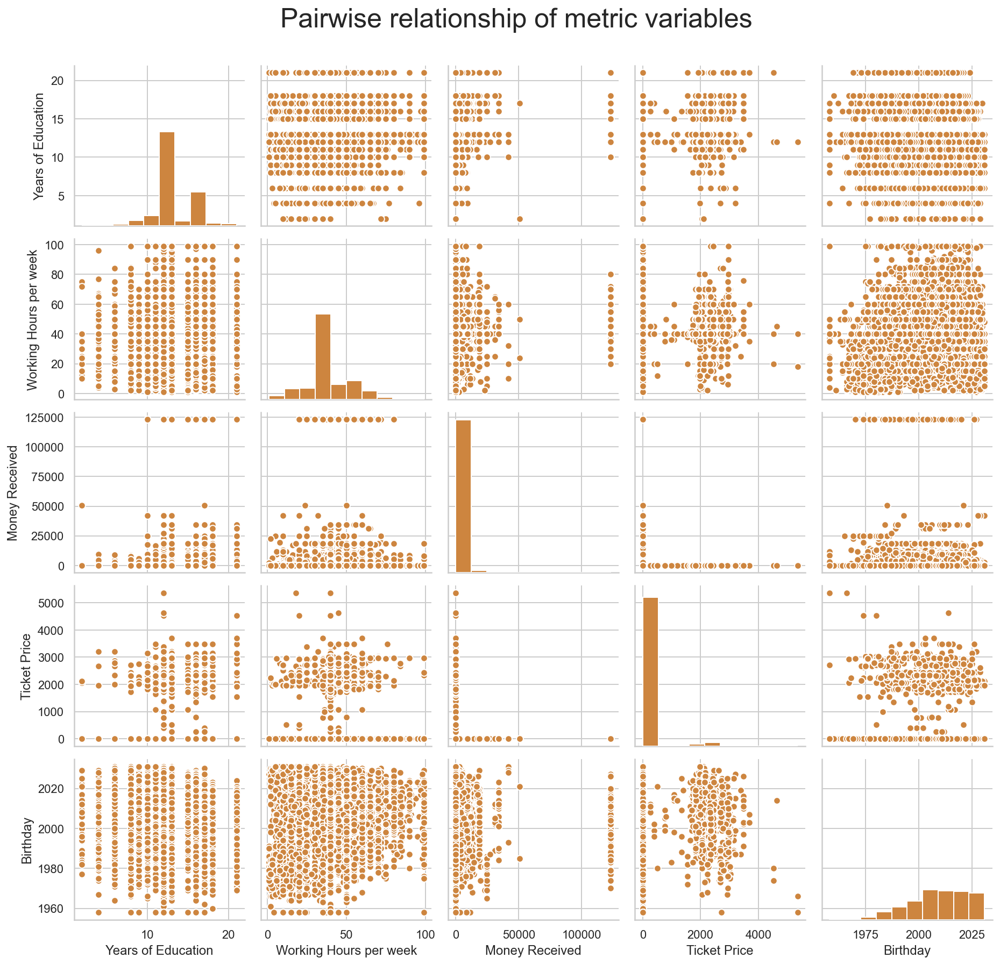

In [12]:
# Checking metrics variables' distribution and pairwise relationship
sns.set(style="whitegrid")

# Setting pairgrid
g = sns.PairGrid(metric)

# Populating pairgrid
mdg = g.map_diag(plt.hist, edgecolor="w", color="peru")
mog = g.map_offdiag(plt.scatter, edgecolor="w", color="peru", s=40)
    
# Layout
plt.subplots_adjust(top=0.92)
plt.suptitle("Pairwise relationship of metric variables", fontsize=25)

plt.show()

Text(0.5, 0.98, 'Distribution of non-metric variables')

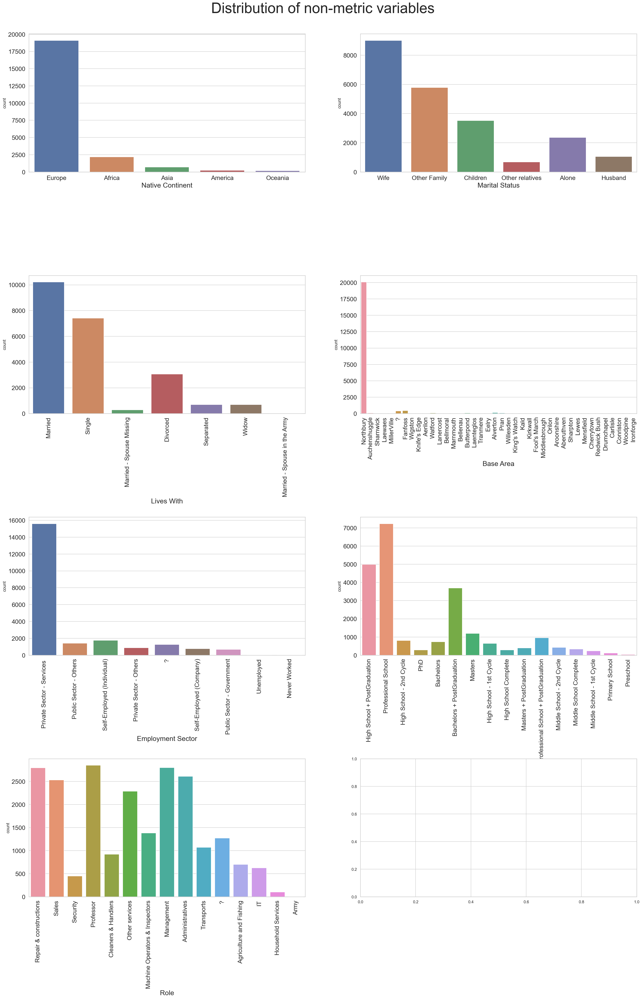

In [13]:
# Funciona
sns.set_style("whitegrid")
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(30,40))

ax1=sns.countplot(non_metric["Native Continent"], ax=axes[0,0])
ax2=sns.countplot(non_metric["Lives with"], ax=axes[0,1])
ax3=sns.countplot(non_metric["Marital Status"], ax=axes[1,0])
ax4=sns.countplot(non_metric["Base Area"], ax=axes[1,1])
ax5=sns.countplot(non_metric["Employment Sector"], ax=axes[2,0])
ax6=sns.countplot(non_metric["Education Level"], ax=axes[2,1])
ax7=sns.countplot(non_metric["Role"], ax=axes[3,0])
# ax8=sns.countplot(non_metric["Birthday"], ax=axes[3,1])

ax1.tick_params(labelsize=17)
ax1.set_xlabel(xlabel='Native Continent',fontsize = 19)

ax2.tick_params(labelsize=17)
ax2.set_xlabel(xlabel='Marital Status',fontsize = 19)

ax3.tick_params(labelsize=17)
ax3.set_xticklabels(ax3.get_xticklabels(), rotation=90)
ax3.set_xlabel(xlabel='Lives With',fontsize = 19)

ax4.tick_params(labelsize=17)
ax4.set_xticklabels(ax4.get_xticklabels(), rotation=90)
ax4.set_xlabel(xlabel='Base Area',fontsize = 19)

ax5.tick_params(labelsize=17)
ax5.set_xticklabels(ax5.get_xticklabels(), rotation=90)
ax5.set_xlabel(xlabel='Employment Sector',fontsize = 19)

ax6.tick_params(labelsize=17)
ax6.set_xticklabels(ax6.get_xticklabels(), rotation=90)
ax6.set_xlabel(xlabel='Education Level',fontsize = 19)

ax7.tick_params(labelsize=17)
ax7.set_xticklabels(ax7.get_xticklabels(), rotation=90)
ax7.set_xlabel(xlabel='Role',fontsize = 19)

# ax8.tick_params(labelsize=17)
# ax8.set_xticklabels(ax.get_xticklabels(), rotation=90)
# ax8.set_xlabel(xlabel='Birthday',fontsize = 19)

plt.subplots_adjust(top=0.95,hspace=0.75)
plt.suptitle("Distribution of non-metric variables", fontsize=40)

In [14]:
# Looking at the plots above, we can see the distribution of the values per category, for each categorical variables.
# With this, we see that there are 3 variables containing "?" as a value, which we understand are be null values
# So, here we are replacing those ? for null values, to analyze them more efficiently
df_train=df_train.replace('?', np.nan)

In [15]:
# Now we can already see how many missing values each variable has
df_train.isna().sum()

Name                         0
Birthday                     0
Native Continent             0
Marital Status               0
Lives with                   0
Base Area                  395
Education Level              0
Years of Education           0
Employment Sector         1264
Role                      1271
Working Hours per week       0
Money Received               0
Ticket Price                 0
dtype: int64

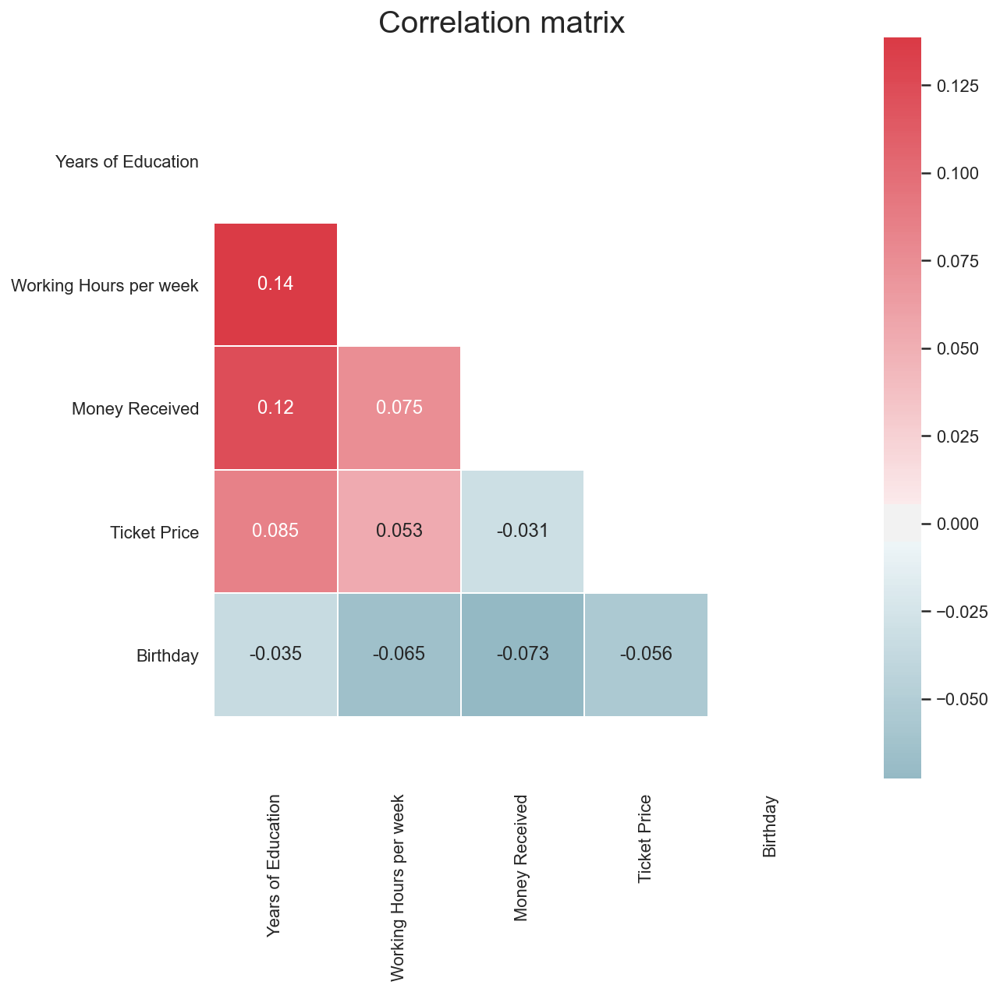

In [16]:
#inutil mas func
sns.set(style="white")

# Compute the correlation matrix
corr = metric.corr() #Getting correlation of numerical variables

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool) #Return an array of zeros (Falses) with the same shape and type as a given array
mask[np.triu_indices_from(mask)] = True #The upper-triangle array is now composed by True values

# Set up the matplotlib figure
fig, ax = plt.subplots(figsize=(12, 8))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True) #Make a diverging palette between two HUSL colors. Return a matplotlib colormap object.

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, center=0, square=True, linewidths=.5, ax=ax, annot=True)

# Layout
plt.subplots_adjust(top=0.95)
plt.suptitle("Correlation matrix", fontsize=20)
plt.yticks(rotation=0)
plt.xticks(rotation=90)
# Fixing the bug of partially cut-off bottom and top cells
b, t = plt.ylim() # discover the values for bottom and top
b += 0.5 # Add 0.5 to the bottom
t -= 0.5 # Subtract 0.5 from the top
plt.ylim(b, t) # update the ylim(bottom, top) values

plt.show()

In [17]:
pd.set_option('display.max_rows', 500)
df_train.groupby(["Base Area","Role"])["Role"].count()

Base Area      Role                          
Aberuthven     Administratives                      5
               Cleaners & Handlers                  3
               Household Services                   1
               IT                                   1
               Machine Operators & Inspectors       4
               Other services                       2
               Professor                            1
               Repair & constructions               4
               Sales                                2
Aerilon        Administratives                      2
               Agriculture and Fishing              1
               Cleaners & Handlers                  6
               Household Services                   1
               IT                                   2
               Machine Operators & Inspectors       6
               Management                           3
               Other services                       1
               Professor            

In [18]:
pd.crosstab(df_train['Marital Status'], df_train['Lives with'], margins=True)

Lives with,Alone,Children,Husband,Other Family,Other relatives,Wife,All
Marital Status,,,,,,,
Divorced,1113,227,0,1657,75,0,3072
Married,0,73,1042,12,85,9007,10219
Married - Spouse Missing,85,33,0,141,25,0,284
Married - Spouse in the Army,0,1,7,0,1,5,14
Separated,302,69,0,289,39,0,699
Single,607,3106,0,3281,422,0,7416
Widow,255,10,0,397,34,0,696
All,2362,3519,1049,5777,681,9012,22400


## Coherence Checks

In [19]:
# Check if there is anyone born after the year of this experiment (2048) 
len(df_train[(metric.Birthday>2048)])

0

In [20]:
# Check the oldest year of birth and most recent one
print(metric.Birthday.min(),metric.Birthday.max())

1958 2031


In [21]:
# Check if there are negative amounts of money
df_train[(df_train["Money Received"]<0)|(df_train["Ticket Price"]<0)]

,Name,Birthday,Native Continent,Marital Status,Lives with,Base Area,Education Level,Years of Education,Employment Sector,Role,Working Hours per week,Money Received,Ticket Price
CITIZEN_ID,,,,,,,,,,,,,


In [22]:
# Check if there is anyone who paid for the ticket and at the same time received money to join the experiment
df_train[(df_train["Ticket Price"]!=0) & (df_train["Money Received"]!=0)]

,Name,Birthday,Native Continent,Marital Status,Lives with,Base Area,Education Level,Years of Education,Employment Sector,Role,Working Hours per week,Money Received,Ticket Price
CITIZEN_ID,,,,,,,,,,,,,


In [23]:
# Check if there is anyone with a certain level of education and years of education that don't match at all
df_train.groupby(["Years of Education","Education Level"])["Years of Education"].mean()

Years of Education  Education Level                     
2                   Preschool                                2
4                   Primary School                           4
6                   Middle School - 1st Cycle                6
8                   Middle School - 2nd Cycle                8
9                   Middle School Complete                   9
10                  High School - 1st Cycle                 10
11                  High School - 2nd Cycle                 11
12                  High School Complete                    12
                    Professional School                     12
13                  High School + PostGraduation            13
                    Professional School + PostGraduation    13
15                  Bachelors                               15
16                  Bachelors + PostGraduation              16
17                  Masters                                 17
18                  Masters + PostGraduation                1

In [24]:
df_train['Education Level']=df_train['Education Level'].replace('Preschool', 'No Relevant Education')

In [25]:
df_train["Education Level"].unique()

array(['High School + PostGraduation', 'Professional School',
       'High School - 2nd Cycle', 'PhD', 'Bachelors',
       'Bachelors + PostGraduation', 'Masters', 'High School - 1st Cycle',
       'High School Complete', 'Masters + PostGraduation',
       'Professional School + PostGraduation',
       'Middle School - 2nd Cycle', 'Middle School Complete',
       'Middle School - 1st Cycle', 'Primary School',
       'No Relevant Education'], dtype=object)

In [26]:
df_train['Years of Education']=df_train['Years of Education'].replace(2, 0)

In [27]:
df_train["Years of Education"].unique()


array([13, 12, 11, 21, 15, 16, 17, 10, 18,  8,  9,  6,  4,  0],
      dtype=int64)

In [28]:
# Check if there is anyone whose marital status seems incoherent with the person he/she lives with someone
df_train.groupby(["Marital Status","Lives with"] )["Lives with"].count()

Marital Status                Lives with     
Divorced                      Alone              1113
                              Children            227
                              Other Family       1657
                              Other relatives      75
Married                       Children             73
                              Husband            1042
                              Other Family         12
                              Other relatives      85
                              Wife               9007
Married - Spouse Missing      Alone                85
                              Children             33
                              Other Family        141
                              Other relatives      25
Married - Spouse in the Army  Children              1
                              Husband               7
                              Other relatives       1
                              Wife                  5
Separated                     Alone 

In [29]:
ola=df_train.copy()
ola["age"]=2048-ola.Birthday.map(lambda x: x.year)
ola[ola.Birthday.map(lambda x: 2048-x.year)<(ola["Years of Education"]+5)]

,Name,Birthday,Native Continent,Marital Status,Lives with,Base Area,Education Level,Years of Education,Employment Sector,Role,Working Hours per week,Money Received,Ticket Price,age
CITIZEN_ID,,,,,,,,,,,,,,
14941,Miss Yvonne Henderson,2029-03-25,Africa,Single,Children,Lanercost,Bachelors + PostGraduation,16,NaN,NaN,40,0,0,19
16528,Miss Ava Glover,2028-07-15,Africa,Single,Other relatives,Northbury,Bachelors + PostGraduation,16,Private Sector - Services,Sales,30,0,0,20
24242,Miss Pippa Anderson,2024-02-01,Europe,Single,Other Family,Fool's March,PhD,21,Private Sector - Others,Professor,99,0,0,24
24843,Mr. Gavin Thomson,2028-09-13,Europe,Single,Children,Northbury,Masters,17,Private Sector - Services,Management,25,0,0,20
27833,Miss Sue Randall,2030-04-08,Europe,Single,Children,Northbury,Masters,17,Public Sector - Others,Professor,60,0,0,18
28849,Mr. Jonathan Oliver,2031-02-05,Europe,Single,Children,Northbury,High School + PostGraduation,13,Private Sector - Services,Administratives,20,0,0,17
33939,Mr. Isaac Alsop,2027-04-20,Europe,Single,Children,Northbury,Masters,17,Private Sector - Others,Transports,15,0,0,21


In [30]:
# Check if there is anyone with more years of education than his/her age
df_train[df_train.Birthday.map(lambda x: 2048-x.year)<(df_train["Years of Education"]+5)]

,Name,Birthday,Native Continent,Marital Status,Lives with,Base Area,Education Level,Years of Education,Employment Sector,Role,Working Hours per week,Money Received,Ticket Price
CITIZEN_ID,,,,,,,,,,,,,
14941,Miss Yvonne Henderson,2029-03-25,Africa,Single,Children,Lanercost,Bachelors + PostGraduation,16,NaN,NaN,40,0,0
16528,Miss Ava Glover,2028-07-15,Africa,Single,Other relatives,Northbury,Bachelors + PostGraduation,16,Private Sector - Services,Sales,30,0,0
24242,Miss Pippa Anderson,2024-02-01,Europe,Single,Other Family,Fool's March,PhD,21,Private Sector - Others,Professor,99,0,0
24843,Mr. Gavin Thomson,2028-09-13,Europe,Single,Children,Northbury,Masters,17,Private Sector - Services,Management,25,0,0
27833,Miss Sue Randall,2030-04-08,Europe,Single,Children,Northbury,Masters,17,Public Sector - Others,Professor,60,0,0
28849,Mr. Jonathan Oliver,2031-02-05,Europe,Single,Children,Northbury,High School + PostGraduation,13,Private Sector - Services,Administratives,20,0,0
33939,Mr. Isaac Alsop,2027-04-20,Europe,Single,Children,Northbury,Masters,17,Private Sector - Others,Transports,15,0,0


In [31]:
#unemployed citizens have Role and Working Hours different than 0
df_train[["Employment Sector", "Role", "Working Hours per week"]][df_train["Employment Sector"]=="Unemployed"]

,Employment Sector,Role,Working Hours per week
CITIZEN_ID,,,
12567,Unemployed,Cleaners & Handlers,40
15572,Unemployed,Agriculture and Fishing,10
16852,Unemployed,Transports,20
17274,Unemployed,Administratives,12
21062,Unemployed,Agriculture and Fishing,50
22741,Unemployed,Agriculture and Fishing,20
27493,Unemployed,Repair & constructions,40
29340,Unemployed,Agriculture and Fishing,65
33010,Unemployed,Other services,55


In [32]:
#Never worked citizens have Role and Working Hours different than 0
df_train[["Employment Sector", "Role", "Working Hours per week"]][df_train["Employment Sector"]=="Never Worked"]

,Employment Sector,Role,Working Hours per week
CITIZEN_ID,,,
13792,Never Worked,NaN,40
22674,Never Worked,NaN,30
23583,Never Worked,NaN,10
24701,Never Worked,NaN,40
27002,Never Worked,NaN,4
32390,Never Worked,NaN,40
33185,Never Worked,NaN,35


In [33]:
df_train["Working Hours per week"][(df_train["Employment Sector"]=="Unemployed") | (df_train["Employment Sector"]=="Never Worked")]=0

In [34]:
df_train["Role"][(df_train["Employment Sector"]=="Never Worked")]="No Role"

In [35]:
df_train[["Employment Sector", "Role", "Working Hours per week"]][(df_train["Employment Sector"]=="Unemployed") | (df_train["Employment Sector"]=="Never Worked")]

,Employment Sector,Role,Working Hours per week
CITIZEN_ID,,,
12567,Unemployed,Cleaners & Handlers,0
13792,Never Worked,No Role,0
15572,Unemployed,Agriculture and Fishing,0
16852,Unemployed,Transports,0
17274,Unemployed,Administratives,0
21062,Unemployed,Agriculture and Fishing,0
22674,Never Worked,No Role,0
22741,Unemployed,Agriculture and Fishing,0
23583,Never Worked,No Role,0


## Outliers

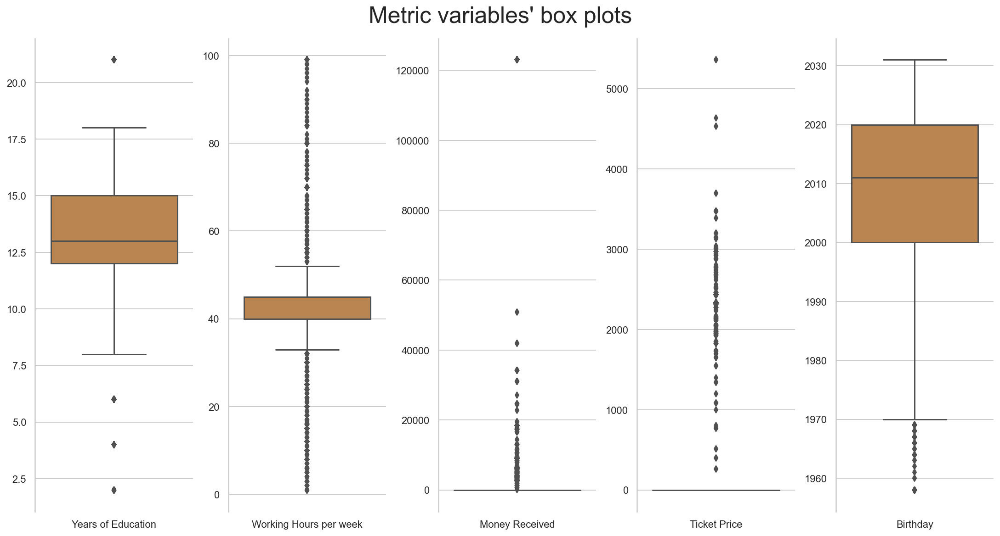

In [36]:
sns.set(style="whitegrid")

data = pd.melt(metric)
plot_features = metric.columns

#Prepare figure layout
fig, axes = plt.subplots(1, len(plot_features), figsize=(15,8), constrained_layout=True)
    
# Draw the boxplots
for i in zip(axes, plot_features):
    sns.boxplot(x="variable", y="value", data=data.loc[data["variable"]==i[1]], ax=i[0], color='peru')
    i[0].set_xlabel("")
    i[0].set_ylabel("")

# Finalize the plot
plt.suptitle("Metric variables' box plots", fontsize=25)
sns.despine(bottom=True)

plt.show()

In [37]:
#test
df_train[df_train["Money Received"]>120000] 

,Name,Birthday,Native Continent,Marital Status,Lives with,Base Area,Education Level,Years of Education,Employment Sector,Role,Working Hours per week,Money Received,Ticket Price
CITIZEN_ID,,,,,,,,,,,,,
12667,Mr. Alexander Duncan,1997-03-17,Oceania,Married,Wife,Sharnwick,Masters + PostGraduation,18,Self-Employed (Individual),Professor,70,122999,0
12839,Mr. Sam Black,1985-05-26,Europe,Married,Wife,Northbury,Professional School,12,Private Sector - Services,Repair & constructions,40,122999,0
13363,Mr. Jason Dickens,2009-01-20,Europe,Married,Wife,Northbury,Masters,17,Private Sector - Services,Professor,40,122999,0
13419,Mr. Harry Parr,1999-09-29,Europe,Married,Wife,Northbury,Masters,17,Private Sector - Others,Sales,80,122999,0
13445,Mr. Jacob Wilson,2008-06-28,Europe,Married,Wife,Northbury,Masters + PostGraduation,18,Self-Employed (Individual),Professor,70,122999,0
13557,Mr. Liam Abraham,1995-05-17,Europe,Married,Wife,Northbury,Professional School,12,Self-Employed (Company),Sales,40,122999,0
13759,Mrs. Lauren Morgan,2012-07-31,Africa,Married,Husband,Northbury,High School + PostGraduation,13,Private Sector - Services,Administratives,40,122999,0
13809,Mr. Jack Kerr,2008-05-23,Asia,Married,Wife,NaN,Masters + PostGraduation,18,Private Sector - Services,Professor,40,122999,0
14070,Mr. Joseph Buckland,1992-07-20,Europe,Married,Wife,Northbury,Masters + PostGraduation,18,Self-Employed (Company),Professor,40,122999,0


In [38]:
df_train["Working Hours per week"].describe()

count    22400.000000
mean        40.456696
std         12.414943
min          0.000000
25%         40.000000
50%         40.000000
75%         45.000000
max         99.000000
Name: Working Hours per week, dtype: float64

In [39]:
# Function to do outlier detection with the IQR method

def out_iqr(data, k=1.5, return_thresholds=False):
#some cutoff to multiply by the iqr
#return_thresholds - True returns the lower and upper bounds, good for plotting; False returns the masked array 

    # calculate interquartile range
    q25, q75 = np.percentile(data, 25, axis=0), np.percentile(data, 75, axis=0)
    iqr = q75 - q25
    
    # calculate the outlier cutoff
    cut_off = iqr * k
    lower, upper = q25 - cut_off, q75 + cut_off
    
    if return_thresholds:
        return lower, upper
    
    else: # identify outliers
        #return a boolean mask of outliers for a series using interquartile range
        return data.apply(lambda x: np.any((x<lower) | (x>upper)), 1)

In [40]:
outliers = out_iqr(df_train[['Money Received', 'Ticket Price']], 3.5)

In [41]:
outliers.value_counts()

False    19511
True      2889
dtype: int64

In [42]:
df_train[~outliers].max()

Name                                            Mrs. Zoe Young
Birthday                                   2031-10-11 00:00:00
Native Continent                                       Oceania
Marital Status                                           Widow
Lives with                                                Wife
Education Level           Professional School + PostGraduation
Years of Education                                          21
Working Hours per week                                      99
Money Received                                               0
Ticket Price                                                 0
dtype: object

In [43]:
# Removal of outliers by checking the boxplots
filters = (
    (df_train['Money Received']<120000)
    &
    (df_train['Ticket Price']<4000)
)

In [44]:
df_train_out=df_train[filters]
target_out=target[filters]

In [45]:
print(round((1-len(df_train_out)/len(df_train))*100,2),'% observations would be removed')

0.53 % observations would be removed


We decided not to eliminate outliers on "Money Received", since when observing the value that was more distant from the rest, we concluded that there were several people with that high value (122999), all having a relatively important role and high hours of work. 

Also, we do not consider relevant the amount itself of money received or payed, but instead, if the person received or payed to go. 

But we will still try this later on.

In [46]:
#number of citizens that have less than 7.5 years of education to conclude if they might be outliers
len(df_train[df_train["Years of Education"]<7.5])

392

In [47]:
# Test if the variable follows a normal distribution

# normality test
stat, p = shapiro(df_train["Working Hours per week"])
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
    print('Sample looks Gaussian (fail to reject H0)')
else:
    print('Sample does not look Gaussian (reject H0)')

Statistics=0.885, p=0.000
Sample does not look Gaussian (reject H0)


## Missing Values

#### 1st method - impute with the mode

In [48]:
df_train.isna().sum()

Name                         0
Birthday                     0
Native Continent             0
Marital Status               0
Lives with                   0
Base Area                  395
Education Level              0
Years of Education           0
Employment Sector         1264
Role                      1264
Working Hours per week       0
Money Received               0
Ticket Price                 0
dtype: int64

In [49]:
df_train1=df_train.copy()

In [50]:
modes = non_metric.mode().loc[0]
df_train1.fillna(modes, inplace=True)

#### 2nd method - imupte with the mode of categories in common

In [51]:
# understand if certain non-numeric variables are dependent or not from the ones with missing values

In [52]:
# Create a function that performs the Chi2 test for independence, to check for association between each variable with no missing
# values and each of the ones with missings

def check_association(col1,col2):
    # contingency table
    tab=pd.crosstab(df_train[col1], df_train[col2], margins=False).values
    stat, p, dof, expected = chi2_contingency(tab)

    # interpret test-statistic
    prob = 0.95
    critical = chi2.ppf(prob, dof)
    print('probability=%.3f, critical=%.3f, stat=%.3f' % (prob, critical, stat))
    
    if abs(stat) >= critical:
        print(col1,'and',col2,'are dependent (reject H0).')
    else:
        print(col1,'and',col2,'are independent (fail to reject H0).')
        
    # interpret p-value
    alpha = 1.0 - prob
    print('significance=%.3f, p=%.3f' % (alpha, p))
    
    if p <= alpha:
        print(col1,'and',col2,'are dependent (reject H0).\n')
    else:
        print(col1,'and',col2,'are independent (fail to reject H0).\n')

In [53]:
# FIRST: Marital Status

check_association('Marital Status','Base Area')
check_association('Marital Status','Employment Sector')
check_association('Marital Status','Role')

probability=0.950, critical=264.224, stat=707.714
Marital Status and Base Area are dependent (reject H0).
significance=0.050, p=0.000
Marital Status and Base Area are dependent (reject H0).

probability=0.950, critical=58.124, stat=798.754
Marital Status and Employment Sector are dependent (reject H0).
significance=0.050, p=0.000
Marital Status and Employment Sector are dependent (reject H0).

probability=0.950, critical=106.395, stat=2136.649
Marital Status and Role are dependent (reject H0).
significance=0.050, p=0.000
Marital Status and Role are dependent (reject H0).



In [54]:
# SECOND: Education Level

check_association('Education Level','Base Area')
check_association('Education Level','Employment Sector')
check_association('Education Level','Role')

probability=0.950, critical=626.650, stat=6057.678
Education Level and Base Area are dependent (reject H0).
significance=0.050, p=0.000
Education Level and Base Area are dependent (reject H0).

probability=0.950, critical=129.918, stat=1544.322
Education Level and Employment Sector are dependent (reject H0).
significance=0.050, p=0.000
Education Level and Employment Sector are dependent (reject H0).

probability=0.950, critical=244.808, stat=10712.853
Education Level and Role are dependent (reject H0).
significance=0.050, p=0.000
Education Level and Role are dependent (reject H0).



Seeing both of these variables are associated with the three variables with missing values, using the similarities between people in these categories, might be useful to discover their characteristics in the missing variables

In [55]:
# Copy the dataframe into another to apply the changes there before
df_train2=df_train.copy()

# Create a function to impute the missing values by the mode of the records belonging to the same classes of Marital Status and Education Level
def impute_mode_by_cat(df_train2, col):
    exp=df_train2[df_train2[col].isnull()].reset_index()
    gr=df_train2.groupby(["Education Level","Marital Status"])[col].agg(pd.Series.mode)
    
    # if there are null values in the group by, replace them by the overall mode of the orginal variable
    for i in range(len(gr)):
        if len(gr[i])==0:
            gr[i]=df_train2[col].mode()[0]


    # define the values of base area in the new auxiliary dataset as the mode of the base are values for the observations with the
    # same level of education and marital status, because at least to some extent, they are more similar than the others       
    for i in range(len(exp)):
        for x in range(len(gr)):
            if (exp['Education Level'][i]==gr.index[x][0]) and (exp['Marital Status'][i]==gr.index[x][1]):
                exp[col][i]=gr[x]
                
    # if it's bimodal (has more than one mode, keep only the first one provided)
    for i in range(len(exp)):
        if type(exp[col][i])!=str:
            exp[col][i]=df_train2[col].mode()[0]

    # finally, replace the null values in Base Area in the original dataset by the values acquired before
    for i in range(len(exp)):
        df_train2.loc[exp['CITIZEN_ID'][i],col]=exp[col][i]
        
    return df_train2

In [56]:
df_train2[df_train2['Base Area'].isnull()]

,Name,Birthday,Native Continent,Marital Status,Lives with,Base Area,Education Level,Years of Education,Employment Sector,Role,Working Hours per week,Money Received,Ticket Price
CITIZEN_ID,,,,,,,,,,,,,
12516,Mr. Jason Gray,2024-09-26,Africa,Single,Other Family,NaN,Bachelors,15,Private Sector - Services,Sales,40,0,0
12583,Mr. Joseph Avery,2008-09-06,Europe,Married,Wife,NaN,Bachelors + PostGraduation,16,Self-Employed (Company),Sales,40,0,0
12700,Mr. Colin Graham,2017-02-14,Europe,Single,Other relatives,NaN,Bachelors + PostGraduation,16,Public Sector - Others,Professor,40,0,0
12771,Mrs. Emma Gray,2005-02-22,Europe,Married - Spouse Missing,Other Family,NaN,PhD,21,Private Sector - Services,Professor,40,0,0
12845,Mr. Alexander Rampling,2022-02-28,Africa,Single,Other Family,NaN,Bachelors + PostGraduation,16,Private Sector - Services,Management,50,0,0
12875,Mr. Owen Scott,2027-07-20,Europe,Single,Children,NaN,High School + PostGraduation,13,Private Sector - Services,Machine Operators & Inspectors,40,0,0
12891,Mr. Anthony McDonald,2020-10-06,Europe,Single,Other Family,NaN,High School - 2nd Cycle,11,Private Sector - Services,Repair & constructions,40,0,0
12895,Mrs. Bella Hemmings,1991-05-07,Europe,Widow,Alone,NaN,Professional School,12,Private Sector - Services,Other services,30,0,0
12956,Mr. William Wilson,2004-05-20,Europe,Married,Wife,NaN,Professional School,12,Self-Employed (Company),Transports,60,0,0


In [57]:
df_train2=impute_mode_by_cat(df_train2,'Base Area')

In [58]:
df_train2[df_train2['Employment Sector'].isnull()]

,Name,Birthday,Native Continent,Marital Status,Lives with,Base Area,Education Level,Years of Education,Employment Sector,Role,Working Hours per week,Money Received,Ticket Price
CITIZEN_ID,,,,,,,,,,,,,
12508,Miss Gabrielle Cameron,2028-02-09,Europe,Single,Other relatives,Northbury,Professional School,12,NaN,NaN,35,0,0
12511,Miss Amy Churchill,2029-02-10,Europe,Single,Children,Northbury,High School + PostGraduation,13,NaN,NaN,40,0,0
12523,Mr. William Sanderson,1997-10-08,Europe,Married,Wife,Northbury,Masters,17,NaN,NaN,40,0,0
12529,Miss Deirdre Lyman,2018-03-28,Asia,Single,Other Family,Knife's Edge,Bachelors + PostGraduation,16,NaN,NaN,50,0,0
12530,Mrs. Carolyn Tucker,1976-02-03,Europe,Widow,Other Family,Northbury,High School - 2nd Cycle,11,NaN,NaN,24,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
34795,Mr. Luke Smith,1985-03-05,Europe,Married,Wife,Northbury,Professional School,12,NaN,NaN,20,0,0
34814,Mr. Stewart Newman,1990-01-23,America,Married - Spouse Missing,Alone,Northbury,Primary School,4,NaN,NaN,40,0,0
34823,Mr. Jonathan Slater,2006-05-27,Europe,Married,Wife,Northbury,High School + PostGraduation,13,NaN,NaN,60,0,0


In [59]:
df_train2=impute_mode_by_cat(df_train2,'Employment Sector')

In [60]:
df_train2[df_train2['Role'].isnull()]

,Name,Birthday,Native Continent,Marital Status,Lives with,Base Area,Education Level,Years of Education,Employment Sector,Role,Working Hours per week,Money Received,Ticket Price
CITIZEN_ID,,,,,,,,,,,,,
12508,Miss Gabrielle Cameron,2028-02-09,Europe,Single,Other relatives,Northbury,Professional School,12,Private Sector - Services,NaN,35,0,0
12511,Miss Amy Churchill,2029-02-10,Europe,Single,Children,Northbury,High School + PostGraduation,13,Private Sector - Services,NaN,40,0,0
12523,Mr. William Sanderson,1997-10-08,Europe,Married,Wife,Northbury,Masters,17,Private Sector - Services,NaN,40,0,0
12529,Miss Deirdre Lyman,2018-03-28,Asia,Single,Other Family,Knife's Edge,Bachelors + PostGraduation,16,Private Sector - Services,NaN,50,0,0
12530,Mrs. Carolyn Tucker,1976-02-03,Europe,Widow,Other Family,Northbury,High School - 2nd Cycle,11,Private Sector - Services,NaN,24,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
34795,Mr. Luke Smith,1985-03-05,Europe,Married,Wife,Northbury,Professional School,12,Private Sector - Services,NaN,20,0,0
34814,Mr. Stewart Newman,1990-01-23,America,Married - Spouse Missing,Alone,Northbury,Primary School,4,Private Sector - Services,NaN,40,0,0
34823,Mr. Jonathan Slater,2006-05-27,Europe,Married,Wife,Northbury,High School + PostGraduation,13,Private Sector - Services,NaN,60,0,0


In [61]:
df_train2=impute_mode_by_cat(df_train2,'Role')

In [62]:
df_train2.isna().sum()

Name                      0
Birthday                  0
Native Continent          0
Marital Status            0
Lives with                0
Base Area                 0
Education Level           0
Years of Education        0
Employment Sector         0
Role                      0
Working Hours per week    0
Money Received            0
Ticket Price              0
dtype: int64

Text(0.5, 0.98, 'Distribution of variables with and without missing values')

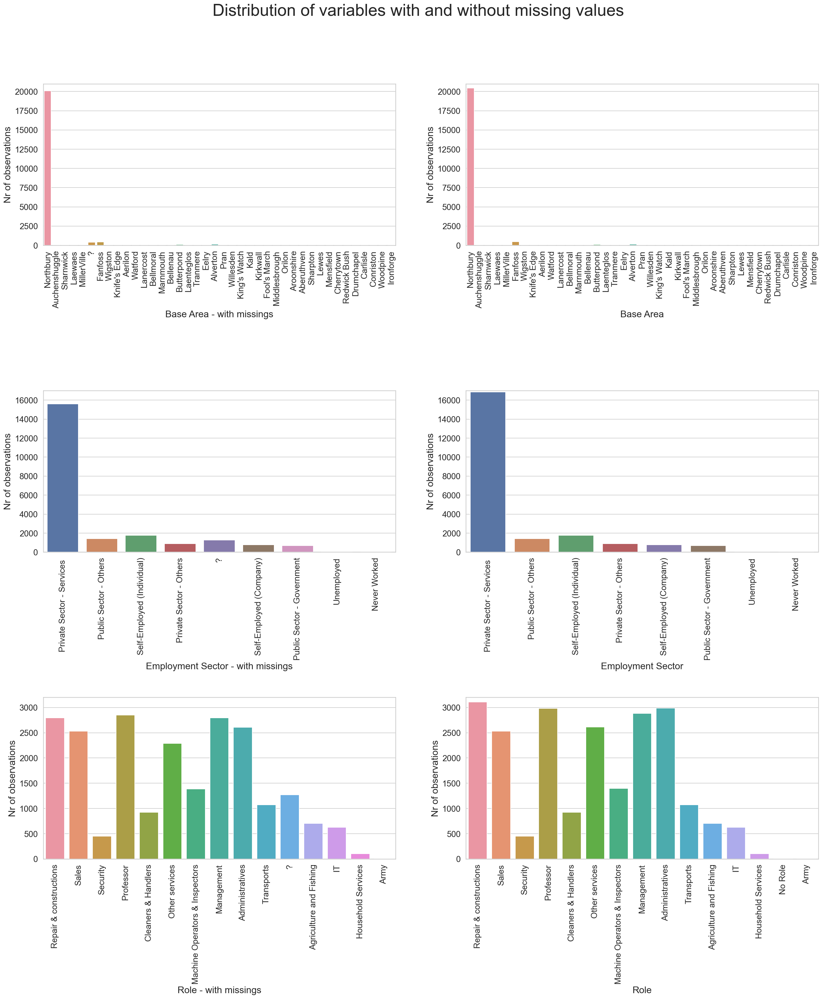

In [63]:
# Funciona
sns.set_style("whitegrid")
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(25,25))


axa=sns.countplot(df_train2["Base Area"], ax=axes[0,1])
axb=sns.countplot(df_train2["Employment Sector"], ax=axes[1,1])
axc=sns.countplot(df_train2["Role"], ax=axes[2,1])

ax4=sns.countplot(non_metric["Base Area"], ax=axes[0,0])
ax5=sns.countplot(non_metric["Employment Sector"], ax=axes[1,0])
ax7=sns.countplot(non_metric["Role"], ax=axes[2, 0])


axa.tick_params(labelsize=15)
axa.set_xticklabels(axa.get_xticklabels(), rotation=90)
axa.set_xlabel(xlabel='Base Area',fontsize = 17)
axa.set_ylabel(ylabel='Nr of observations',fontsize = 17)
axa.set(ylim=(0, 21000))

ax4.tick_params(labelsize=15)
ax4.set_xticklabels(ax4.get_xticklabels(), rotation=90)
ax4.set_xlabel(xlabel='Base Area - with missings',fontsize = 17)
ax4.set_ylabel(ylabel='Nr of observations',fontsize = 17)
ax4.set(ylim=(0, 21000))

axb.tick_params(labelsize=15)
axb.set_xticklabels(axb.get_xticklabels(), rotation=90)
axb.set_xlabel(xlabel='Employment Sector',fontsize = 17)
axb.set_ylabel(ylabel='Nr of observations',fontsize = 17)
axb.set(ylim=(0, 17000))

ax5.tick_params(labelsize=15)
ax5.set_xticklabels(ax5.get_xticklabels(), rotation=90)
ax5.set_xlabel(xlabel='Employment Sector - with missings',fontsize = 17)
ax5.set_ylabel(ylabel='Nr of observations',fontsize = 17)
ax5.set(ylim=(0, 17000))

axc.tick_params(labelsize=15)
axc.set_xticklabels(axc.get_xticklabels(), rotation=90)
axc.set_xlabel(xlabel='Role',fontsize = 17)
axc.set_ylabel(ylabel='Nr of observations',fontsize = 17)
axc.set(ylim=(0, 3200))

ax7.tick_params(labelsize=15)
ax7.set_xticklabels(ax7.get_xticklabels(), rotation=90)
ax7.set_xlabel(xlabel='Role - with missings',fontsize = 17)
ax7.set_ylabel(ylabel='Nr of observations',fontsize = 17)
ax7.set(ylim=(0, 3200))

plt.subplots_adjust(top=0.9,hspace=0.9)
plt.suptitle("Distribution of variables with and without missing values", fontsize=30)

## Feature Engineering

In [64]:
# New variable for Age
df_train2["Age"]=df_train2.Birthday.map(lambda x: datetime.now().year+28-x.year)

# Same for test
df_test["Age"]=df_test.Birthday.map(lambda x: datetime.now().year+28-x.year)

In [65]:
df_train2[["Birthday","Age"]]

,Birthday,Age
CITIZEN_ID,,
12486,2003-07-01,45
12487,2006-01-25,42
12488,2009-05-10,39
12489,1985-03-25,63
12490,2015-05-29,33
...,...,...
34881,2023-03-15,25
34882,2025-03-07,23
34883,2022-07-20,26


In [66]:
# New variable for Gender - binary if it's a male or not
df_train2['Male'] = np.where(df_train2.Name.str.contains('Mrs|Miss'), '0', '1')

# Same for test set
df_test['Male'] = np.where(df_test.Name.str.contains('Mrs|Miss'), '0', '1')

In [67]:
# Check the values for variable Marital Status
df_train2["Marital Status"].unique()

array(['Married', 'Single', 'Married - Spouse Missing', 'Divorced',
       'Separated', 'Widow', 'Married - Spouse in the Army'], dtype=object)

In [68]:
#In column Marital Status, join "Married" with 'Married - Spouse Missing' and 'Married - Spouse in the Army' since we do not consider this distintion relevant
df_train2["Marital Status_new"]=df_train2["Marital Status"]
df_train2["Marital Status_new"][(df_train2["Marital Status"].str.contains("Married")==True) & (df_train2["Marital Status"]!="Married")]="Married"

#In column Marital Status, join "Divorced" with 'Separated' in "Divorced or Separated"
df_train2["Marital Status_new"][(df_train2["Marital Status"]=="Separated") | (df_train2["Marital Status"]=="Divorced")]="Divorced or Separated"



# Same for test set

df_test["Marital Status_new"]=df_test["Marital Status"]
df_test["Marital Status_new"][(df_test["Marital Status"].str.contains("Married")==True) & (df_test["Marital Status"]!="Married")]="Married"
df_test["Marital Status_new"][(df_test["Marital Status"]=="Separated") | (df_test["Marital Status"]=="Divorced")]="Divorced or Separated"

In [69]:
df_train2["Marital Status_new"].unique()

array(['Married', 'Single', 'Divorced or Separated', 'Widow'],
      dtype=object)

In [70]:
# Check the values for variable Education Level
df_train2["Education Level"].unique()

array(['High School + PostGraduation', 'Professional School',
       'High School - 2nd Cycle', 'PhD', 'Bachelors',
       'Bachelors + PostGraduation', 'Masters', 'High School - 1st Cycle',
       'High School Complete', 'Masters + PostGraduation',
       'Professional School + PostGraduation',
       'Middle School - 2nd Cycle', 'Middle School Complete',
       'Middle School - 1st Cycle', 'Primary School',
       'No Relevant Education'], dtype=object)

In [71]:
#In column Education Level, join all equal periods of education level

df_train2["Education Level_new"]=df_train2["Education Level"]

df_train2["Education Level_new"][(df_train2["Education Level"]=="Middle School - 1st Cycle") |
                    (df_train2["Education Level"]=="Middle School - 2nd Cycle")|
                    (df_train2["Education Level"]=="Middle School Complete")]="Middle School"

df_train2["Education Level_new"][(df_train2["Education Level"]=="High School - 1st Cycle") | 
                    (df_train2["Education Level"]=="High School - 2nd Cycle") | 
                    (df_train2["Education Level"]=="High School Complete") | (df_train2["Education Level"]=="High School + PostGraduation")]="High School"

df_train2["Education Level_new"][(df_train2["Education Level"]=="Bachelors + PostGraduation")]="Bachelors"
df_train2["Education Level_new"][(df_train2["Education Level"]=="Professional School + PostGraduation")]="Professional School"
df_train2["Education Level_new"][(df_train2["Education Level"]=="Masters + PostGraduation")]="Masters"

# Same for test set

df_test["Education Level_new"]=df_test["Education Level"]

df_test["Education Level_new"][(df_test["Education Level"]=="Middle School - 1st Cycle") |
                    (df_test["Education Level"]=="Middle School - 2nd Cycle")|
                    (df_test["Education Level"]=="Middle School Complete")]="Middle School"

df_test["Education Level_new"][(df_test["Education Level"]=="High School - 1st Cycle") | 
                    (df_test["Education Level"]=="High School - 2nd Cycle") | 
                    (df_test["Education Level"]=="High School Complete") | (df_test["Education Level"]=="High School + PostGraduation")]="High School"

df_test["Education Level_new"][(df_test["Education Level"]=="Bachelors + PostGraduation")]="Bachelors"
df_test["Education Level_new"][(df_test["Education Level"]=="Professional School + PostGraduation")]="Professional School"
df_test["Education Level_new"][(df_test["Education Level"]=="Masters + PostGraduation")]="Masters"

In [72]:
df_train2["Education Level_new"].unique()

array(['High School', 'Professional School', 'PhD', 'Bachelors',
       'Masters', 'Middle School', 'Primary School',
       'No Relevant Education'], dtype=object)

In [73]:
df_train2["Years of Education"][df_train2["Education Level_new"]=='High School']

CITIZEN_ID
12486    13
12489    11
12493    11
12494    13
12497    13
         ..
34857    12
34858    10
34865    11
34879    13
34885    13
Name: Years of Education, Length: 6739, dtype: int64

In [74]:
#Binary that says if the citizen has Post Graduation or not

df_train2["PostGraduation"]=df_train2["Education Level"].map(lambda x: '1' if "+" in x else '0')

# Same for test set
df_test["PostGraduation"]=df_test["Education Level"].map(lambda x: '1' if "+" in x else '0')

In [75]:
# New binary variable related to Higher Education
# (includes at least one of the following: Post Graduation, Bachelors, Masters, PhD)

df_train2['Higher Education']=np.where(df_train2['Years of Education']>12, '1', '0')

#Same for test set
df_test['Higher Education']=np.where(df_test['Years of Education']>12, '1', '0')

In [76]:
# New binary variable that tells us if each person lives in the capital city or not
df_train2['Capital']= np.where(df_train2['Base Area']=='Northbury', '1', '0')

# Same for test set
df_test['Capital']= np.where(df_test['Base Area']=='Northbury', '1', '0')

In [77]:
# New binary variable to determine whether the person belongs to Group B (people who were payed to participate in the mission)
df_train2['Group B']=np.where(df_train2['Money Received']!=0, '1', '0')

# Same for test set
df_test['Group B']=np.where(df_test['Money Received']!=0, '1', '0')

In [78]:
# New binary variable to determine whether the person belongs to Group C (people who payed to participate in the mission)
df_train2['Group C']=np.where(df_train2['Ticket Price']!=0, '1', '0')

# Same for test set
df_test['Group C']=np.where(df_test['Ticket Price']!=0, '1', '0')

In [79]:
df_train2.head()

,Name,Birthday,Native Continent,Marital Status,Lives with,Base Area,Education Level,Years of Education,Employment Sector,Role,...,Ticket Price,Age,Male,Marital Status_new,Education Level_new,PostGraduation,Higher Education,Capital,Group B,Group C
CITIZEN_ID,,,,,,,,,,,,,,,,,,,,,
12486,Mr. Adam Glover,2003-07-01,Europe,Married,Wife,Northbury,High School + PostGraduation,13,Private Sector - Services,Repair & constructions,...,2273,45,1,Married,High School,1,1,1,0,1
12487,Mr. Cameron McDonald,2006-01-25,Europe,Married,Wife,Northbury,Professional School,12,Public Sector - Others,Repair & constructions,...,0,42,1,Married,Professional School,0,0,1,0,0
12488,Mr. Keith Davidson,2009-05-10,Europe,Married,Wife,Northbury,Professional School,12,Private Sector - Services,Sales,...,2321,39,1,Married,Professional School,0,0,1,0,1
12489,Mr. Alexander Gill,1985-03-25,Europe,Married,Wife,Northbury,High School - 2nd Cycle,11,Private Sector - Services,Security,...,0,63,1,Married,High School,0,0,1,1,0
12490,Mr. Neil Piper,2015-05-29,Europe,Single,Other Family,Northbury,PhD,21,Self-Employed (Individual),Professor,...,0,33,1,Single,PhD,0,1,1,0,0


In [80]:
# publico ou privado ou self ou uneployed empl. sector
def sectors(a):
    if 'Private Sector' in a:
        return 'Private Sector'
    elif 'Public Sector' in a:
        return 'Public Sector'
    #we don't join the Self-Employeds bc the 'Company' ones have much more 1s on the target than the 'Individual'
    elif 'Self-Employed (Individual)' in a:
        return a
    elif 'Self-Employed (Company)' in a:
        return a
    else:
        return 'Unemployed / Never Worked'
    
df_train2['Employment Sector (simplified)'] = df_train2['Employment Sector'].map(sectors)

# same for test set
df_test['Employment Sector (simplified)'] = df_test['Employment Sector'].map(sectors)

In [81]:
# binaria governo ou n empl. sector
df_train2['Government'] = df_train2['Employment Sector'].map(lambda x: '1' if 'Government' in x else '0')

# Same for test set
df_test['Government'] = df_test['Employment Sector'].map(lambda x: '1' if 'Government' in x else '0')

In [82]:
df_train2.columns

Index(['Name', 'Birthday', 'Native Continent', 'Marital Status', 'Lives with',
       'Base Area', 'Education Level', 'Years of Education',
       'Employment Sector', 'Role', 'Working Hours per week', 'Money Received',
       'Ticket Price', 'Age', 'Male', 'Marital Status_new',
       'Education Level_new', 'PostGraduation', 'Higher Education', 'Capital',
       'Group B', 'Group C', 'Employment Sector (simplified)', 'Government'],
      dtype='object')

In [83]:
Median_Money_Received=df_train2["Money Received"][df_train2["Money Received"]>0].median()
Median_Ticket_Price=df_train2["Ticket Price"][df_train2["Ticket Price"]>0].median()

df_train2['Money Relevance']='0'
df_train2['Money Relevance'][df_train2["Money Received"]> Median_Money_Received] ='1'
df_train2['Money Relevance'][(df_train2["Money Received"]<= Median_Money_Received) & (df_train2["Money Received"]>0)]='2'
df_train2['Money Relevance'][df_train2["Ticket Price"]> Median_Ticket_Price] ='5'
df_train2['Money Relevance'][(df_train2["Ticket Price"]<= Median_Ticket_Price) & (df_train2["Ticket Price"]>0)] ='4'
df_train2['Money Relevance'][(df_train2["Ticket Price"]== 0) & (df_train2["Money Received"]==0)] ='3'


# Same for test set
Median_Money_Received=df_test["Money Received"][df_test["Money Received"]>0].median()
Median_Ticket_Price=df_test["Ticket Price"][df_test["Ticket Price"]>0].median()

df_test['Money Relevance']='0'
df_test['Money Relevance'][df_test["Money Received"]> Median_Money_Received] ='1'
df_test['Money Relevance'][(df_test["Money Received"]<= Median_Money_Received) & (df_test["Money Received"]>0)]='2'
df_test['Money Relevance'][df_test["Ticket Price"]> Median_Ticket_Price] ='5'
df_test['Money Relevance'][(df_test["Ticket Price"]<= Median_Ticket_Price) & (df_test["Ticket Price"]>0)] ='4'
df_test['Money Relevance'][(df_test["Ticket Price"]== 0) & (df_test["Money Received"]==0)] ='3'

In [84]:
df_train2[["Ticket Price", "Money Received", "Money Relevance"]]

,Ticket Price,Money Received,Money Relevance
CITIZEN_ID,,,
12486,2273,0,4
12487,0,0,3
12488,2321,0,4
12489,0,5395,2
12490,0,0,3
...,...,...,...
34881,0,0,3
34882,0,0,3
34883,0,2674,2


In [85]:
#interaction between these two: working more hours, has more impact on income with more year of education?
df_train2["Working hours * Years of Education"] = df_train2["Working Hours per week"] * df_train2["Years of Education"]

# Same for test set
df_test["Working hours * Years of Education"] = df_test["Working Hours per week"] * df_test["Years of Education"]

In [86]:
#Money received per year of education
df_train2['Money / YE']=0
df_train2['Money / YE'][df_train2["Years of Education"]!=0]=round(df_train2["Money Received"] / df_train2["Years of Education"], 2)

# Same for test set
df_test['Money / YE']=0
df_test['Money / YE'][df_test["Years of Education"]!=0]=round(df_test["Money Received"] / df_test["Years of Education"], 2)

In [87]:
import math
df_train2['Log 10 of Money Received']=df_train2['Money Received'].map(lambda x: math.log10(x) if x!=0 else 0)
df_train2['Log 10 of Ticket Price']=df_train2['Ticket Price'].map(lambda x: math.log10(x) if x!=0 else 0)

# Same for test set
df_test['Log 10 of Money Received']=df_test['Money Received'].map(lambda x: math.log10(x) if x!=0 else 0)
df_test['Log 10 of Ticket Price']=df_test['Ticket Price'].map(lambda x: math.log10(x) if x!=0 else 0)

## Feature Selection

### For categorical variables (common to all approaches)

In [88]:
#not useful vars
initial_categorical_vars = df_train2.loc[:, np.array(df_train2.dtypes=="object")]
initial_categorical_vars.drop(columns='Name', inplace=True)

# Same for test
initial_categorical_vars_test = df_test.loc[:, np.array(df_test.dtypes=="object")]
initial_categorical_vars_test.drop(columns='Name', inplace=True)

initial_categorical_vars.head()

,Native Continent,Marital Status,Lives with,Base Area,Education Level,Employment Sector,Role,Male,Marital Status_new,Education Level_new,PostGraduation,Higher Education,Capital,Group B,Group C,Employment Sector (simplified),Government,Money Relevance
CITIZEN_ID,,,,,,,,,,,,,,,,,,
12486,Europe,Married,Wife,Northbury,High School + PostGraduation,Private Sector - Services,Repair & constructions,1,Married,High School,1,1,1,0,1,Private Sector,0,4
12487,Europe,Married,Wife,Northbury,Professional School,Public Sector - Others,Repair & constructions,1,Married,Professional School,0,0,1,0,0,Public Sector,0,3
12488,Europe,Married,Wife,Northbury,Professional School,Private Sector - Services,Sales,1,Married,Professional School,0,0,1,0,1,Private Sector,0,4
12489,Europe,Married,Wife,Northbury,High School - 2nd Cycle,Private Sector - Services,Security,1,Married,High School,0,0,1,1,0,Private Sector,0,2
12490,Europe,Single,Other Family,Northbury,PhD,Self-Employed (Individual),Professor,1,Single,PhD,0,1,1,0,0,Self-Employed (Individual),0,3


In [89]:
def bar_charts_categorical(df, feature, dep_var):
    cont_tab = pd.crosstab(df[feature], dep_var, margins = True)
    categories = cont_tab.index[:-1]
        
    fig = plt.figure(figsize=(15, 5))
    
    plt.subplot(121)
    p1 = plt.bar(categories, cont_tab.iloc[:-1, 0].values, 0.55, color="peru")
    p2 = plt.bar(categories, cont_tab.iloc[:-1, 1].values, 0.55, bottom=cont_tab.iloc[:-1, 0], color="b")
    plt.legend((p2[0], p1[0]), ('$y_i=1$', '$y_i=0$'))
    plt.title("Frequency bar chart")
    plt.xlabel(feature)
    plt.ylabel("$Frequency$")
    #mantemos assim com os 90 graus? ou doutra forma?
    plt.xticks(rotation=90)

    # auxiliary data for 122
    obs_pct = np.array([np.divide(cont_tab.iloc[:-1, 0].values, cont_tab.iloc[:-1, 2].values), 
                        np.divide(cont_tab.iloc[:-1, 1].values, cont_tab.iloc[:-1, 2].values)])
      
    plt.subplot(122)
    p1 = plt.bar(categories, obs_pct[0], 0.55, color="peru")
    p2 = plt.bar(categories, obs_pct[1], 0.55, bottom=obs_pct[0], color="b")
    plt.legend((p2[0], p1[0]), ('$y_i=1$', '$y_i=0$'))
    plt.title("Proportion bar chart")
    plt.xlabel(feature)
    plt.ylabel("$p$")
    #de novo, mantemos assim com os 90 graus? ou doutra forma?
    plt.xticks(rotation=90)

    plt.show()

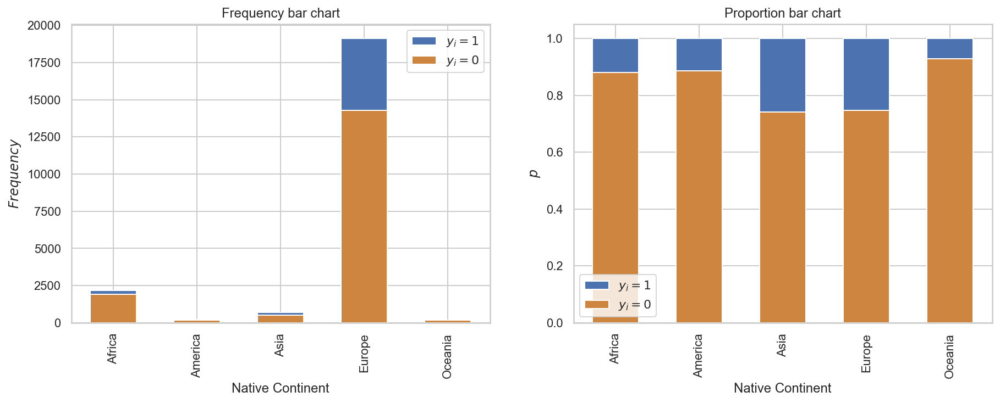

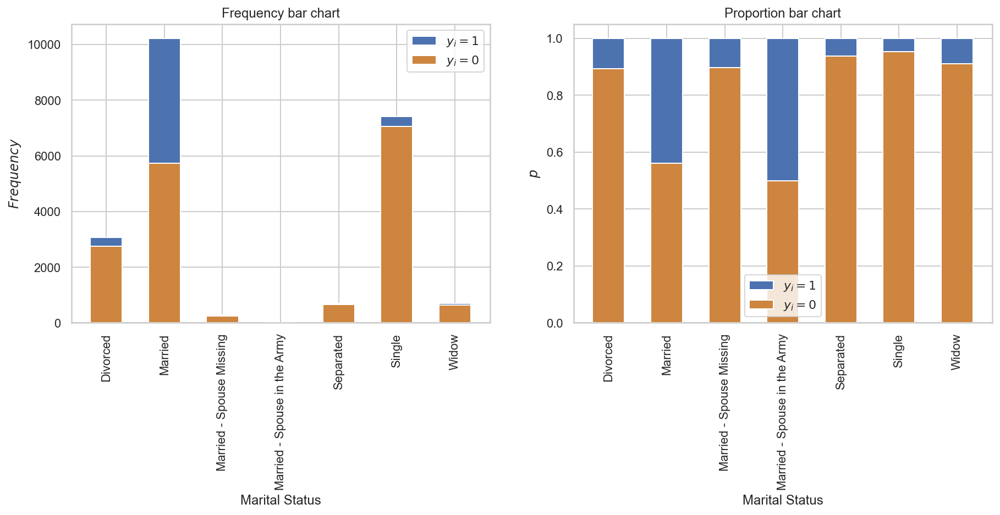

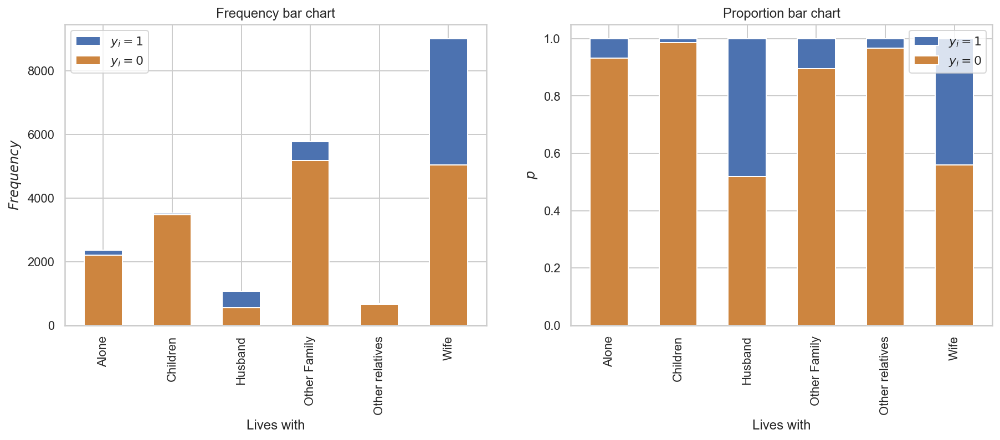

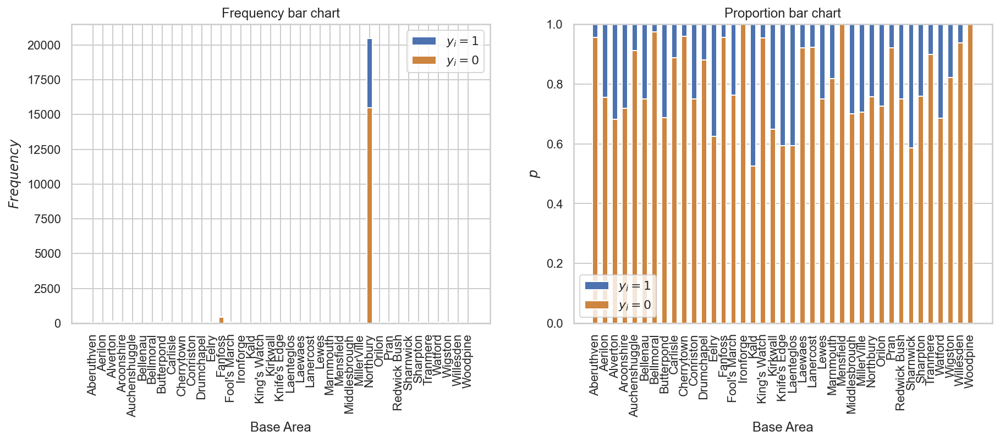

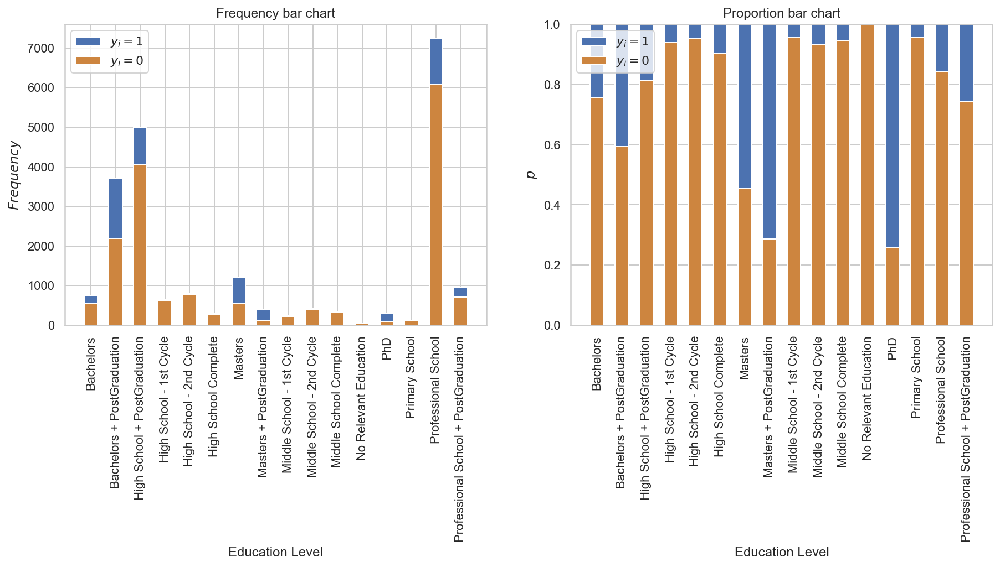

...

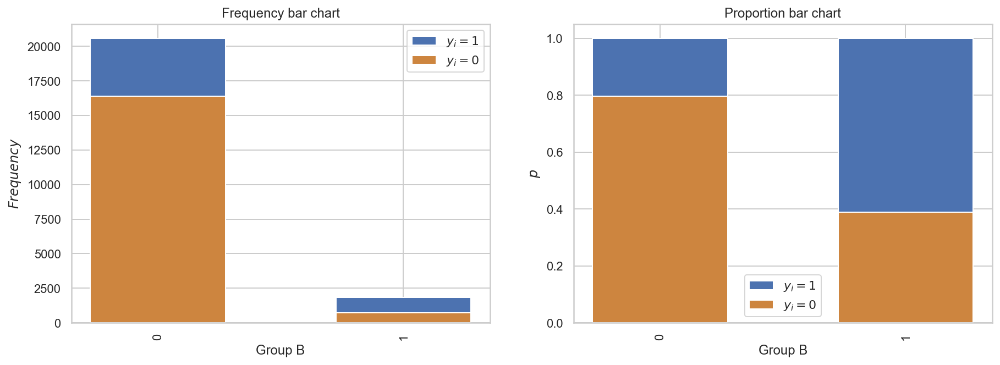

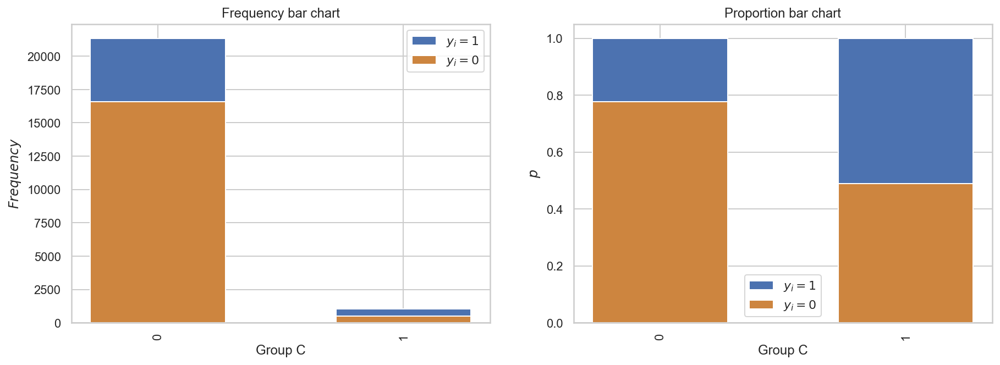

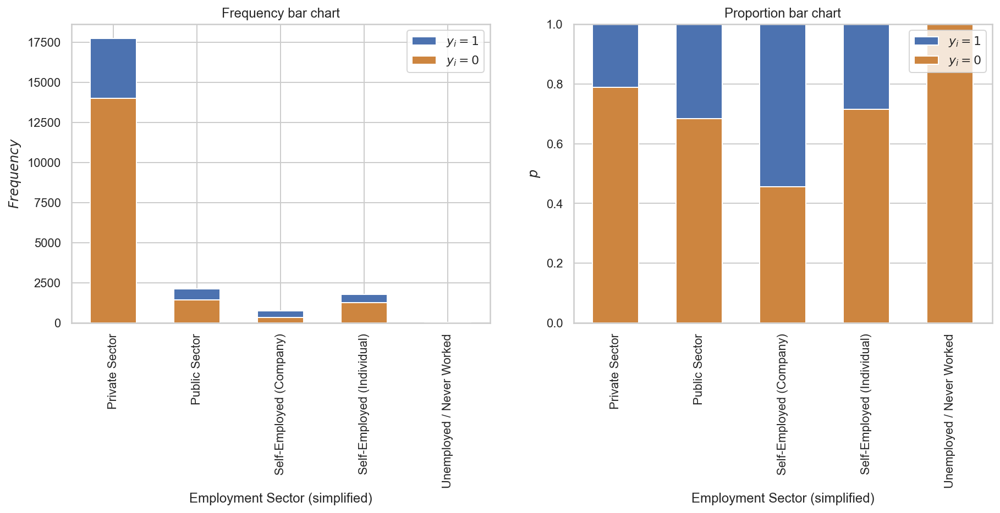

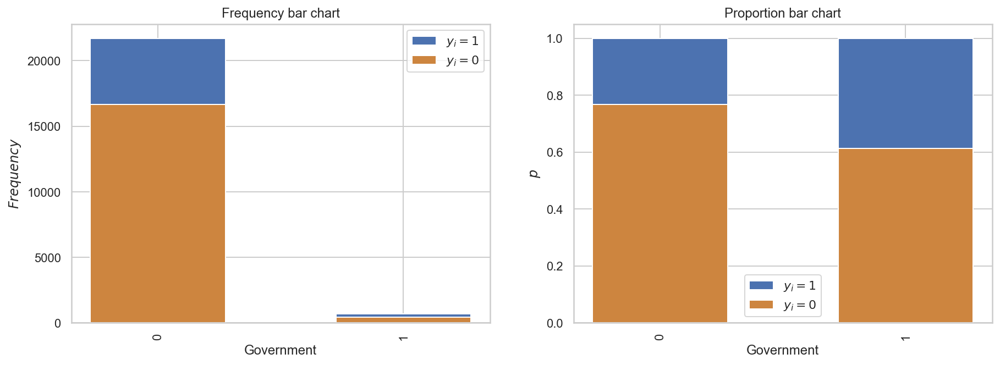

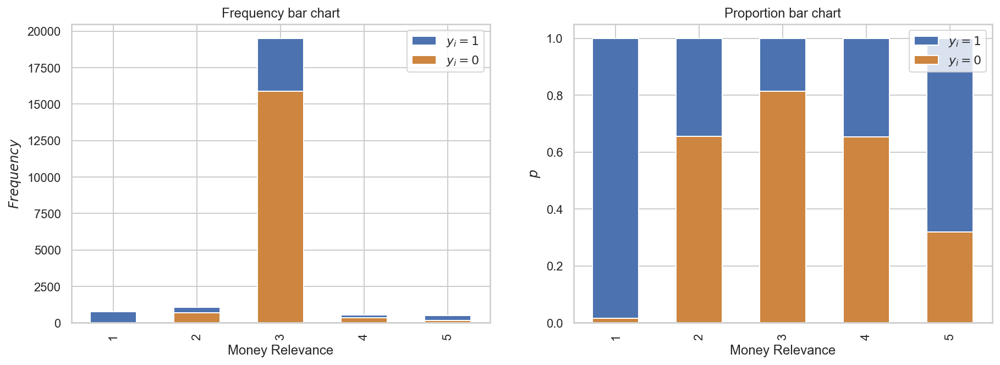

In [90]:
initial_categorical_features = initial_categorical_vars.columns

for i in initial_categorical_features:
    bar_charts_categorical(initial_categorical_vars, i, target)

In [91]:
#por exemplo nas variáveis da Education Level, do Marital Status e assim, há variáveis que são demasiado redundantes entre
#elas, por isso temos de escolher só uma (aquela que distingue melhor os 0s e 1s?)

#as melhores variáveis categ. parecem ser:
#uma das que são do Marital Status
#Lives With é boa, mas parece redudante com as de Marital Status (pq as pessoas que moram com o marido ou a mulher é q tão com 1s) -> mantemos o marital status
#Base Area? fica? por agora não...
#uma das que são do Education Level (a última?)
#uma das que são do Employment Sector?
#Male
#Group B e C!
#Money Relevance

In [92]:
#Binary features that will be droped:
# Base Area
# Lives with

#All these vars will be dropped bc they are too redundant with others:
# Marital Status
# Is Married
# Education Level
# PostGraduation
# Education Level_new
# Employment Sector

df_features = initial_categorical_vars.drop(columns=['Marital Status', 'Lives with', 'Base Area', 'Education Level', 'Employment Sector'])

# Same for test
df_features_test = initial_categorical_vars_test.drop(columns=['Marital Status', 'Lives with', 'Base Area', 'Education Level', 'Employment Sector'])

df_features.head()

#now, the one hot encoding ->

,Native Continent,Role,Male,Marital Status_new,Education Level_new,PostGraduation,Higher Education,Capital,Group B,Group C,Employment Sector (simplified),Government,Money Relevance
CITIZEN_ID,,,,,,,,,,,,,
12486,Europe,Repair & constructions,1,Married,High School,1,1,1,0,1,Private Sector,0,4
12487,Europe,Repair & constructions,1,Married,Professional School,0,0,1,0,0,Public Sector,0,3
12488,Europe,Sales,1,Married,Professional School,0,0,1,0,1,Private Sector,0,4
12489,Europe,Security,1,Married,High School,0,0,1,1,0,Private Sector,0,2
12490,Europe,Professor,1,Single,PhD,0,1,1,0,0,Self-Employed (Individual),0,3


### Encoding

In [93]:
pd.set_option('display.max_columns', None)

# Encoding to be used later on

df_ohc = df_features.drop(columns=['Male', 'Higher Education', 'Capital', 'Group B', 'Group C', 'PostGraduation','Government']).copy()

# Use OneHotEncoder to encode the categorical features. Get feature names and create a DataFrame
# with the one-hot encoded categorical features (pass feature names)
ohc = OneHotEncoder(sparse=False, dtype=int)
ohc_feat = ohc.fit_transform(df_ohc)
ohc_feat_names = ohc.get_feature_names()
ohc_df = pd.DataFrame(ohc_feat, index=df_ohc.index, columns=ohc_feat_names)


# Same for test
df_ohc_test = df_features_test.drop(columns=['Male', 'Higher Education', 'Capital', 'Group B', 'Group C', 'PostGraduation','Government']).copy()
ohc_test = OneHotEncoder(sparse=False, dtype=int)
ohc_feat_test = ohc_test.fit_transform(df_ohc_test)
ohc_feat_names_test = ohc.get_feature_names()
ohc_df_test = pd.DataFrame(ohc_feat_test, index=df_ohc_test.index, columns=ohc_feat_names_test)


ohc_df

,x0_Africa,x0_America,x0_Asia,x0_Europe,x0_Oceania,x1_Administratives,x1_Agriculture and Fishing,x1_Army,x1_Cleaners & Handlers,x1_Household Services,x1_IT,x1_Machine Operators & Inspectors,x1_Management,x1_No Role,x1_Other services,x1_Professor,x1_Repair & constructions,x1_Sales,x1_Security,x1_Transports,x2_Divorced or Separated,x2_Married,x2_Single,x2_Widow,x3_Bachelors,x3_High School,x3_Masters,x3_Middle School,x3_No Relevant Education,x3_PhD,x3_Primary School,x3_Professional School,x4_Private Sector,x4_Public Sector,x4_Self-Employed (Company),x4_Self-Employed (Individual),x4_Unemployed / Never Worked,x5_1,x5_2,x5_3,x5_4,x5_5
CITIZEN_ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
12486,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0
12487,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0
12488,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0
12489,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0
12490,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34881,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0
34882,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0
34883,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0


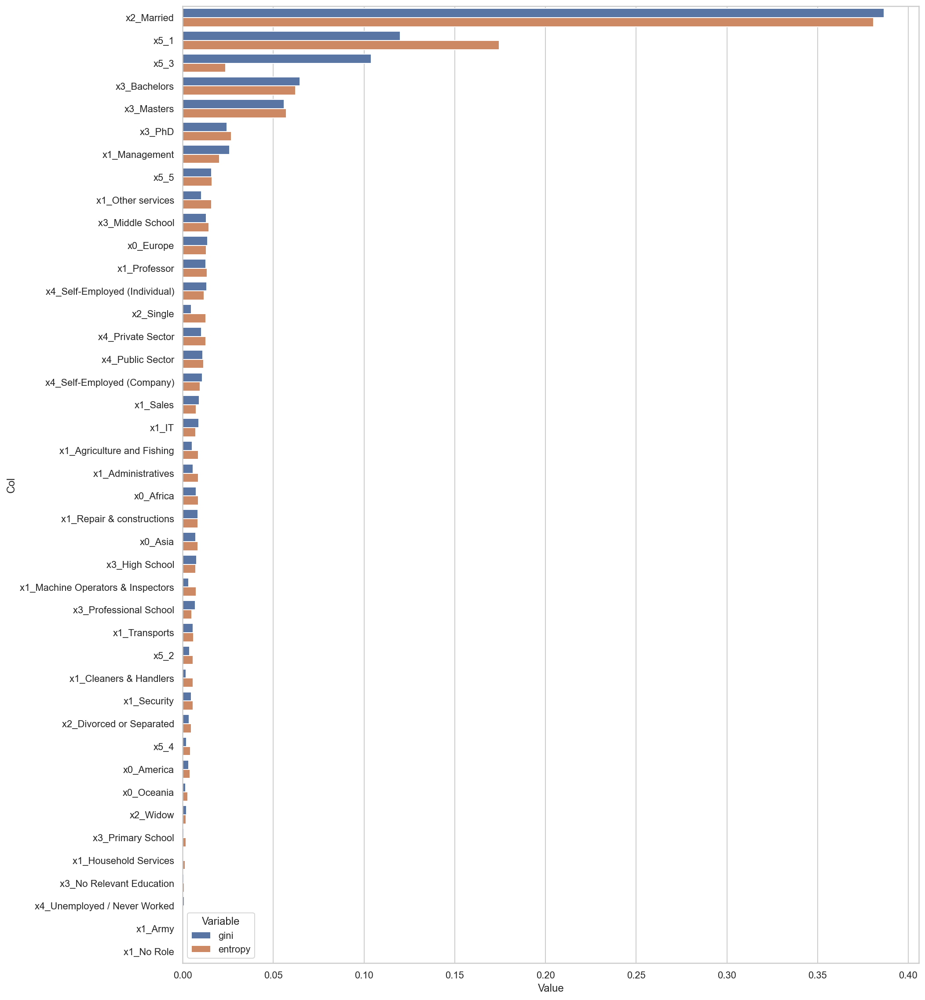

In [94]:
#feature importance with all binaries (gotten in encoding to check the classes with the lowest feature importance on each categorical

#feature importance using the split criteria 'Gini'
gini_importance = DecisionTreeClassifier().fit(ohc_df, target).feature_importances_

#feature importance using the split criteria 'Entropy'
entropy_importance = DecisionTreeClassifier(criterion='entropy').fit(ohc_df, target).feature_importances_

#plotting the feature importances for both criteria
zippy = pd.DataFrame(zip(gini_importance, entropy_importance), columns = ['gini','entropy'])
zippy['col'] = ohc_df.columns
tidy = zippy.melt(id_vars='col').rename(columns=str.title)
tidy.sort_values(['Value'], ascending = False, inplace = True)

plt.figure(figsize=(15,20))
sns.barplot(y='Col', x='Value', hue='Variable', data=tidy)

In [95]:
#instead of dropping the first, we drop the less "important" according to frquency and proportion charts,
#and we also checked which class had less feature importance on each categorical feature
ohc_df.drop(columns=['x0_Oceania', 'x1_No Role', 'x2_Widow', 'x3_No Relevant Education', 'x4_Unemployed / Never Worked', 'x5_4'], inplace=True)

In [96]:
# Reassigning df to contain ohc variables
non_metric_binary = pd.concat([df_features.drop(columns=df_ohc.columns), ohc_df], axis=1)
non_metric_binary.head()

,Male,PostGraduation,Higher Education,Capital,Group B,Group C,Government,x0_Africa,x0_America,x0_Asia,x0_Europe,x1_Administratives,x1_Agriculture and Fishing,x1_Army,x1_Cleaners & Handlers,x1_Household Services,x1_IT,x1_Machine Operators & Inspectors,x1_Management,x1_Other services,x1_Professor,x1_Repair & constructions,x1_Sales,x1_Security,x1_Transports,x2_Divorced or Separated,x2_Married,x2_Single,x3_Bachelors,x3_High School,x3_Masters,x3_Middle School,x3_PhD,x3_Primary School,x3_Professional School,x4_Private Sector,x4_Public Sector,x4_Self-Employed (Company),x4_Self-Employed (Individual),x5_1,x5_2,x5_3,x5_5
CITIZEN_ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
12486,1,1,1,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0
12487,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0
12488,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0
12489,1,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0
12490,1,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0


In [97]:
non_metric_binary.loc[:, np.array(non_metric_binary.dtypes=="object")] = non_metric_binary.loc[:, np.array(non_metric_binary.dtypes=="object")].astype(int)

#### With decision trees

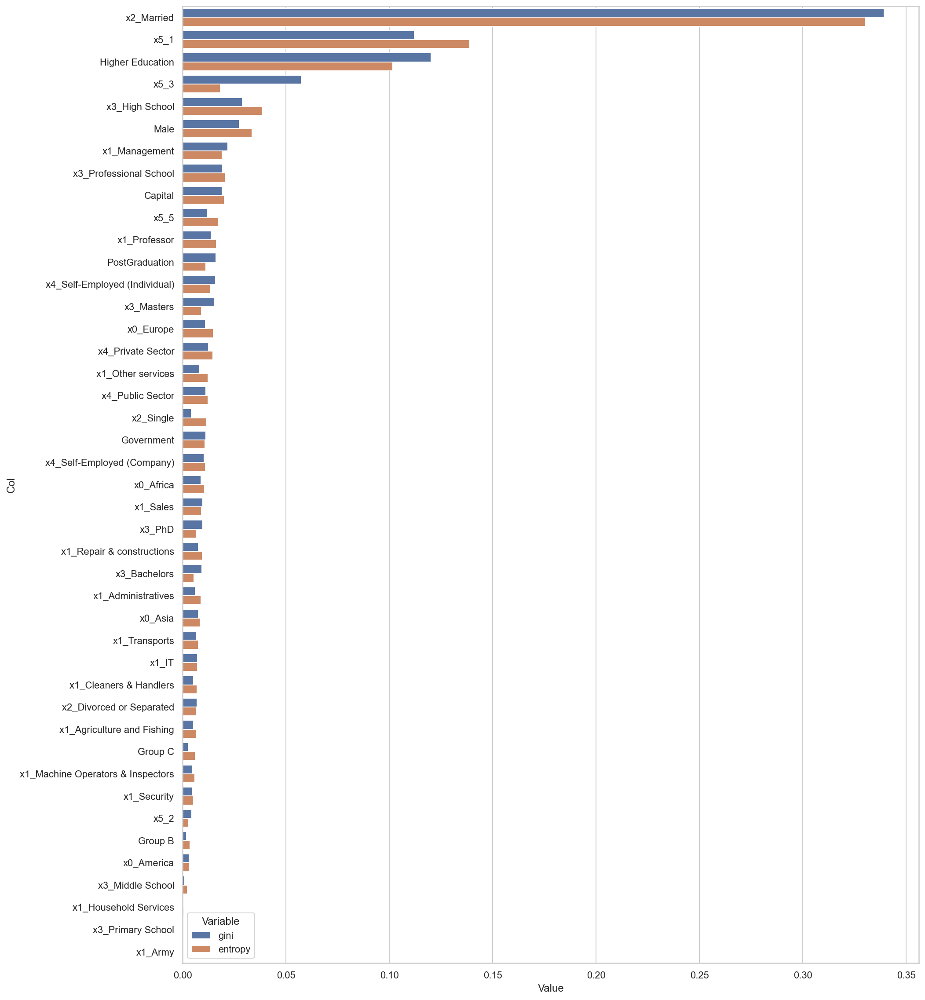

In [99]:
#feature importance using the split criteria 'Gini'
gini_importance = DecisionTreeClassifier().fit(non_metric_binary, target).feature_importances_

#feature importance using the split criteria 'Entropy'
entropy_importance = DecisionTreeClassifier(criterion='entropy').fit(non_metric_binary, target).feature_importances_

#plotting the feature importances for both criteria
zippy = pd.DataFrame(zip(gini_importance, entropy_importance), columns = ['gini','entropy'])
zippy['col'] = non_metric_binary.columns
tidy = zippy.melt(id_vars='col').rename(columns=str.title)
tidy.sort_values(['Value'], ascending = False, inplace = True)

plt.figure(figsize=(15,20))
sns.barplot(y='Col', x='Value', hue='Variable', data=tidy)

#1. x2_Married
#2. x5_1
#3. Higher Education
#4. x5_3
#5. x3_High School
#6. Male
#7. x1_Management
#8. x3_Professional School
#9. Capital
#10. x5_5
#11. x4_Private Sector
#12. PostGraduation
#13. x0_Europe

#### With Random Forest

In [100]:
#random forest instance, indicating the number of trees
rf = RandomForestClassifier(n_estimators = 100, random_state=0, n_jobs=-1)

sel = SelectFromModel(rf)

#selectFromModel object from sklearn to automatically select the features.
sel.fit(non_metric_binary, target)

#features with an importance greater than the mean importance of all the features
sel.get_support()

array([ True,  True,  True, False,  True, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
        True, False,  True, False, False, False, False,  True,  True,
        True,  True, False,  True, False, False, False, False, False,
       False, False, False,  True, False,  True, False])

In [101]:
rf.fit(non_metric_binary, target)

df_imp = pd.DataFrame(rf.feature_importances_, non_metric_binary.columns).reset_index().rename(columns={'index':'binary_variables', 0:'feature_importance'})
df_imp.sort_values('feature_importance', ascending=False)

#1. x2_Married
#2. x5_1
#3. x2_Single
#4. x5_3
#5. Male
#6. Higher Education
#7. x3_Masters
#8. x1_Professor
#9. Group B
#10. PostGraduation
#11. x2_Divorced or Separated
#12. x3_Bachelors
#13. Capital

,binary_variables,feature_importance
26,x2_Married,0.172748
39,x5_1,0.086201
27,x2_Single,0.077245
41,x5_3,0.053724
0,Male,0.045061
2,Higher Education,0.044542
18,x1_Management,0.036859
30,x3_Masters,0.034417
20,x1_Professor,0.029395
4,Group B,0.029395


In [102]:
#get the selected features on a list and count them
selected_feat = non_metric_binary.columns[(sel.get_support())]
len(selected_feat)

13

In [103]:
#names
print(selected_feat)

#estes estão por ordem de importância em cima!

Index(['Male', 'PostGraduation', 'Higher Education', 'Group B',
       'x1_Management', 'x1_Professor', 'x2_Divorced or Separated',
       'x2_Married', 'x2_Single', 'x3_Bachelors', 'x3_Masters', 'x5_1',
       'x5_3'],
      dtype='object')


Fazer teste de chi quadrado para a independência entre as categóricas e a target

In [104]:
df_features_target=df_features.copy()
df_features_target["Target"]=target
df_features_target

,Native Continent,Role,Male,Marital Status_new,Education Level_new,PostGraduation,Higher Education,Capital,Group B,Group C,Employment Sector (simplified),Government,Money Relevance,Target
CITIZEN_ID,,,,,,,,,,,,,,
12486,Europe,Repair & constructions,1,Married,High School,1,1,1,0,1,Private Sector,0,4,1
12487,Europe,Repair & constructions,1,Married,Professional School,0,0,1,0,0,Public Sector,0,3,1
12488,Europe,Sales,1,Married,Professional School,0,0,1,0,1,Private Sector,0,4,1
12489,Europe,Security,1,Married,High School,0,0,1,1,0,Private Sector,0,2,1
12490,Europe,Professor,1,Single,PhD,0,1,1,0,0,Self-Employed (Individual),0,3,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34881,Europe,Cleaners & Handlers,0,Divorced or Separated,Professional School,0,0,1,0,0,Private Sector,0,3,0
34882,Europe,Other services,1,Single,Professional School,0,0,1,0,0,Private Sector,0,3,0
34883,Europe,Professor,0,Single,Masters,0,1,1,1,0,Public Sector,0,2,0


In [105]:
df_features.head(3)

,Native Continent,Role,Male,Marital Status_new,Education Level_new,PostGraduation,Higher Education,Capital,Group B,Group C,Employment Sector (simplified),Government,Money Relevance
CITIZEN_ID,,,,,,,,,,,,,
12486,Europe,Repair & constructions,1,Married,High School,1,1,1,0,1,Private Sector,0,4
12487,Europe,Repair & constructions,1,Married,Professional School,0,0,1,0,0,Public Sector,0,3
12488,Europe,Sales,1,Married,Professional School,0,0,1,0,1,Private Sector,0,4


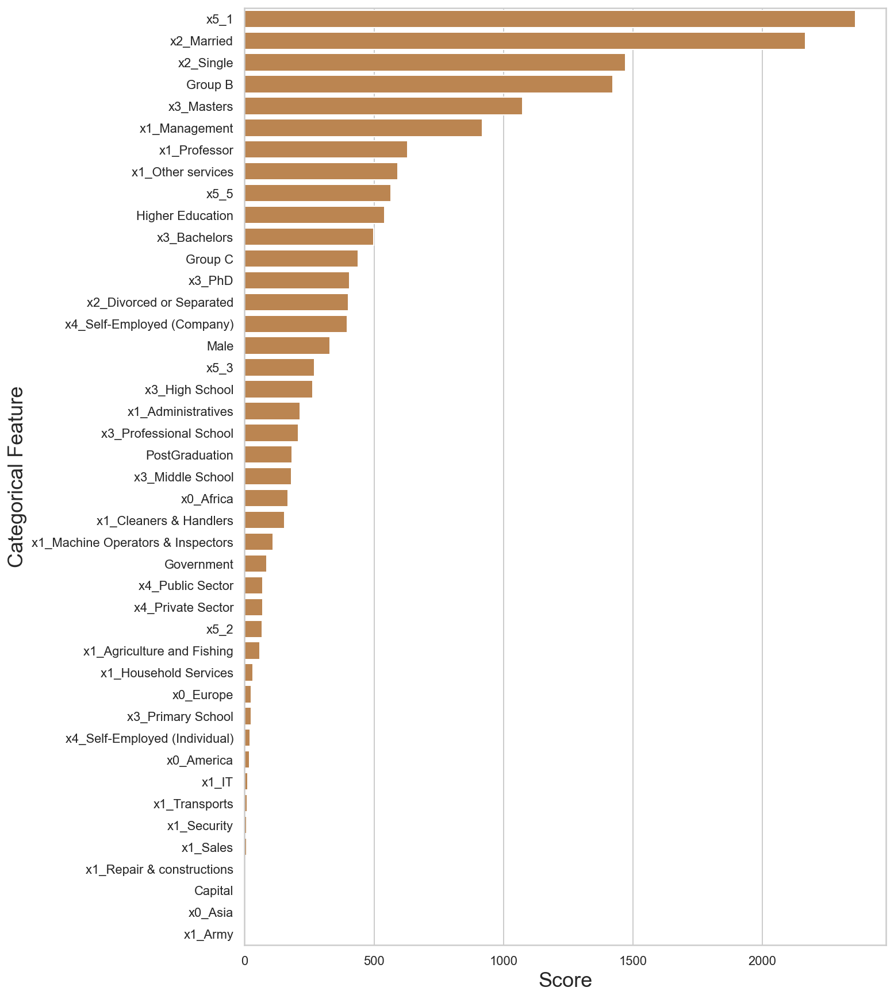

In [106]:
from sklearn.feature_selection import SelectKBest, chi2 # for chi-squared feature selection

sf = SelectKBest(chi2, k='all')
sf_fit = sf.fit(non_metric_binary, target)

#for i in range(len(sf_fit.scores_)):
#    print(' %s: %f' % (X.columns[i], sf_fit.scores_[i]))
    
# plot the scores
datset = pd.DataFrame()
datset['feature'] = non_metric_binary.columns[ range(len(sf_fit.scores_))]
datset['scores'] = sf_fit.scores_
datset = datset.sort_values(by='scores', ascending=False)

plt.figure(figsize=(10,15))
sns.barplot(datset['scores'], datset['feature'], color='peru')
sns.set_style('whitegrid')
plt.ylabel('Categorical Feature', fontsize=18)
plt.xlabel('Score', fontsize=18)
plt.show()

#valores mais altos= maior importancia/relevancia p a variavel dependente

In [107]:
#MI
from sklearn.feature_selection import mutual_info_classif

feat = []
mi = []

for i in non_metric_binary.columns:
    feat.append(i)
    
    a = np.array(non_metric_binary[i])
    b = np.array(target)

    #mutual information of 0.69, expressed in nats
    mi.append(mutual_info_classif(a.reshape(-1,1), b, discrete_features = True)[0])

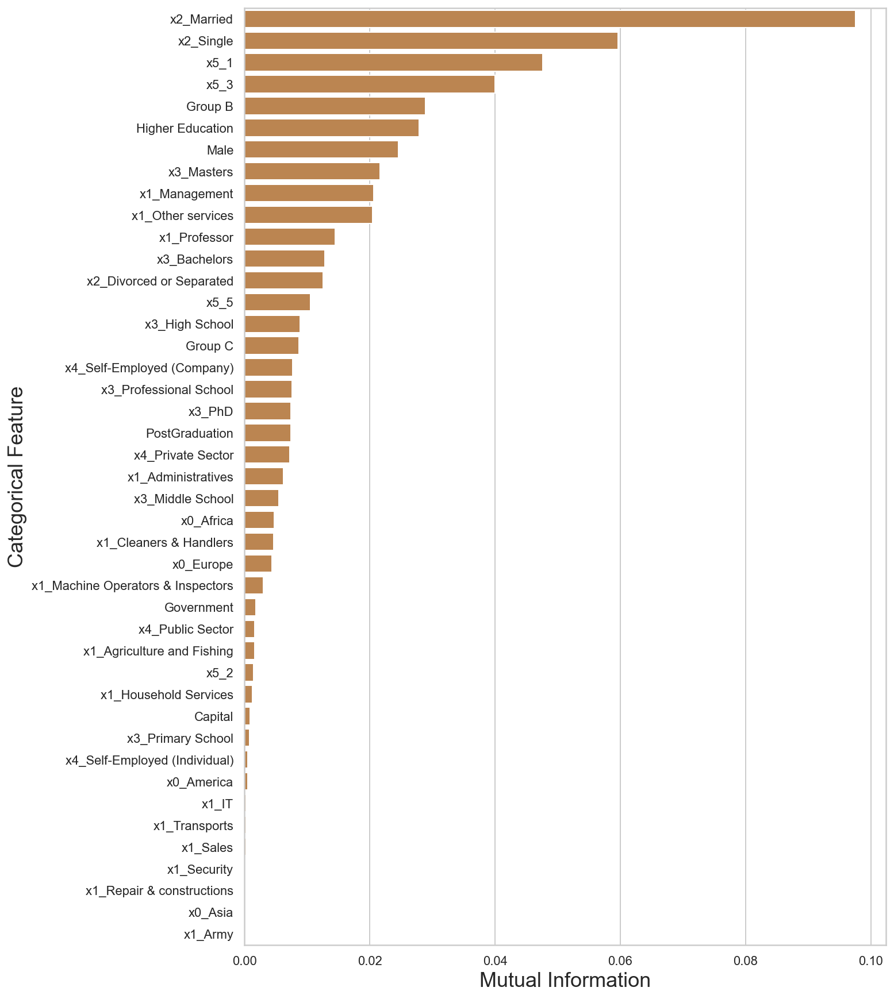

In [108]:
# plot the MI
feat_mi=pd.DataFrame([feat, mi]).T.sort_values(by=1, ascending=False).reset_index(drop=True)

plt.figure(figsize=(10,15))
sns.barplot(x=1, y=0, data=feat_mi, color='peru')
sns.set_style('whitegrid')
plt.ylabel('Categorical Feature', fontsize=18)
plt.xlabel('Mutual Information', fontsize=18)
plt.show()

#### Mutual information among binary variables

In [109]:
non_metric_selected = non_metric_binary[['Male', 'Higher Education', 'Group B', 'x1_Management', 'x1_Professor', 'x2_Married', 'x2_Single', 'x3_Bachelors', 'x3_Masters', 'x5_1', 'x5_3', 'x5_5']]

In [110]:
from sklearn.metrics.cluster import normalized_mutual_info_score

print('Normalized mutual information between binary variables (0-1):\n')
for i in non_metric_selected.columns:
    for j in non_metric_selected.columns:
        normal_mi = round(normalized_mutual_info_score(non_metric_selected[i], non_metric_selected[j]), 3)
        
        if i == j: #equals to 1
            pass
        
        elif normal_mi > 0.5:
            print(i, 'and', j, ':', normal_mi)
            
#x3_3 was selected more times than Group B, so we will keep Group x3_3:
non_metric_selected.drop(columns='Group B', inplace=True)

Normalized mutual information between binary variables (0-1):

Group B and x5_3 : 0.594
x5_3 and Group B : 0.594


# <font color='#E8800A'>Baseline</font> <a class="anchor" id="second-bullet"></a>

Other methods used:

- [<font color='#E8800A'>Baseline with over and under sampling</font>](#third-bullet)<br>
- [<font color='#E8800A'>MinMax without outliers</font>](#fourth-bullet)<br>
- [<font color='#E8800A'>Robust Scale with outliers</font>](#fifth-bullet) <br>
   
[Back to Newland](#Newland)   
</div>

### Normalization

In [157]:
df_train2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 22400 entries, 12486 to 34885
Data columns (total 29 columns):
 #   Column                              Non-Null Count  Dtype         
---  ------                              --------------  -----         
 0   Name                                22400 non-null  object        
 1   Birthday                            22400 non-null  datetime64[ns]
 2   Native Continent                    22400 non-null  object        
 3   Marital Status                      22400 non-null  object        
 4   Lives with                          22400 non-null  object        
 5   Base Area                           22400 non-null  object        
 6   Education Level                     22400 non-null  object        
 7   Years of Education                  22400 non-null  int64         
 8   Employment Sector                   22400 non-null  object        
 9   Role                                22400 non-null  object        
 10  Working Hours per 

In [158]:
metric= df_train2.loc[:,(np.array(df_train2.dtypes=="int64")) | (np.array(df_train2.dtypes=="float64"))]

# Normalizing using min max
min_max_scaler = preprocessing.MinMaxScaler()
metric_scaled = min_max_scaler.fit_transform(metric.values)
stand_metric= pd.DataFrame(metric_scaled, columns=metric.columns, index=metric.index)

In [159]:
# Normalizing using RobustScaler 
# robust = RobustScaler().fit(metric)
# robust_metric= robust.transform(metric)
# stand_metric= pd.DataFrame(robust_metric, columns=metric.columns, index=metric.index)

### Feature selection for numeric variables

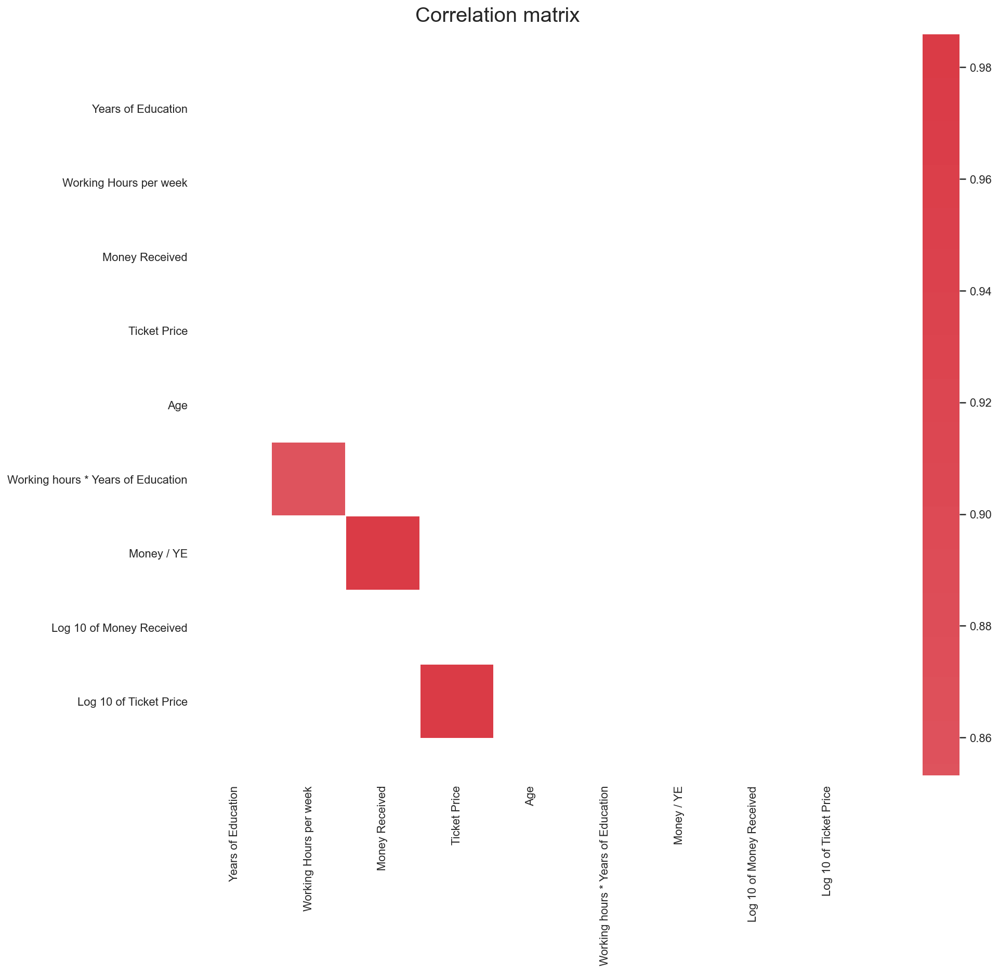

In [160]:
sns.set(style="white")

# Compute the correlation matrix
corr = stand_metric.corr() #Getting correlation of numerical variables

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool) #Return an array of zeros (Falses) with the same shape and type as a given array
mask[np.triu_indices_from(mask)] = True #The upper-triangle array is now composed by True values

# Set up the matplotlib figure
fig, ax = plt.subplots(figsize=(20, 12))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True) #Make a diverging palette between two HUSL colors. Return a matplotlib colormap object.

# Draw the heatmap with the mask and correct aspect ratio
#show only corr bigger than 0.6 in absolute value
sns.heatmap(corr[(corr>=.7) | (corr<=-.7)], mask=mask, cmap=cmap, center=0, square=True, linewidths=.5, ax=ax)

# Layout
plt.subplots_adjust(top=0.95)
plt.suptitle("Correlation matrix", fontsize=20)
plt.yticks(rotation=0)
plt.xticks(rotation=90)
# Fixing the bug of partially cut-off bottom and top cells
b, t = plt.ylim() # discover the values for bottom and top
b += 0.5 # Add 0.5 to the bottom
t -= 0.5 # Subtract 0.5 from the top
plt.ylim(b, t) # update the ylim(bottom, top) values

plt.show()

In [161]:
#correlation between Money Received and Log 10 of Money Received
round(corr['Money Received']['Log 10 of Money Received'], 3)

0.561

#### RFE

In [162]:
#no of features
nof_list=np.arange(1,len(stand_metric.columns)+1)  
high_score=0

#Variable to store the optimum features
nof=0           
score_list =[]
for n in range(len(nof_list)):
    # we are going to see in the next class this "train_test_split()"...
    X_train, X_test, y_train, y_test = train_test_split(stand_metric,target, test_size = 0.3, random_state = 0)
    
    model = LogisticRegression()
    rfe = RFE(model,nof_list[n])
    X_train_rfe = rfe.fit_transform(X_train,y_train)
    X_test_rfe = rfe.transform(X_test)
    model.fit(X_train_rfe,y_train)
    
    score = model.score(X_test_rfe,y_test)
    score_list.append(score)
    
    if(score>high_score):
        high_score = score
        nof = nof_list[n]
print("Optimum number of features: %d" %nof)
print("Score with %d features: %f" % (nof, high_score))

Optimum number of features: 7
Score with 7 features: 0.811607


In [163]:
rfe = RFE(estimator = model, n_features_to_select = 7)
X_rfe = rfe.fit_transform(X = stand_metric, y = target)
model = LogisticRegression().fit(X = X_rfe,y = target)
selected_features = pd.Series(rfe.support_, index = stand_metric.columns)
selected_features

Years of Education                     True
Working Hours per week                 True
Money Received                         True
Ticket Price                           True
Age                                    True
Working hours * Years of Education     True
Money / YE                             True
Log 10 of Money Received              False
Log 10 of Ticket Price                False
dtype: bool

#### Lasso

Best alpha using built-in LassoCV: 0.000026
Best score using built-in LassoCV: 0.254031
Lasso picked 9 variables and eliminated the other 0 variables


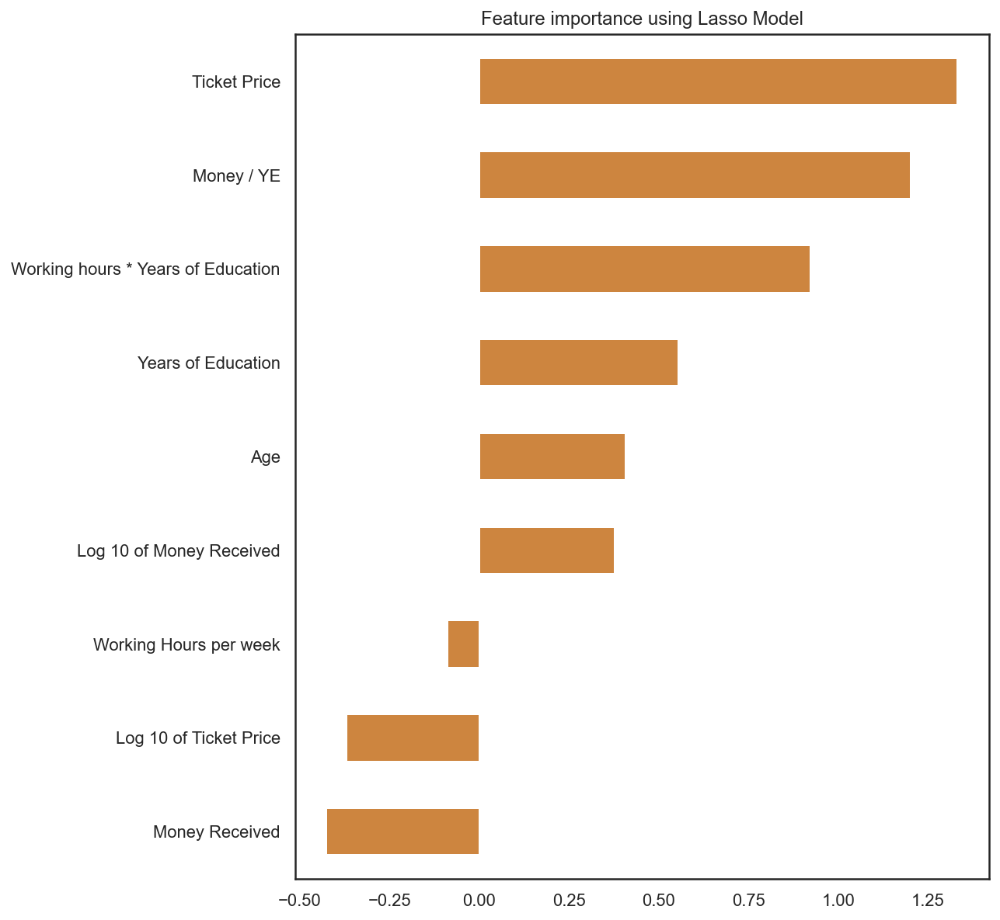

In [164]:
#Lasso
def plot_importance(coef,name):
    imp_coef = coef.sort_values()
    plt.figure(figsize=(8,10))
    imp_coef.plot(kind = "barh", color="peru")
    plt.title("Feature importance using " + name + " Model")
    plt.show()
    
reg = LassoCV()

reg.fit(X=stand_metric, y=target)
print("Best alpha using built-in LassoCV: %f" % reg.alpha_)
print("Best score using built-in LassoCV: %f" %reg.score(X = stand_metric,y = target))
coef = pd.Series(reg.coef_, index = stand_metric.columns)
print("Lasso picked " + str(sum(coef != 0)) + " variables and eliminated the other " +  str(sum(coef == 0)) + " variables")
plot_importance(coef,'Lasso')

#### Ridge

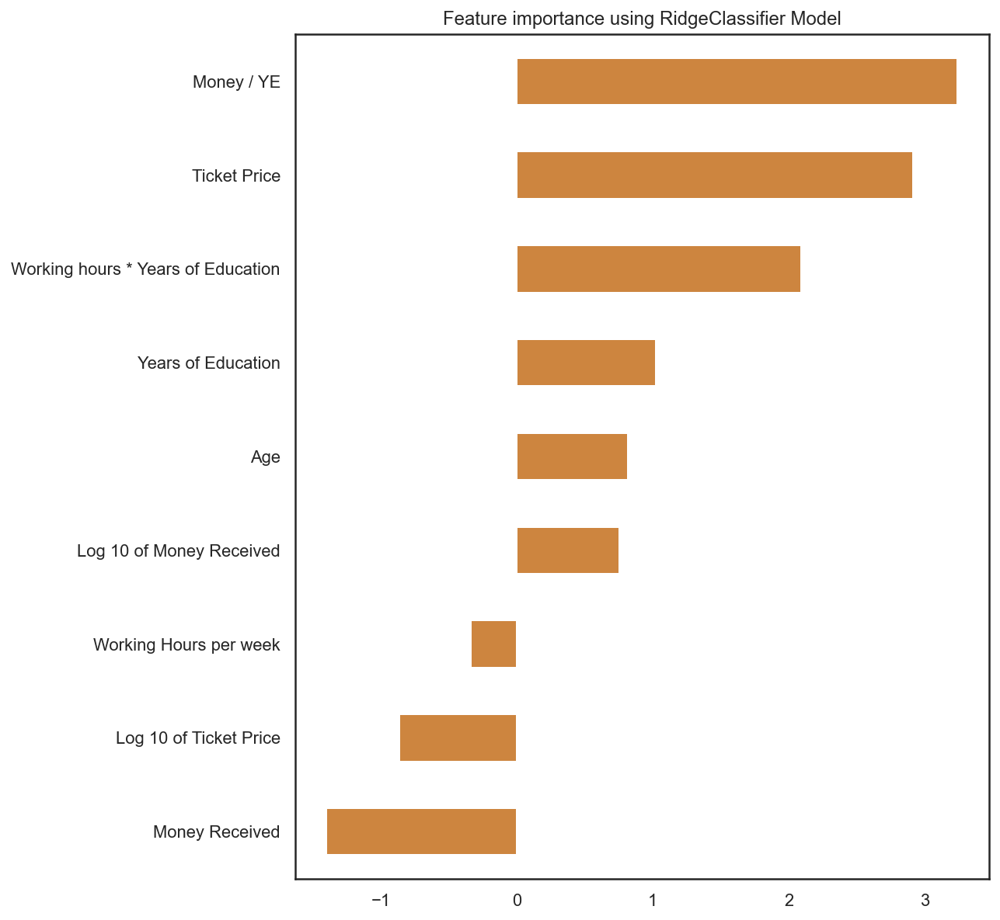

In [165]:
ridge = RidgeClassifierCV().fit(X = stand_metric,y = target)
coef_ridge = pd.Series(ridge.coef_[0], index = stand_metric.columns)

def plot_importance(coef,name):
    imp_coef = coef.sort_values()
    plt.figure(figsize=(8,10))
    imp_coef.plot(kind = "barh", color="peru")
    plt.title("Feature importance using " + name + " Model")
    plt.show()
    
plot_importance(coef_ridge,'RidgeClassifier')

#### Forward

In [166]:
model = LogisticRegression()

In [167]:
forward = SFS(model, k_features=9, forward=True, scoring="accuracy", cv = None) #floating=False

forward.fit(stand_metric, target)

SequentialFeatureSelector(cv=None, estimator=LogisticRegression(), k_features=9,
                          scoring='accuracy')

In [168]:
forward_table = pd.DataFrame.from_dict(forward.get_metric_dict()).T.drop(columns=['cv_scores', 'ci_bound', 'std_dev', 'std_err'])
forward_table

,feature_idx,avg_score,feature_names
1,"(2,)",0.803259,"(Money Received,)"
2,"(2, 3)",0.816741,"(Money Received, Ticket Price)"
3,"(2, 3, 8)",0.816696,"(Money Received, Ticket Price, Log 10 of Ticke..."
4,"(2, 3, 6, 8)",0.815312,"(Money Received, Ticket Price, Money / YE, Log..."
5,"(2, 3, 6, 7, 8)",0.814063,"(Money Received, Ticket Price, Money / YE, Log..."
6,"(0, 2, 3, 6, 7, 8)",0.810848,"(Years of Education, Money Received, Ticket Pr..."
7,"(0, 2, 3, 5, 6, 7, 8)",0.811786,"(Years of Education, Money Received, Ticket Pr..."
8,"(0, 2, 3, 4, 5, 6, 7, 8)",0.814688,"(Years of Education, Money Received, Ticket Pr..."
9,"(0, 1, 2, 3, 4, 5, 6, 7, 8)",0.813616,"(Years of Education, Working Hours per week, M..."


In [169]:
forward_table_max = forward_table['avg_score'].max()
forward_table_max

0.8167410714285714

In [170]:
forward_table[forward_table['avg_score']==forward_table_max]['feature_names'].values

array([('Money Received', 'Ticket Price')], dtype=object)

#### Backward

In [171]:
backward = SFS(model, k_features=1, forward=False, scoring="accuracy", cv = None) #floating=False

backward.fit(stand_metric, target)

SequentialFeatureSelector(cv=None, estimator=LogisticRegression(),
                          forward=False, scoring='accuracy')

In [172]:
backward_table = pd.DataFrame.from_dict(backward.get_metric_dict()).T.drop(columns=['cv_scores', 'ci_bound', 'std_dev', 'std_err'])
backward_table

,feature_idx,avg_score,feature_names
9,"(0, 1, 2, 3, 4, 5, 6, 7, 8)",0.813616,"(Years of Education, Working Hours per week, M..."
8,"(0, 1, 2, 3, 4, 5, 6, 8)",0.815134,"(Years of Education, Working Hours per week, M..."
7,"(0, 2, 3, 4, 5, 6, 8)",0.816116,"(Years of Education, Money Received, Ticket Pr..."
6,"(0, 2, 3, 4, 5, 6)",0.816161,"(Years of Education, Money Received, Ticket Pr..."
5,"(0, 2, 3, 4, 5)",0.814107,"(Years of Education, Money Received, Ticket Pr..."
4,"(0, 2, 4, 5)",0.808438,"(Years of Education, Money Received, Age, Work..."
3,"(0, 2, 5)",0.804241,"(Years of Education, Money Received, Working h..."
2,"(0, 2)",0.801741,"(Years of Education, Money Received)"
1,"(2,)",0.803259,"(Money Received,)"


In [173]:
backward_table_max = backward_table['avg_score'].max()
backward_table_max

0.8161607142857142

In [174]:
backward_table[backward_table['avg_score']==backward_table_max]['feature_names'].values

array([('Years of Education', 'Money Received', 'Ticket Price', 'Age', 'Working hours * Years of Education', 'Money / YE')],
      dtype=object)

### Mixing numerical and categorical variables

In [175]:
stand_metric.drop(columns=['Working Hours per week', 'Money / YE', 'Log 10 of Money Received', 'Log 10 of Ticket Price'], inplace=True)

In [176]:
all_selected_variables = pd.concat([non_metric_selected, stand_metric], axis=1)

In [177]:
all_selected_variables

,Male,Higher Education,x1_Management,x1_Professor,x2_Married,x2_Single,x3_Bachelors,x3_Masters,x5_1,x5_3,x5_5,Years of Education,Money Received,Ticket Price,Age,Working hours * Years of Education
CITIZEN_ID,,,,,,,,,,,,,,,,
12486,1,1,0,0,1,0,0,0,0,0,0,0.619048,0.000000,0.424225,0.383562,0.250120
12487,1,0,0,0,1,0,0,0,0,1,0,0.571429,0.000000,0.000000,0.342466,0.230880
12488,1,0,0,0,1,0,0,0,0,0,0,0.571429,0.000000,0.433184,0.301370,0.265512
12489,1,0,0,0,1,0,0,0,0,0,0,0.523810,0.043862,0.000000,0.630137,0.195767
12490,1,1,0,1,0,1,0,0,0,1,0,1.000000,0.000000,0.000000,0.219178,0.454545
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34881,0,0,0,0,0,0,0,0,0,1,0,0.571429,0.000000,0.000000,0.109589,0.230880
34882,1,0,0,0,0,1,0,0,0,1,0,0.571429,0.000000,0.000000,0.082192,0.202020
34883,0,1,0,1,0,1,0,1,0,0,0,0.809524,0.021740,0.000000,0.123288,0.327080


In [178]:
model = LogisticRegression()

Forward:

In [179]:
forward = SFS(model, k_features=16, forward=True, scoring="accuracy", cv = None) #floating=False

forward.fit(all_selected_variables, target)

SequentialFeatureSelector(cv=None, estimator=LogisticRegression(),
                          k_features=16, scoring='accuracy')

In [180]:
forward_table = pd.DataFrame.from_dict(forward.get_metric_dict()).T.drop(columns=['cv_scores', 'ci_bound', 'std_dev', 'std_err'])
forward_table

,feature_idx,avg_score,feature_names
1,"(12,)",0.803259,"(Money Received,)"
2,"(12, 13)",0.816741,"(Money Received, Ticket Price)"
3,"(10, 12, 13)",0.811652,"(x5_5, Money Received, Ticket Price)"
4,"(5, 10, 12, 13)",0.812054,"(x2_Single, x5_5, Money Received, Ticket Price)"
5,"(5, 10, 11, 12, 13)",0.818304,"(x2_Single, x5_5, Years of Education, Money Re..."
6,"(4, 5, 10, 11, 12, 13)",0.835179,"(x2_Married, x2_Single, x5_5, Years of Educati..."
7,"(2, 4, 5, 10, 11, 12, 13)",0.838973,"(x1_Management, x2_Married, x2_Single, x5_5, Y..."
8,"(2, 4, 5, 8, 10, 11, 12, 13)",0.840268,"(x1_Management, x2_Married, x2_Single, x5_1, x..."
9,"(2, 4, 5, 8, 10, 11, 12, 13, 14)",0.842098,"(x1_Management, x2_Married, x2_Single, x5_1, x..."
10,"(2, 4, 5, 8, 9, 10, 11, 12, 13, 14)",0.842589,"(x1_Management, x2_Married, x2_Single, x5_1, x..."


In [181]:
forward_table_max = forward_table['avg_score'].max()
forward_table_max

0.8435267857142857

In [182]:
forward_table[forward_table['avg_score']==forward_table_max]['feature_names'].values

array([('Male', 'x1_Management', 'x1_Professor', 'x2_Married', 'x2_Single', 'x5_1', 'x5_3', 'x5_5', 'Years of Education', 'Money Received', 'Ticket Price', 'Age', 'Working hours * Years of Education')],
      dtype=object)

Backward

In [183]:
backward = SFS(model, k_features=1, forward=False, scoring="accuracy", cv = None) #floating=False

backward.fit(all_selected_variables, target)

SequentialFeatureSelector(cv=None, estimator=LogisticRegression(),
                          forward=False, scoring='accuracy')

In [184]:
backward_table = pd.DataFrame.from_dict(backward.get_metric_dict()).T.drop(columns=['cv_scores', 'ci_bound', 'std_dev', 'std_err'])
backward_table

,feature_idx,avg_score,feature_names
16,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",0.842946,"(Male, Higher Education, x1_Management, x1_Pro..."
15,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 11, 12, 13, 14,...",0.843884,"(Male, Higher Education, x1_Management, x1_Pro..."
14,"(0, 1, 2, 3, 4, 5, 7, 8, 9, 11, 12, 13, 14, 15)",0.844018,"(Male, Higher Education, x1_Management, x1_Pro..."
13,"(0, 1, 2, 3, 4, 7, 8, 9, 11, 12, 13, 14, 15)",0.843973,"(Male, Higher Education, x1_Management, x1_Pro..."
12,"(1, 2, 3, 4, 7, 8, 9, 11, 12, 13, 14, 15)",0.843795,"(Higher Education, x1_Management, x1_Professor..."
11,"(1, 2, 3, 4, 8, 9, 11, 12, 13, 14, 15)",0.843929,"(Higher Education, x1_Management, x1_Professor..."
10,"(1, 2, 3, 4, 8, 9, 11, 13, 14, 15)",0.843393,"(Higher Education, x1_Management, x1_Professor..."
9,"(1, 2, 3, 4, 8, 9, 11, 14, 15)",0.842768,"(Higher Education, x1_Management, x1_Professor..."
8,"(1, 2, 3, 4, 8, 9, 11, 15)",0.842455,"(Higher Education, x1_Management, x1_Professor..."
7,"(2, 3, 4, 8, 9, 11, 15)",0.841875,"(x1_Management, x1_Professor, x2_Married, x5_1..."


In [185]:
backward_table_max = backward_table['avg_score'].max()
backward_table_max

0.8440178571428572

In [186]:
backward_table[backward_table['avg_score']==backward_table_max]['feature_names'].values

array([('Male', 'Higher Education', 'x1_Management', 'x1_Professor', 'x2_Married', 'x2_Single', 'x3_Masters', 'x5_1', 'x5_3', 'Years of Education', 'Money Received', 'Ticket Price', 'Age', 'Working hours * Years of Education')],
      dtype=object)

Mantaining the variables that appear on both the forward and backward selections:

In [187]:
non_metric_bf = non_metric_selected.drop(columns=['Higher Education', 'x3_Bachelors', 'x3_Masters', 'x5_5'])

In [188]:
all_selected_variables.drop(columns=['Higher Education', 'x3_Bachelors', 'x3_Masters', 'x5_5'], inplace=True)

#### Checking point biserial among the selected numerical and categorical variables

In [189]:
from scipy.stats import pointbiserialr

print('Point biserial between binary and metric variables:\n')
for i in non_metric_bf.columns:
    for j in stand_metric.columns:
        pb = pointbiserialr(non_metric_bf[i], stand_metric[j])
        
        if abs(pb[0]) > 0.5:
            print(i, 'and', j, ':', round(pb[0], 3))

Point biserial between binary and metric variables:

x2_Single and Age : -0.536
x5_1 and Money Received : 0.619
x5_3 and Ticket Price : -0.567


In [190]:
all_selected_variables.columns

Index(['Male', 'x1_Management', 'x1_Professor', 'x2_Married', 'x2_Single',
       'x5_1', 'x5_3', 'Years of Education', 'Money Received', 'Ticket Price',
       'Age', 'Working hours * Years of Education'],
      dtype='object')

In [191]:
# Selecting the same columns for test set
all_variables_test = pd.concat([df_test, ohc_df_test], axis=1)

test=all_variables_test[['Male', 'x1_Management', 'x1_Professor', 'x2_Married', 'x2_Single',
       'x5_1', 'x5_3', 'Years of Education', 'Money Received', 'Ticket Price',
       'Age', 'Working hours * Years of Education']]

## Data Partition

In [192]:
X_train, X_val, y_train, y_val = train_test_split(all_selected_variables,
                                                  target,
                                                  test_size = 0.3,
                                                  random_state = 42,
                                                  shuffle=True,
                                                  stratify=target)

### <font color='#E8800A'>First Baseline Models</font> <a class="anchor" id="sixth-bullet"></a>

Alternative:
- [<font color='#E8800A'>Baseline with over and under sampling</font>](#third-bullet)<br>

# Predictive Modelling

In [193]:
# Código para fazer as previsões no test!

# Test ainda não foi normalizado em lado nenhum ainda!

# min_max_scaler = preprocessing.MinMaxScaler()
# metric_scaled = min_max_scaler.fit_transform(test.values)
# test= pd.DataFrame(metric_scaled, columns=test.columns, index=test.index)

# Só usar este se for com o robusto 

# Normalizing using RobustScaler 
# robust = RobustScaler().fit(metric)
# robust_metric= robust.transform(metric)
# stand_metric= pd.DataFrame(robust_metric, columns=metric.columns, index=metric.index)

In [194]:
# Citizen=df_test['CITIZEN_ID']
# labels_test= model.predict(test)
# prediction=pd.concat([Citizen, pd.DataFrame(labels_test)],axis=1)
# prediction['Income']=prediction[0]
# prediction.drop(columns=0,inplace=True)

In [195]:
# prediction.to_csv(r'C:\Users\matip\Documents\Mestrado\Machine Learning\Project\Proj\Predictions\Pred1.csv',index=False, header=True,sep=',')

In [196]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix #confusion_matrix to evaluate the accuracy of a classification 
from sklearn.metrics import accuracy_score
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
import time
from sklearn.model_selection import KFold
from sklearn.tree import export_graphviz
import graphviz
import pydotplus
from sklearn.metrics import auc
from sklearn.metrics import roc_curve
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import PassiveAggressiveClassifier
from numpy import mean
from numpy import std
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, StackingClassifier
from sklearn.metrics import f1_score
import matplotlib.pyplot as plt
from matplotlib.legend_handler import HandlerLine2D
from sklearn.svm import SVC

In [197]:
# Functions to be used in all models to assess them

def metrics(y_train, pred_train , y_val, pred_val):
    print('_____________________________________')
    print('                                                     TRAIN                                                 ')
    print('-----------------------------------------------------------------------------------------------------------')
    print(classification_report(y_train, pred_train))
    print(confusion_matrix(y_train, pred_train)) #true neg and true pos, false positives and false neg
    print('__________________________+_________')
    print('                                                VALIDATION                                                 ')
    print('-----------------------------------------------------------------------------------------------------------')
    print(classification_report(y_val, pred_val))
    print(confusion_matrix(y_val, pred_val))
    
    
def avg_score(model):
    # apply kfold
    kf = KFold(n_splits=10)
    # create lists to store the results from the different models 
    score_train = []
    score_val = []
    timer = []
    n_iter = []
    for train_index, val_index in kf.split(all_selected_variables):
        # get the indexes of the observations assigned for each partition
        X_train, X_val = all_selected_variables.iloc[train_index], all_selected_variables.iloc[val_index]
        y_train, y_val = target.iloc[train_index], target.iloc[val_index]
        # start counting time
        begin = time.perf_counter()
        # fit the model to the data
        model.fit(X_train, y_train)
        # finish counting time
        end = time.perf_counter()
        # check the mean accuracy for the train
        value_train = model.score(X_train, y_train)
        # check the mean accuracy for the test
        value_val = model.score(X_val,y_val)
        # append the accuracies, the time and the number of iterations in the corresponding list
        score_train.append(value_train)
        score_val.append(value_val)
        timer.append(end-begin)
        n_iter.append(model.n_iter_)
    # calculate the average and the std for each measure (accuracy, time and number of iterations)
    avg_time = round(np.mean(timer),3)
    avg_train = round(np.mean(score_train),3)
    avg_val = round(np.mean(score_val),3)
    std_time = round(np.std(timer),2)
    std_train = round(np.std(score_train),2)
    std_val = round(np.std(score_val),2)
    avg_iter = round(np.mean(n_iter),1)
    std_iter = round(np.std(n_iter),1)
    
    return str(avg_time) + '+/-' + str(std_time), str(avg_train) + '+/-' + str(std_train),\
str(avg_val) + '+/-' + str(std_val), str(avg_iter) + '+/-' + str(std_iter)


def show_results(df, *args):
    """
    Receive an empty dataframe and the different models and call the function avg_score
    """
    count = 0
    # for each model passed as argument
    for arg in args:
        # obtain the results provided by avg_score
        time, avg_train, avg_val, avg_iter = avg_score(arg)
        # store the results in the right row
        df.iloc[count] = time, avg_train, avg_val, avg_iter
        count+=1
    return df

In [198]:
# For the models that don't have n_iter attribute

def avg_score_1(model):
    # apply kfold
    kf = KFold(n_splits=10)
    # create lists to store the results from the different models 
    score_train = []
    score_val = []
    timer = []
    n_iter = []
    for train_index, val_index in kf.split(all_selected_variables):
        # get the indexes of the observations assigned for each partition
        X_train, X_val = all_selected_variables.iloc[train_index], all_selected_variables.iloc[val_index]
        y_train, y_val = target.iloc[train_index], target.iloc[val_index]
        # start counting time
        begin = time.perf_counter()
        # fit the model to the data
        model.fit(X_train, y_train)
        # finish counting time
        end = time.perf_counter()
        # check the mean accuracy for the train
        value_train = model.score(X_train, y_train)
        # check the mean accuracy for the validation
        value_val = model.score(X_val,y_val)
        # append the accuracies, the time and the number of iterations in the corresponding list
        score_train.append(value_train)
        score_val.append(value_val)
        timer.append(end-begin)
        #n_iter.append(model.n_iter_)
    # calculate the average and the std for each measure (accuracy, time and number of iterations)
    avg_time = round(np.mean(timer),3)
    avg_train = round(np.mean(score_train),3)
    avg_val = round(np.mean(score_val),3)
    std_time = round(np.std(timer),2)
    std_train = round(np.std(score_train),2)
    std_val = round(np.std(score_val),2)
    #avg_iter = round(np.mean(n_iter),1)
    #std_iter = round(np.std(n_iter),1)
    
    return str(avg_time) + '+/-' + str(std_time), str(avg_train) + '+/-' + str(std_train),\
str(avg_val) + '+/-' + str(std_val)
#, str(avg_iter) + '+/-' + str(std_iter)


def show_results_1(df, *args):
    """
    Receive an empty dataframe and the different models and call the function avg_score
    """
    count = 0
    # for each model passed as argument
    for arg in args:
        # obtain the results provided by avg_score
        time, avg_train, avg_val = avg_score_1(arg)
        # store the results in the right row
        df.iloc[count] = time, avg_train, avg_val
        count+=1
    return df

## Decision Trees

In [152]:
def plot_tree(model_tree):
    dot_data = export_graphviz(model_tree,
                               feature_names=X_train.columns,  
                               class_names=["Income lower or equal to avg", "Income higher than avg"],
                               filled=True)
    pydot_graph = pydotplus.graph_from_dot_data(dot_data)
    pydot_graph.set_size('"20,20"')
    return graphviz.Source(pydot_graph.to_string())

In [153]:
#AUC
def calculate_AUC(interval, x_train, x_val, y_train, y_val, parameter, max_depth = None):
    train_results = []
    val_results = []
    for value in interval:
        if (parameter == 'max_depth'):          
            dt = DecisionTreeClassifier(max_depth = value, random_state=42)
            dt.fit(x_train, y_train)
        elif (parameter == 'max_features'):  
            dt = DecisionTreeClassifier(max_features = value, max_depth = max_depth, random_state=42)
            dt.fit(x_train, y_train)
        elif (parameter == 'min_samples_split'):  
            dt = DecisionTreeClassifier(min_samples_split = value, max_depth = max_depth, random_state=42)
            dt.fit(x_train, y_train)
        elif (parameter == 'min_samples_leaf'):  
            dt = DecisionTreeClassifier(min_samples_leaf = value, max_depth = max_depth, random_state=42)
            dt.fit(x_train, y_train)
        elif (parameter == 'min_weight_fraction_leaf'):  
            dt = DecisionTreeClassifier(min_weight_fraction_leaf = value, max_depth = max_depth, random_state=42)
            dt.fit(x_train, y_train)
        elif (parameter == 'min_impurity_decrease'):  
            dt = DecisionTreeClassifier(min_impurity_decrease = value, max_depth = max_depth, random_state=42)
            dt.fit(x_train, y_train)
        train_pred = dt.predict(x_train)
        false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, train_pred)
        roc_auc = auc(false_positive_rate, true_positive_rate)
        # Add auc score to previous train results
        train_results.append(roc_auc)
        y_pred = dt.predict(x_val)
        false_positive_rate, true_positive_rate, thresholds = roc_curve(y_val, y_pred)
        roc_auc = auc(false_positive_rate, true_positive_rate)
        # Add auc score to previous validation results
        val_results.append(roc_auc)
    value_train = train_results.index(max(train_results))
    value_val = val_results.index(max(val_results))
    print('The best train value is ',interval[value_train])
    print('The best validation value is ',interval[value_val])
    

    import matplotlib.pyplot as plt
    from matplotlib.legend_handler import HandlerLine2D
    line1, = plt.plot(interval, train_results, 'b', label="Train AUC")
    line2, = plt.plot(interval, val_results, 'r', label="Validation AUC")
    plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
    plt.ylabel("AUC score")
    plt.xlabel(str(parameter))
    plt.show()

Nota: parameters in decision trees don't really improve performance, they're meant to control overfitting

In [158]:
dt_entropy = DecisionTreeClassifier(criterion = 'entropy').fit(X_train, y_train)
dt_gini = DecisionTreeClassifier(criterion = 'gini').fit(X_train, y_train)

df = pd.DataFrame(columns = ['Time','Train','Validation'], index = ['Gini','Entropy'])
show_results_1(df,dt_gini, dt_entropy)

,Time,Train,Test
Gini,0.079+/-0.02,0.94+/-0.0,0.826+/-0.01
Entropy,0.07+/-0.01,0.94+/-0.0,0.825+/-0.01


In [160]:
dt_random = DecisionTreeClassifier(splitter = 'random').fit(X_train, y_train)

df = pd.DataFrame(columns = ['Time','Train','Validation'], index = ['best','random'])
show_results_1(df,dt_gini, dt_random)

,Time,Train,Test
best,0.059+/-0.01,0.94+/-0.0,0.827+/-0.01
random,0.028+/-0.0,0.94+/-0.0,0.829+/-0.01


The best train value is  15.0
The best validation value is  10.0


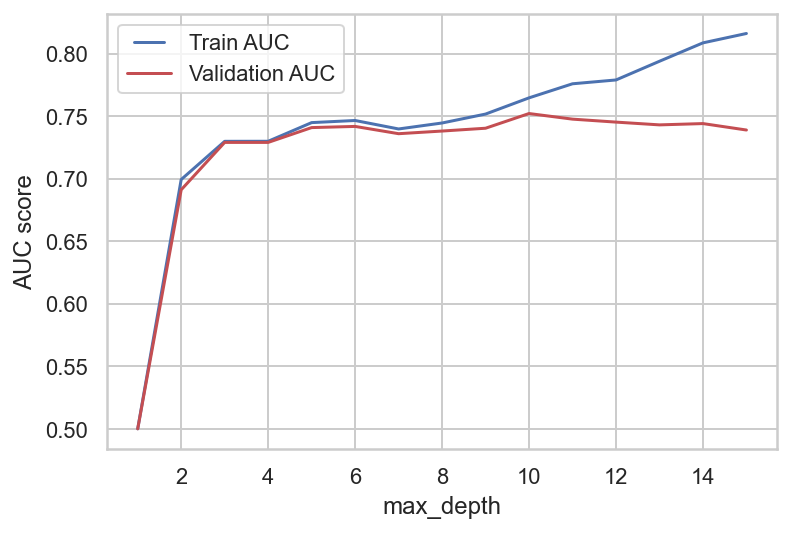

In [162]:
max_depths = np.linspace(1, 15, 15, endpoint=True)  
calculate_AUC(max_depths, X_train, X_val, y_train, y_val, 'max_depth')

In [164]:
dt_depth10 = DecisionTreeClassifier(max_depth = 10).fit(X_train, y_train)
dt_depth6 = DecisionTreeClassifier(max_depth = 6).fit(X_train, y_train)

df = pd.DataFrame(columns = ['Time','Train','Validation'], index = ['full','depth10','depth6'])
show_results_1(df,dt_gini, dt_depth10,dt_depth6)

# Quanto maior, mais overfitting! Com 6 é o melhor resultado dos 3 (menos overfitting e maior score no validation)

,Time,Train,Test
full,0.058+/-0.0,0.94+/-0.0,0.826+/-0.01
depth10,0.044+/-0.01,0.871+/-0.0,0.853+/-0.01
depth6,0.033+/-0.01,0.856+/-0.0,0.854+/-0.01


The best train value is  6
The best validation value is  6


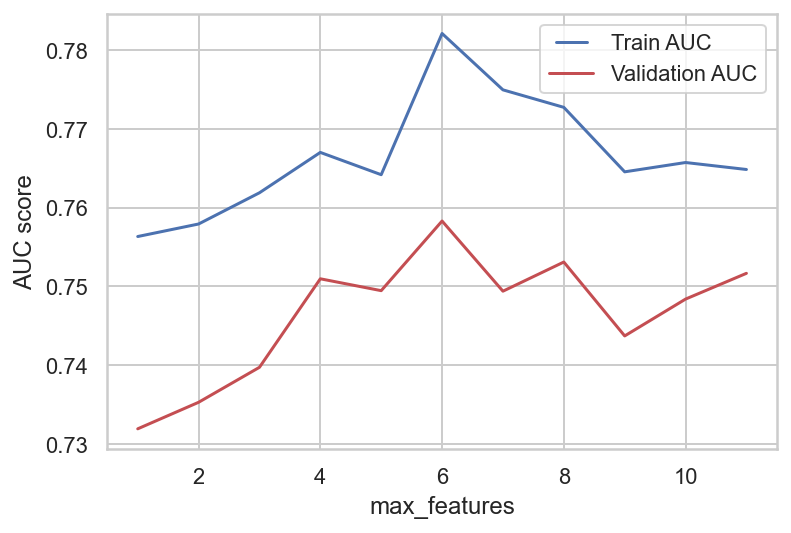

In [158]:
max_features = list(range(1,len(X_train.columns)))
calculate_AUC(max_features, X_train, X_val, y_train, y_val,'max_features', 10)
# Acho que não é necessário! Pelo gráfico vê-se que daria overfitting e já temos um número aceitável de variáveis
# Para além de que ele escolhe aleatoriamente as variáveis a usar

The best train value is  14
The best validation value is  17


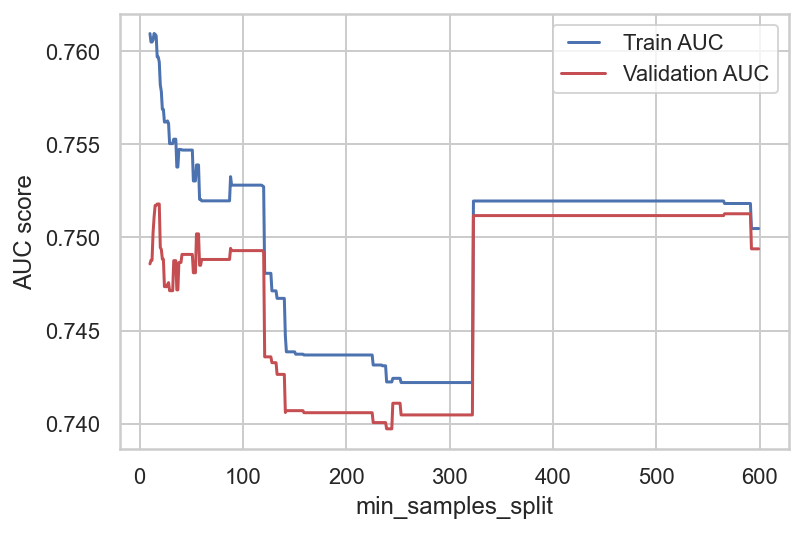

In [165]:
min_samples_split = list(range(10,600))
calculate_AUC(min_samples_split, X_train, X_val, y_train, y_val,'min_samples_split', 10)

In [168]:
dt_min17 = DecisionTreeClassifier(min_samples_split = 17).fit(X_train, y_train)
dt_min100 = DecisionTreeClassifier(min_samples_split = 100).fit(X_train, y_train)
dt_min350 = DecisionTreeClassifier(min_samples_split = 350).fit(X_train, y_train)

df = pd.DataFrame(columns = ['Time','Train','Validation'], index = ['dt_min17','dt_min100','dt_min350'])
show_results_1(df, dt_min17, dt_min100, dt_min350)

# Aqui quanto menor, mais overfitting! Com 350 já dá um resultado equilibrado (é o melhor e mais generalizado)

,Time,Train,Test
dt_min17,0.056+/-0.01,0.896+/-0.0,0.841+/-0.01
dt_min100,0.054+/-0.01,0.869+/-0.0,0.85+/-0.01
dt_min350,0.059+/-0.01,0.858+/-0.0,0.852+/-0.01


The best train value is  55
The best validation value is  38


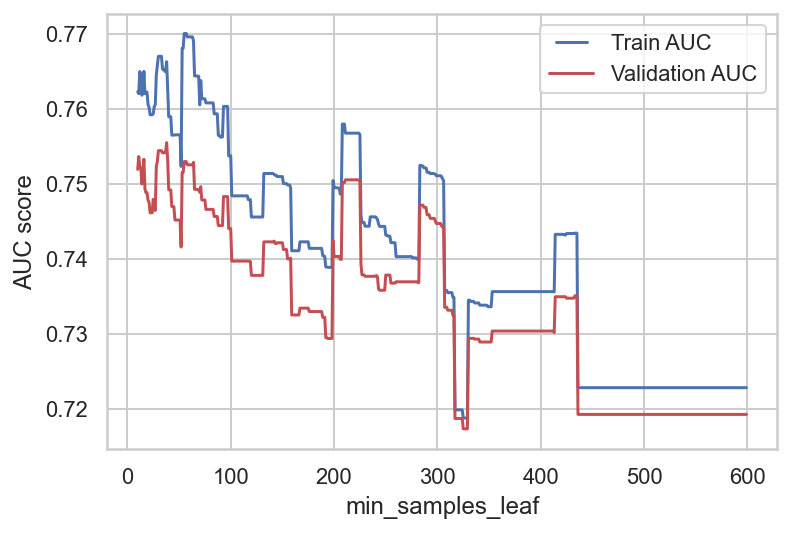

In [169]:
min_samples_leaf = list(range(10,600))
calculate_AUC(min_samples_leaf, X_train, X_val, y_train, y_val,'min_samples_leaf', 10)

In [171]:
dt_min_leaf38 = DecisionTreeClassifier(min_samples_split = 38).fit(X_train, y_train)
dt_min_leaf220 = DecisionTreeClassifier(min_samples_split = 220).fit(X_train, y_train)

df = pd.DataFrame(columns = ['Time','Train','Validation'], index = ['Min leaf 1','Min leaf 38','Min leaf 220'])
show_results_1(df, dt_gini, dt_min_leaf38, dt_min_leaf220)

# mais confuso de chegar a uma conclusão e tem o mesmo efeito que min_samples_split
# Quanto maior -> + underfitting, menor(default)-> full grown tree (overfitting)

,Time,Train,Test
Min leaf 1,0.076+/-0.02,0.94+/-0.0,0.826+/-0.01
Min leaf 38,0.061+/-0.01,0.883+/-0.0,0.845+/-0.01
Min leaf 220,0.044+/-0.01,0.861+/-0.0,0.852+/-0.01


The best train value is  0.003614457831325301
The best validation value is  0.0024096385542168672


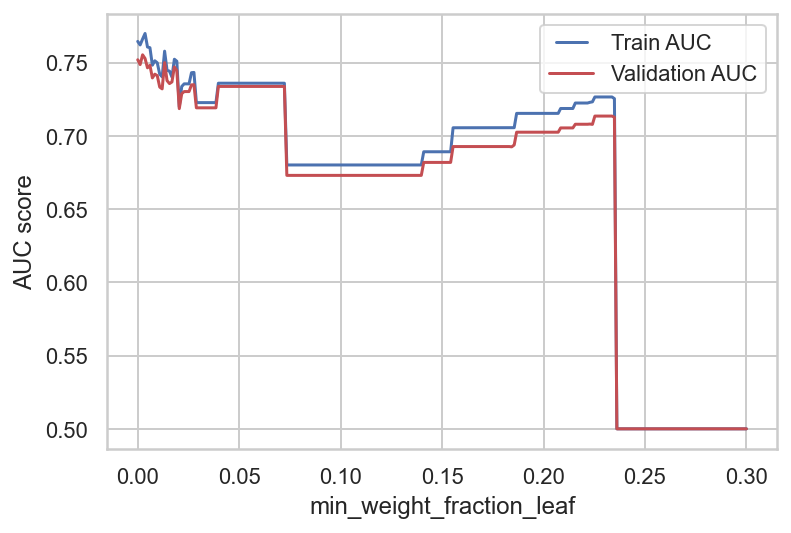

In [174]:
# more useful for imbalanced datasets!
min_weight_fraction_leaf = np.linspace(0, 0.3, 250, endpoint=True)
calculate_AUC(min_weight_fraction_leaf, X_train, X_val, y_train, y_val,'min_weight_fraction_leaf', 10)

In [173]:
dt_min_weight_1 = DecisionTreeClassifier(min_weight_fraction_leaf = 0.002).fit(X_train, y_train)
dt_min_weight_2 = DecisionTreeClassifier(min_weight_fraction_leaf = 0.05).fit(X_train, y_train)

df = pd.DataFrame(columns = ['Time','Train','Validation'], index = ['Min leaf 1','Min weight small','Min weight med'])
show_results_1(df, dt_gini, dt_min_weight_1, dt_min_weight_2)

# Usar diferente de 0.0 já fez diferença!0.05 reduziu o score! Usar 0.02

,Time,Train,Validation
Min leaf 1,0.069+/-0.01,0.94+/-0.0,0.826+/-0.01
Min weight small,0.049+/-0.01,0.861+/-0.0,0.852+/-0.01
Min weight med,0.022+/-0.0,0.822+/-0.0,0.822+/-0.01


The best train value is  0.0
The best validation value is  0.0001002004008016032


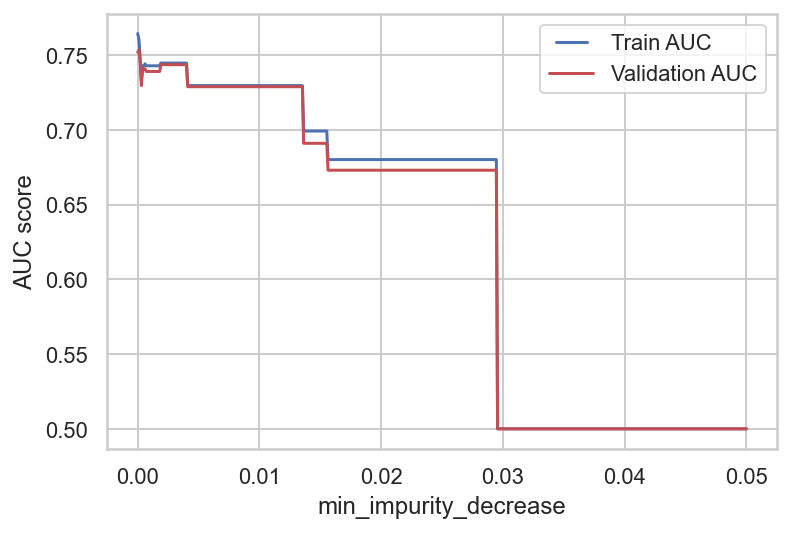

In [162]:
min_impurity_decrease = np.linspace(0, 0.05, 500, endpoint=True)
calculate_AUC(min_impurity_decrease, X_train, X_val, y_train, y_val,'min_impurity_decrease', 10)

In [175]:
dt_impurity01 = DecisionTreeClassifier(min_impurity_decrease=0.01).fit(X_train, y_train)
dt_impurity0001 = DecisionTreeClassifier(min_impurity_decrease=0.0001).fit(X_train, y_train)

df = pd.DataFrame(columns = ['Time','Train','Validation'], index = ['Baseline','dt_impurity01','dt_impurity0001'])
show_results_1(df,dt_gini, dt_impurity01,dt_impurity0001)

# Melhor é min_impurity_decrease=0.0001!

,Time,Train,Test
Baseline,0.071+/-0.01,0.94+/-0.0,0.826+/-0.01
dt_impurity01,0.026+/-0.0,0.843+/-0.0,0.843+/-0.01
dt_impurity0001,0.052+/-0.01,0.868+/-0.0,0.856+/-0.01


In [155]:
#ccp_alpha
dt_alpha = DecisionTreeClassifier(random_state=42)
path = dt_alpha.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

Text(0.5, 1.0, 'Total Impurity vs effective alpha for training set')

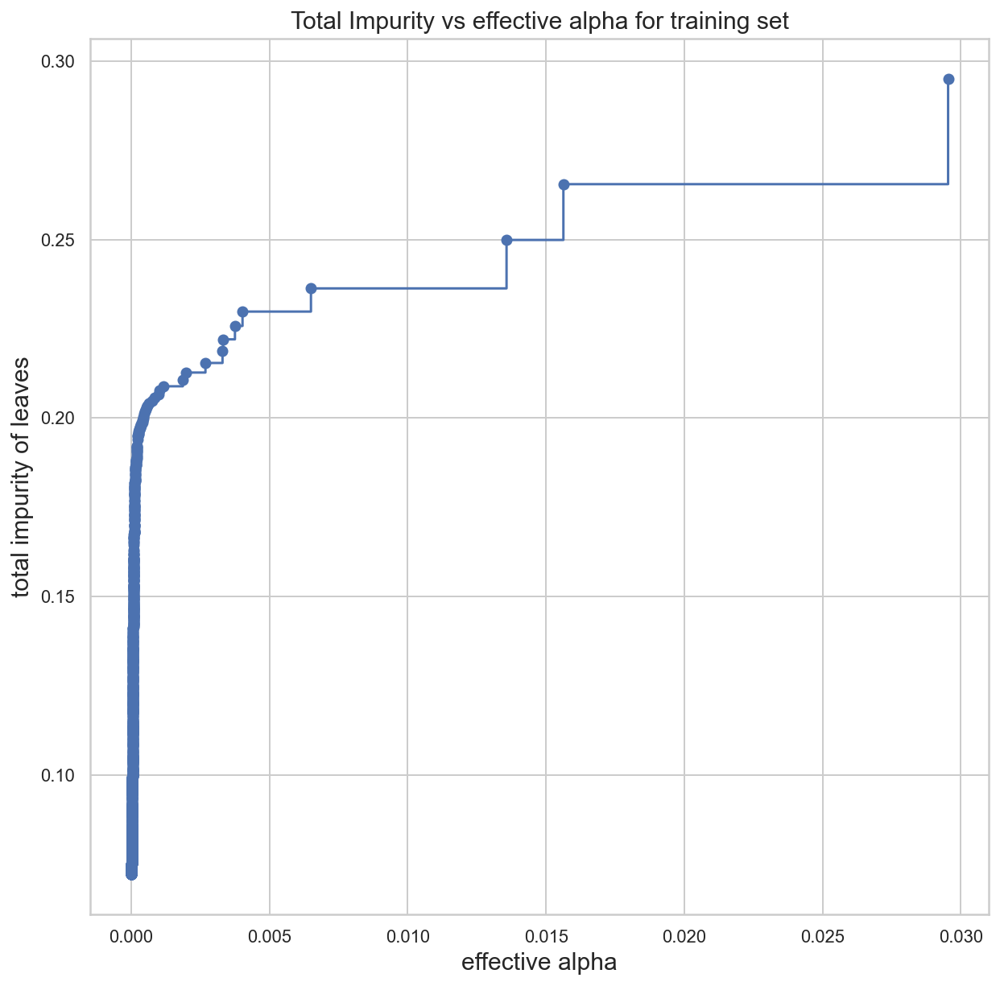

In [156]:
fig, ax = plt.subplots(figsize = (10,10))
ax.plot(ccp_alphas[:-1], impurities[:-1], marker='o', drawstyle="steps-post")
ax.set_xlabel("effective alpha", fontsize=15)
ax.set_ylabel("total impurity of leaves", fontsize=15)
ax.set_title("Total Impurity vs effective alpha for training set", fontsize=15)

In [157]:
#a função abaixo não aceitava ccp_alphas menores que 0
ccp_alphas=ccp_alphas[ccp_alphas>0]

In [158]:
trees = []
for ccp_alpha in ccp_alphas:
    dt_alpha = DecisionTreeClassifier(random_state=42, ccp_alpha=ccp_alpha).fit(X_train, y_train)
    trees.append(dt_alpha)
print("Number of nodes in the last tree is: {} with ccp_alpha: {}".format(trees[-1].tree_.node_count, ccp_alphas[-1]))

Number of nodes in the last tree is: 1 with ccp_alpha: 0.0667089762462657


In [159]:
trees = trees[:-1]
ccp_alphas = ccp_alphas[:-1]

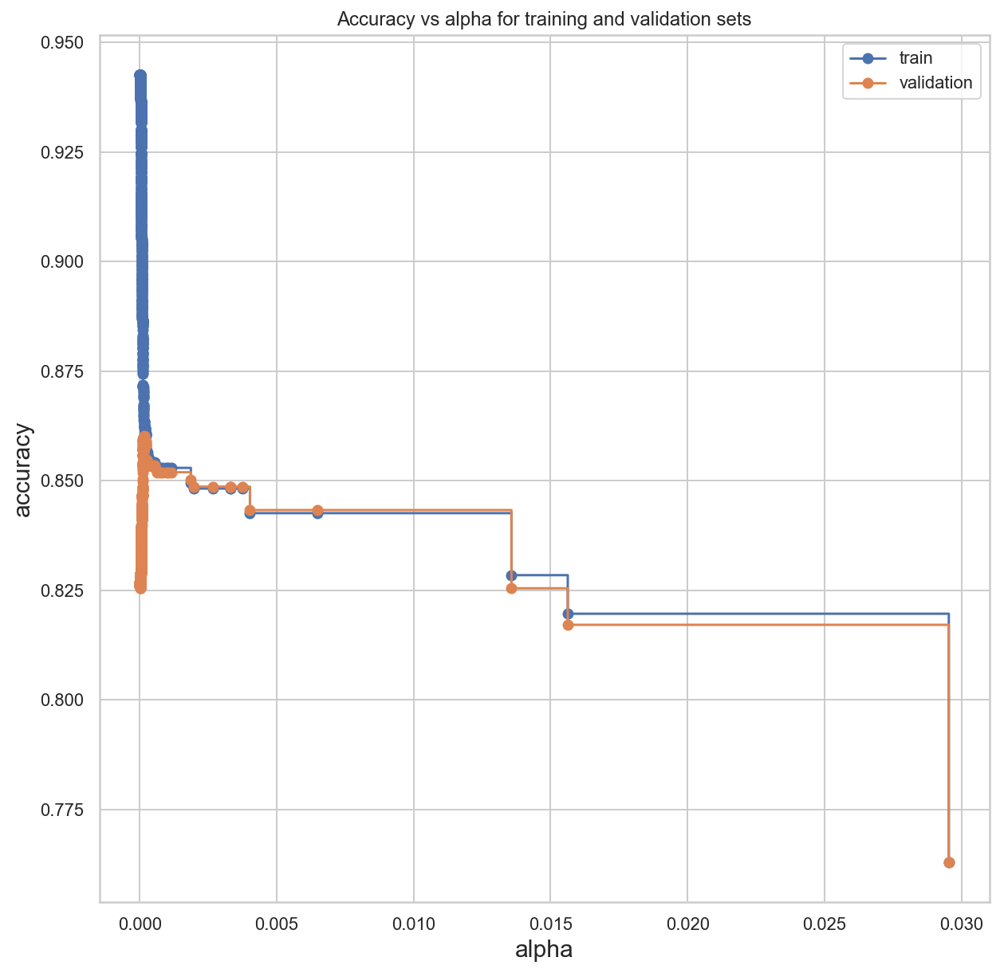

In [160]:
train_scores = [tree.score(X_train, y_train) for tree in trees]
val_scores = [tree.score(X_val, y_val) for tree in trees]

fig, ax = plt.subplots(figsize = (10,10))
ax.set_xlabel("alpha", fontsize=15)
ax.set_ylabel("accuracy", fontsize=15)
ax.set_title("Accuracy vs alpha for training and validation sets")
ax.plot(ccp_alphas, train_scores, marker='o', label="train", drawstyle="steps-post")
ax.plot(ccp_alphas, val_scores, marker='o', label="validation", drawstyle="steps-post")
ax.legend()
plt.show()

In [161]:
index_best_model = np.argmax(val_scores)
best_model = trees[index_best_model]
print('ccp_alpha of best model: ',trees[index_best_model])
print('_____________________________________________________________')
print('Training accuracy of best model: ',best_model.score(X_train, y_train))
print('Validation accuracy of best model: ',best_model.score(X_val, y_val))

ccp_alpha of best model:  DecisionTreeClassifier(ccp_alpha=0.00015941340116873795, random_state=42)
_____________________________________________________________
Training accuracy of best model:  0.8626913265306122
Validation accuracy of best model:  0.8602678571428571


In [166]:
dt_t1=DecisionTreeClassifier(min_impurity_decrease=0.0001,max_depth = 6,min_samples_split = 350,min_weight_fraction_leaf = 0.002,random_state=42).fit(X_train, y_train)
dt_t2=DecisionTreeClassifier(max_depth = 6,min_weight_fraction_leaf = 0.002,random_state=42).fit(X_train, y_train)
dt_t3=DecisionTreeClassifier(min_samples_split = 350,min_weight_fraction_leaf = 0.002,random_state=42).fit(X_train, y_train)
dt_t4=DecisionTreeClassifier(max_depth = 6,min_samples_split = 350,min_weight_fraction_leaf = 0.002,random_state=42).fit(X_train, y_train)

In [167]:
print('Train accuracy:',dt_t1.score(X_train, y_train))
print('Validation accuracy:',dt_t1.score(X_val, y_val))

Train accuracy: 0.851594387755102
Validation accuracy: 0.8504464285714286


In [168]:
print('Train accuracy:',dt_t2.score(X_train, y_train))
print('Validation accuracy:',dt_t2.score(X_val, y_val))

Train accuracy: 0.8529336734693878
Validation accuracy: 0.8519345238095238


In [169]:
print('Train accuracy:',dt_t3.score(X_train, y_train))
print('Validation accuracy:',dt_t3.score(X_val, y_val))

Train accuracy: 0.8537627551020408
Validation accuracy: 0.8520833333333333


In [170]:
print('Train accuracy:',dt_t4.score(X_train, y_train))
print('Validation accuracy:',dt_t4.score(X_val, y_val))

Train accuracy: 0.851594387755102
Validation accuracy: 0.8504464285714286


In [200]:
# Criando ainda a tree dada como melhor pelo ccp_alpha:
dt_t5=DecisionTreeClassifier(ccp_alpha=0.000159, random_state=42).fit(X_train, y_train)

print('Train accuracy:',dt_t5.score(X_train, y_train))
print('Validation accuracy:',dt_t5.score(X_val, y_val))

Train accuracy: 0.8630102040816326
Validation accuracy: 0.8601190476190477


In [196]:
#changing the threshold improves or not the accuracy......?
threshold = 0.4

predicted_proba = dt_2.predict_proba(X_val)
predicted = (predicted_proba [:,1] >= threshold).astype('int')

accuracy = accuracy_score(y_val, predicted)
accuracy

0.8550595238095238

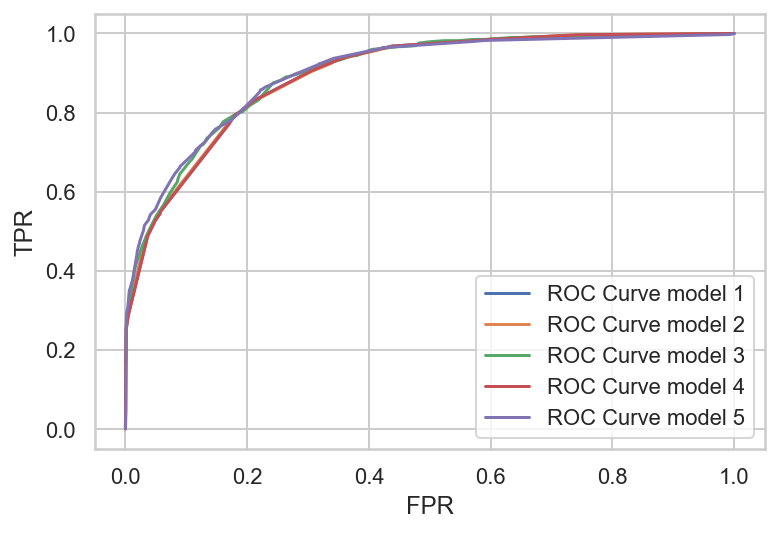

In [172]:
# To build the ROC curve
prob_model1 = dt_t1.predict_proba(X_val)
prob_model2 = dt_t2.predict_proba(X_val)
prob_model3 = dt_t3.predict_proba(X_val)
prob_model4 = dt_t4.predict_proba(X_val)
prob_model5 = dt_t5.predict_proba(X_val)

fpr_1, tpr_1, thresholds_1 = roc_curve(y_val, prob_model1[:, 1])
fpr_2, tpr_2, thresholds_2 = roc_curve(y_val, prob_model2[:, 1])
fpr_3, tpr_3, thresholds_3 = roc_curve(y_val, prob_model3[:, 1])
fpr_4, tpr_4, thresholds_4 = roc_curve(y_val, prob_model4[:, 1])
fpr_5, tpr_5, thresholds_5 = roc_curve(y_val, prob_model5[:, 1])


plt.plot(fpr_1, tpr_1, label="ROC Curve model 1")
plt.plot(fpr_2, tpr_2, label="ROC Curve model 2")
plt.plot(fpr_3, tpr_3, label="ROC Curve model 3")
plt.plot(fpr_4, tpr_4, label="ROC Curve model 4")
plt.plot(fpr_5, tpr_5, label="ROC Curve model 5")
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.legend()
plt.show()

# deu super semelhante, difícil ver qual o melhor

O melhor é a decision tree 5, com o único parâmetro alterado o ccp_alpha

In [165]:
labels_train = dt_t5.predict(X_train)
labels_val = dt_t5.predict(X_val) 

metrics(y_train, labels_train, y_val, labels_val)

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.96      0.91     11962
           1       0.81      0.55      0.66      3718

    accuracy                           0.86     15680
   macro avg       0.84      0.76      0.79     15680
weighted avg       0.86      0.86      0.85     15680

[[11476   486]
 [ 1662  2056]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.96      0.91      5127
           1       0.80   

In [175]:
# Isto é só para ver a complexidade da árvore
print('The "best" tree has a depth of ' + str(dt_t5.get_depth()) + ', ' + str(dt_t5.tree_.node_count) + 
       ' nodes and a total of ' + str(dt_t5.get_n_leaves()) + ' leaves.')

The "best" tree has a depth of 17, 171 nodes and a total of 86 leaves.


In [202]:
# Código para fazer as previsões no test!

# Confirmar sempre se o test já está normalizado
# min_max_scaler = preprocessing.MinMaxScaler()
# metric_scaled = min_max_scaler.fit_transform(test.values)
# test= pd.DataFrame(metric_scaled, columns=test.columns, index=test.index)

# Citizen=df_test['CITIZEN_ID']
# labels_test= dt_t5.predict(test)
# prediction=pd.concat([Citizen, pd.DataFrame(labels_test)],axis=1)
# prediction['Income']=prediction[0]
# prediction.drop(columns=0,inplace=True)

In [203]:
# prediction.to_csv(r'C:\Users\matip\Documents\Mestrado\Machine Learning\Project\Proj\Predictions\Pred7.csv',index=False, header=True,sep=',')

## Random Forests

In [180]:
ensemble_clfs = [
    ("RandomForestClassifier, max_features='auto'",
        RandomForestClassifier(oob_score=True,
                               max_features='auto',
                               random_state=42)),
    ("RandomForestClassifier, max_features='log2'",
        RandomForestClassifier(max_features='log2',
                               oob_score=True,
                               random_state=42)),
    ("RandomForestClassifier, max_features=6",
        RandomForestClassifier(max_features=6,
                               oob_score=True,
                               random_state=42)),
    ("RandomForestClassifier, max_features=None",
        RandomForestClassifier(max_features=None,
                               oob_score=True,
                               random_state=42))
]

In [181]:
from collections import OrderedDict

# Map a classifier name to a list of (<n_estimators>, <error rate>) pairs.
error_rate = OrderedDict((label, []) for label, _ in ensemble_clfs)

# Range of `n_estimators` values to explore.
min_estimators = 15
max_estimators = 175 #225

for label, clf in ensemble_clfs:
    for i in range(min_estimators, max_estimators + 1):
        clf.set_params(n_estimators=i)
        clf.fit(X_train, y_train)

        # Record the OOB error for each `n_estimators=i` setting.
        oob_error = 1 - clf.oob_score_
        error_rate[label].append((i, oob_error))

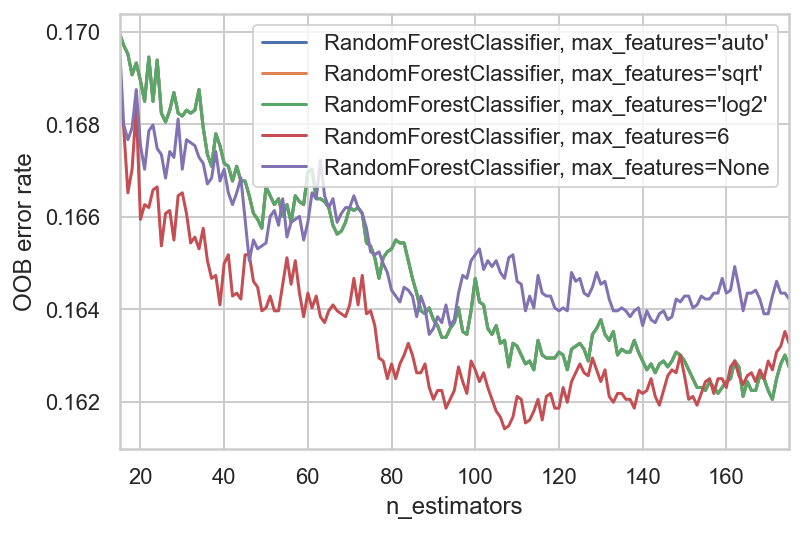

In [182]:
# Generate the "OOB error rate" vs. "n_estimators" plot.
for label, clf_err in error_rate.items():
    xs, ys = zip(*clf_err)
    plt.plot(xs, ys, label=label)

plt.xlim(min_estimators, max_estimators)
plt.xlabel("n_estimators")
plt.ylabel("OOB error rate")
plt.legend(loc="upper right")
plt.show()

In [340]:
rf_1= RandomForestClassifier(min_samples_split = 350, min_weight_fraction_leaf = 0.002,random_state=42).fit(X_train, y_train)
rf_2= RandomForestClassifier(ccp_alpha=0.000159, random_state=42).fit(X_train, y_train)
rf_3= RandomForestClassifier(max_depth = 6, min_weight_fraction_leaf = 0.002, random_state=42).fit(X_train, y_train)
rf_4= RandomForestClassifier(n_estimators=110, max_depth=6, random_state = 42).fit(X_train, y_train)
rf_5 = RandomForestClassifier(n_estimators=110, max_depth=6, max_features = 6, random_state = 42).fit(X_train, y_train)

In [184]:
print('Train accuracy:',rf_1.score(X_train, y_train))
print('Validation accuracy:',rf_1.score(X_val, y_val))

Train accuracy: 0.8541454081632653
Validation accuracy: 0.8540178571428572


In [341]:
print('Train accuracy:',rf_2.score(X_train, y_train))
print('Validation accuracy:',rf_2.score(X_val, y_val))

Train accuracy: 0.8790816326530613
Validation accuracy: 0.8572916666666667


In [193]:
print('Train accuracy:',rf_3.score(X_train, y_train))
print('Validation accuracy:',rf_3.score(X_val, y_val))

Train accuracy: 0.8533801020408164
Validation accuracy: 0.8519345238095238


In [195]:
print('Train accuracy:',rf_4.score(X_train, y_train))
print('Validation accuracy:',rf_4.score(X_val, y_val))

Train accuracy: 0.8551658163265307
Validation accuracy: 0.8517857142857143


In [200]:
print('Train accuracy:',rf_5.score(X_train, y_train))
print('Validation accuracy:',rf_5.score(X_val, y_val))

Train accuracy: 0.8557397959183674
Validation accuracy: 0.8529761904761904


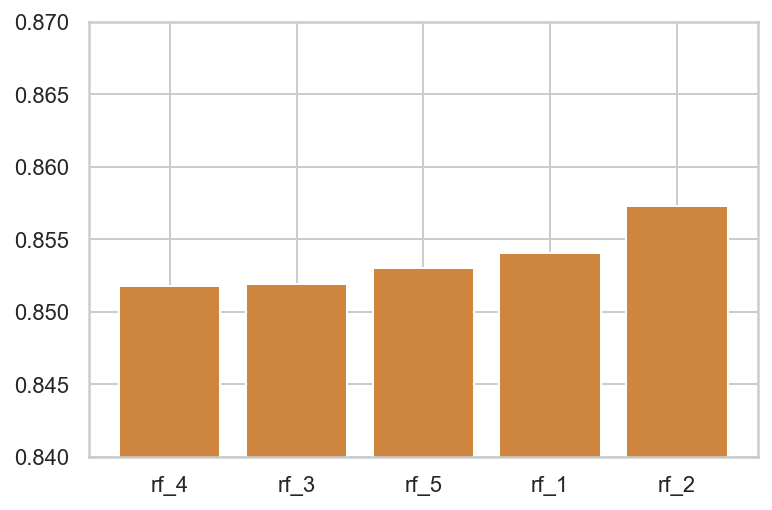

In [201]:
models = ['rf_1', 'rf_2', 'rf_3','rf_4','rf_5']

accuracies = [rf_1.score(X_val, y_val), rf_2.score(X_val, y_val), rf_3.score(X_val, y_val), rf_4.score(X_val, y_val),rf_5.score(X_val, y_val)]

data_tuples = list(zip(models,accuracies))

data = pd.DataFrame(data_tuples)
data = data.sort_values(1)

plt.bar(data[0], data[1], color='peru')
plt.ylim(0.84, 0.87)
plt.show()

In [343]:
labels_train = rf_2.predict(X_train)
labels_val = rf_2.predict(X_val) 

metrics(y_train, labels_train, y_val, labels_val)
#predict values for X_test, ex: p o citizen em X_test [0] estamos a prever y[0]->0

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.89      0.96      0.92     11962
           1       0.82      0.63      0.71      3718

    accuracy                           0.88     15680
   macro avg       0.86      0.79      0.82     15680
weighted avg       0.88      0.88      0.87     15680

[[11454   508]
 [ 1388  2330]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.88      0.95      0.91      5127
           1       0.77   

In [198]:
#changing the threshold does not seem to improve the accuracy of the best random forest!
threshold = 0.4

predicted_proba = rf_2.predict_proba(X_val)
predicted = (predicted_proba [:,1] >= threshold).astype('int')

accuracy = accuracy_score(y_val, predicted)
accuracy

0.8571428571428571

In [344]:
from sklearn.metrics import f1_score

f1_score(y_val, labels_val, average='micro')

0.8572916666666667

In [345]:
# Código para fazer as previsões no test!

# Confirmar sempre se o test já está normalizado
# min_max_scaler = preprocessing.MinMaxScaler()
# metric_scaled = min_max_scaler.fit_transform(test.values)
# test= pd.DataFrame(metric_scaled, columns=test.columns, index=test.index)

# Citizen=df_test['CITIZEN_ID']
# labels_test= rf_2.predict(test)
# prediction=pd.concat([Citizen, pd.DataFrame(labels_test)],axis=1)
# prediction['Income']=prediction[0]
# prediction.drop(columns=0,inplace=True)

In [346]:
# prediction.to_csv(r'C:\Users\matip\Documents\Mestrado\Machine Learning\Project\Proj\Predictions\Pred3.csv',index=False, header=True,sep=',')
# Pelo Kaggle este deu 0.84059

## Logistic Regression

In [242]:
#importing and defining the model
log_model = LogisticRegression(random_state=4)

In [243]:
log_model.fit(X_train,y_train) #fit model to our train data

LogisticRegression(random_state=4)

In [244]:
labels_train = log_model.predict(X_train)
log_model.score(X_train, y_train)

0.8422831632653062

In [246]:
#Predict class labels for samples in X
labels_val = log_model.predict(X_val) 
log_model.score(X_val, y_val)
#predict values for X_test, ex: p o citizen em X_test [0] estamos a prever y[0]->0

0.8450892857142858

In [156]:
pred_prob = log_model.predict_proba(X_val) 
pred_prob 
#o cutoff normalmente é de 0.5, mas as vezes é preferivel considerar menos

array([[0.77539968, 0.22460032],
       [0.98820754, 0.01179246],
       [0.48078694, 0.51921306],
       ...,
       [0.77977821, 0.22022179],
       [0.2111217 , 0.7888783 ],
       [0.92778066, 0.07221934]])

In [157]:
X_train.columns

Index(['Male', 'x1_Management', 'x1_Professor', 'x2_Married', 'x2_Single',
       'x5_1', 'x5_3', 'Years of Education', 'Money Received', 'Ticket Price',
       'Age', 'Working hours * Years of Education'],
      dtype='object')

In [158]:
log_model.coef_
#since we dont have the residuals, we cannot use the OLS, not applied to logistic regression
#c estes valores so conseguimos dizer q se for + a curva é p cima, - para baixo

array([[ 0.20713477,  0.79360677,  0.49667638,  2.15371552, -0.46836093,
         4.25245138, -0.42555478,  4.23855478,  2.37394443,  1.86944684,
         1.59418237,  4.05710623]])

In [163]:
#apagar
#from sklearn.metrics import accuracy_score
#from sklearn.metrics import precision_score #The best value is 1, and the worst value is 0
#from sklearn.metrics import f1_score #F1 score reaches its best value at 1 and worst score at 0

In [247]:
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ['Raw'])
show_results(df, log_model)

,Time,Train,Validation,Iterations
Raw,0.112+/-0.02,0.843+/-0.0,0.843+/-0.01,58.9+/-5.4


In [159]:
metrics(y_train, labels_train, y_val, labels_val)

#ability of the classifier to not label a sample as positive if it is negative
#recall: ability of the classifier to find all the positive samples
#bad model: from all the dataset, what are the ones we are getting right
#f1: weighted harmonic mean of the precision and recall

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.94      0.90     11962
           1       0.73      0.53      0.62      3718

    accuracy                           0.84     15680
   macro avg       0.80      0.74      0.76     15680
weighted avg       0.83      0.84      0.83     15680

[[11225   737]
 [ 1736  1982]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.94      0.90      5127
           1       0.74   

## Gaussian Naive Bayes

In [155]:
#modelNB = GaussianNB() # train score: 0.8112 validation score: 0.8153
#modelNB = GaussianNB(var_smoothing=0.0001)  #train score: 0.8126 validation score: 0.8175
modelNB = GaussianNB(var_smoothing=0.001) # train score: 0.81996 validation score: 0.82425
modelNB.fit(X = X_train, y = y_train)
labels_train = modelNB.predict(X_train)
labels_val = modelNB.predict(X_val)
modelNB.predict_proba(X_val)

array([[9.99697778e-01, 3.02222484e-04],
       [9.99999301e-01, 6.98977699e-07],
       [8.15278926e-01, 1.84721074e-01],
       ...,
       [9.99936666e-01, 6.33343805e-05],
       [2.75805861e-01, 7.24194139e-01],
       [9.99962068e-01, 3.79321579e-05]])

In [173]:
print("train score:", modelNB.score(X_train, y_train))
print("validation score:",modelNB.score(X_val, y_val))

train score: 0.8199617346938776
validation score: 0.8242559523809524


In [ ]:
# Para ver unbalancedness, média e variância para cada 
print(modelNB.class_prior_) #prob 0, prob 1
print(modelNB.class_count_)#n 0, n 1
# modelNB.theta_
# modelNB.sigma_

In [255]:
df = pd.DataFrame(columns = ['Time','Train','Validation'], index = ['Raw'])
show_results_1(df, modelNB)

,Time,Train,Validation
Raw,0.01+/-0.0,0.82+/-0.0,0.82+/-0.01


In [175]:
metrics(y_train, labels_train, y_val, labels_val)

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.83      0.95      0.89     11962
           1       0.72      0.39      0.51      3718

    accuracy                           0.82     15680
   macro avg       0.78      0.67      0.70     15680
weighted avg       0.81      0.82      0.80     15680

[[11393   569]
 [ 2254  1464]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.84      0.96      0.89      5127
           1       0.74   

## Neural Networks

In [302]:
model = MLPClassifier(random_state=4)
model.fit(X_train, y_train)
labels_train = model.predict(X_train)
labels_val = model.predict(X_val)

In [303]:
metrics(y_train, labels_train, y_val, labels_val)

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.88      0.94      0.91     11962
           1       0.75      0.58      0.65      3718

    accuracy                           0.85     15680
   macro avg       0.81      0.76      0.78     15680
weighted avg       0.85      0.85      0.85     15680

[[11222   740]
 [ 1556  2162]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.88      0.94      0.91      5127
           1       0.74   

In [304]:
labels_val

array([0, 0, 1, ..., 1, 1, 0], dtype=int64)

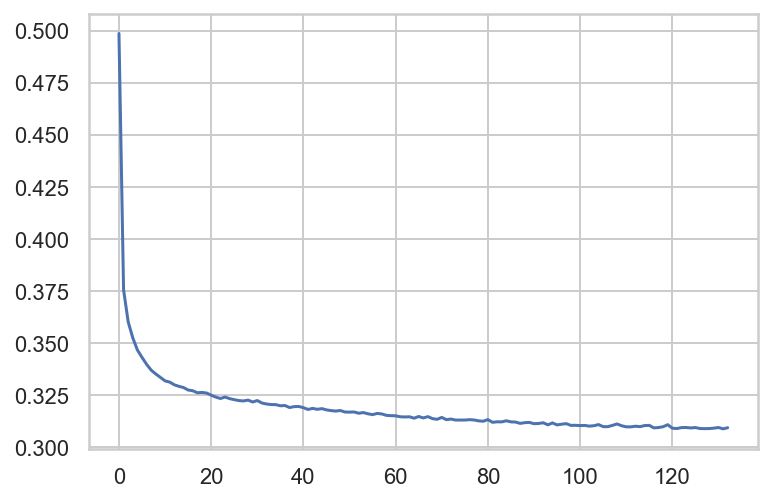

In [182]:
losses = model.loss_curve_
iterations = range(model.n_iter_)
sns.lineplot(iterations, losses)

In [183]:
model.loss_

0.3093838281848804

In [181]:
model = MLPClassifier(random_state=4)
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ['Raw'])
show_results(df, model)

,Time,Train,Val,Iterations
Raw,20.237+/-2.57,0.855+/-0.0,0.85+/-0.01,142.9+/-17.3


In [189]:
model_1 = MLPClassifier(hidden_layer_sizes=(1),random_state=4)
model_2 = MLPClassifier(hidden_layer_sizes=(3),random_state=4)
model_3 = MLPClassifier(hidden_layer_sizes=(9),random_state=4)
model_4 = MLPClassifier(hidden_layer_sizes=(3, 3),random_state=4)
model_5 = MLPClassifier(hidden_layer_sizes=(5, 5),random_state=4)
model_6 = MLPClassifier(hidden_layer_sizes=(3, 3, 3),random_state=4) #3 layers each one with 3 units

In [190]:
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ['M_1','M_2','M_3', 'M_4','M_5','M_6'])
show_results(df, model_1, model_2, model_3, model_4, model_5, model_6)

,Time,Train,Val,Iterations
M_1,3.916+/-0.22,0.843+/-0.0,0.843+/-0.01,139.0+/-5.7
M_2,3.94+/-0.43,0.844+/-0.0,0.844+/-0.01,123.3+/-13.8
M_3,4.535+/-0.55,0.846+/-0.0,0.847+/-0.01,126.2+/-13.5
M_4,7.552+/-0.6,0.846+/-0.0,0.846+/-0.01,175.3+/-12.8
M_5,9.747+/-0.87,0.85+/-0.0,0.848+/-0.01,193.1+/-11.3
M_6,8.23+/-1.6,0.848+/-0.0,0.847+/-0.01,149.4+/-30.5


In [191]:
model_7 = MLPClassifier(hidden_layer_sizes=(4, 4)+,random_state=4)
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ['M_7'])
show_results(df, model_7)

,Time,Train,Val,Iterations
M_7,8.547+/-0.55,0.848+/-0.0,0.847+/-0.01,188.8+/-10.0


1, 5, 6, 7 -> overfitting
O melhor é o 3
Agora M5 também é muito bom mas um pitz de overfitting-> testar M_3, M_5 e depois M_6

In [192]:
model_logistic = MLPClassifier(activation = 'logistic',random_state=4)
model_tanh = MLPClassifier(activation = 'tanh',random_state=4)
model_relu=MLPClassifier(activation = 'relu',random_state=4)

In [193]:
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ['logistic','tanh','relu'])
show_results(df, model_logistic, model_tanh,model_relu)

,Time,Train,Val,Iterations
logistic,7.009+/-0.87,0.844+/-0.0,0.843+/-0.01,71.1+/-6.5
tanh,22.838+/-0.82,0.85+/-0.0,0.849+/-0.01,200.0+/-0.0
relu,23.397+/-2.82,0.855+/-0.0,0.85+/-0.01,142.9+/-17.3


Logistic is better: same score in less iterations
Logistic has less overfitting than tanh, eventhough not significant

Logistic provides a nomalized output between 0 and 1
Logistic provides a nomalized output between -1 and 1

In [194]:
model_lbfgs = MLPClassifier(solver = 'lbfgs',random_state=4) #low dim and sparse data
model_sgd = MLPClassifier(solver = 'sgd',random_state=4) #accuracy > processing time
model_adam = MLPClassifier(solver = 'adam',random_state=4) # big dataset but might fail to converge

In [196]:
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ['lbfgs','sgd','adam'])
show_results(df, model_lbfgs, model_sgd, model_adam)

,Time,Train,Val,Iterations
lbfgs,24.185+/-0.81,0.853+/-0.0,0.848+/-0.01,200.0+/-0.0
sgd,30.834+/-1.94,0.843+/-0.0,0.842+/-0.01,189.8+/-10.1
adam,24.194+/-3.53,0.855+/-0.0,0.85+/-0.01,142.9+/-17.3


Adam is the best however it has a little overfitting, therefore we will test adam and sgd (less overfitt)

In [197]:
model_constant = MLPClassifier(solver = 'sgd', learning_rate = 'constant',random_state=4)
model_invscaling = MLPClassifier(solver = 'sgd', learning_rate = 'invscaling',random_state=4)
model_adaptive = MLPClassifier(solver = 'sgd', learning_rate = 'adaptive',random_state=4)

In [198]:
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ['constant','invscaling','adaptive'])
show_results(df, model_constant, model_invscaling, model_adaptive)

,Time,Train,Val,Iterations
constant,32.217+/-2.34,0.843+/-0.0,0.842+/-0.01,189.8+/-10.1
invscaling,3.437+/-0.3,0.763+/-0.0,0.763+/-0.01,20.0+/-0.0
adaptive,32.341+/-1.68,0.843+/-0.0,0.842+/-0.01,200.0+/-0.0


Constant is the better

In [199]:
model_a = MLPClassifier(solver = 'adam', learning_rate_init = 0.5,random_state=4) #qt maior mais rapido aprende o modelo
model_b = MLPClassifier(solver = 'adam', learning_rate_init = 0.1,random_state=4)
model_c = MLPClassifier(solver = 'adam', learning_rate_init = 0.01,random_state=4) #se for mt pequeno pode ficar preso numa solucao subotima e pode nunca convergir
model_d = MLPClassifier(solver = 'adam', learning_rate_init = 0.001,random_state=4)

In [200]:
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ['M_a','M_b','M_c', "M_d"])
show_results(df, model_a, model_b, model_c, model_d)

,Time,Train,Val,Iterations
M_a,3.602+/-0.96,0.842+/-0.01,0.841+/-0.01,22.0+/-5.5
M_b,5.775+/-0.95,0.847+/-0.01,0.849+/-0.01,37.7+/-6.0
M_c,13.97+/-4.13,0.855+/-0.0,0.85+/-0.0,100.0+/-25.0
M_d,20.178+/-2.68,0.855+/-0.0,0.85+/-0.01,142.9+/-17.3


The best is 0.1(!!!!) or 0.01 so test

In [201]:
model_e = MLPClassifier(solver = 'adam', learning_rate_init = 0.005,random_state=4)
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ["M_e"])
show_results(df, model_e)

,Time,Train,Val,Iterations
M_e,18.101+/-4.15,0.856+/-0.0,0.852+/-0.01,120.1+/-28.1


In [202]:
model_batch20 = MLPClassifier(solver = 'sgd', batch_size = 20,random_state=4)
model_batch50 = MLPClassifier(solver = 'sgd', batch_size = 50,random_state=4)
model_batch100 = MLPClassifier(solver = 'sgd', batch_size = 100,random_state=4)
model_batch200 = MLPClassifier(solver = 'sgd', batch_size = 200,random_state=4)
model_batch500 = MLPClassifier(solver = 'sgd', batch_size = 500,random_state=4)

In [203]:
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ['batch 20','batch 50','batch 100', 'batch 200', 'batch 500'])
show_results(df, model_batch20, model_batch50, model_batch100,  model_batch200, model_batch500)

,Time,Train,Val,Iterations
batch 20,60.46+/-2.85,0.848+/-0.0,0.846+/-0.01,193.9+/-9.8
batch 50,52.394+/-10.32,0.845+/-0.0,0.844+/-0.01,183.1+/-34.6
batch 100,27.726+/-1.79,0.844+/-0.0,0.843+/-0.01,151.3+/-7.7
batch 200,25.611+/-1.59,0.843+/-0.0,0.842+/-0.01,189.8+/-10.1
batch 500,20.813+/-0.49,0.838+/-0.0,0.837+/-0.01,200.0+/-0.0


The best one is batch 50

In [204]:
model_maxiter_50 = MLPClassifier(max_iter = 50,random_state=4)
model_maxiter_100 = MLPClassifier(max_iter = 100,random_state=4)
model_maxiter_200 = MLPClassifier(max_iter = 200,random_state=4)
model_maxiter_300 = MLPClassifier(max_iter = 300,random_state=4)

In [205]:
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ['max iter 50','max iter 100','max iter 200', 'max iter 300'])
show_results(df, model_maxiter_50, model_maxiter_100, model_maxiter_200, model_maxiter_300)

,Time,Train,Val,Iterations
max iter 50,6.779+/-0.13,0.851+/-0.0,0.849+/-0.01,50.0+/-0.0
max iter 100,13.894+/-0.4,0.854+/-0.0,0.85+/-0.01,100.0+/-0.0
max iter 200,19.708+/-2.41,0.855+/-0.0,0.85+/-0.01,142.9+/-17.3
max iter 300,19.896+/-2.42,0.855+/-0.0,0.85+/-0.01,142.9+/-17.3


In [206]:
model_maxiter_150 = MLPClassifier(max_iter = 150,random_state=4)
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ['max iter 150'])
show_results(df, model_maxiter_150)

,Time,Train,Val,Iterations
max iter 150,19.374+/-2.42,0.854+/-0.0,0.85+/-0.01,138.6+/-13.2


In [207]:
model_all=MLPClassifier(hidden_layer_sizes=(9),activation = 'logistic',solver = 'adam',learning_rate_init = 0.1,batch_size = 50,random_state=4)
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ['Raw'])
show_results(df, model_all)

,Time,Train,Val,Iterations
Raw,3.596+/-1.49,0.845+/-0.0,0.842+/-0.01,33.0+/-13.4


In [160]:
model_grid=model_all=MLPClassifier(activation= 'logistic', batch_size= 100, hidden_layer_sizes=(9), learning_rate_init= 0.02102040816326531, max_iter= 150, solver= 'adam',random_state=4)
df = pd.DataFrame(columns = ['Time','Train','Validation','Iterations'], index = ['Raw'])
show_results(df, model_grid)

,Time,Train,Val,Iterations
Raw,6.953+/-0.97,0.851+/-0.0,0.842+/-0.01,71.6+/-10.3


In [208]:
# parameter_space1 = {
#     'hidden_layer_sizes': [(9),(5,5),(3, 3, 3)],
#     'activation': ['logistic','relu'],
#     'solver': ['lbfgs', 'adam'],
#     'learning_rate_init': [0.001,0.002,0.003,0.004,0.005,0.006,0.007,0.008,0.009,0.01],
#     'batch_size': [(20),(50)], 
#     'max_iter': [(150),(200)],
# }
# clf1 = GridSearchCV(model, parameter_space1,n_jobs=-1)
# clf1.fit(X_train, y_train)

GridSearchCV(estimator=MLPClassifier(random_state=4), n_jobs=-1,
             param_grid={'activation': ['logistic', 'relu'],
                         'batch_size': [20, 50],
                         'hidden_layer_sizes': [9, (5, 5), (3, 3, 3)],
                         'learning_rate_init': [0.001, 0.002, 0.003, 0.004,
                                                0.005, 0.006, 0.007, 0.008,
                                                0.009, 0.01],
                         'max_iter': [150, 200], 'solver': ['lbfgs', 'adam']})

In [209]:
# clf1.best_params_

{'activation': 'relu',
 'batch_size': 20,
 'hidden_layer_sizes': (5, 5),
 'learning_rate_init': 0.004,
 'max_iter': 150,
 'solver': 'adam'}

In [337]:
modelNN_best=MLPClassifier(activation= 'relu',batch_size= 20, hidden_layer_sizes= (5, 5),learning_rate_init= 0.004,max_iter= 150,solver= 'adam')
df= pd.DataFrame(columns = ['Time','Train','Val', 'Iterations'], index = ['Raw'])
show_results(df, modelNN_best)

,Time,Train,Val,Iterations
Raw,43.549+/-9.55,0.85+/-0.0,0.849+/-0.01,88.3+/-20.7


In [212]:
# # Best parameter set
# print('------------------------------------------------------------------------------------------------------------------------')
# print('Best parameters found:\n', clf1.best_params_)
# print('------------------------------------------------------------------------------------------------------------------------')

# # All results
# means = clf1.cv_results_['mean_test_score']
# stds = clf1.cv_results_['std_test_score']
# for mean, std, params in zip(means, stds, clf1.cv_results_['params']):
#     print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

------------------------------------------------------------------------------------------------------------------------
Best parameters found:
 {'activation': 'relu', 'batch_size': 20, 'hidden_layer_sizes': (5, 5), 'learning_rate_init': 0.004, 'max_iter': 150, 'solver': 'adam'}
------------------------------------------------------------------------------------------------------------------------
0.848 (+/-0.005) for {'activation': 'logistic', 'batch_size': 20, 'hidden_layer_sizes': 9, 'learning_rate_init': 0.001, 'max_iter': 150, 'solver': 'lbfgs'}
0.844 (+/-0.008) for {'activation': 'logistic', 'batch_size': 20, 'hidden_layer_sizes': 9, 'learning_rate_init': 0.001, 'max_iter': 150, 'solver': 'adam'}
0.849 (+/-0.006) for {'activation': 'logistic', 'batch_size': 20, 'hidden_layer_sizes': 9, 'learning_rate_init': 0.001, 'max_iter': 200, 'solver': 'lbfgs'}
0.844 (+/-0.009) for {'activation': 'logistic', 'batch_size': 20, 'hidden_layer_sizes': 9, 'learning_rate_init': 0.001, 'max_iter': 

In [338]:
# Model with best accuracy
labels_train = modelNN_best.predict(X_train)
labels_val = modelNN_best.predict(X_val)
metrics(y_train, labels_train, y_val, labels_val)

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.85      0.96      0.90     11962
           1       0.80      0.46      0.58      3718

    accuracy                           0.84     15680
   macro avg       0.83      0.71      0.74     15680
weighted avg       0.84      0.84      0.83     15680

[[11537   425]
 [ 2012  1706]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.86      0.97      0.91      5127
           1       0.81   

In [339]:
from sklearn.metrics import f1_score

f1_score(y_val, labels_val, average='micro')

0.8495535714285715

## KNN

The number K is typically chosen as the square root of the total number of points in the training data set. Thus, in this case, N is 15680, so K = 125.

Text(0, 0.5, 'Validation Accuracy')

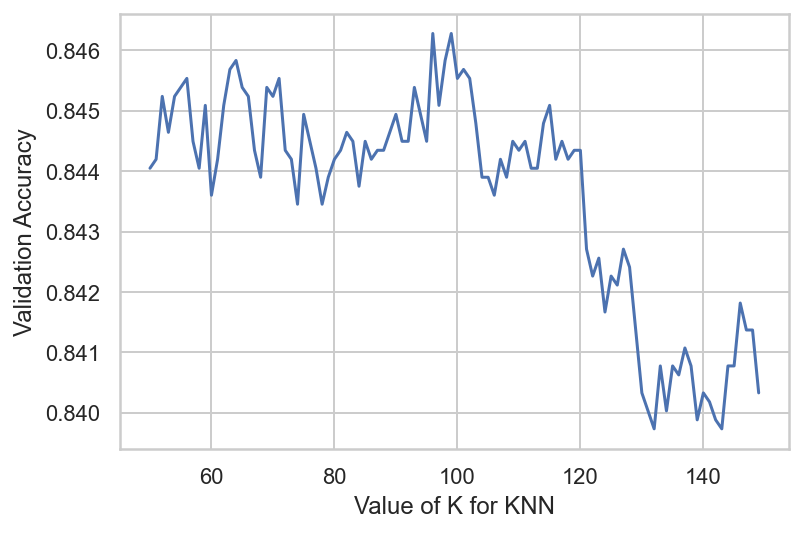

In [199]:
# try K=50 through K=150 and record testing accuracy
k_range = range(50, 150)

scores = []

# We use a loop through the range
# We append the scores in the list
for k in k_range:
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, y_train)
    y_pred = knn.predict(X_val)
    scores.append(accuracy_score(y_val, y_pred))

# plot the relationship between K and testing accuracy
plt.plot(k_range, scores)
plt.xlabel('Value of K for KNN')
plt.ylabel('Validation Accuracy')

In [215]:
modelKNN1 = KNeighborsClassifier().fit(X = X_train, y = y_train)

In [216]:
print("train score:", modelKNN1.score(X_train, y_train))
print("validation score:",modelKNN1.score(X_val, y_val))

train score: 0.8746173469387755
validation score: 0.8373511904761904


In [217]:
modelKNN2 = KNeighborsClassifier(n_neighbors=100).fit(X = X_train, y = y_train)

In [218]:
print("train score:", modelKNN2.score(X_train, y_train))
print("validation score:",modelKNN2.score(X_val, y_val))

train score: 0.8450255102040817
validation score: 0.8455357142857143


In [219]:
#from the available algorithms (excluding the default), this was the best one
modelKNN3 = KNeighborsClassifier(n_neighbors=100, algorithm='ball_tree').fit(X = X_train, y = y_train)

In [220]:
print("train score:", modelKNN3.score(X_train, y_train))
print("validation score:",modelKNN3.score(X_val, y_val))

train score: 0.8452806122448979
validation score: 0.8459821428571429


In [221]:
modelKNN4 = KNeighborsClassifier(n_neighbors=100, p=1).fit(X = X_train, y = y_train)

In [222]:
print("train score:", modelKNN4.score(X_train, y_train))
print("validation score:",modelKNN4.score(X_val, y_val))

train score: 0.8454081632653061
validation score: 0.8464285714285714


In [223]:
modelKNN5 = KNeighborsClassifier(n_neighbors=100, weights='distance').fit(X = X_train, y = y_train)

In [224]:
print("train score:", modelKNN5.score(X_train, y_train))
print("validation score:",modelKNN5.score(X_val, y_val))

train score: 0.9426658163265306
validation score: 0.8369047619047619


In [225]:
modelKNN6 = KNeighborsClassifier(n_neighbors=100, algorithm='ball_tree', p=1).fit(X = X_train, y = y_train)

In [226]:
print("train score:", modelKNN6.score(X_train, y_train))
print("validation score:",modelKNN6.score(X_val, y_val))

train score: 0.8454081632653061
validation score: 0.846875


In [256]:
df = pd.DataFrame(columns = ['Time','Train','Validation'], index = ['modelKNN1', 'modelKNN2', 'modelKNN3', 'modelKNN4', 'modelKNN5', 'modelKNN6'])
show_results_1(df, modelKNN1, modelKNN2, modelKNN3, modelKNN4, modelKNN5, modelKNN6)

,Time,Train,Validation
modelKNN1,0.391+/-0.06,0.874+/-0.0,0.833+/-0.01
modelKNN2,0.394+/-0.06,0.846+/-0.0,0.842+/-0.01
modelKNN3,0.321+/-0.05,0.846+/-0.0,0.842+/-0.01
modelKNN4,0.367+/-0.02,0.848+/-0.0,0.845+/-0.01
modelKNN5,0.345+/-0.02,0.94+/-0.0,0.833+/-0.01
modelKNN6,0.317+/-0.02,0.848+/-0.0,0.845+/-0.01


In [293]:
# Model with best accuracy
labels_train = modelKNN6.predict(X_train)
labels_val = modelKNN6.predict(X_val)
metrics(y_train, labels_train, y_val, labels_val)

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.93      0.90     11962
           1       0.72      0.57      0.63      3718

    accuracy                           0.85     15680
   macro avg       0.80      0.75      0.77     15680
weighted avg       0.84      0.85      0.84     15680

[[11150   812]
 [ 1612  2106]]
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
------------------------------------------------------------------------------------------------------

## Passive Aggressive Classifier (Extra)

In [ ]:
# Creating and fitting model
pac_basic = PassiveAggressiveClassifier(random_state=42)
pac_basic.fit(X_train, y_train)

pac_1 = PassiveAggressiveClassifier(C=0.001, fit_intercept=True, tol=1e-2, loss='squared_hinge',random_state=42)
pac_1.fit(X_train, y_train)

pac_2 = PassiveAggressiveClassifier(C=0.001, tol=1e-2, loss='squared_hinge',random_state=42)
pac_2.fit(X_train, y_train)

pac_3 = PassiveAggressiveClassifier(C=0.001, tol=1e-2, random_state=42)
pac_3.fit(X_train, y_train)

In [193]:
# Making prediction on the validation set 
val_pred_basic = pac_basic.predict(X_val)
val_pred_1 = pac_1.predict(X_val)
val_pred_2 = pac_2.predict(X_val)
val_pred_3 = pac_3.predict(X_val)

In [257]:
df = pd.DataFrame(columns = ['Time','Train','Validation','Iterations'], index = ['PAC_Basic','PAC_1','PAC_2','PAC_3'])
show_results(df, pac_basic, pac_1, pac_2, pac_3)

,Time,Train,Validation,Iterations
PAC_Basic,0.033+/-0.01,0.734+/-0.08,0.736+/-0.08,11.5+/-3.7
PAC_1,0.026+/-0.01,0.841+/-0.0,0.841+/-0.01,7.6+/-0.5
PAC_2,0.025+/-0.01,0.841+/-0.0,0.841+/-0.01,7.6+/-0.5
PAC_3,0.03+/-0.01,0.838+/-0.0,0.837+/-0.0,8.0+/-0.0


In [195]:
labels_train = pac_1.predict(X_train)
accuracy_score(y_train, labels_train)

labels_val = pac_1.predict(X_val)
accuracy_score(y_val, labels_val)

metrics(y_train, labels_train, y_val, labels_val)

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.84      0.97      0.90     11962
           1       0.80      0.41      0.55      3718

    accuracy                           0.84     15680
   macro avg       0.82      0.69      0.72     15680
weighted avg       0.83      0.84      0.82     15680

[[11587   375]
 [ 2180  1538]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.84      0.97      0.90      5127
           1       0.80   

In [196]:
# Model evaluation of the best PAC model
# print(f"Validation Set Accuracy : {accuracy_score(y_val, val_pred_1) * 100} %\n\n")   
  
# print(f"Classification Report : \n\n{classification_report(y_val, val_pred_1)}")

## Linear Discriminant Analysis

In [159]:
modelLDA = LinearDiscriminantAnalysis()
modelLDA.fit(X = X_train, y = y_train)
labels_train = modelLDA.predict(X_train)
labels_val = modelLDA.predict(X_val)
modelLDA.predict_proba(X_val)

array([[0.82721028, 0.17278972],
       [0.99408815, 0.00591185],
       [0.47144428, 0.52855572],
       ...,
       [0.72618119, 0.27381881],
       [0.22534779, 0.77465221],
       [0.95639608, 0.04360392]])

In [161]:
print("train score:", modelLDA.score(X_train, y_train))
print("validation score:",modelLDA.score(X_val, y_val))

train score: 0.8401147959183674
validation score: 0.8425595238095238


In [179]:
from sklearn.model_selection import GridSearchCV
# define grid
grid = dict()
grid['solver'] = ['svd', 'lsqr', 'eigen']
# define search
search = GridSearchCV(modelLDA, grid, scoring='accuracy', n_jobs=-1)
# perform the search
results = search.fit(X_train, y_train)
# summarize
print('Mean Accuracy: %.3f' % results.best_score_)
print('Config: %s' % results.best_params_)

Mean Accuracy: 0.840
Config: {'solver': 'lsqr'}


In [180]:
from numpy import arange
grid = dict()
grid['shrinkage'] = arange(0, 1, 0.01)
grid['solver']=['svd', 'lsqr', 'eigen'] #svd cannot be tested with shrinkage
# define search
search = GridSearchCV(modelLDA, grid, scoring='accuracy', n_jobs=-1)
# perform the search
results = search.fit(X_train, y_train)
# summarize
print('Mean Accuracy: %.3f' % results.best_score_)
print('Config: %s' % results.best_params_)

Mean Accuracy: 0.840
Config: {'shrinkage': 0.0, 'solver': 'lsqr'}


In [166]:
modelLDA_final = LinearDiscriminantAnalysis(solver='lsqr')
modelLDA_final.fit(X = X_train, y = y_train)
labels_train = modelLDA_final.predict(X_train)
labels_val = modelLDA_final.predict(X_val)
print("train score:", modelLDA_final.score(X_train, y_train))
print("validation score:",modelLDA_final.score(X_val, y_val))

train score: 0.8401147959183674
validation score: 0.8425595238095238


In [ ]:
metrics(y_train, labels_train, y_val, labels_val)

## Quadratic Discriminant Analysis

In [160]:
modelQDA = QuadraticDiscriminantAnalysis()
modelQDA.fit(X = X_train, y = y_train)
labels_train = modelQDA.predict(X_train)
labels_val = modelQDA.predict(X_val)
modelQDA.predict_proba(X_val)

array([[9.99714494e-01, 2.85506288e-04],
       [9.99999600e-01, 3.99624824e-07],
       [9.60581659e-01, 3.94183409e-02],
       ...,
       [9.99443273e-01, 5.56726951e-04],
       [9.23887352e-01, 7.61126477e-02],
       [9.99997128e-01, 2.87230751e-06]])

In [182]:
print("train score:", modelQDA.score(X_train, y_train))
print("validation score:",modelQDA.score(X_val, y_val))

train score: 0.8095025510204081
validation score: 0.8159226190476191


In [183]:
# define grid
grid = dict()
grid['reg_param'] = arange(0, 1, 0.01)
# define search
search = GridSearchCV(modelQDA, grid, scoring='accuracy', n_jobs=-1)
# perform the search
results = search.fit(X_train, y_train)
# summarize
print('Mean Accuracy: %.3f' % results.best_score_)
print('Config: %s' % results.best_params_)

Mean Accuracy: 0.833
Config: {'reg_param': 0.14}


In [164]:
modelQDA_final = QuadraticDiscriminantAnalysis(reg_param=0.14)
modelQDA_final.fit(X = X_train, y = y_train)
labels_train = modelQDA_final.predict(X_train)
labels_val = modelQDA_final.predict(X_val)
print("train score:", modelQDA_final.score(X_train, y_train))
print("validation score:",modelQDA_final.score(X_val, y_val))

train score: 0.8341198979591836
validation score: 0.8394345238095238


In [ ]:
metrics(y_train, labels_train, y_val, labels_val)

## Support Vector Machine

In [409]:
# # try C=250 through K=1250 and record testing accuracy
# C_range = range(250, 1250)

# scores = []

# # We use a loop through the range
# # We append the scores in the list
# for c in C_range:
#     svm = SVC(C=c)
#     svm.fit(X_train, y_train)
#     y_pred = svm.predict(X_val)
#     scores.append(accuracy_score(y_val, y_pred))

# # plot the relationship between C and testing accuracy
# plt.plot(C_range, scores)
# plt.xlabel('Value of C for the SVM')
# plt.ylabel('Validation Accuracy')

In [414]:
modelSVM_basic = SVC().fit(X_train, y_train)
modelSVM_1 = SVC(kernel='linear').fit(X_train, y_train)
modelSVM_2 = SVC(C=750).fit(X_train, y_train)
modelSVM_3 = SVC(kernel = 'poly').fit(X_train, y_train)
modelSVM_4 = SVC(C=750, kernel = 'poly').fit(X_train, y_train)
modelSVM_5 = SVC(C=750, kernel = 'linear').fit(X_train, y_train)
modelSVM_6 = SVC(C=750, shrinking=False).fit(X_train, y_train)
modelSVM_7 = SVC(C=750, tol=1e-2).fit(X_train, y_train)

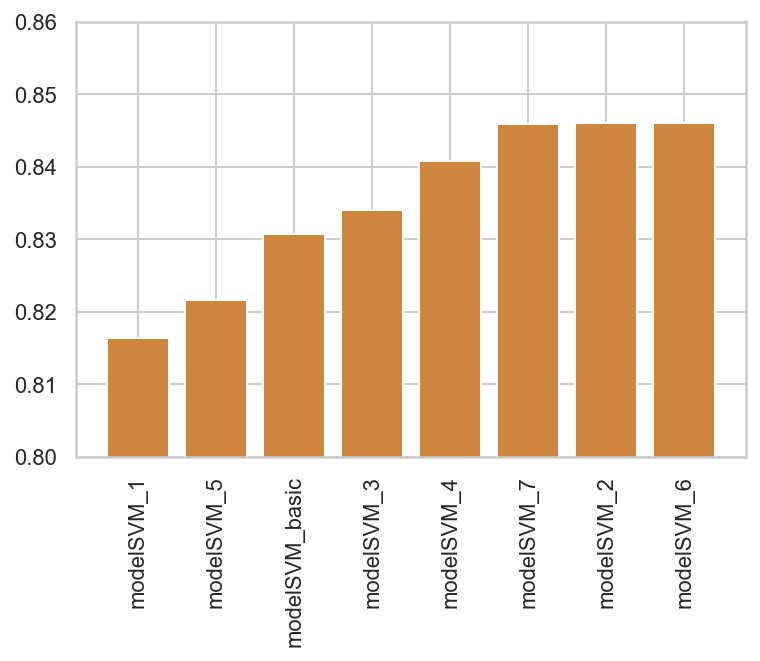

In [415]:
accuracies = [modelSVM_basic.score(X_val, y_val), modelSVM_1.score(X_val, y_val),
              modelSVM_2.score(X_val, y_val), modelSVM_3.score(X_val, y_val),
              modelSVM_4.score(X_val, y_val), modelSVM_5.score(X_val, y_val),
              modelSVM_6.score(X_val, y_val), modelSVM_7.score(X_val, y_val)]

models = ['modelSVM_basic', 'modelSVM_1', 'modelSVM_2', 'modelSVM_3', 
          'modelSVM_4', 'modelSVM_5', 'modelSVM_6', 'modelSVM_7']

data_tuples = list(zip(models,accuracies))

data = pd.DataFrame(data_tuples)

data = data.sort_values(1)

plt.bar(data[0], data[1], color='peru')
plt.xticks(rotation=90)
plt.ylim(0.80,0.86)

plt.show()

In [416]:
# highest accuracy from the SVMs
modelSVM_6.score(X_val, y_val)

0.8460315883580014

In [417]:
pred_train_svm = modelSVM_6.predict(X_train)
pred_val_svm = modelSVM_6.predict(X_val)
metrics(y_train, pred_train_svm, y_val, pred_val_svm)

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.91      0.78      0.84     11962
           1       0.80      0.92      0.86     11525

    accuracy                           0.85     23487
   macro avg       0.86      0.85      0.85     23487
weighted avg       0.86      0.85      0.85     23487

[[ 9298  2664]
 [  908 10617]]
____________________________________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.91      0.78      0.84      5127
           1       0.80   

### AdaBoost Classifier

The best train value is  87
The best val value is  87


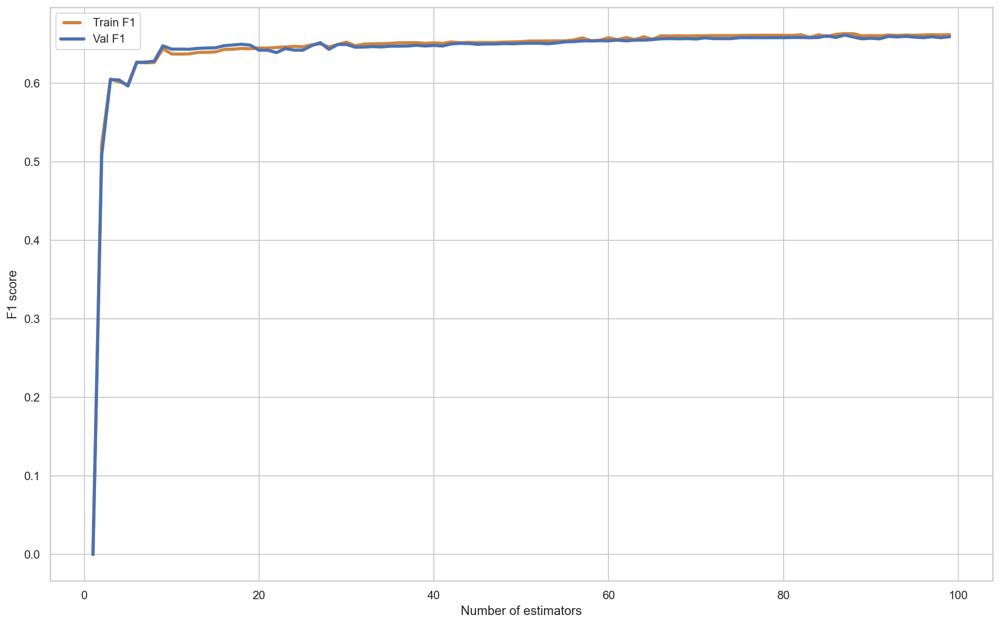

In [233]:
def calculate_f1(interval, x_train, x_val, y_train, y_val, parameter):
    train_results = []
    val_results = []
    for value in interval:
        if parameter == 'Number of estimators':
            dt = AdaBoostClassifier(n_estimators = value, random_state = 5)
        elif parameter == 'Learning Rate':
            dt = AdaBoostClassifier(learning_rate = value, random_state = 5)
        dt.fit(x_train, y_train)
        train_results.append(f1_score(y_train,dt.predict(x_train)))
        val_results.append(f1_score(y_val,dt.predict(x_val)))
    value_train = train_results.index(max(train_results))
    value_val = val_results.index(max(val_results))
    print('The best train value is ',interval[value_train])
    print('The best val value is ',interval[value_val])

    fig = plt.figure(figsize = (16,10))
    line1, = plt.plot(interval, train_results, '#515C60', label="Train F1", linewidth=3,color='peru')
    line2, = plt.plot(interval, val_results, '#C7DC1F', label="Val F1", linewidth=3,color='b')
    plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
    plt.ylabel("F1 score")
    plt.xlabel(str(parameter))
    plt.show()
    
num_estimators = list(range(1,100))
calculate_f1(num_estimators, X_train, X_val, y_train, y_val,'Number of estimators')

The best train value is  1.26
The best val value is  1.26


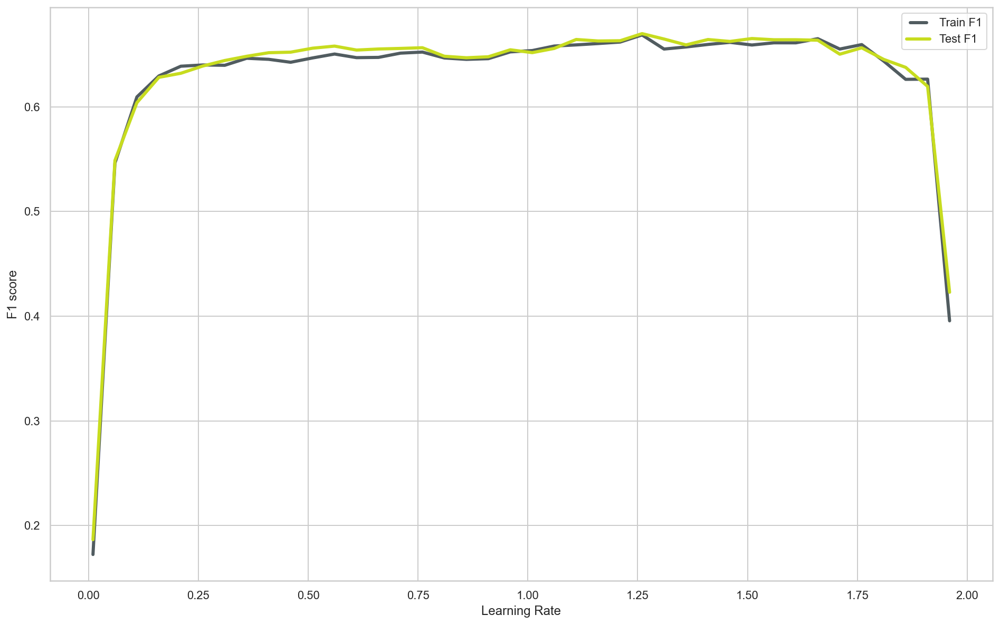

In [158]:
learning_rate = list(np.arange(0.01, 2, 0.05))
calculate_f1(learning_rate, X_train, X_val, y_train, y_val,'Learning Rate')


In [170]:
# AdaBoost = AdaBoostClassifier()

# AdaBoost_parameters = {'base_estimator' : [None, modelNB, modelQDA_final, pac_1, modelLDA_final],
#                         'n_estimators' : list(range(1,100)),
#                         'learning_rate' : np.arange(0.5, 1.5, 0.05),
#                         'algorithm' : ['SAMME', 'SAMME.R']}

# AdaBoost_grid = GridSearchCV(estimator=AdaBoost, param_grid=AdaBoost_parameters, 
#                               scoring='accuracy', verbose=1, n_jobs=-1)

# AdaBoost_grid.fit(X_train , y_train)
# AdaBoost_grid.best_params_

Fitting 5 folds for each of 19800 candidates, totalling 99000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   19.5s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:   24.6s
[Parallel(n_jobs=-1)]: Done 434 tasks      | elapsed:   49.8s
[Parallel(n_jobs=-1)]: Done 784 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 1234 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 1784 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 2434 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 3184 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 4034 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 4984 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 6034 tasks      | elapsed:  8.2min
[Parallel(n_jobs=-1)]: Done 7184 tasks      | elapsed:  9.8min
[Parallel(n_jobs=-1)]: Done 8434 tasks      | elapsed: 11.9min
[Parallel(n_jobs=-1)]: Done 9784 tasks      | elapsed: 13.6min
[Parallel(n_jobs=-1)]: Done 11234 tasks      |

{'algorithm': 'SAMME.R',
 'base_estimator': None,
 'learning_rate': 1.2000000000000006,
 'n_estimators': 98}

In [182]:
modelAdaBoost = AdaBoostClassifier(base_estimator=None, n_estimators=98, learning_rate=1.2, algorithm='SAMME.R', random_state=5)
modelAdaBoost.fit(X_train,y_train)

AdaBoostClassifier(learning_rate=1.2, n_estimators=98, random_state=5)

In [183]:
labels_train = modelAdaBoost.predict(X_train)
accuracy_score(y_train, labels_train)

0.8597576530612245

In [184]:
labels_val = modelAdaBoost.predict(X_val)
accuracy_score(y_val, labels_val)

0.8607142857142858

In [260]:
df= pd.DataFrame(columns = ['Time','Train','Validation'], index = ['Raw'])
show_results_1(df, modelAdaBoost)

,Time,Train,Validation
Raw,0.882+/-0.04,0.86+/-0.0,0.859+/-0.01


In [177]:
metrics(y_train, labels_train, y_val, labels_val)

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.88      0.94      0.91     11962
           1       0.77      0.59      0.67      3718

    accuracy                           0.86     15680
   macro avg       0.82      0.77      0.79     15680
weighted avg       0.85      0.86      0.85     15680

[[11297   665]
 [ 1534  2184]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.88      0.95      0.91      5127
           1       0.77   

### Gradient Boosting Classifier

In [190]:
def calculate_f1_2(interval, x_train, x_val, y_train, y_val, parameter):
    train_results = []
    val_results = []
    for value in interval:
        if parameter == 'Number of estimators':
            dt = GradientBoostingClassifier(n_estimators = value, random_state = 5)
        elif parameter == 'Learning Rate':
            dt = GradientBoostingClassifier(learning_rate = value, random_state = 5)
        dt.fit(x_train, y_train)
        train_results.append(f1_score(y_train,dt.predict(x_train)))
        val_results.append(f1_score(y_val,dt.predict(x_val)))
    value_train = train_results.index(max(train_results))
    value_val = val_results.index(max(val_results))
    print('The best train value is ',interval[value_train])
    print('The best val value is ',interval[value_val])

    fig = plt.figure(figsize = (16,10))
    line1, = plt.plot(interval, train_results, '#515C60', label="Train F1", linewidth=3,color='peru')
    line2, = plt.plot(interval, val_results, '#C7DC1F', label="Val F1", linewidth=3,color='b')
    plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
    plt.ylabel("F1 score")
    plt.xlabel(str(parameter))
    plt.show()

The best train value is  1.1
The best val value is  0.7500000000000001


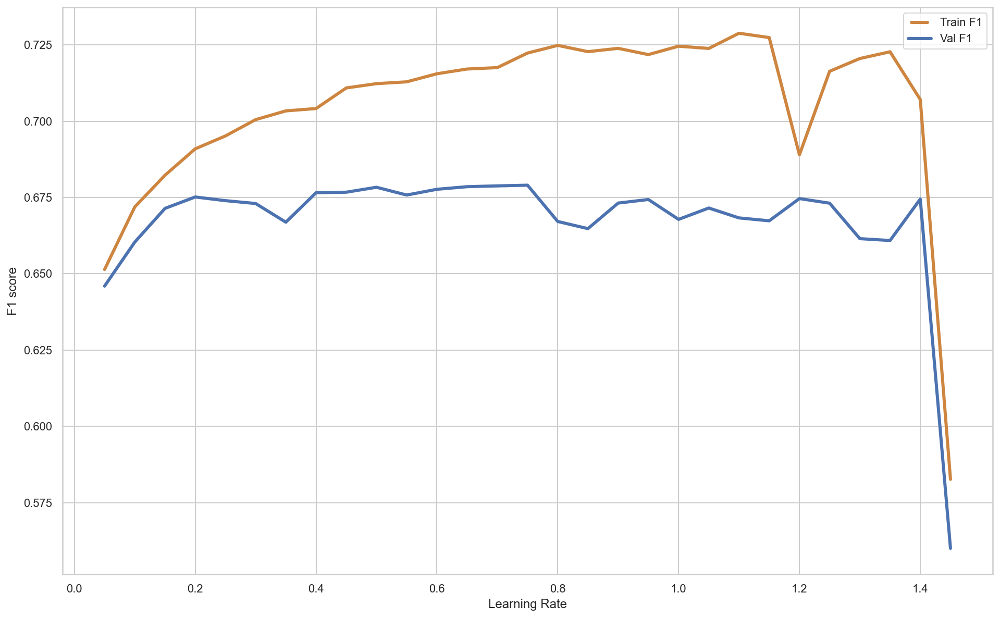

In [191]:
learning_rate = list(np.arange(0.05, 1.5, 0.05))
calculate_f1_2(learning_rate, X_train, X_val, y_train, y_val,'Learning Rate')

The best train value is  0.8
The best val value is  0.7500000000000001


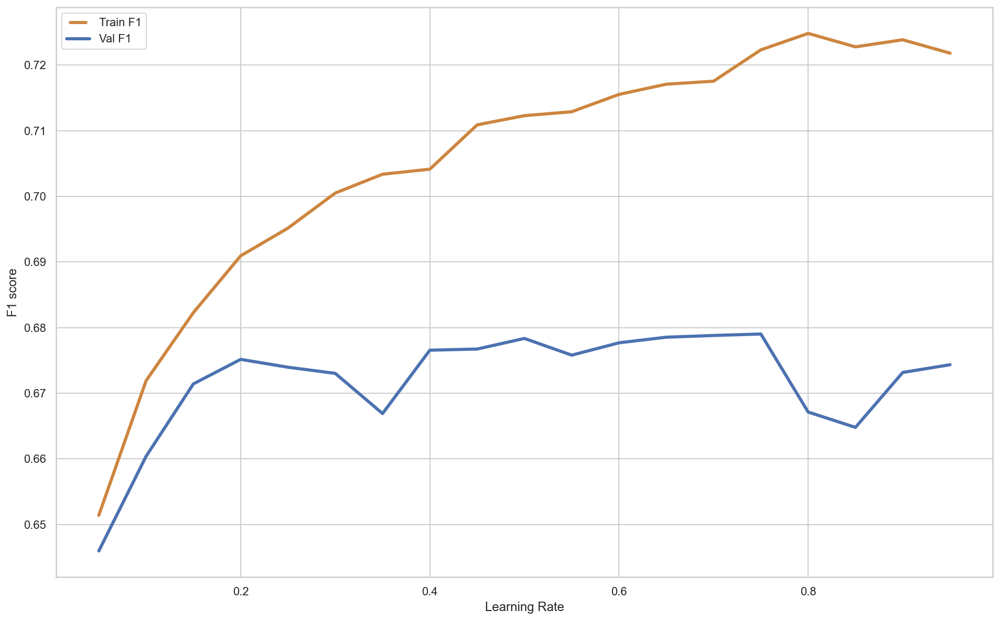

In [198]:
learning_rate = list(np.arange(0.05, 1, 0.05))
calculate_f1_2(learning_rate, X_train, X_val, y_train, y_val,'Learning Rate')

The best train value is  1.1000000000000003
The best val value is  1.5500000000000007


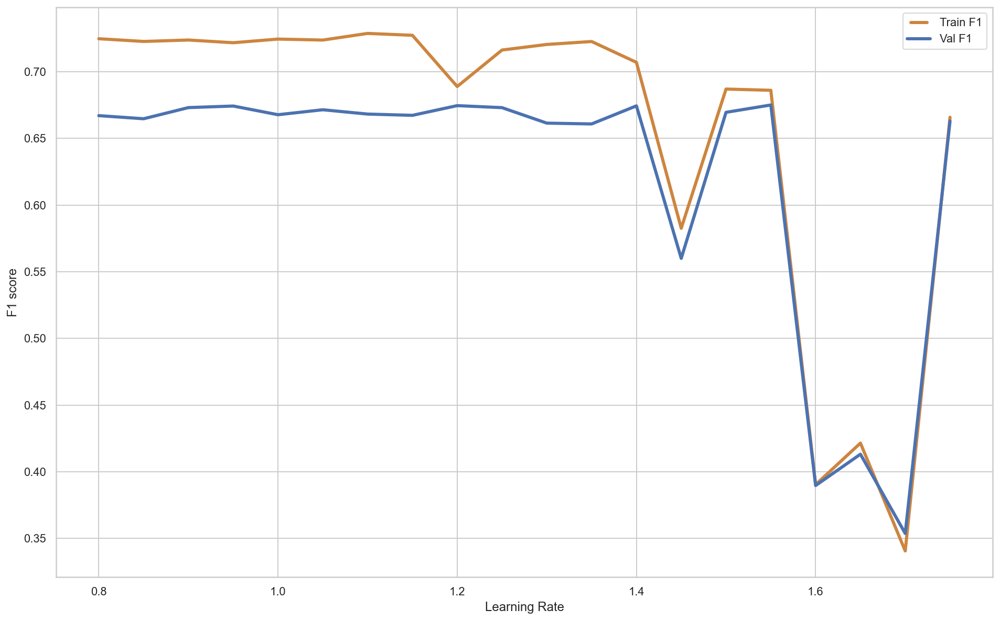

In [203]:
learning_rate = list(np.arange(0.8, 1.8, 0.05))
calculate_f1_2(learning_rate, X_train, X_val, y_train, y_val,'Learning Rate')

The best train value is  191
The best val value is  191


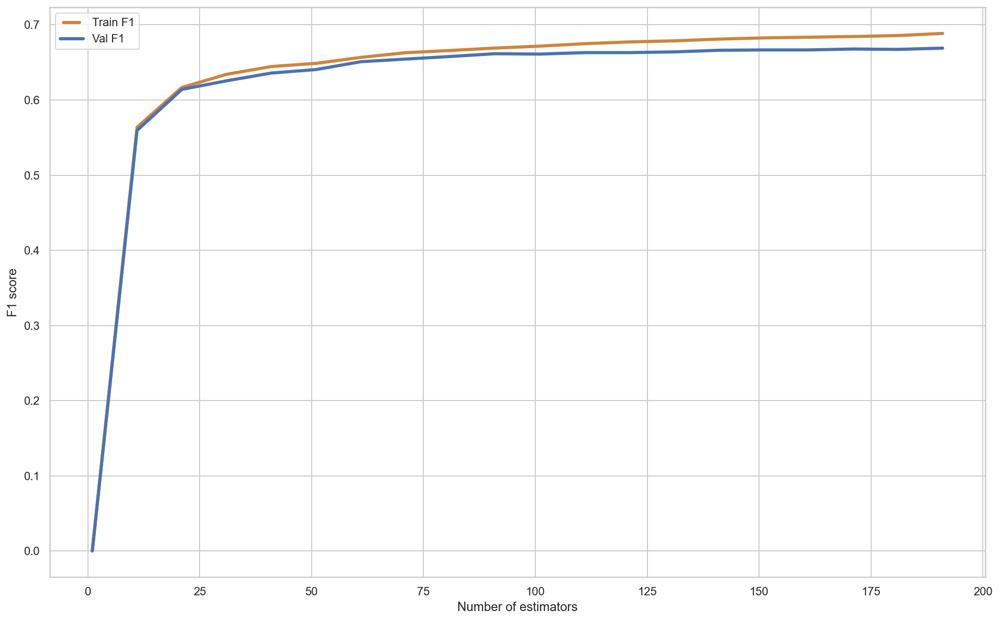

In [206]:
num_estimators = list(np.arange(1, 200, 10)) 
calculate_f1_2(num_estimators, X_train, X_val, y_train, y_val,'Number of estimators')

In [196]:
modelGBauto = GradientBoostingClassifier(max_features='auto', random_state=5)
modelGBlog = GradientBoostingClassifier(max_features='log2',random_state=5)
modelGBsqrt = GradientBoostingClassifier(max_features='sqrt',random_state=5)
modelGBnone = GradientBoostingClassifier(max_features=None,random_state=5)

In [197]:
df= pd.DataFrame(columns = ['Time','Train','Validation'], index = ['Auto','Log2','Sqrt','None/Raw'])
show_results_1(df, modelGBauto, modelGBlog, modelGBsqrt, modelGBnone)

,Time,Train,Validation
Auto,1.321+/-0.05,0.864+/-0.0,0.86+/-0.01
Log2,0.638+/-0.02,0.861+/-0.0,0.857+/-0.01
Sqrt,0.636+/-0.01,0.861+/-0.0,0.857+/-0.01
None/Raw,1.355+/-0.07,0.864+/-0.0,0.86+/-0.01


In [199]:
modelGBdev = GradientBoostingClassifier(loss='deviance', random_state=5)
modelGBexp = GradientBoostingClassifier(loss='exponential',random_state=5)

In [200]:
df= pd.DataFrame(columns = ['Time','Train','Validation'], index = ['deviance','exponential'])
show_results_1(df, modelGBdev, modelGBexp)

,Time,Train,Validation
deviance,1.426+/-0.1,0.864+/-0.0,0.86+/-0.01
exponential,1.466+/-0.09,0.863+/-0.0,0.86+/-0.01


In [207]:
modelGB2 = GradientBoostingClassifier(max_depth=2, random_state=5)
modelGB3 = GradientBoostingClassifier(max_depth=3,random_state=5)
modelGB10 = GradientBoostingClassifier(max_depth=10,random_state=5)
modelGB30 = GradientBoostingClassifier(max_depth=30,random_state=5)
modelGB50 = GradientBoostingClassifier(max_depth=50,random_state=5)

In [208]:
df= pd.DataFrame(columns = ['Time','Train','Validation'], index = ['model2','model3','model10','model30','model50'])
show_results_1(df, modelGB2, modelGB3,modelGB10,modelGB30,modelGB50)

,Time,Train,Validation
model2,0.996+/-0.04,0.859+/-0.0,0.857+/-0.01
model3,1.277+/-0.01,0.864+/-0.0,0.86+/-0.01
model10,5.767+/-0.17,0.922+/-0.0,0.852+/-0.01
model30,25.803+/-0.36,0.94+/-0.0,0.827+/-0.01
model50,25.752+/-0.35,0.94+/-0.0,0.828+/-0.01


In [210]:
GB_clf = GradientBoostingClassifier()

GB_parameters = {'loss' : [ 'exponential'],
                   'learning_rate' : np.arange(1.0, 1.6, 0.05),
                   'n_estimators' : np.arange(150, 200, 5),
                   'max_depth' : np.arange(2, 10, 1),
                   'max_features' : ['log2', None]
                }

GB_grid = GridSearchCV(estimator=GB_clf, param_grid=GB_parameters, scoring='accuracy', verbose=1, n_jobs=-1)
GB_grid.fit(X_train , y_train)
GB_grid.best_params_

Fitting 5 folds for each of 2080 candidates, totalling 10400 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   14.7s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed: 14.4min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed: 19.0min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed: 30.7min
[Parallel(n_jobs=-1)]: Done 2442 tasks      | elapsed: 44.2min
[Parallel(n_jobs=-1)]: Done 3192 tasks      | elapsed: 300.8min
[Parallel(n_jobs=-1)]: Done 4042 tasks      | elapsed: 317.5min
[Parallel(n_jobs=-1)]: Done 4992 tasks      | elapsed: 335.1min
[Parallel(n_jobs=-1)]: Done 6042 tasks      | elapsed: 354.1min
[Parallel(n_jobs=-1)]: Done 7192 tasks      | elapsed: 379.3min
[Parallel(n_jobs=-1)]: Done 8442 tasks      | elapsed: 399.1min
[Parallel(n_jobs=-1)]: Done 9792 tasks      | elapsed: 425.9min
[Parallel(n_jobs=-1)]: Done 10400 out o

{'learning_rate': 1.0,
 'loss': 'exponential',
 'max_depth': 2,
 'max_features': 'log2',
 'n_estimators': 170}

In [325]:
modelGB = GradientBoostingClassifier(learning_rate=1.0, loss='exponential', max_depth=2, max_features='log2',
                               n_estimators=170, random_state=5)
modelGB.fit(X_train, y_train)

GradientBoostingClassifier(learning_rate=1.0, loss='exponential', max_depth=2,
                           max_features='log2', n_estimators=170,
                           random_state=5)

In [326]:
labels_train = modelGB.predict(X_train)
accuracy_score(y_train, labels_train)

0.8677295918367347

In [327]:
labels_val = modelGB.predict(X_val)
accuracy_score(y_val, labels_val)

0.8639880952380953

In [328]:
from sklearn.metrics import f1_score

f1_score(y_val, labels_val, average='micro')

0.8639880952380953

In [214]:
df= pd.DataFrame(columns = ['Time','Train','Validation'], index = ['Raw'])
show_results_1(df, modelGB)

,Time,Train,Validation
Raw,1.16+/-0.15,0.868+/-0.0,0.862+/-0.01


In [215]:
metrics(y_train, labels_train, y_val, labels_val)

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.89      0.94      0.92     11962
           1       0.77      0.63      0.69      3718

    accuracy                           0.87     15680
   macro avg       0.83      0.79      0.80     15680
weighted avg       0.86      0.87      0.86     15680

[[11263   699]
 [ 1375  2343]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.89      0.94      0.91      5127
           1       0.76   

In [335]:
# Código para fazer as previsões no test!

min_max_scaler = preprocessing.MinMaxScaler()
metric_scaled = min_max_scaler.fit_transform(test.values)
test= pd.DataFrame(metric_scaled, columns=test.columns, index=test.index)

In [330]:
Citizen=df_test['CITIZEN_ID']
labels_test= modelGB.predict(test)
prediction=pd.concat([Citizen, pd.DataFrame(labels_test)],axis=1)
prediction['Income']=prediction[0]
prediction.drop(columns=0,inplace=True)

In [332]:
prediction.to_csv(r'C:\Users\matip\Documents\Mestrado\Machine Learning\Project\Proj\Predictions\Pred2.csv',index=False, header=True,sep=',')

## Voting Classifier

In [185]:
# Group of models
estimator = []
estimator.append(('GradientBoosting', GradientBoostingClassifier(learning_rate=1.0, loss='exponential', max_depth=2, 
                                                                 max_features='log2', n_estimators=170, random_state=5)))
estimator.append(('AdaBoost', AdaBoostClassifier(base_estimator=None, n_estimators=98, learning_rate=1.2, 
                                                algorithm='SAMME.R', random_state=5)))
estimator.append(('Decision Tree', DecisionTreeClassifier(ccp_alpha=0.000159, random_state=42)))
estimator.append(('Random Forest', RandomForestClassifier(ccp_alpha=0.000159, random_state=42)))
estimator.append(('SVM', SVC(C=750, shrinking=False, probability=True))) #probability is True because it's needed for
                                                                         #the soft voting

In [183]:
# Voting Classifier with hard voting (default)
voting_hard = VotingClassifier(estimators=estimator, n_jobs=-1) 
voting_hard.fit(X_train, y_train) 
y_pred_hard = voting_hard.predict(X_val)

In [186]:
# Voting Classifier with soft voting 
voting_soft = VotingClassifier(estimators=estimator, n_jobs=-1, voting='soft') 
voting_soft.fit(X_train, y_train)
y_pred_soft = voting_soft.predict(X_val)

In [187]:
#Accuracy for hard voting
print("train score:", voting_hard.score(X_train, y_train))
print("validation score:", voting_hard.score(X_val, y_val))

train score: 0.8682397959183673
validation score: 0.8620535714285714


In [188]:
#Accuracy for soft voting
print("train score:", voting_soft.score(X_train, y_train))
print("validation score:", voting_soft.score(X_val, y_val))

train score: 0.870344387755102
validation score: 0.8633928571428572


In [196]:
#Metrics for hard voting
labels_train=voting_hard.predict(X_train)
metrics(y_train, labels_train, y_val, y_pred_hard)

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.88      0.94      0.91     11962
           1       0.76      0.58      0.66      3718

    accuracy                           0.86     15680
   macro avg       0.82      0.76      0.78     15680
weighted avg       0.85      0.86      0.85     15680

[[11299   663]
 [ 1568  2150]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.95      0.91      5127
           1       0.76   

In [197]:
#Metrics for soft voting
labels_train=voting_soft.predict(X_train)
metrics(y_train, labels_train, y_val, y_pred_soft)

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.96      0.91     11962
           1       0.80      0.55      0.65      3718

    accuracy                           0.86     15680
   macro avg       0.84      0.76      0.78     15680
weighted avg       0.86      0.86      0.85     15680

[[11458   504]
 [ 1664  2054]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.96      0.91      5127
           1       0.80   

# <font color='#E8800A'>Baseline with over and under sampling</font> <a class="anchor" id="third-bullet"></a>

  [Back to First Baseline Models](#sixth-bullet)
  
  [Back to Newland](#Newland)

## Combination of SMOTE (Oversampling) and Tomek Links Undersampling

In [149]:
#pip install -U imbalanced-learn

In [531]:
from imblearn.over_sampling import SMOTENC
from imblearn.under_sampling import TomekLinks
from imblearn.combine import SMOTETomek
from collections import Counter

In [532]:
print('Original dataset shape %s' % Counter(y_train))

Original dataset shape Counter({0: 11962, 1: 3718})


In [533]:
smotenc = SMOTENC(random_state=42, categorical_features=list(range(0,7)), k_neighbors=100, n_jobs=-1)
tomek = TomekLinks(n_jobs=-1)

In [534]:
smote_tomek = SMOTETomek(sampling_strategy='all', smote=smotenc, tomek=tomek, n_jobs=-1, random_state=42)
X_train, y_train = smote_tomek.fit_resample(X_train, y_train)

In [535]:
print('Resampled dataset shape %s' % Counter(y_train))

Resampled dataset shape Counter({0: 11962, 1: 11504})


# Predictive Modelling

In [352]:
#pip install pydotplus

In [353]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix #confusion_matrix to evaluate the accuracy of a classification 
from sklearn.metrics import accuracy_score
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
import time
from sklearn.model_selection import KFold
from sklearn.tree import export_graphviz
import graphviz
import pydotplus
from sklearn.metrics import auc
from sklearn.metrics import roc_curve
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import PassiveAggressiveClassifier
from numpy import mean
from numpy import std
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, StackingClassifier
from sklearn.metrics import f1_score
import matplotlib.pyplot as plt
from matplotlib.legend_handler import HandlerLine2D
from sklearn.svm import SVC

In [354]:
# Functions to be used in all models to assess them

def metrics(y_train, pred_train , y_val, pred_val):
    print('_____________________________________')
    print('                                                     TRAIN                                                 ')
    print('-----------------------------------------------------------------------------------------------------------')
    print(classification_report(y_train, pred_train))
    print(confusion_matrix(y_train, pred_train)) #true neg and true pos, false positives and false neg
    print('__________________________+_________')
    print('                                                VALIDATION                                                 ')
    print('-----------------------------------------------------------------------------------------------------------')
    print(classification_report(y_val, pred_val))
    print(confusion_matrix(y_val, pred_val))
    
    
def avg_score(model):
    # apply kfold
    kf = KFold(n_splits=10)
    # create lists to store the results from the different models 
    score_train = []
    score_val = []
    timer = []
    n_iter = []
    for train_index, val_index in kf.split(all_selected_variables):
        # get the indexes of the observations assigned for each partition
        X_train, X_val = all_selected_variables.iloc[train_index], all_selected_variables.iloc[val_index]
        y_train, y_val = target.iloc[train_index], target.iloc[val_index]
        # start counting time
        begin = time.perf_counter()
        # fit the model to the data
        model.fit(X_train, y_train)
        # finish counting time
        end = time.perf_counter()
        # check the mean accuracy for the train
        value_train = model.score(X_train, y_train)
        # check the mean accuracy for the test
        value_val = model.score(X_val,y_val)
        # append the accuracies, the time and the number of iterations in the corresponding list
        score_train.append(value_train)
        score_val.append(value_val)
        timer.append(end-begin)
        n_iter.append(model.n_iter_)
    # calculate the average and the std for each measure (accuracy, time and number of iterations)
    avg_time = round(np.mean(timer),3)
    avg_train = round(np.mean(score_train),3)
    avg_val = round(np.mean(score_val),3)
    std_time = round(np.std(timer),2)
    std_train = round(np.std(score_train),2)
    std_val = round(np.std(score_val),2)
    avg_iter = round(np.mean(n_iter),1)
    std_iter = round(np.std(n_iter),1)
    
    return str(avg_time) + '+/-' + str(std_time), str(avg_train) + '+/-' + str(std_train),\
str(avg_val) + '+/-' + str(std_val), str(avg_iter) + '+/-' + str(std_iter)


def show_results(df, *args):
    """
    Receive an empty dataframe and the different models and call the function avg_score
    """
    count = 0
    # for each model passed as argument
    for arg in args:
        # obtain the results provided by avg_score
        time, avg_train, avg_val, avg_iter = avg_score(arg)
        # store the results in the right row
        df.iloc[count] = time, avg_train, avg_val, avg_iter
        count+=1
    return df

In [355]:
# For the models that don't have n_iter attribute

def avg_score_1(model):
    # apply kfold
    kf = KFold(n_splits=10)
    # create lists to store the results from the different models 
    score_train = []
    score_val = []
    timer = []
    n_iter = []
    for train_index, val_index in kf.split(all_selected_variables):
        # get the indexes of the observations assigned for each partition
        X_train, X_val = all_selected_variables.iloc[train_index], all_selected_variables.iloc[val_index]
        y_train, y_val = target.iloc[train_index], target.iloc[val_index]
        # start counting time
        begin = time.perf_counter()
        # fit the model to the data
        model.fit(X_train, y_train)
        # finish counting time
        end = time.perf_counter()
        # check the mean accuracy for the train
        value_train = model.score(X_train, y_train)
        # check the mean accuracy for the validation
        value_val = model.score(X_val,y_val)
        # append the accuracies, the time and the number of iterations in the corresponding list
        score_train.append(value_train)
        score_val.append(value_val)
        timer.append(end-begin)
        #n_iter.append(model.n_iter_)
    # calculate the average and the std for each measure (accuracy, time and number of iterations)
    avg_time = round(np.mean(timer),3)
    avg_train = round(np.mean(score_train),3)
    avg_val = round(np.mean(score_val),3)
    std_time = round(np.std(timer),2)
    std_train = round(np.std(score_train),2)
    std_val = round(np.std(score_val),2)
    #avg_iter = round(np.mean(n_iter),1)
    #std_iter = round(np.std(n_iter),1)
    
    return str(avg_time) + '+/-' + str(std_time), str(avg_train) + '+/-' + str(std_train),\
str(avg_val) + '+/-' + str(std_val)
#, str(avg_iter) + '+/-' + str(std_iter)


def show_results_1(df, *args):
    """
    Receive an empty dataframe and the different models and call the function avg_score
    """
    count = 0
    # for each model passed as argument
    for arg in args:
        # obtain the results provided by avg_score
        time, avg_train, avg_val = avg_score_1(arg)
        # store the results in the right row
        df.iloc[count] = time, avg_train, avg_val
        count+=1
    return df

## Decision Trees

In [236]:
def plot_tree(model_tree):
    dot_data = export_graphviz(model_tree,
                               feature_names=X_train.columns,  
                               class_names=["Income lower or equal to avg", "Income higher than avg"],
                               filled=True)
    pydot_graph = pydotplus.graph_from_dot_data(dot_data)
    pydot_graph.set_size('"20,20"')
    return graphviz.Source(pydot_graph.to_string())

In [237]:
#AUC
def calculate_AUC(interval, x_train, x_val, y_train, y_val, parameter, max_depth = None):
    train_results = []
    val_results = []
    for value in interval:
        if (parameter == 'max_depth'):          
            dt = DecisionTreeClassifier(max_depth = value, random_state=42)
            dt.fit(x_train, y_train)
        elif (parameter == 'max_features'):  
            dt = DecisionTreeClassifier(max_features = value, max_depth = max_depth, random_state=42)
            dt.fit(x_train, y_train)
        elif (parameter == 'min_samples_split'):  
            dt = DecisionTreeClassifier(min_samples_split = value, max_depth = max_depth, random_state=42)
            dt.fit(x_train, y_train)
        elif (parameter == 'min_samples_leaf'):  
            dt = DecisionTreeClassifier(min_samples_leaf = value, max_depth = max_depth, random_state=42)
            dt.fit(x_train, y_train)
        elif (parameter == 'min_weight_fraction_leaf'):  
            dt = DecisionTreeClassifier(min_weight_fraction_leaf = value, max_depth = max_depth, random_state=42)
            dt.fit(x_train, y_train)
        elif (parameter == 'min_impurity_decrease'):  
            dt = DecisionTreeClassifier(min_impurity_decrease = value, max_depth = max_depth, random_state=42)
            dt.fit(x_train, y_train)
        train_pred = dt.predict(x_train)
        false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, train_pred)
        roc_auc = auc(false_positive_rate, true_positive_rate)
        # Add auc score to previous train results
        train_results.append(roc_auc)
        y_pred = dt.predict(x_val)
        false_positive_rate, true_positive_rate, thresholds = roc_curve(y_val, y_pred)
        roc_auc = auc(false_positive_rate, true_positive_rate)
        # Add auc score to previous validation results
        val_results.append(roc_auc)
    value_train = train_results.index(max(train_results))
    value_val = val_results.index(max(val_results))
    print('The best train value is ',interval[value_train])
    print('The best validation value is ',interval[value_val])
    

    import matplotlib.pyplot as plt
    from matplotlib.legend_handler import HandlerLine2D
    line1, = plt.plot(interval, train_results, 'b', label="Train AUC")
    line2, = plt.plot(interval, val_results, 'r', label="Validation AUC")
    plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
    plt.ylabel("AUC score")
    plt.xlabel(str(parameter))
    plt.show()

In [427]:
dt_entropy = DecisionTreeClassifier(criterion = 'entropy').fit(X_train, y_train)
dt_gini = DecisionTreeClassifier(criterion = 'gini').fit(X_train, y_train)

df = pd.DataFrame(columns = ['Time','Train','Validation'], index = ['Gini','Entropy'])
show_results_1(df,dt_gini, dt_entropy)

,Time,Train,Validation
Gini,0.044+/-0.0,0.94+/-0.0,0.826+/-0.01
Entropy,0.056+/-0.0,0.94+/-0.0,0.826+/-0.01


In [428]:
dt_random = DecisionTreeClassifier(splitter = 'random').fit(X_train, y_train)

df = pd.DataFrame(columns = ['Time','Train','Validation'], index = ['best','random'])
show_results_1(df,dt_gini, dt_random)

,Time,Train,Validation
best,0.047+/-0.01,0.94+/-0.0,0.826+/-0.01
random,0.023+/-0.0,0.94+/-0.0,0.827+/-0.01


The best train value is  15.0
The best validation value is  5.0


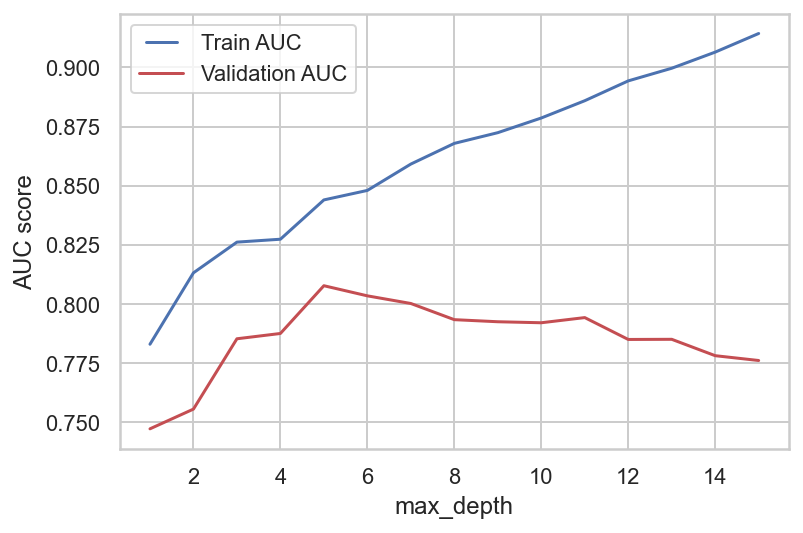

In [238]:
max_depths = np.linspace(1, 15, 15, endpoint=True)  
calculate_AUC(max_depths, X_train, X_val, y_train, y_val, 'max_depth')

In [430]:
dt_depth10 = DecisionTreeClassifier(max_depth = 10).fit(X_train, y_train)
dt_depth5 = DecisionTreeClassifier(max_depth = 5).fit(X_train, y_train)

df = pd.DataFrame(columns = ['Time','Train','Validation'], index = ['full','depth10','depth5'])
show_results_1(df,dt_gini, dt_depth10,dt_depth5)

# Quanto maior, mais overfitting! Com 6 é o melhor resultado dos 3 (menos overfitting e maior score no validation)

,Time,Train,Validation
full,0.051+/-0.01,0.94+/-0.0,0.826+/-0.01
depth10,0.035+/-0.0,0.871+/-0.0,0.853+/-0.01
depth5,0.027+/-0.01,0.85+/-0.0,0.847+/-0.01


The best train value is  11
The best validation value is  7


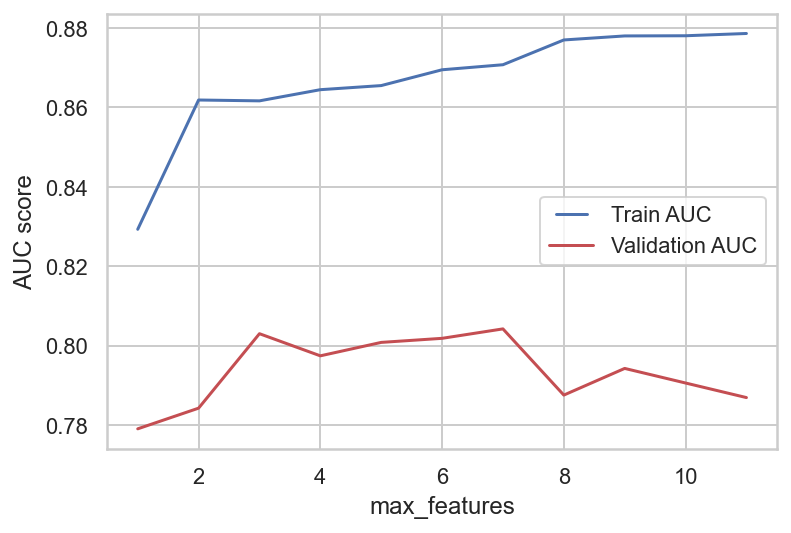

In [431]:
max_features = list(range(1,len(X_train.columns)))
calculate_AUC(max_features, X_train, X_val, y_train, y_val,'max_features', 10)

The best train value is  10
The best validation value is  234


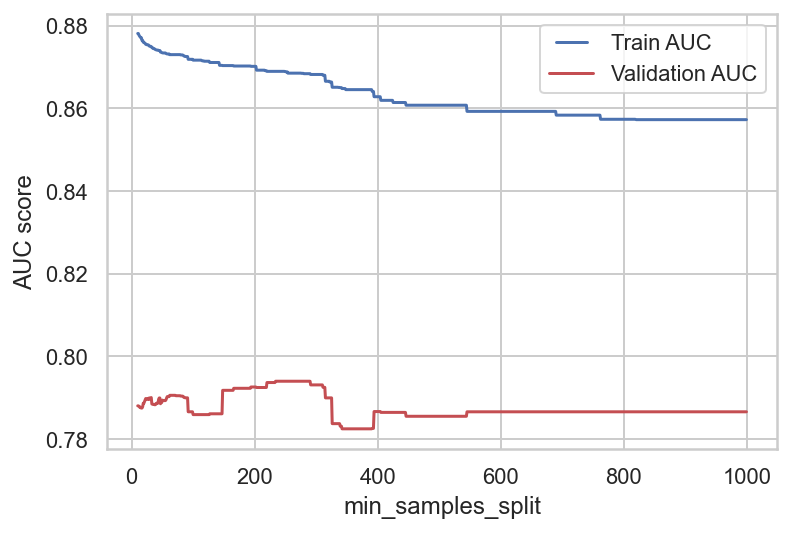

In [433]:
min_samples_split = list(range(10,1000))
calculate_AUC(min_samples_split, X_train, X_val, y_train, y_val,'min_samples_split', 10)

In [434]:
dt_min10 = DecisionTreeClassifier(min_samples_split = 10).fit(X_train, y_train)
dt_min234 = DecisionTreeClassifier(min_samples_split = 234).fit(X_train, y_train)
dt_min250 = DecisionTreeClassifier(min_samples_split = 250).fit(X_train, y_train)

df = pd.DataFrame(columns = ['Time','Train','Validation'], index = ['dt_min10','dt_min234','dt_min250'])
show_results_1(df, dt_min10, dt_min234, dt_min250)


,Time,Train,Validation
dt_min10,0.042+/-0.0,0.907+/-0.0,0.838+/-0.01
dt_min234,0.033+/-0.0,0.86+/-0.0,0.852+/-0.01
dt_min250,0.033+/-0.0,0.86+/-0.0,0.852+/-0.01


The best train value is  24
The best validation value is  393


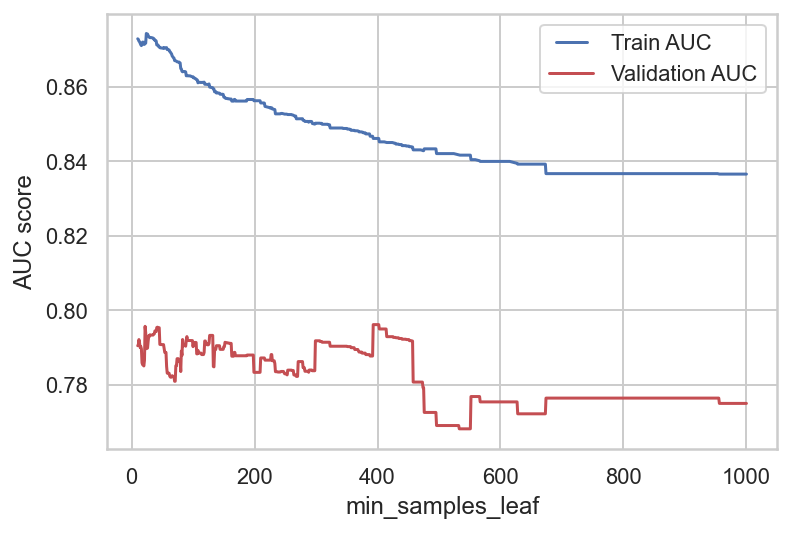

In [435]:
min_samples_leaf = list(range(10,1001))
calculate_AUC(min_samples_leaf, X_train, X_val, y_train, y_val,'min_samples_leaf', 10)

In [436]:
dt_min_leaf24 = DecisionTreeClassifier(min_samples_split = 24).fit(X_train, y_train)
dt_min_leaf400 = DecisionTreeClassifier(min_samples_split = 400).fit(X_train, y_train)

df = pd.DataFrame(columns = ['Time','Train','Validation'], index = ['Min leaf 1','Min leaf 24','Min leaf 400'])
show_results_1(df, dt_gini, dt_min_leaf24, dt_min_leaf400)

,Time,Train,Validation
Min leaf 1,0.046+/-0.01,0.94+/-0.0,0.826+/-0.01
Min leaf 24,0.042+/-0.0,0.891+/-0.0,0.841+/-0.01
Min leaf 400,0.033+/-0.0,0.858+/-0.0,0.853+/-0.01


The best train value is  0.0
The best validation value is  0.018072289156626505


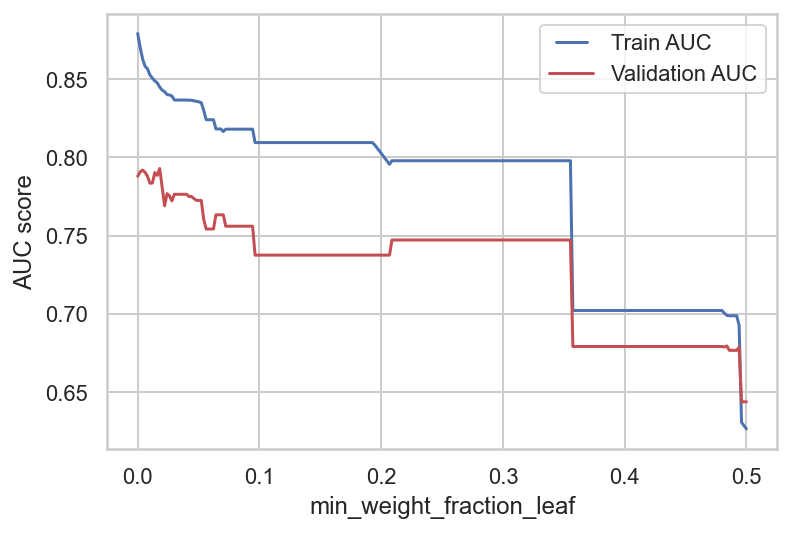

In [437]:
min_weight_fraction_leaf = np.linspace(0, 0.5, 250, endpoint=True)
calculate_AUC(min_weight_fraction_leaf, X_train, X_val, y_train, y_val,'min_weight_fraction_leaf', 10)

In [438]:
dt_min_weight_1 = DecisionTreeClassifier(min_weight_fraction_leaf = 0.001).fit(X_train, y_train)
dt_min_weight_2 = DecisionTreeClassifier(min_weight_fraction_leaf = 0.01).fit(X_train, y_train)

df = pd.DataFrame(columns = ['Time','Train','Validation'], index = ['Min leaf 1','Min weight small','Min weight med'])
show_results_1(df, dt_gini, dt_min_weight_1, dt_min_weight_2)


,Time,Train,Validation
Min leaf 1,0.047+/-0.01,0.94+/-0.0,0.827+/-0.01
Min weight small,0.036+/-0.0,0.867+/-0.0,0.849+/-0.01
Min weight med,0.028+/-0.0,0.849+/-0.0,0.847+/-0.01


The best train value is  0.0
The best validation value is  0.001002004008016032


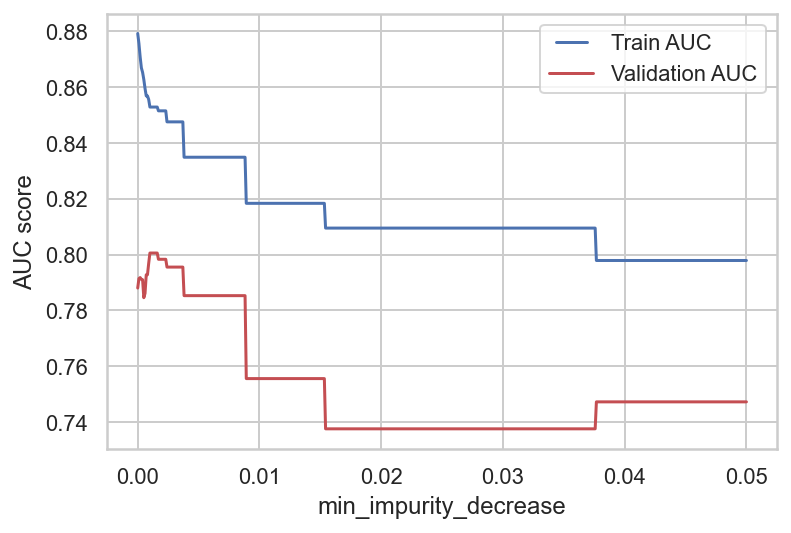

In [439]:
min_impurity_decrease = np.linspace(0, 0.05, 500, endpoint=True)
calculate_AUC(min_impurity_decrease, X_train, X_val, y_train, y_val,'min_impurity_decrease', 10)

In [440]:
dt_impurity01 = DecisionTreeClassifier(min_impurity_decrease=0.01).fit(X_train, y_train)
dt_impurity0001 = DecisionTreeClassifier(min_impurity_decrease=0.0001).fit(X_train, y_train)

df = pd.DataFrame(columns = ['Time','Train','Validation'], index = ['Baseline','dt_impurity01','dt_impurity0001'])
show_results_1(df,dt_gini, dt_impurity01,dt_impurity0001)


,Time,Train,Validation
Baseline,0.047+/-0.01,0.94+/-0.0,0.826+/-0.01
dt_impurity01,0.015+/-0.0,0.843+/-0.0,0.843+/-0.01
dt_impurity0001,0.028+/-0.0,0.868+/-0.0,0.856+/-0.01


In [441]:
#ccp_alpha
dt_alpha = DecisionTreeClassifier(random_state=42)
path = dt_alpha.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

Text(0.5, 1.0, 'Total Impurity vs effective alpha for training set')

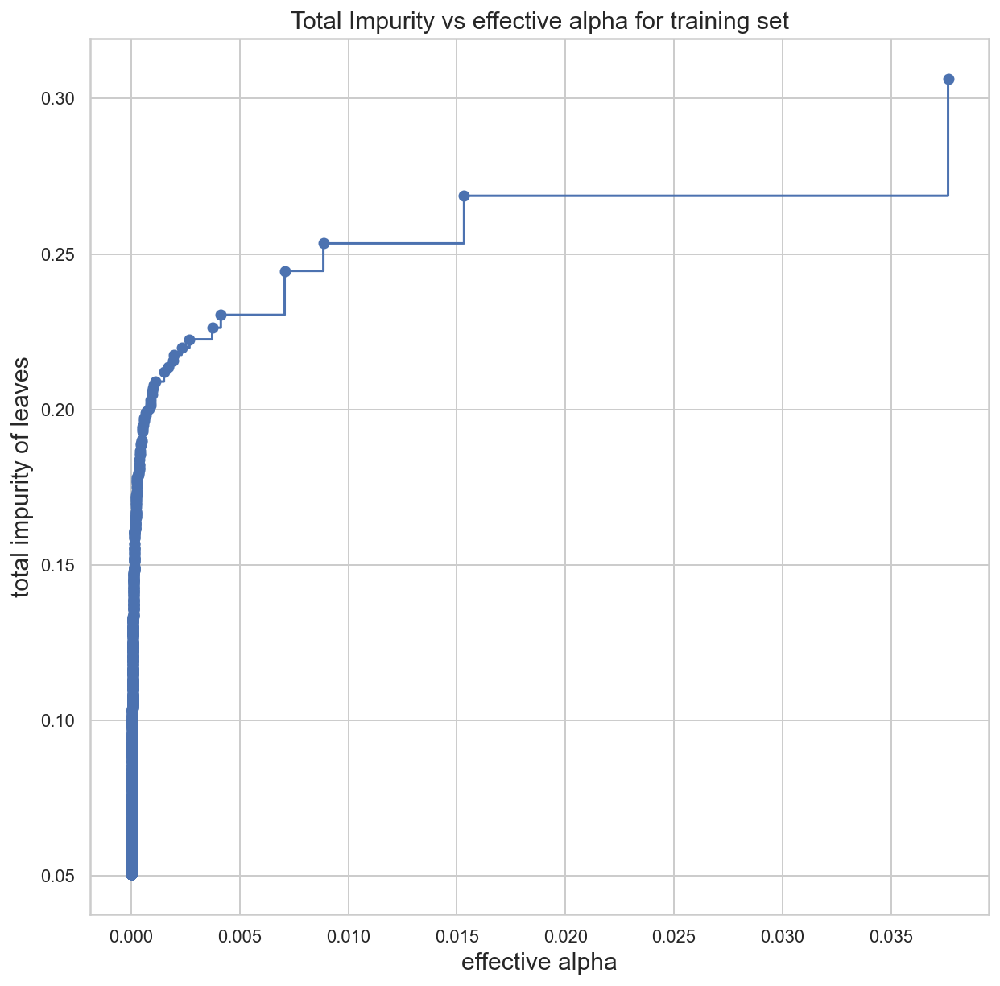

In [442]:
fig, ax = plt.subplots(figsize = (10,10))
ax.plot(ccp_alphas[:-1], impurities[:-1], marker='o', drawstyle="steps-post")
ax.set_xlabel("effective alpha", fontsize=15)
ax.set_ylabel("total impurity of leaves", fontsize=15)
ax.set_title("Total Impurity vs effective alpha for training set", fontsize=15)

In [443]:
#a função abaixo não aceitava ccp_alphas menores que 0
ccp_alphas=ccp_alphas[ccp_alphas>0]

In [444]:
trees = []
for ccp_alpha in ccp_alphas:
    dt_alpha = DecisionTreeClassifier(random_state=42, ccp_alpha=ccp_alpha).fit(X_train, y_train)
    trees.append(dt_alpha)
print("Number of nodes in the last tree is: {} with ccp_alpha: {}".format(trees[-1].tree_.node_count, ccp_alphas[-1]))

Number of nodes in the last tree is: 1 with ccp_alpha: 0.1934576933971231


In [445]:
trees = trees[:-1]
ccp_alphas = ccp_alphas[:-1]

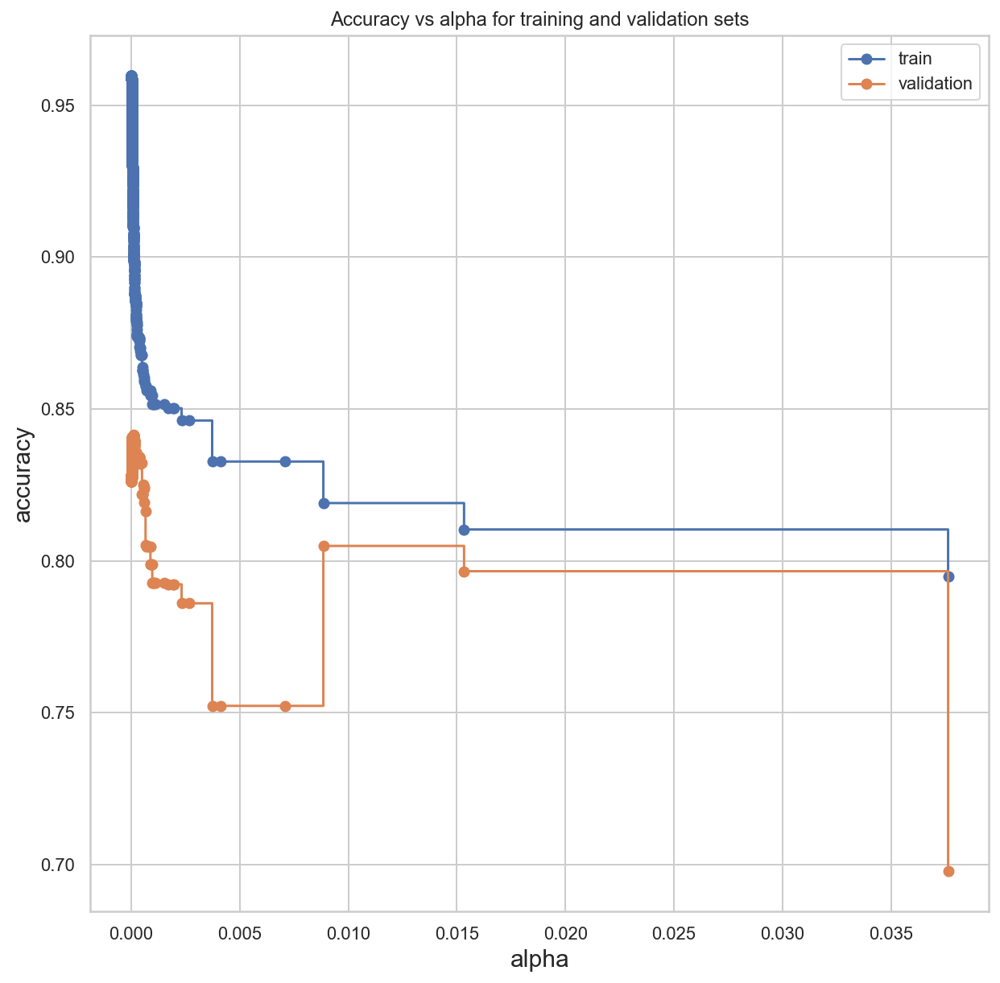

In [446]:
train_scores = [tree.score(X_train, y_train) for tree in trees]
val_scores = [tree.score(X_val, y_val) for tree in trees]

fig, ax = plt.subplots(figsize = (10,10))
ax.set_xlabel("alpha", fontsize=15)
ax.set_ylabel("accuracy", fontsize=15)
ax.set_title("Accuracy vs alpha for training and validation sets")
ax.plot(ccp_alphas, train_scores, marker='o', label="train", drawstyle="steps-post")
ax.plot(ccp_alphas, val_scores, marker='o', label="validation", drawstyle="steps-post")
ax.legend()
plt.show()

In [447]:
index_best_model = np.argmax(val_scores)
best_model = trees[index_best_model]
print('ccp_alpha of best model: ',trees[index_best_model])
print('_____________________________________________________________')
print('Training accuracy of best model: ',best_model.score(X_train, y_train))
print('Validation accuracy of best model: ',best_model.score(X_val, y_val))

ccp_alpha of best model:  DecisionTreeClassifier(ccp_alpha=9.647542354307014e-05, random_state=42)
_____________________________________________________________
Training accuracy of best model:  0.9070996335123157
Validation accuracy of best model:  0.8415178571428571


In [453]:
dt_t1=DecisionTreeClassifier(splitter = 'random', max_depth = 5, min_samples_split=7, 
                             min_weight_fraction_leaf = 0.01, min_impurity_decrease=0.01,random_state=42).fit(X_train, y_train)
    
dt_t2=DecisionTreeClassifier(max_depth = 5,min_weight_fraction_leaf = 0.002,random_state=42).fit(X_train, y_train)

dt_t3=DecisionTreeClassifier(splitter = 'random', max_depth = 5, min_samples_split=7, 
                              min_weight_fraction_leaf = 0.001, random_state=42).fit(X_train, y_train)

In [454]:
print('Train accuracy:',dt_t1.score(X_train, y_train))
print('Validation accuracy:',dt_t1.score(X_val, y_val))

Train accuracy: 0.8015426574618597
Validation accuracy: 0.7035714285714286


In [455]:
print('Train accuracy:',dt_t2.score(X_train, y_train))
print('Validation accuracy:',dt_t2.score(X_val, y_val))

Train accuracy: 0.8514020284667178
Validation accuracy: 0.7925595238095238


In [456]:
print('Train accuracy:',dt_t3.score(X_train, y_train))
print('Validation accuracy:',dt_t3.score(X_val, y_val))

Train accuracy: 0.8303076791954317
Validation accuracy: 0.8090773809523809


In [ ]:
MELHOR!!

In [459]:
dt_t4=DecisionTreeClassifier(splitter = 'random', max_depth = 5, min_samples_split = 400, 
                              min_weight_fraction_leaf = 0.001, random_state=42).fit(X_train, y_train)
print('Train accuracy:',dt_t4.score(X_train, y_train))
print('Validation accuracy:',dt_t4.score(X_val, y_val))

Train accuracy: 0.8274950992925936
Validation accuracy: 0.7458333333333333


In [457]:
# Criando ainda a tree dada como melhor pelo ccp_alpha:
dt_t5=DecisionTreeClassifier(ccp_alpha=9.647542354307014e-05, random_state=42).fit(X_train, y_train)
print('Train accuracy:',dt_t5.score(X_train, y_train))
print('Validation accuracy:',dt_t5.score(X_val, y_val))

Train accuracy: 0.9070996335123157
Validation accuracy: 0.8415178571428571


In [250]:
print("train score:", dt_2.score(X_train, y_train))
print("validation score:",dt_2.score(X_val, y_val))

train score: 0.7651847747325349
validation score: 0.8694940476190476


In [460]:
#changing the threshold improves or not the accuracy......?
threshold = 0.4

predicted_proba = dt_2.predict_proba(X_val)
predicted = (predicted_proba [:,1] >= threshold).astype('int')

accuracy = accuracy_score(y_val, predicted)
accuracy

0.8550595238095238

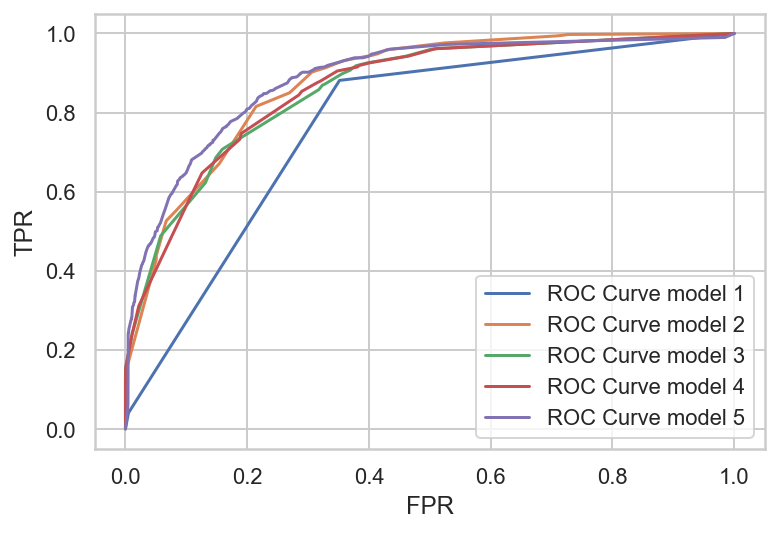

In [461]:
# To build the ROC curve
prob_model1 = dt_t1.predict_proba(X_val)
prob_model2 = dt_t2.predict_proba(X_val)
prob_model3 = dt_t3.predict_proba(X_val)
prob_model4 = dt_t4.predict_proba(X_val)
prob_model5 = dt_t5.predict_proba(X_val)

fpr_1, tpr_1, thresholds_1 = roc_curve(y_val, prob_model1[:, 1])
fpr_2, tpr_2, thresholds_2 = roc_curve(y_val, prob_model2[:, 1])
fpr_3, tpr_3, thresholds_3 = roc_curve(y_val, prob_model3[:, 1])
fpr_4, tpr_4, thresholds_4 = roc_curve(y_val, prob_model4[:, 1])
fpr_5, tpr_5, thresholds_5 = roc_curve(y_val, prob_model5[:, 1])


plt.plot(fpr_1, tpr_1, label="ROC Curve model 1")
plt.plot(fpr_2, tpr_2, label="ROC Curve model 2")
plt.plot(fpr_3, tpr_3, label="ROC Curve model 3")
plt.plot(fpr_4, tpr_4, label="ROC Curve model 4")
plt.plot(fpr_5, tpr_5, label="ROC Curve model 5")
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.legend()
plt.show()

# o melhor aparenta ter overfitting!!!

In [462]:
labels_train = dt_t3.predict(X_train)
labels_val = dt_t3.predict(X_val) 

metrics(y_train, labels_train, y_val, labels_val)

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.83      0.84      0.83     11962
           1       0.83      0.82      0.83     11504

    accuracy                           0.83     23466
   macro avg       0.83      0.83      0.83     23466
weighted avg       0.83      0.83      0.83     23466

[[10068  1894]
 [ 2088  9416]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.90      0.84      0.87      5127
           1       0.58   

## Random Forests

In [463]:
random = 42

ensemble_clfs = [
    ("RandomForestClassifier, max_features='auto'",
        RandomForestClassifier(oob_score=True,
                               max_features='auto',
                               random_state=random)),
    ("RandomForestClassifier, max_features=6",
        RandomForestClassifier(max_features=6,
                               oob_score=True,
                               random_state=random)),
    ("RandomForestClassifier, max_features=None",
        RandomForestClassifier(max_features=None,
                               oob_score=True,
                               random_state=random))
]

In [464]:
from collections import OrderedDict

# Map a classifier name to a list of (<n_estimators>, <error rate>) pairs.
error_rate = OrderedDict((label, []) for label, _ in ensemble_clfs)

# Range of `n_estimators` values to explore.
min_estimators = 15
max_estimators = 175 #225

for label, clf in ensemble_clfs:
    for i in range(min_estimators, max_estimators + 1):
        clf.set_params(n_estimators=i)
        clf.fit(X_train, y_train)

        # Record the OOB error for each `n_estimators=i` setting.
        oob_error = 1 - clf.oob_score_
        error_rate[label].append((i, oob_error))

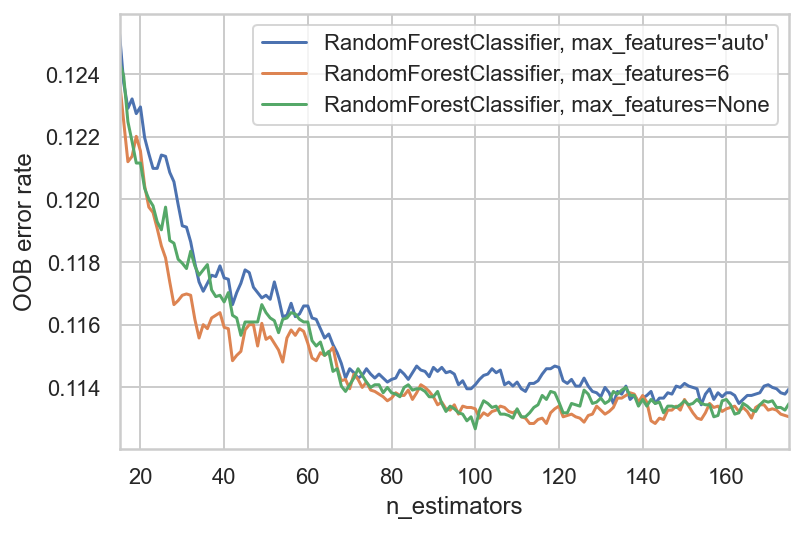

In [466]:
# Generate the "OOB error rate" vs. "n_estimators" plot.
for label, clf_err in error_rate.items():
    xs, ys = zip(*clf_err)
    plt.plot(xs, ys, label=label)

plt.xlim(min_estimators, max_estimators)
plt.xlabel("n_estimators")
plt.ylabel("OOB error rate")
plt.legend(loc="upper right")
plt.show()

In [467]:
# # Creating and fitting the models
# rf_1 = RandomForestClassifier(n_estimators=110, max_depth=10, random_state = 42)
# rf_1=rf_1.fit(X_train, y_train)

# rf_2 = RandomForestClassifier(n_estimators=110, max_depth=10, max_features = 6, random_state = 42)
# rf_2=rf_2.fit(X_train, y_train)

# rf_3 = RandomForestClassifier(n_estimators=110, max_depth=10, min_samples_split=17, random_state = 42)
# rf_3=rf_3.fit(X_train, y_train)

In [468]:
rf_1= RandomForestClassifier(min_samples_split = 350, min_weight_fraction_leaf = 0.002,random_state=42).fit(X_train, y_train)
rf_2= RandomForestClassifier(ccp_alpha=0.000159, random_state=42).fit(X_train, y_train)
rf_3= RandomForestClassifier(max_depth = 6, min_weight_fraction_leaf = 0.002, random_state=42).fit(X_train, y_train)
rf_4= RandomForestClassifier(n_estimators=110, max_depth=6, random_state = 42).fit(X_train, y_train)
rf_5 = RandomForestClassifier(n_estimators=110, max_depth=6, max_features = 6, random_state = 42).fit(X_train, y_train)

In [469]:
print("train score:", rf_1.score(X_train, y_train))
print("validation score:",rf_1.score(X_val, y_val))

train score: 0.8642290974175403
validation score: 0.8123511904761904


In [470]:
print("train score:", rf_2.score(X_train, y_train))
print("validation score:",rf_2.score(X_val, y_val))

train score: 0.9019858518707918
validation score: 0.8369047619047619


In [471]:
print("train score:", rf_3.score(X_train, y_train))
print("validation score:",rf_3.score(X_val, y_val))

train score: 0.8522969402539845
validation score: 0.8110119047619048


In [472]:
print('Train accuracy:',rf_4.score(X_train, y_train))
print('Validation accuracy:',rf_4.score(X_val, y_val))

Train accuracy: 0.8541293786755305
Validation accuracy: 0.8120535714285714


In [473]:
print('Train accuracy:',rf_5.score(X_train, y_train))
print('Validation accuracy:',rf_5.score(X_val, y_val))

Train accuracy: 0.8592857751640671
Validation accuracy: 0.7959821428571429


In [475]:
rf_6= RandomForestClassifier(random_state=42).fit(X_train, y_train)
print('Train accuracy:',rf_6.score(X_train, y_train))
print('Validation accuracy:',rf_6.score(X_val, y_val))

Train accuracy: 0.9598141992670246
Validation accuracy: 0.837202380952381


In [476]:
labels_train = rf_4.predict(X_train)
labels_val = rf_4.predict(X_val) 

metrics(y_train, labels_train, y_val, labels_val)

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.88      0.83      0.85     11962
           1       0.83      0.88      0.86     11504

    accuracy                           0.85     23466
   macro avg       0.85      0.85      0.85     23466
weighted avg       0.86      0.85      0.85     23466

[[ 9936  2026]
 [ 1397 10107]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.92      0.83      0.87      5127
           1       0.58   

In [477]:
#changing the threshold does not seem to improve the accuracy of the best random forest!
threshold = 0.4

predicted_proba = rf_2.predict_proba(X_val)
predicted = (predicted_proba [:,1] >= threshold).astype('int')

accuracy = accuracy_score(y_val, predicted)
accuracy

0.8224702380952381

## Logistic Regression

In [276]:
#importing and defining the model
log_model = LogisticRegression(random_state=4)

In [277]:
log_model.fit(X_train,y_train) #fit model to our train data

LogisticRegression(random_state=4)

In [282]:
labels_train = log_model.predict(X_train)
#log_model.score(X_train, y_train)

#Predict class labels for samples in X
labels_val = log_model.predict(X_val) 
#log_model.score(X_val, y_val)
#predict values for X_test, ex: p o citizen em X_test [0] estamos a prever y[0]->0

In [283]:
print("train score:", log_model.score(X_train, y_train))
print("validation score:",log_model.score(X_val, y_val))

train score: 0.8393846416091366
validation score: 0.7816964285714286


In [281]:
metrics(y_train, labels_train, y_val, labels_val)

#ability of the classifier to not label a sample as positive if it is negative
#recall: ability of the classifier to find all the positive samples
#bad model: from all the dataset, what are the ones we are getting right
#f1: weighted harmonic mean of the precision and recall

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.90      0.77      0.83     11962
           1       0.79      0.91      0.85     11504

    accuracy                           0.84     23466
   macro avg       0.85      0.84      0.84     23466
weighted avg       0.85      0.84      0.84     23466

[[ 9228  2734]
 [ 1035 10469]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.93      0.77      0.84      5127
           1       0.53   

## Gaussian Naive Bayes

In [300]:
modelNB = GaussianNB()
modelNB.fit(X = X_train, y = y_train)

print("train score:", modelNB.score(X_train, y_train))
print("validation score:",modelNB.score(X_val, y_val))

train score: 0.7451632148640587
validation score: 0.8377976190476191


In [301]:
modelNB2 = GaussianNB(var_smoothing=0.0001) 
modelNB2.fit(X = X_train, y = y_train)

print("train score:", modelNB2.score(X_train, y_train))
print("validation score:",modelNB2.score(X_val, y_val))

train score: 0.7461433563453507
validation score: 0.8380952380952381


In [302]:
modelNB3 = GaussianNB(var_smoothing=0.001) 
modelNB3.fit(X = X_train, y = y_train)

print("train score:", modelNB3.score(X_train, y_train))
print("validation score:",modelNB3.score(X_val, y_val))

train score: 0.7476348759907951
validation score: 0.8376488095238095


In [303]:
modelNB4 = GaussianNB(var_smoothing=0.01) 
modelNB4.fit(X = X_train, y = y_train)

print("train score:", modelNB4.score(X_train, y_train))
print("validation score:",modelNB4.score(X_val, y_val))

train score: 0.7680047728628654
validation score: 0.8316964285714286


In [304]:
labels_train = modelNB4.predict(X_train)
labels_val = modelNB4.predict(X_val)

In [305]:
metrics(y_train, labels_train, y_val, labels_val)

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.72      0.90      0.80     11962
           1       0.86      0.63      0.73     11504

    accuracy                           0.77     23466
   macro avg       0.79      0.77      0.76     23466
weighted avg       0.79      0.77      0.76     23466

[[10742  1220]
 [ 4224  7280]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.88      0.90      0.89      5127
           1       0.66   

## Neural Networks

In [369]:
model = MLPClassifier(random_state=4)
model.fit(X_train, y_train)
labels_train = model.predict(X_train)
labels_val = model.predict(X_val)

In [357]:
print("train score:", model.score(X_train, y_train))
print("validation score:",model.score(X_val, y_val))

train score: 0.8548538310747464
validation score: 0.803422619047619


In [372]:
f1_score(y_val, labels_val, average='micro')

0.803422619047619

In [358]:
metrics(y_train, labels_train, y_val, labels_val)

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.90      0.80      0.85     11962
           1       0.82      0.91      0.86     11504

    accuracy                           0.85     23466
   macro avg       0.86      0.86      0.85     23466
weighted avg       0.86      0.85      0.85     23466

[[ 9618  2344]
 [ 1062 10442]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.93      0.80      0.86      5127
           1       0.56   

In [360]:
# test
# Confirmar se já está normalizado

# min_max_scaler = preprocessing.MinMaxScaler()
# metric_scaled = min_max_scaler.fit_transform(test.values)
# test= pd.DataFrame(metric_scaled, columns=test.columns, index=test.index)

In [370]:
Citizen=df_test['CITIZEN_ID']
labels_test= model.predict(test)
prediction=pd.concat([Citizen, pd.DataFrame(labels_test)],axis=1)
prediction['Income']=prediction[0]
prediction.drop(columns=0,inplace=True)

In [371]:
prediction.to_csv(r'C:\Users\matip\Documents\Mestrado\Machine Learning\Project\Proj\Predictions\Pred4.csv',index=False, header=True,sep=',')

In [310]:
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ['Raw'])
show_results(df, model)

,Time,Train,Validation,Iterations
Raw,23.377+/-2.89,0.855+/-0.0,0.85+/-0.01,142.9+/-17.3


In [311]:
model_1 = MLPClassifier(hidden_layer_sizes=(1),random_state=4)
model_2 = MLPClassifier(hidden_layer_sizes=(3),random_state=4)
model_3 = MLPClassifier(hidden_layer_sizes=(9),random_state=4)
model_4 = MLPClassifier(hidden_layer_sizes=(3, 3),random_state=4)
model_5 = MLPClassifier(hidden_layer_sizes=(5, 5),random_state=4)
model_6 = MLPClassifier(hidden_layer_sizes=(3, 3, 3),random_state=4) #3 layers each one with 3 units

In [312]:
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ['M_1','M_2','M_3', 'M_4','M_5','M_6'])
show_results(df, model_1, model_2, model_3, model_4, model_5, model_6)

,Time,Train,Validation,Iterations
M_1,8.599+/-1.23,0.843+/-0.0,0.843+/-0.01,139.0+/-5.7
M_2,8.927+/-1.12,0.844+/-0.0,0.844+/-0.01,123.3+/-13.8
M_3,9.921+/-1.8,0.846+/-0.0,0.847+/-0.01,126.2+/-13.5
M_4,19.113+/-2.87,0.846+/-0.0,0.846+/-0.01,175.3+/-12.8
M_5,18.161+/-1.37,0.85+/-0.0,0.848+/-0.01,193.1+/-11.3
M_6,16.102+/-3.33,0.848+/-0.0,0.847+/-0.01,149.4+/-30.5


In [313]:
model_7 = MLPClassifier(hidden_layer_sizes=(4, 4),random_state=4)
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ['M_7'])
show_results(df, model_7)

,Time,Train,Validation,Iterations
M_7,18.975+/-2.07,0.848+/-0.0,0.847+/-0.01,188.8+/-10.0


testes: M5,M3,M6,M7,M4

In [314]:
model_logistic = MLPClassifier(activation = 'logistic',random_state=4)
model_tanh = MLPClassifier(activation = 'tanh',random_state=4)
model_relu=MLPClassifier(activation = 'relu',random_state=4)

In [315]:
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ['logistic','tanh','relu'])
show_results(df, model_logistic, model_tanh,model_relu)

,Time,Train,Validation,Iterations
logistic,8.949+/-0.91,0.844+/-0.0,0.843+/-0.01,71.1+/-6.5
tanh,27.355+/-1.4,0.85+/-0.0,0.849+/-0.01,200.0+/-0.0
relu,24.222+/-2.99,0.855+/-0.0,0.85+/-0.01,142.9+/-17.3


Relu is better

In [316]:
model_lbfgs = MLPClassifier(solver = 'lbfgs',random_state=4) #low dim and sparse data
model_sgd = MLPClassifier(solver = 'sgd',random_state=4) #accuracy > processing time
model_adam = MLPClassifier(solver = 'adam',random_state=4) # big dataset but might fail to converge

In [317]:
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ['lbfgs','sgd','adam'])
show_results(df, model_lbfgs, model_sgd, model_adam)

,Time,Train,Validation,Iterations
lbfgs,22.102+/-0.4,0.853+/-0.0,0.849+/-0.01,200.0+/-0.0
sgd,30.599+/-1.6,0.843+/-0.0,0.842+/-0.01,189.8+/-10.1
adam,24.064+/-3.61,0.855+/-0.0,0.85+/-0.01,142.9+/-17.3


Testar LBFGS & ADAM

In [401]:
model_constant = MLPClassifier(solver = 'sgd', learning_rate = 'constant',random_state=4)
model_invscaling = MLPClassifier(solver = 'sgd', learning_rate = 'invscaling',random_state=4)
model_adaptive = MLPClassifier(solver = 'sgd', learning_rate = 'adaptive',random_state=4)

In [402]:
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ['constant','invscaling','adaptive'])
show_results(df, model_constant, model_invscaling, model_adaptive)

,Time,Train,Validation,Iterations
constant,29.894+/-1.39,0.843+/-0.0,0.842+/-0.01,189.8+/-10.1
invscaling,3.331+/-0.1,0.763+/-0.0,0.763+/-0.01,20.0+/-0.0
adaptive,31.907+/-0.77,0.843+/-0.0,0.842+/-0.01,200.0+/-0.0


Testar Constant & Adaptive

In [403]:
model_a = MLPClassifier(solver = 'adam', learning_rate_init = 0.5,random_state=4) #qt maior mais rapido aprende o modelo
model_b = MLPClassifier(solver = 'adam', learning_rate_init = 0.1,random_state=4)
model_c = MLPClassifier(solver = 'adam', learning_rate_init = 0.01,random_state=4) #se for mt pequeno pode ficar preso numa solucao subotima e pode nunca convergir
model_d = MLPClassifier(solver = 'adam', learning_rate_init = 0.001,random_state=4)

In [404]:
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ['M_a','M_b','M_c', "M_d"])
show_results(df, model_a, model_b, model_c, model_d)

,Time,Train,Validation,Iterations
M_a,3.183+/-0.83,0.842+/-0.01,0.841+/-0.01,22.0+/-5.5
M_b,5.576+/-0.9,0.847+/-0.01,0.849+/-0.01,37.7+/-6.0
M_c,16.452+/-4.12,0.855+/-0.0,0.85+/-0.0,100.0+/-25.0
M_d,23.223+/-2.66,0.855+/-0.0,0.85+/-0.01,142.9+/-17.3


The best is 0.01 or 0.001 so test

In [405]:
model_e = MLPClassifier(solver = 'adam', learning_rate_init = 0.005,random_state=4)
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ["M_e"])
show_results(df, model_e)

,Time,Train,Validation,Iterations
M_e,19.733+/-4.64,0.856+/-0.0,0.852+/-0.01,120.1+/-28.1


In [ ]:
#USAR SÓ 0.005

In [406]:
model_batch20 = MLPClassifier(solver = 'sgd', batch_size = 20,random_state=4)
model_batch50 = MLPClassifier(solver = 'sgd', batch_size = 50,random_state=4)
model_batch100 = MLPClassifier(solver = 'sgd', batch_size = 100,random_state=4)
model_batch200 = MLPClassifier(solver = 'sgd', batch_size = 200,random_state=4)
model_batch500 = MLPClassifier(solver = 'sgd', batch_size = 500,random_state=4)

In [407]:
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ['batch 20','batch 50','batch 100', 'batch 200', 'batch 500'])
show_results(df, model_batch20, model_batch50, model_batch100,  model_batch200, model_batch500)

,Time,Train,Validation,Iterations
batch 20,96.442+/-4.51,0.848+/-0.0,0.846+/-0.01,193.9+/-9.8
batch 50,58.266+/-10.93,0.845+/-0.0,0.844+/-0.01,183.1+/-34.6
batch 100,31.414+/-1.58,0.844+/-0.0,0.843+/-0.01,151.3+/-7.7
batch 200,40.591+/-30.9,0.843+/-0.0,0.842+/-0.01,189.8+/-10.1
batch 500,26.569+/-1.21,0.838+/-0.0,0.837+/-0.01,200.0+/-0.0


The best one is batch 20

In [408]:
model_maxiter_50 = MLPClassifier(max_iter = 50,random_state=4)
model_maxiter_100 = MLPClassifier(max_iter = 100,random_state=4)
model_maxiter_200 = MLPClassifier(max_iter = 200,random_state=4)
model_maxiter_300 = MLPClassifier(max_iter = 300,random_state=4)

In [409]:
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ['max iter 50','max iter 100','max iter 200', 'max iter 300'])
show_results(df, model_maxiter_50, model_maxiter_100, model_maxiter_200, model_maxiter_300)

,Time,Train,Validation,Iterations
max iter 50,8.567+/-0.27,0.851+/-0.0,0.849+/-0.01,50.0+/-0.0
max iter 100,17.255+/-1.09,0.854+/-0.0,0.85+/-0.01,100.0+/-0.0
max iter 200,23.445+/-4.22,0.855+/-0.0,0.85+/-0.01,142.9+/-17.3
max iter 300,21.647+/-2.74,0.855+/-0.0,0.85+/-0.01,142.9+/-17.3


In [ ]:
opções entre 150 e 300

In [410]:
model_maxiter_150 = MLPClassifier(max_iter = 150,random_state=4)
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ['max iter 150'])
show_results(df, model_maxiter_150)

,Time,Train,Validation,Iterations
max iter 150,21.874+/-2.51,0.854+/-0.0,0.85+/-0.01,138.6+/-13.2


In [411]:
model_all=MLPClassifier(hidden_layer_sizes=(9),activation = 'logistic',solver = 'adam',learning_rate_init = 0.1,batch_size = 50,random_state=4)
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ['Raw'])
show_results(df, model_all)

,Time,Train,Validation,Iterations
Raw,5.72+/-2.16,0.845+/-0.0,0.842+/-0.01,33.0+/-13.4


### Run One


In [167]:
# parameter_space = {
#      'hidden_layer_sizes': [(5,5),(3,3,3)],
#      'activation': ['tanh','relu'],
#      'solver': ['adam'],
#      'learning_rate_init': [(0.005)],
#      'batch_size': [(20)], 
#      'max_iter': [(150),(200),(300)],
#  }

In [168]:
# clf = GridSearchCV(model, parameter_space,n_jobs=-1)

In [169]:
# clf.fit(X_train, y_train)

GridSearchCV(estimator=MLPClassifier(random_state=4), n_jobs=-1,
             param_grid={'activation': ['tanh', 'relu'], 'batch_size': [20],
                         'hidden_layer_sizes': [(5, 5), (3, 3, 3)],
                         'learning_rate_init': [0.005],
                         'max_iter': [150, 200, 300], 'solver': ['adam']})

In [170]:
# clf.best_params_

{'activation': 'tanh',
 'batch_size': 20,
 'hidden_layer_sizes': (5, 5),
 'learning_rate_init': 0.005,
 'max_iter': 150,
 'solver': 'adam'}

In [381]:
NNgrid=MLPClassifier(random_state=4,hidden_layer_sizes=(5,5),activation='tanh',solver='adam',learning_rate_init=0.005,batch_size=20,max_iter=150).fit(X_train,y_train)
print("train score:", NNgrid.score(X_train, y_train))
print("validation score:",NNgrid.score(X_val, y_val))

train score: 0.8510184948436035
validation score: 0.784375


In [176]:
labels_train = NNgrid.predict(X_train)
labels_val = NNgrid.predict(X_val)
metrics(y_train, labels_train, y_val, labels_val)

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.93      0.77      0.84     11962
           1       0.80      0.94      0.86     11504

    accuracy                           0.85     23466
   macro avg       0.86      0.85      0.85     23466
weighted avg       0.86      0.85      0.85     23466

[[ 9201  2761]
 [  735 10769]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.94      0.77      0.85      5127
           1       0.53   

## KNN

In [318]:
print('Training data length:',len(X_train))
print('Validation data length:',len(X_val))

Training data length: 23466
Validation data length: 6720


The number K is typically chosen as the square root of the total number of points in the training data set. Thus, in this case, N is 15680 (agora é 23559), so K = 153.

Text(0, 0.5, 'Validation Accuracy')

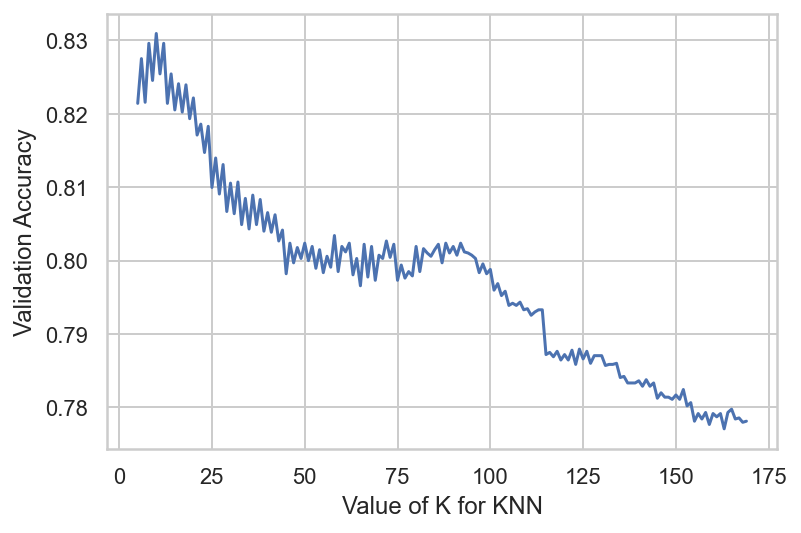

In [319]:
# try K=70 through K=170 and record testing accuracy
k_range = range(5, 170)
scores = []

# We use a loop through the range
# We append the scores in the list
for k in k_range:
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, y_train)
    y_pred = knn.predict(X_val)
    scores.append(accuracy_score(y_val, y_pred))

# plot the relationship between K and testing accuracy
plt.plot(k_range, scores)
plt.xlabel('Value of K for KNN')
plt.ylabel('Validation Accuracy')

In [320]:
# o n_neighbors default é 5
modelKNN1 = KNeighborsClassifier().fit(X = X_train, y = y_train)

In [321]:
print("train score:", modelKNN1.score(X_train, y_train))
print("validation score:",modelKNN1.score(X_val, y_val))

train score: 0.8936333418563027
validation score: 0.8214285714285714


In [322]:
modelKNN2 = KNeighborsClassifier(n_neighbors=100).fit(X = X_train, y = y_train)

In [323]:
print("train score:", modelKNN2.score(X_train, y_train))
print("validation score:",modelKNN2.score(X_val, y_val))

train score: 0.8487172931049177
validation score: 0.7988095238095239


In [324]:
modelKNN3 = KNeighborsClassifier(n_neighbors=12).fit(X = X_train, y = y_train)

In [325]:
print("train score:", modelKNN3.score(X_train, y_train))
print("validation score:",modelKNN3.score(X_val, y_val))

train score: 0.872198073808915
validation score: 0.8296130952380952


In [329]:
modelKNN4 = KNeighborsClassifier(n_neighbors=10).fit(X = X_train, y = y_train)

In [330]:
print("train score:", modelKNN4.score(X_train, y_train))
print("validation score:",modelKNN4.score(X_val, y_val))

train score: 0.8756924912639563
validation score: 0.830952380952381


In [331]:
#from the available algorithms (excluding the default), this was the best one 
# tinham n_neighbors=100, deixei o default
modelKNN5 = KNeighborsClassifier(n_neighbors=10,algorithm='ball_tree').fit(X = X_train, y = y_train)

In [332]:
print("train score:", modelKNN3.score(X_train, y_train))
print("validation score:",modelKNN3.score(X_val, y_val))

train score: 0.872198073808915
validation score: 0.8296130952380952


In [335]:
modelKNN6 = KNeighborsClassifier(n_neighbors=10,p=1).fit(X = X_train, y = y_train)

In [336]:
print("train score:", modelKNN6.score(X_train, y_train))
print("validation score:",modelKNN6.score(X_val, y_val))

train score: 0.8754368021818801
validation score: 0.8355654761904762


In [ ]:
MELHOR ATÉ AGORA

In [339]:
modelKNN7 = KNeighborsClassifier(n_neighbors=10,p=1,weights='distance').fit(X = X_train, y = y_train)

In [340]:
print("train score:", modelKNN7.score(X_train, y_train))
print("validation score:",modelKNN7.score(X_val, y_val))

train score: 0.9594306656439103
validation score: 0.83125


In [344]:
modelKNN8 = KNeighborsClassifier(n_neighbors=10,algorithm='ball_tree', p=1).fit(X = X_train, y = y_train)

In [345]:
print("train score:", modelKNN8.score(X_train, y_train))
print("validation score:",modelKNN8.score(X_val, y_val))


train score: 0.8763317139691469
validation score: 0.8352678571428571


In [346]:
# Model with best accuracy
labels_train = modelKNN6.predict(X_train)
labels_val = modelKNN6.predict(X_val)
metrics(y_train, labels_train, y_val, labels_val)

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.86      0.91      0.88     11962
           1       0.90      0.84      0.87     11504

    accuracy                           0.88     23466
   macro avg       0.88      0.87      0.88     23466
weighted avg       0.88      0.88      0.88     23466

[[10838  1124]
 [ 1799  9705]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.90      0.89      0.89      5127
           1       0.65   

## Passive Aggressive Classifier (Extra)

In [347]:
# Creating and fitting model
pac_basic = PassiveAggressiveClassifier(random_state=42)
pac_basic.fit(X_train, y_train)

pac_1 = PassiveAggressiveClassifier(C=0.001, fit_intercept=True, tol=1e-2, loss='squared_hinge',random_state=42)
pac_1.fit(X_train, y_train)

pac_2 = PassiveAggressiveClassifier(C=0.001, tol=1e-2, loss='squared_hinge',random_state=42)
pac_2.fit(X_train, y_train)

pac_3 = PassiveAggressiveClassifier(C=0.001, tol=1e-2, random_state=42)
pac_3.fit(X_train, y_train)

PassiveAggressiveClassifier(C=0.001, random_state=42, tol=0.01)

In [352]:
print("train score:", pac_basic.score(X_train, y_train))
print("validation score:",pac_basic.score(X_val, y_val))

train score: 0.792423080201142
validation score: 0.7623511904761905


In [351]:
print("train score:", pac_1.score(X_train, y_train))
print("validation score:",pac_1.score(X_val, y_val))

train score: 0.7031449757095372
validation score: 0.8379464285714285


In [353]:
print("train score:", pac_2.score(X_train, y_train))
print("validation score:",pac_2.score(X_val, y_val))

train score: 0.7031449757095372
validation score: 0.8379464285714285


In [354]:
print("train score:", pac_3.score(X_train, y_train))
print("validation score:",pac_3.score(X_val, y_val))

train score: 0.7188698542572232
validation score: 0.8433035714285714


In [360]:
pac_4 = PassiveAggressiveClassifier(C=0.01, loss='squared_hinge',fit_intercept=True,random_state=42).fit(X_train, y_train)
print("train score:", pac_4.score(X_train, y_train))
print("validation score:",pac_4.score(X_val, y_val))

train score: 0.8245546748487173
validation score: 0.7388392857142857


In [369]:
pac_4 = PassiveAggressiveClassifier(C=0.005, loss='squared_hinge',fit_intercept=True,random_state=42).fit(X_train, y_train)
print("train score:", pac_4.score(X_train, y_train))
print("validation score:",pac_4.score(X_val, y_val))

train score: 0.8266001875053268
validation score: 0.74375


In [424]:
labels_train = pac_basic.predict(X_train)

labels_val = pac_basic.predict(X_val)

In [425]:
metrics(y_train, labels_train, y_val, labels_val)

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.84      0.73      0.78     11962
           1       0.75      0.86      0.80     11504

    accuracy                           0.79     23466
   macro avg       0.80      0.79      0.79     23466
weighted avg       0.80      0.79      0.79     23466

[[8755 3207]
 [1664 9840]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.93      0.74      0.83      5127
           1       0.50      0

## Linear Discriminant Analysis

In [370]:
modelLDA = LinearDiscriminantAnalysis()
modelLDA.fit(X = X_train, y = y_train)
labels_train = modelLDA.predict(X_train)
labels_val = modelLDA.predict(X_val)
modelLDA.predict_proba(X_val)

array([[0.49965997, 0.50034003],
       [0.99455445, 0.00544555],
       [0.17955749, 0.82044251],
       ...,
       [0.73318822, 0.26681178],
       [0.05057272, 0.94942728],
       [0.94119883, 0.05880117]])

In [371]:
print("train score:", modelLDA.score(X_train, y_train))
print("validation score:",modelLDA.score(X_val, y_val))

train score: 0.8244268303076792
validation score: 0.7421130952380952


In [372]:
from sklearn.model_selection import GridSearchCV
# define grid
grid = dict()
grid['solver'] = ['svd', 'lsqr', 'eigen']
# define search
search = GridSearchCV(modelLDA, grid, scoring='accuracy', n_jobs=-1)
# perform the search
results = search.fit(X_train, y_train)
# summarize
print('Mean Accuracy: %.3f' % results.best_score_)
print('Config: %s' % results.best_params_)

Mean Accuracy: 0.823
Config: {'solver': 'svd'}


In [373]:
from numpy import arange
grid = dict()
grid['shrinkage'] = arange(0, 1, 0.01)
grid['solver']=['svd', 'lsqr', 'eigen'] #svd cannot be tested with shrinkage
# define search
search = GridSearchCV(modelLDA, grid, scoring='accuracy', n_jobs=-1)
# perform the search
results = search.fit(X_train, y_train)
# summarize
print('Mean Accuracy: %.3f' % results.best_score_)
print('Config: %s' % results.best_params_)

Mean Accuracy: 0.823
Config: {'shrinkage': 0.0, 'solver': 'lsqr'}


In [377]:
modelLDA_final = LinearDiscriminantAnalysis(solver='lsqr')
modelLDA_final.fit(X = X_train, y = y_train)
labels_train = modelLDA_final.predict(X_train)
labels_val = modelLDA_final.predict(X_val)

print("train score:", modelLDA_final.score(X_train, y_train))
print("validation score:",modelLDA_final.score(X_val, y_val))

train score: 0.8244268303076792
validation score: 0.7421130952380952


In [375]:
metrics(y_train, labels_train, y_val, labels_val)

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.93      0.71      0.80     11962
           1       0.76      0.95      0.84     11504

    accuracy                           0.82     23466
   macro avg       0.84      0.83      0.82     23466
weighted avg       0.85      0.82      0.82     23466

[[ 8474  3488]
 [  632 10872]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.94      0.71      0.81      5127
           1       0.48   

## Quadratic Discriminant Analysis

In [378]:
modelQDA = QuadraticDiscriminantAnalysis()
modelQDA.fit(X = X_train, y = y_train)
labels_train = modelQDA.predict(X_train)
labels_val = modelQDA.predict(X_val)
#modelQDA.predict_proba(X_val)

In [379]:
print("train score:", modelQDA.score(X_train, y_train))
print("validation score:",modelQDA.score(X_val, y_val))

train score: 0.709835506690531
validation score: 0.8363095238095238


In [380]:
# define grid
grid = dict()
grid['reg_param'] = arange(0, 1, 0.01)
# define search
search = GridSearchCV(modelQDA, grid, scoring='accuracy', n_jobs=-1)
# perform the search
results = search.fit(X_train, y_train)
# summarize
print('Mean Accuracy: %.3f' % results.best_score_)
print('Config: %s' % results.best_params_)

Mean Accuracy: 0.823
Config: {'reg_param': 0.02}


In [381]:
modelQDA_final = QuadraticDiscriminantAnalysis(reg_param=0.02)
modelQDA_final.fit(X = X_train, y = y_train)
labels_train = modelQDA_final.predict(X_train)
labels_val = modelQDA_final.predict(X_val)

print("train score:", modelQDA_final.score(X_train, y_train))
print("validation score:",modelQDA_final.score(X_val, y_val))

train score: 0.8231909997443109
validation score: 0.7489583333333333


In [382]:
metrics(y_train, labels_train, y_val, labels_val)

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.91      0.73      0.81     11962
           1       0.76      0.92      0.84     11504

    accuracy                           0.82     23466
   macro avg       0.84      0.83      0.82     23466
weighted avg       0.84      0.82      0.82     23466

[[ 8690  3272]
 [  877 10627]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.92      0.73      0.82      5127
           1       0.48   

## Support Vector Machine

In [383]:
modelSVM_basic = SVC().fit(X_train, y_train)
modelSVM_1 = SVC(kernel='linear').fit(X_train, y_train)
modelSVM_2 = SVC(C=750).fit(X_train, y_train)
modelSVM_3 = SVC(kernel = 'poly').fit(X_train, y_train)
modelSVM_4 = SVC(C=750, kernel = 'poly').fit(X_train, y_train)
modelSVM_5 = SVC(C=750, kernel = 'linear').fit(X_train, y_train)
modelSVM_6 = SVC(C=750, shrinking=False).fit(X_train, y_train)
modelSVM_7 = SVC(C=750, tol=1e-2).fit(X_train, y_train)

In [388]:
accuracies = [modelSVM_basic.score(X_val, y_val), modelSVM_1.score(X_val, y_val),
              modelSVM_2.score(X_val, y_val), modelSVM_3.score(X_val, y_val),
              modelSVM_4.score(X_val, y_val), modelSVM_5.score(X_val, y_val),
              modelSVM_6.score(X_val, y_val), modelSVM_7.score(X_val, y_val)]

models = ['modelSVM_basic', 'modelSVM_1', 'modelSVM_2', 'modelSVM_3', 
          'modelSVM_4', 'modelSVM_5', 'modelSVM_6', 'modelSVM_7']

data_tuples = list(zip(models,accuracies))
data = pd.DataFrame(data_tuples)
data = data.sort_values(1)

In [389]:
data

,0,1
1,modelSVM_1,0.730060
5,modelSVM_5,0.746726
0,modelSVM_basic,0.760417
3,modelSVM_3,0.767411
6,modelSVM_6,0.786607
7,modelSVM_7,0.786756
2,modelSVM_2,0.786905
4,modelSVM_4,0.787798


In [390]:
print("train score:", modelSVM_4.score(X_train, y_train))
print("validation score:",modelSVM_4.score(X_val, y_val))

train score: 0.8486746782579051
validation score: 0.787797619047619


In [391]:
print("train score:", modelSVM_2.score(X_train, y_train))
print("validation score:",modelSVM_2.score(X_val, y_val))

train score: 0.8536606153583909
validation score: 0.7869047619047619


In [392]:
print("train score:", modelSVM_7.score(X_train, y_train))
print("validation score:",modelSVM_7.score(X_val, y_val))

train score: 0.8535753856643654
validation score: 0.7867559523809524


In [394]:
print("train score:", modelSVM_1.score(X_train, y_train))
print("validation score:",modelSVM_1.score(X_val, y_val))

train score: 0.8218273246399045
validation score: 0.7300595238095238


In [397]:
modelSVM_8 = SVC(C=10, kernel = 'poly').fit(X_train, y_train)

print("train score:", modelSVM_8.score(X_train, y_train))
print("validation score:",modelSVM_8.score(X_val, y_val))

train score: 0.8455211795789653
validation score: 0.7830357142857143


In [398]:
modelSVM_9 = SVC(C=1, kernel = 'poly').fit(X_train, y_train)

print("train score:", modelSVM_9.score(X_train, y_train))
print("validation score:",modelSVM_9.score(X_val, y_val))

train score: 0.8364442171652604
validation score: 0.7674107142857143


In [426]:
labels_train = modelSVM_8.predict(X_train)
labels_val = modelSVM_8.predict(X_val)
metrics(y_train, labels_train, y_val, labels_val)

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.91      0.77      0.84     11962
           1       0.80      0.92      0.85     11504

    accuracy                           0.85     23466
   macro avg       0.85      0.85      0.85     23466
weighted avg       0.85      0.85      0.84     23466

[[ 9244  2718]
 [  907 10597]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.93      0.78      0.85      5127
           1       0.53   

### AdaBoost Classifier

In [413]:
def calculate_f1(interval, x_train, x_val, y_train, y_val, parameter):
    train_results = []
    val_results = []
    for value in interval:
        if parameter == 'Number of estimators':
            dt = AdaBoostClassifier(n_estimators = value, random_state = 5)
        elif parameter == 'Learning Rate':
            dt = AdaBoostClassifier(learning_rate = value, random_state = 5)
        dt.fit(x_train, y_train)
        train_results.append(f1_score(y_train,dt.predict(x_train)))
        val_results.append(f1_score(y_val,dt.predict(x_val)))
    value_train = train_results.index(max(train_results))
    value_val = val_results.index(max(val_results))
    print('The best train value is ',interval[value_train])
    print('The best val value is ',interval[value_val])

    fig = plt.figure(figsize = (16,10))
    line1, = plt.plot(interval, train_results, '#515C60', label="Train F1", linewidth=3,color='peru')
    line2, = plt.plot(interval, val_results, '#C7DC1F', label="Val F1", linewidth=3,color='b')
    plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
    plt.ylabel("F1 score")
    plt.xlabel(str(parameter))
    plt.show()
    

The best train value is  122
The best val value is  126


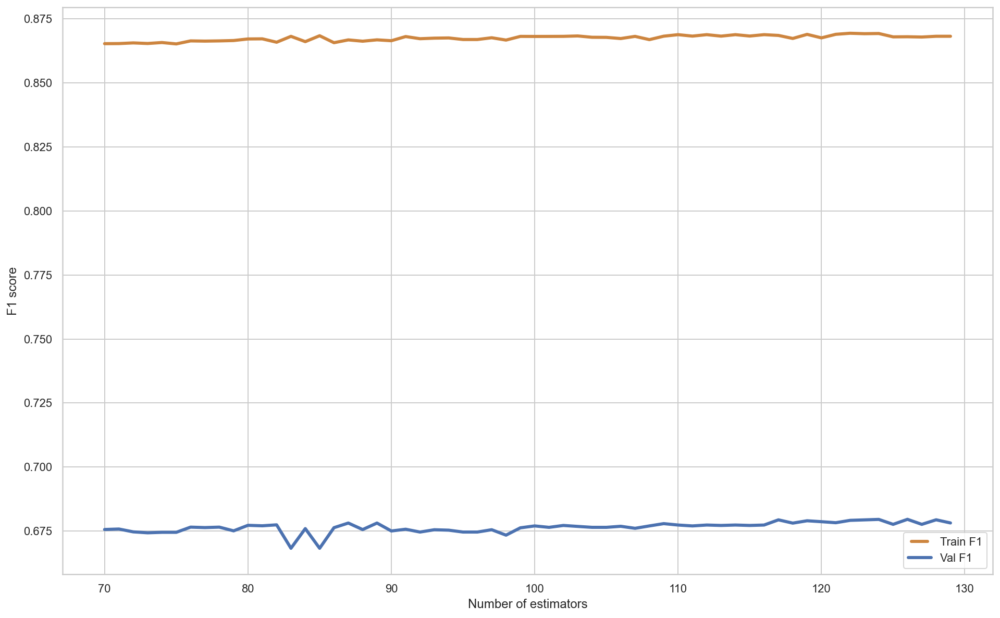

In [412]:
num_estimators = list(range(70,130))
calculate_f1(num_estimators, X_train, X_val, y_train, y_val,'Number of estimators')

The best train value is  1.650000000000001
The best val value is  1.1000000000000005


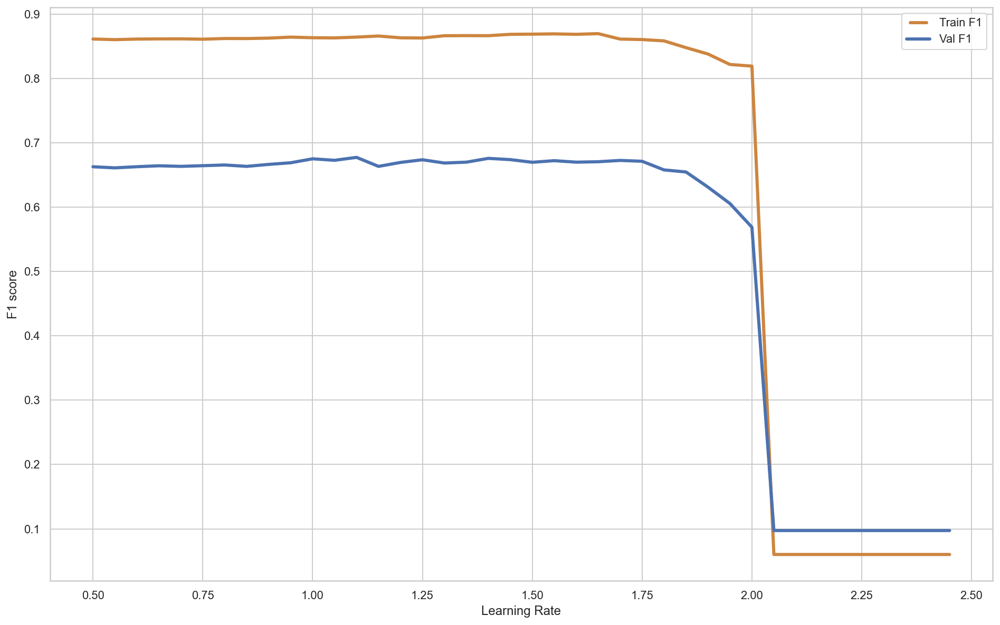

In [414]:
learning_rate = list(np.arange(0.5, 2.5, 0.05))
calculate_f1(learning_rate, X_train, X_val, y_train, y_val,'Learning Rate')


### Run Two 

In [ ]:
AdaBoost = AdaBoostClassifier()

AdaBoost_parameters = {'base_estimator' : [None, modelNB, modelQDA_final, pac_1, modelLDA_final],
                        'n_estimators' : list(range(70,130)),
                        'learning_rate' : np.arange(1.0, 2.0, 0.05),
                        'algorithm' : ['SAMME', 'SAMME.R']}
AdaBoost_grid = GridSearchCV(estimator=AdaBoost, param_grid=AdaBoost_parameters, 
                               scoring='accuracy', verbose=1, n_jobs=-1)

AdaBoost_grid.fit(X_train , y_train)
AdaBoost_grid.best_params_

In [182]:
modelAdaBoost = AdaBoostClassifier(base_estimator=None, n_estimators=98, learning_rate=1.2, algorithm='SAMME.R', random_state=5)
modelAdaBoost.fit(X_train,y_train)

AdaBoostClassifier(learning_rate=1.2, n_estimators=98, random_state=5)

In [183]:
labels_train = modelAdaBoost.predict(X_train)
accuracy_score(y_train, labels_train)

0.8597576530612245

In [184]:
labels_val = modelAdaBoost.predict(X_val)
accuracy_score(y_val, labels_val)

0.8607142857142858

In [260]:
df= pd.DataFrame(columns = ['Time','Train','Validation'], index = ['Raw'])
show_results_1(df, modelAdaBoost)

,Time,Train,Validation
Raw,0.882+/-0.04,0.86+/-0.0,0.859+/-0.01


In [177]:
metrics(y_train, labels_train, y_val, labels_val)

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.88      0.94      0.91     11962
           1       0.77      0.59      0.67      3718

    accuracy                           0.86     15680
   macro avg       0.82      0.77      0.79     15680
weighted avg       0.85      0.86      0.85     15680

[[11297   665]
 [ 1534  2184]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.88      0.95      0.91      5127
           1       0.77   

### Gradient Boosting Classifier

In [415]:
def calculate_f1_2(interval, x_train, x_val, y_train, y_val, parameter):
    train_results = []
    val_results = []
    for value in interval:
        if parameter == 'Number of estimators':
            dt = GradientBoostingClassifier(n_estimators = value, random_state = 5)
        elif parameter == 'Learning Rate':
            dt = GradientBoostingClassifier(learning_rate = value, random_state = 5)
        dt.fit(x_train, y_train)
        train_results.append(f1_score(y_train,dt.predict(x_train)))
        val_results.append(f1_score(y_val,dt.predict(x_val)))
    value_train = train_results.index(max(train_results))
    value_val = val_results.index(max(val_results))
    print('The best train value is ',interval[value_train])
    print('The best val value is ',interval[value_val])

    fig = plt.figure(figsize = (16,10))
    line1, = plt.plot(interval, train_results, '#515C60', label="Train F1", linewidth=3,color='peru')
    line2, = plt.plot(interval, val_results, '#C7DC1F', label="Val F1", linewidth=3,color='b')
    plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
    plt.ylabel("F1 score")
    plt.xlabel(str(parameter))
    plt.show()

The best train value is  0.46
The best val value is  0.21000000000000002


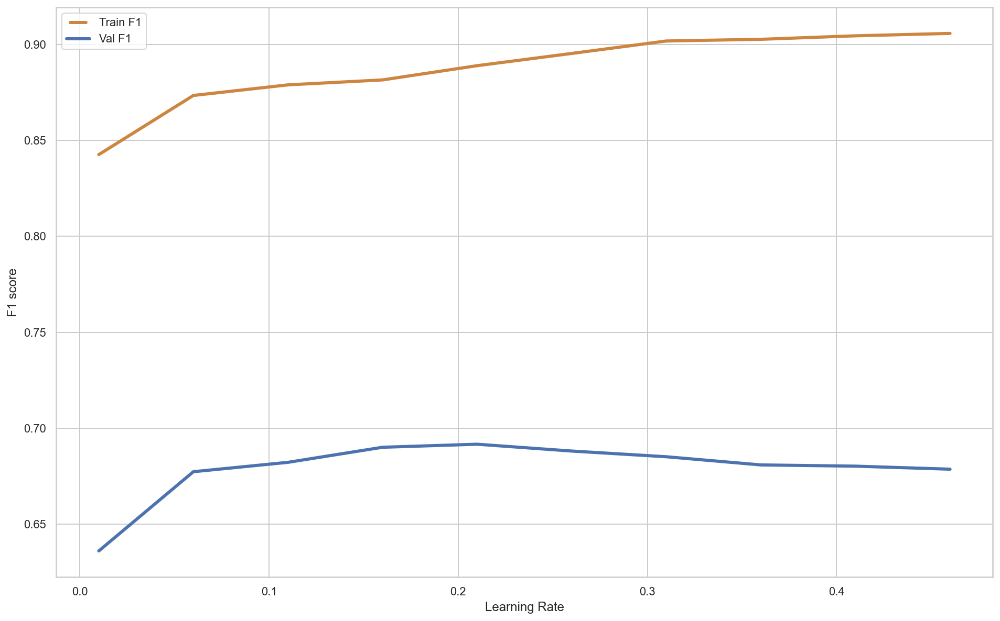

In [479]:
learning_rate = list(np.arange(0.01, 0.5, 0.05))
calculate_f1_2(learning_rate, X_train, X_val, y_train, y_val,'Learning Rate')

The best train value is  0.9500000000000001
The best val value is  0.3


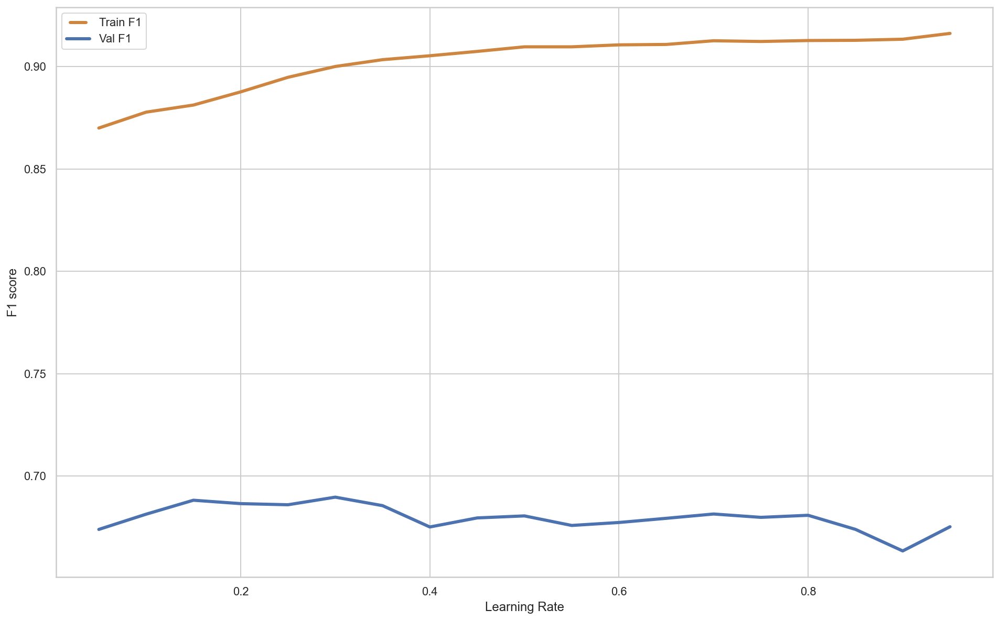

In [417]:
learning_rate = list(np.arange(0.05, 1, 0.05))
calculate_f1_2(learning_rate, X_train, X_val, y_train, y_val,'Learning Rate')

The best train value is  191
The best val value is  171


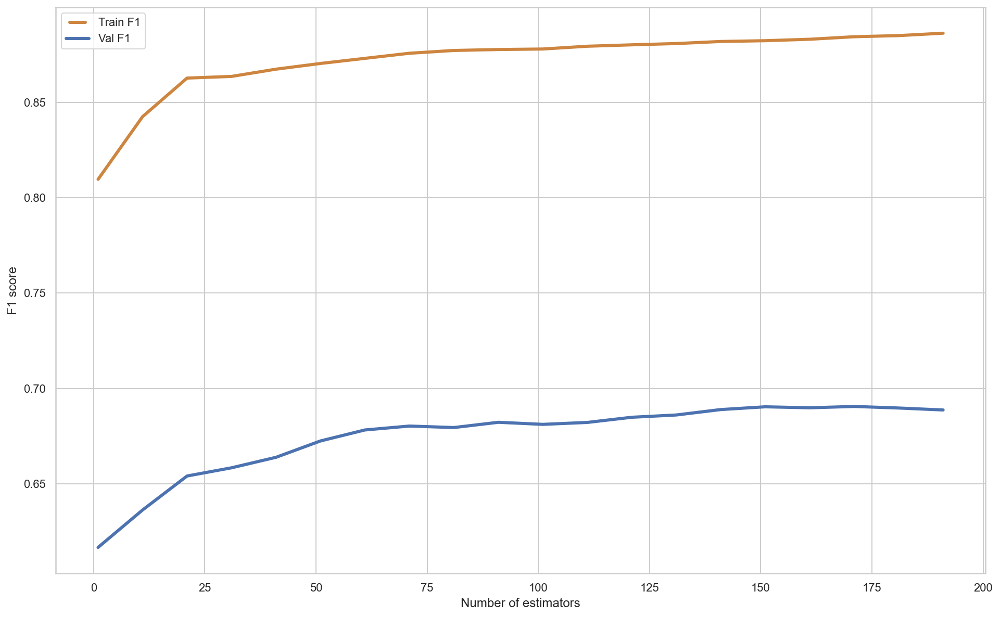

In [419]:
num_estimators = list(np.arange(1, 200, 10)) 
calculate_f1_2(num_estimators, X_train, X_val, y_train, y_val,'Number of estimators')

In [465]:
modelGBauto = GradientBoostingClassifier(max_features='auto', random_state=5)
modelGBlog = GradientBoostingClassifier(max_features='log2',random_state=5)
modelGBsqrt = GradientBoostingClassifier(max_features='sqrt',random_state=5)
modelGBnone = GradientBoostingClassifier(max_features=None,random_state=5)

In [478]:
df= pd.DataFrame(columns = ['Time','Train','Validation'], index = ['Auto','Log2','Sqrt','None/Raw'])
show_results_1(df, modelGBauto, modelGBlog, modelGBsqrt, modelGBnone)

,Time,Train,Validation
Auto,1.342+/-0.04,0.864+/-0.0,0.86+/-0.01
Log2,0.661+/-0.01,0.861+/-0.0,0.857+/-0.01
Sqrt,0.686+/-0.07,0.861+/-0.0,0.857+/-0.01
None/Raw,1.372+/-0.13,0.864+/-0.0,0.86+/-0.01


In [480]:
modelGBdev = GradientBoostingClassifier(loss='deviance', random_state=5)
modelGBexp = GradientBoostingClassifier(loss='exponential',random_state=5)

In [481]:
df= pd.DataFrame(columns = ['Time','Train','Validation'], index = ['deviance','exponential'])
show_results_1(df, modelGBdev, modelGBexp)

,Time,Train,Validation
deviance,1.38+/-0.07,0.864+/-0.0,0.86+/-0.01
exponential,1.412+/-0.07,0.863+/-0.0,0.86+/-0.01


In [482]:
modelGB2 = GradientBoostingClassifier(max_depth=2, random_state=5)
modelGB3 = GradientBoostingClassifier(max_depth=3,random_state=5)
modelGB10 = GradientBoostingClassifier(max_depth=10,random_state=5)
modelGB30 = GradientBoostingClassifier(max_depth=30,random_state=5)
modelGB50 = GradientBoostingClassifier(max_depth=50,random_state=5)

In [483]:
df= pd.DataFrame(columns = ['Time','Train','Validation'], index = ['model2','model3','model10','model30','model50'])
show_results_1(df, modelGB2, modelGB3,modelGB10,modelGB30,modelGB50)

,Time,Train,Validation
model2,1.069+/-0.04,0.859+/-0.0,0.857+/-0.01
model3,1.31+/-0.01,0.864+/-0.0,0.86+/-0.01
model10,5.87+/-0.28,0.922+/-0.0,0.852+/-0.01
model30,27.402+/-1.22,0.94+/-0.0,0.827+/-0.01
model50,26.376+/-0.27,0.94+/-0.0,0.828+/-0.01


### Run Tree

In [ ]:
GB_clf = GradientBoostingClassifier()

GB_parameters = {'loss' : [ 'deviance'],
                   'learning_rate' : np.arange(0.05, 0.8, 0.05),
                   'n_estimators' : np.arange(130, 200, 5),
                   'max_depth' : np.arange(1, 3, 1),
                   'max_features' : ['auto', None]
                }

GB_grid = GridSearchCV(estimator=GB_clf, param_grid=GB_parameters, scoring='accuracy', verbose=1, n_jobs=-1)
GB_grid.fit(X_train , y_train)
GB_grid.best_params_

In [211]:
modelGB = GradientBoostingClassifier(learning_rate=1.0, loss='exponential', max_depth=2, max_features='log2',
                               n_estimators=170, random_state=5)
modelGB.fit(X_train, y_train)

GradientBoostingClassifier(learning_rate=1.0, loss='exponential', max_depth=2,
                           max_features='log2', n_estimators=170,
                           random_state=5)

In [212]:
labels_train = modelGB.predict(X_train)
accuracy_score(y_train, labels_train)

0.8677295918367347

In [213]:
labels_val = modelGB.predict(X_val)
accuracy_score(y_val, labels_val)

0.8639880952380953

In [214]:
df= pd.DataFrame(columns = ['Time','Train','Validation'], index = ['Raw'])
show_results_1(df, modelGB)

,Time,Train,Validation
Raw,1.16+/-0.15,0.868+/-0.0,0.862+/-0.01


In [215]:
metrics(y_train, labels_train, y_val, labels_val)

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.89      0.94      0.92     11962
           1       0.77      0.63      0.69      3718

    accuracy                           0.87     15680
   macro avg       0.83      0.79      0.80     15680
weighted avg       0.86      0.87      0.86     15680

[[11263   699]
 [ 1375  2343]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.89      0.94      0.91      5127
           1       0.76   

In [219]:
# Teste 

In [216]:
# modelGB = GradientBoostingClassifier(learning_rate=1.0, max_depth=2, max_features='log2',
#                                n_estimators=170, random_state=5)
# modelGB.fit(X_train, y_train)

GradientBoostingClassifier(learning_rate=1.0, max_depth=2, max_features='log2',
                           n_estimators=170, random_state=5)

In [218]:
# labels_train = modelGB.predict(X_train)
# print(accuracy_score(y_train, labels_train))

# labels_val = modelGB.predict(X_val)
# print(accuracy_score(y_val, labels_val))

0.8699617346938775
0.8607142857142858


# <font color='#E8800A'>MinMax without outliers</font> <a class="anchor" id="fourth-bullet"></a>

  [Back to Baseline](#second-bullet)

  [Back to Newland](#Newland)

### Normalization

In [93]:
df_train2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 22400 entries, 12486 to 34885
Data columns (total 29 columns):
 #   Column                              Non-Null Count  Dtype         
---  ------                              --------------  -----         
 0   Name                                22400 non-null  object        
 1   Birthday                            22400 non-null  datetime64[ns]
 2   Native Continent                    22400 non-null  object        
 3   Marital Status                      22400 non-null  object        
 4   Lives with                          22400 non-null  object        
 5   Base Area                           22400 non-null  object        
 6   Education Level                     22400 non-null  object        
 7   Years of Education                  22400 non-null  int64         
 8   Employment Sector                   22400 non-null  object        
 9   Role                                22400 non-null  object        
 10  Working Hours per 

In [94]:
df_train3=df_train2.copy()

# Removing outliers from these variables and then applying min max as before
filters = (
    (df_train3['Money Received']<120000)
    &
    (df_train3['Ticket Price']<4000)
)

df_train_out=df_train3[filters]
target_out=target[filters]

metric= df_train_out.loc[:,(np.array(df_train2.dtypes=="int64")) | (np.array(df_train2.dtypes=="float64"))]

# Normalizing using min max
min_max_scaler = preprocessing.MinMaxScaler()
metric_scaled = min_max_scaler.fit_transform(metric.values)
stand_metric= pd.DataFrame(metric_scaled, columns=metric.columns, index=metric.index)

### Feature Selection for numeric variables

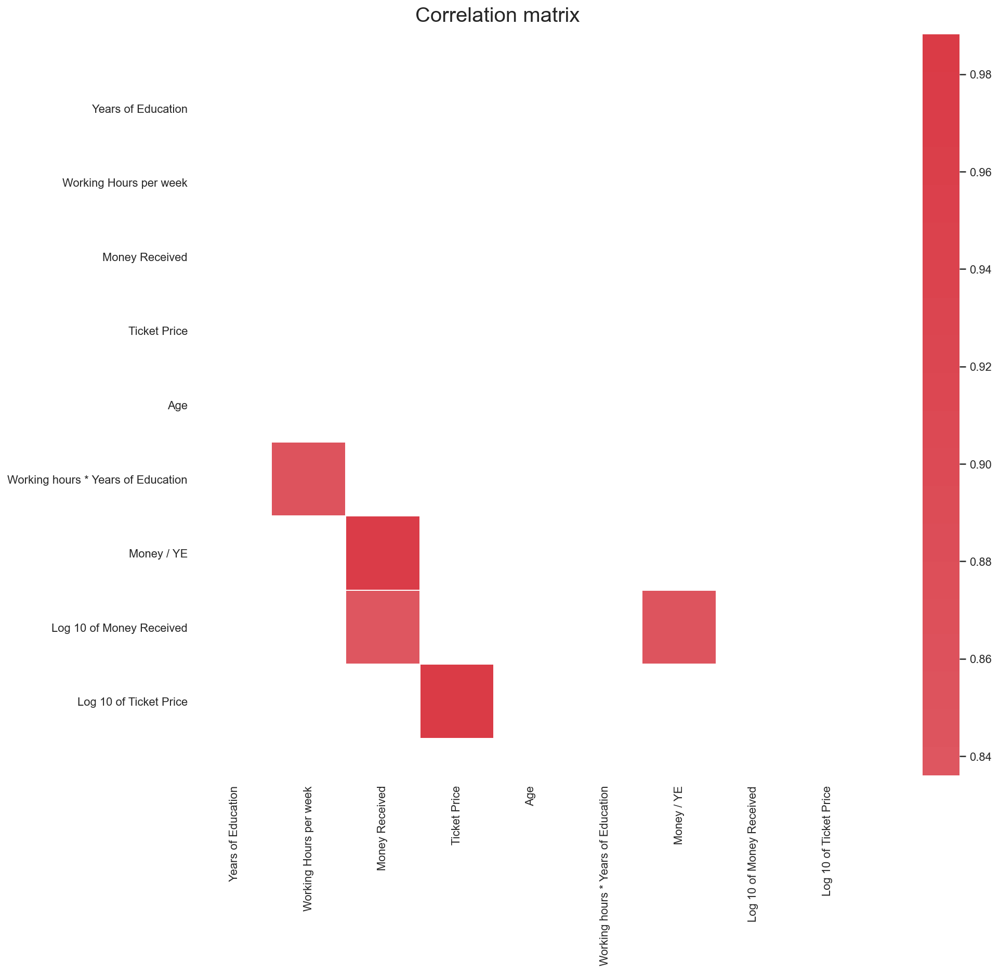

In [99]:
sns.set(style="white")

# Compute the correlation matrix
corr = stand_metric.corr() #Getting correlation of numerical variables

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool) #Return an array of zeros (Falses) with the same shape and type as a given array
mask[np.triu_indices_from(mask)] = True #The upper-triangle array is now composed by True values

# Set up the matplotlib figure
fig, ax = plt.subplots(figsize=(20, 12))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True) #Make a diverging palette between two HUSL colors. Return a matplotlib colormap object.

# Draw the heatmap with the mask and correct aspect ratio
#show only corr bigger than 0.6 in absolute value
sns.heatmap(corr[(corr>=.7) | (corr<=-.7)], mask=mask, cmap=cmap, center=0, square=True, linewidths=.5, ax=ax)

# Layout
plt.subplots_adjust(top=0.95)
plt.suptitle("Correlation matrix", fontsize=20)
plt.yticks(rotation=0)
plt.xticks(rotation=90)
# Fixing the bug of partially cut-off bottom and top cells
b, t = plt.ylim() # discover the values for bottom and top
b += 0.5 # Add 0.5 to the bottom
t -= 0.5 # Subtract 0.5 from the top
plt.ylim(b, t) # update the ylim(bottom, top) values

plt.show()

In [100]:
#no of features
nof_list=np.arange(1,len(stand_metric.columns)+1)  
high_score=0

#Variable to store the optimum features
nof=0           
score_list =[]
for n in range(len(nof_list)):
    # we are going to see in the next class this "train_test_split()"...
    X_train, X_test, y_train, y_test = train_test_split(stand_metric,target, test_size = 0.3, random_state = 0)
    
    model = LogisticRegression()
    rfe = RFE(model,nof_list[n])
    X_train_rfe = rfe.fit_transform(X_train,y_train)
    X_test_rfe = rfe.transform(X_test)
    model.fit(X_train_rfe,y_train)
    
    score = model.score(X_test_rfe,y_test)
    score_list.append(score)
    
    if(score>high_score):
        high_score = score
        nof = nof_list[n]
print("Optimum number of features: %d" %nof)
print("Score with %d features: %f" % (nof, high_score))
#baseline c minmax 7 features 0.811 antes sem tirar outliers

Optimum number of features: 6
Score with 6 features: 0.807330


In [101]:
rfe = RFE(estimator = model, n_features_to_select = 6)
X_rfe = rfe.fit_transform(X = stand_metric, y = target)
model = LogisticRegression().fit(X = X_rfe,y = target)
selected_features = pd.Series(rfe.support_, index = stand_metric.columns)
selected_features
#minmax sem tirar outliers nao tira Working hours * Years of Education

Years of Education                     True
Working Hours per week                 True
Money Received                         True
Ticket Price                           True
Age                                    True
Working hours * Years of Education    False
Money / YE                             True
Log 10 of Money Received              False
Log 10 of Ticket Price                False
dtype: bool

Best alpha using built-in LassoCV: 0.000024
Best score using built-in LassoCV: 0.258004
Lasso picked 9 variables and eliminated the other 0 variables


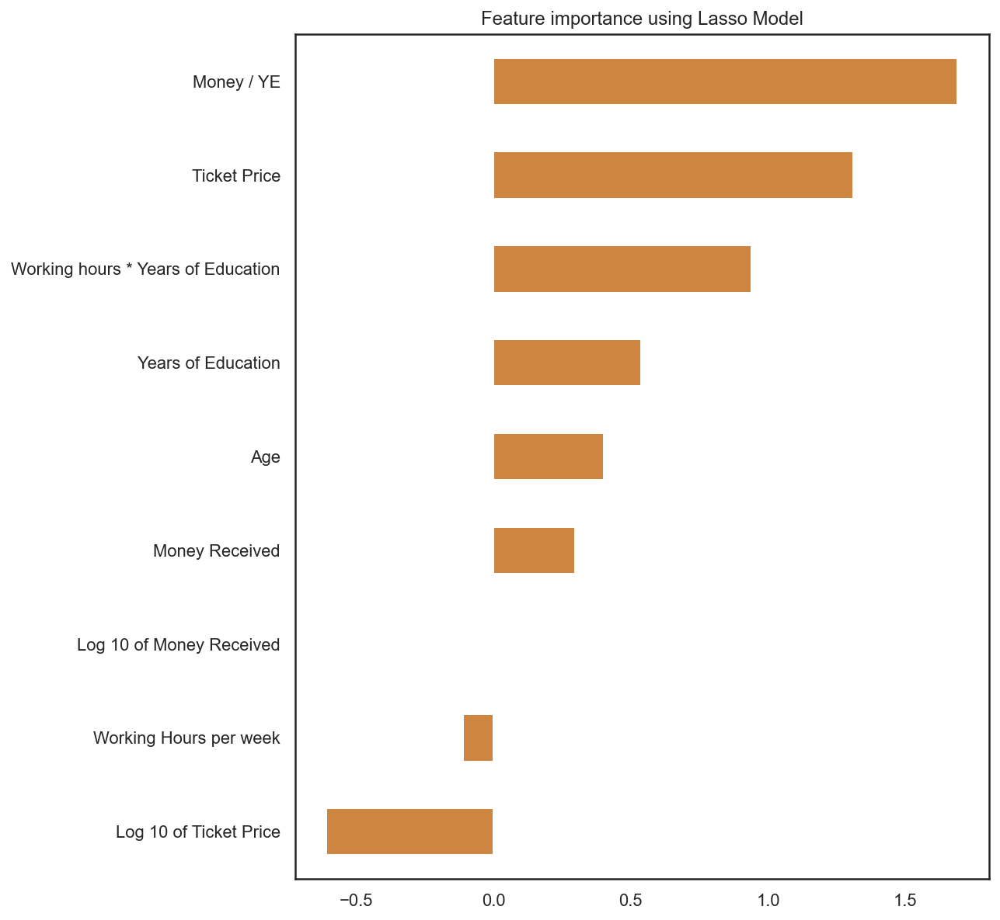

In [102]:
#Lasso
def plot_importance(coef,name):
    imp_coef = coef.sort_values()
    plt.figure(figsize=(8,10))
    imp_coef.plot(kind = "barh", color="peru")
    plt.title("Feature importance using " + name + " Model")
    plt.show()
    
reg = LassoCV()

reg.fit(X=stand_metric, y=target)
print("Best alpha using built-in LassoCV: %f" % reg.alpha_)
print("Best score using built-in LassoCV: %f" %reg.score(X = stand_metric,y = target))
coef = pd.Series(reg.coef_, index = stand_metric.columns)
print("Lasso picked " + str(sum(coef != 0)) + " variables and eliminated the other " +  str(sum(coef == 0)) + " variables")
plot_importance(coef,'Lasso') #minmax sem tirar outliers nao tira nenhuma

Lasso: tirar log10 money received

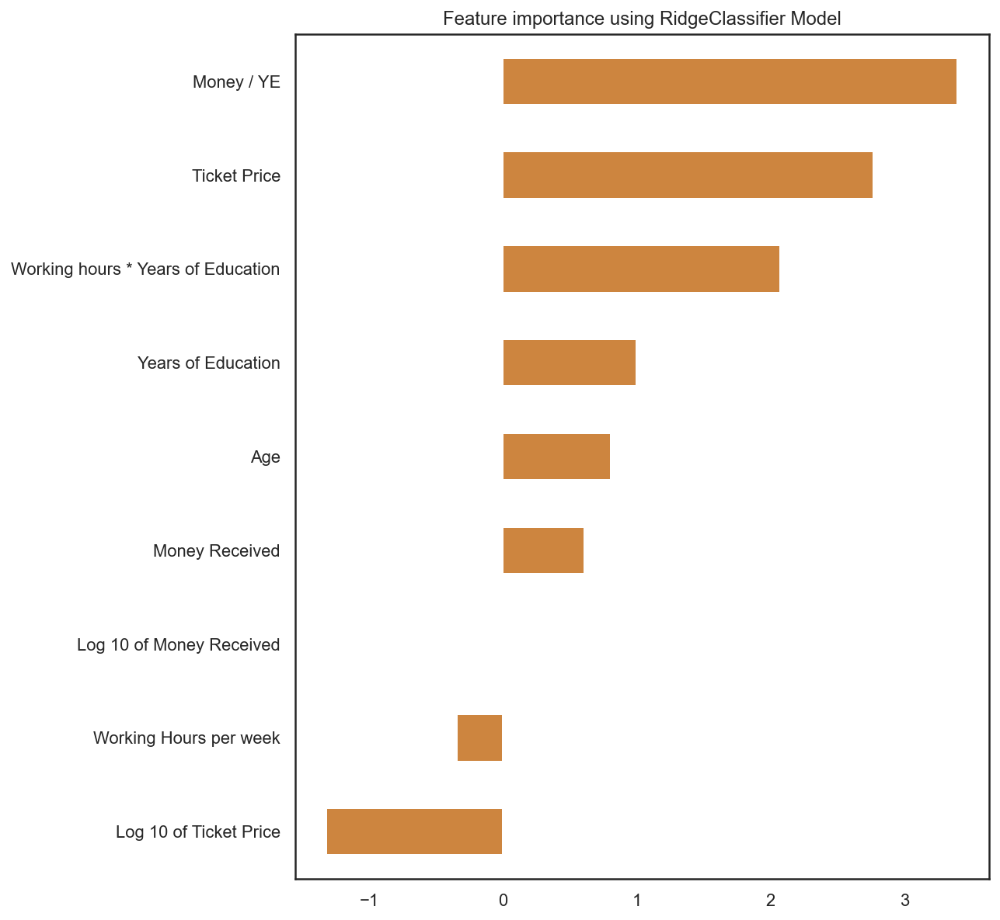

In [103]:
ridge = RidgeClassifierCV().fit(X = stand_metric,y = target)
coef_ridge = pd.Series(ridge.coef_[0], index = stand_metric.columns)

def plot_importance(coef,name):
    imp_coef = coef.sort_values()
    plt.figure(figsize=(8,10))
    imp_coef.plot(kind = "barh", color="peru")
    plt.title("Feature importance using " + name + " Model")
    plt.show()
    
plot_importance(coef_ridge,'RidgeClassifier') 
#minmax: money/yearseduc more important and ticket price

#### Forward

In [104]:
model = LogisticRegression()

In [105]:
forward = SFS(model, k_features=9, forward=True, scoring="accuracy", cv = None) #floating=False

forward.fit(stand_metric, target)

SequentialFeatureSelector(cv=None, estimator=LogisticRegression(), k_features=9,
                          scoring='accuracy')

In [106]:
forward_table = pd.DataFrame.from_dict(forward.get_metric_dict()).T.drop(columns=['cv_scores', 'ci_bound', 'std_dev', 'std_err'])
forward_table
#min max sem tirar: more important is the 2th 0.8167

,feature_idx,avg_score,feature_names
1,"(2,)",0.801266,"(Money Received,)"
2,"(2, 3)",0.812665,"(Money Received, Ticket Price)"
3,"(2, 3, 8)",0.815224,"(Money Received, Ticket Price, Log 10 of Ticke..."
4,"(2, 3, 7, 8)",0.815224,"(Money Received, Ticket Price, Log 10 of Money..."
5,"(2, 3, 6, 7, 8)",0.814371,"(Money Received, Ticket Price, Money / YE, Log..."
6,"(0, 2, 3, 6, 7, 8)",0.811633,"(Years of Education, Money Received, Ticket Pr..."
7,"(0, 2, 3, 5, 6, 7, 8)",0.814506,"(Years of Education, Money Received, Ticket Pr..."
8,"(0, 2, 3, 4, 5, 6, 7, 8)",0.8185,"(Years of Education, Money Received, Ticket Pr..."
9,"(0, 1, 2, 3, 4, 5, 6, 7, 8)",0.817288,"(Years of Education, Working Hours per week, M..."


In [107]:
forward_table_max = forward_table['avg_score'].max()
forward_table_max #aqui o melhor está a ser manter 8

0.8185000673219335

In [108]:
forward_table[forward_table['avg_score']==forward_table_max]['feature_names'].values

array([('Years of Education', 'Money Received', 'Ticket Price', 'Age', 'Working hours * Years of Education', 'Money / YE', 'Log 10 of Money Received', 'Log 10 of Ticket Price')],
      dtype=object)

#### Backward

In [109]:
backward = SFS(model, k_features=1, forward=False, scoring="accuracy", cv = None) #floating=False

backward.fit(stand_metric, target)

SequentialFeatureSelector(cv=None, estimator=LogisticRegression(),
                          forward=False, scoring='accuracy')

In [110]:
backward_table = pd.DataFrame.from_dict(backward.get_metric_dict()).T.drop(columns=['cv_scores', 'ci_bound', 'std_dev', 'std_err'])
backward_table 

,feature_idx,avg_score,feature_names
9,"(0, 1, 2, 3, 4, 5, 6, 7, 8)",0.817288,"(Years of Education, Working Hours per week, M..."
8,"(0, 2, 3, 4, 5, 6, 7, 8)",0.8185,"(Years of Education, Money Received, Ticket Pr..."
7,"(0, 2, 3, 4, 5, 6, 7)",0.818231,"(Years of Education, Money Received, Ticket Pr..."
6,"(0, 2, 3, 4, 5, 6)",0.817513,"(Years of Education, Money Received, Ticket Pr..."
5,"(0, 3, 4, 5, 6)",0.817333,"(Years of Education, Ticket Price, Age, Workin..."
4,"(0, 3, 5, 6)",0.814147,"(Years of Education, Ticket Price, Working hou..."
3,"(0, 3, 6)",0.811678,"(Years of Education, Ticket Price, Money / YE)"
2,"(3, 6)",0.810691,"(Ticket Price, Money / YE)"
1,"(6,)",0.799515,"(Money / YE,)"


In [111]:
backward_table_max = backward_table['avg_score'].max()
backward_table_max
#money receive loses importance here
#chosing same nº of variables (6), this has a higher score(0.82) than minmax (0.816)

0.8185000673219335

In [112]:
backward_table[backward_table['avg_score']==backward_table_max]['feature_names'].values

array([('Years of Education', 'Money Received', 'Ticket Price', 'Age', 'Working hours * Years of Education', 'Money / YE', 'Log 10 of Money Received', 'Log 10 of Ticket Price')],
      dtype=object)

### Mixing numerical and categorical variables on a Forward and a Backward Feature Selection

In [136]:
stand_metric.drop(columns=['Working Hours per week', 'Log 10 of Money Received', 'Log 10 of Ticket Price'], inplace=True)

In [137]:
all_selected_variables = pd.concat([non_metric_selected, stand_metric], axis=1)

In [138]:
all_selected_variables

,Male,Higher Education,x1_Management,x1_Professor,x2_Married,x2_Single,x3_Bachelors,x3_Masters,x5_1,x5_3,x5_5,Years of Education,Money Received,Ticket Price,Age,Working hours * Years of Education,Money / YE
CITIZEN_ID,,,,,,,,,,,,,,,,,
12486,1,1,0,0,1,0,0,0,0,0,0,0.619048,0.000000,0.615156,0.383562,0.250120,0.000000
12487,1,0,0,0,1,0,0,0,0,1,0,0.571429,0.000000,0.000000,0.342466,0.230880,0.000000
12488,1,0,0,0,1,0,0,0,0,0,0,0.571429,0.000000,0.628146,0.301370,0.265512,0.000000
12489,1,0,0,0,1,0,0,0,0,0,0,0.523810,0.106178,0.000000,0.630137,0.195767,0.116949
12490,1,1,0,1,0,1,0,0,0,1,0,1.000000,0.000000,0.000000,0.219178,0.454545,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34881,0,0,0,0,0,0,0,0,0,1,0,0.571429,0.000000,0.000000,0.109589,0.230880,0.000000
34882,1,0,0,0,0,1,0,0,0,1,0,0.571429,0.000000,0.000000,0.082192,0.202020,0.000000
34883,0,1,0,1,0,1,0,1,0,0,0,0.809524,0.052626,0.000000,0.123288,0.327080,0.037506


In [139]:
model = LogisticRegression()

Forward:

In [140]:
forward = SFS(model, k_features=16, forward=True, scoring="accuracy", cv = None) #floating=False

forward.fit(all_selected_variables, target)

SequentialFeatureSelector(cv=None, estimator=LogisticRegression(),
                          k_features=16, scoring='accuracy')

In [141]:
forward_table = pd.DataFrame.from_dict(forward.get_metric_dict()).T.drop(columns=['cv_scores', 'ci_bound', 'std_dev', 'std_err'])
forward_table

,feature_idx,avg_score,feature_names
1,"(12,)",0.801266,"(Money Received,)"
2,"(12, 13)",0.812665,"(Money Received, Ticket Price)"
3,"(9, 12, 13)",0.814281,"(x5_3, Money Received, Ticket Price)"
4,"(9, 12, 13, 16)",0.815538,"(x5_3, Money Received, Ticket Price, Money / YE)"
5,"(8, 9, 12, 13, 16)",0.814326,"(x5_1, x5_3, Money Received, Ticket Price, Mon..."
6,"(4, 8, 9, 12, 13, 16)",0.813473,"(x2_Married, x5_1, x5_3, Money Received, Ticke..."
7,"(4, 8, 9, 11, 12, 13, 16)",0.841838,"(x2_Married, x5_1, x5_3, Years of Education, M..."
8,"(2, 4, 8, 9, 11, 12, 13, 16)",0.843903,"(x1_Management, x2_Married, x5_1, x5_3, Years ..."
9,"(2, 4, 8, 9, 11, 12, 13, 14, 16)",0.844666,"(x1_Management, x2_Married, x5_1, x5_3, Years ..."
10,"(2, 4, 8, 9, 11, 12, 13, 14, 15, 16)",0.845115,"(x1_Management, x2_Married, x5_1, x5_3, Years ..."


o 10 é o melhor tendo em conta both o numero de variaves e o score

In [142]:
forward_table.loc[10, 'avg_score']

0.8451146716933711

In [143]:
forward_table.loc[10, 'feature_names']

('x1_Management',
 'x2_Married',
 'x5_1',
 'x5_3',
 'Years of Education',
 'Money Received',
 'Ticket Price',
 'Age',
 'Working hours * Years of Education',
 'Money / YE')

Backward

In [144]:
backward = SFS(model, k_features=1, forward=False, scoring="accuracy", cv = None) #floating=False

backward.fit(all_selected_variables, target)

SequentialFeatureSelector(cv=None, estimator=LogisticRegression(),
                          forward=False, scoring='accuracy')

In [145]:
backward_table = pd.DataFrame.from_dict(backward.get_metric_dict()).T.drop(columns=['cv_scores', 'ci_bound', 'std_dev', 'std_err'])
backward_table

,feature_idx,avg_score,feature_names
17,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",0.844935,"(Male, Higher Education, x1_Management, x1_Pro..."
16,"(0, 1, 2, 3, 4, 6, 7, 8, 9, 10, 11, 12, 13, 14...",0.845608,"(Male, Higher Education, x1_Management, x1_Pro..."
15,"(0, 1, 2, 3, 4, 6, 7, 8, 9, 11, 12, 13, 14, 15...",0.846057,"(Male, Higher Education, x1_Management, x1_Pro..."
14,"(1, 2, 3, 4, 6, 7, 8, 9, 11, 12, 13, 14, 15, 16)",0.846282,"(Higher Education, x1_Management, x1_Professor..."
13,"(1, 2, 3, 4, 7, 8, 9, 11, 12, 13, 14, 15, 16)",0.846326,"(Higher Education, x1_Management, x1_Professor..."
12,"(1, 2, 3, 4, 8, 9, 11, 12, 13, 14, 15, 16)",0.846461,"(Higher Education, x1_Management, x1_Professor..."
11,"(1, 2, 3, 4, 8, 9, 11, 12, 13, 14, 15)",0.846147,"(Higher Education, x1_Management, x1_Professor..."
10,"(1, 2, 3, 4, 8, 9, 11, 13, 14, 15)",0.845743,"(Higher Education, x1_Management, x1_Professor..."
9,"(1, 2, 3, 4, 8, 11, 13, 14, 15)",0.845788,"(Higher Education, x1_Management, x1_Professor..."
8,"(2, 3, 4, 8, 11, 13, 14, 15)",0.845519,"(x1_Management, x1_Professor, x2_Married, x5_1..."


In [146]:
backward_table.loc[9, 'avg_score'] #o melhor é 9 tendo em conta ambas

0.8457878910282304

In [147]:
backward_table.loc[9, 'feature_names'] 

('Higher Education',
 'x1_Management',
 'x1_Professor',
 'x2_Married',
 'x5_1',
 'Years of Education',
 'Ticket Price',
 'Age',
 'Working hours * Years of Education')

Mantaining the variables that appear on both the forward and backward selections:

In [148]:
all_selected_variables=all_selected_variables[['x1_Management','x2_Married','x5_1','Years of Education',
                                               'Ticket Price','Age','Working hours * Years of Education']]

In [149]:
non_metric_bf=all_selected_variables[['x1_Management','x2_Married','x5_1']]
stand_metric=all_selected_variables[['Years of Education','Ticket Price','Age','Working hours * Years of Education']]

### Checking point biserial among the selected numerical and categorical variables

In [150]:
from scipy.stats import pointbiserialr

print('Point biserial between binary and metric variables:\n')
for i in non_metric_bf.columns:
    for j in stand_metric.columns:
        pb = pointbiserialr(non_metric_bf[i], stand_metric[j])
        
        if abs(pb[0]) > 0.5:
            print(i, 'and', j, ':', round(pb[0], 3))

Point biserial between binary and metric variables:



In [ ]:
all_selected_variables.columns

In [ ]:
all_variables_test = pd.concat([df_test, ohc_df_test], axis=1)

test=all_variables_tests[['x1_Management','x2_Married','x5_1','Years of Education',
                                               'Ticket Price','Age','Working hours * Years of Education']]

## Data Partition

In [151]:
#o que acham? kfold vale a pena, fazer as funções e assim?

In [152]:
X_train, X_val, y_train, y_val = train_test_split(all_selected_variables,
                                                  target,
                                                  test_size = 0.3,
                                                  random_state = 42,
                                                  shuffle=True,
                                                  stratify=target)

# Predictive Modelling

In [153]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix #confusion_matrix to evaluate the accuracy of a classification 
from sklearn.metrics import accuracy_score
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
import time
from sklearn.model_selection import KFold
from sklearn.tree import export_graphviz
import graphviz
import pydotplus
from sklearn.metrics import auc
from sklearn.metrics import roc_curve
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import PassiveAggressiveClassifier
from numpy import mean
from numpy import std
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, StackingClassifier
from sklearn.metrics import f1_score
import matplotlib.pyplot as plt
from matplotlib.legend_handler import HandlerLine2D
from sklearn.svm import SVC

In [154]:
# Functions to be used in all models to assess them

def metrics(y_train, pred_train , y_val, pred_val):
    print('_____________________________________')
    print('                                                     TRAIN                                                 ')
    print('-----------------------------------------------------------------------------------------------------------')
    print(classification_report(y_train, pred_train))
    print(confusion_matrix(y_train, pred_train)) #true neg and true pos, false positives and false neg
    print('__________________________+_________')
    print('                                                VALIDATION                                                 ')
    print('-----------------------------------------------------------------------------------------------------------')
    print(classification_report(y_val, pred_val))
    print(confusion_matrix(y_val, pred_val))
    
    
def avg_score(model):
    # apply kfold
    kf = KFold(n_splits=10)
    # create lists to store the results from the different models 
    score_train = []
    score_val = []
    timer = []
    n_iter = []
    for train_index, val_index in kf.split(all_selected_variables):
        # get the indexes of the observations assigned for each partition
        X_train, X_val = all_selected_variables.iloc[train_index], all_selected_variables.iloc[val_index]
        y_train, y_val = target.iloc[train_index], target.iloc[val_index]
        # start counting time
        begin = time.perf_counter()
        # fit the model to the data
        model.fit(X_train, y_train)
        # finish counting time
        end = time.perf_counter()
        # check the mean accuracy for the train
        value_train = model.score(X_train, y_train)
        # check the mean accuracy for the test
        value_val = model.score(X_val,y_val)
        # append the accuracies, the time and the number of iterations in the corresponding list
        score_train.append(value_train)
        score_val.append(value_val)
        timer.append(end-begin)
        n_iter.append(model.n_iter_)
    # calculate the average and the std for each measure (accuracy, time and number of iterations)
    avg_time = round(np.mean(timer),3)
    avg_train = round(np.mean(score_train),3)
    avg_val = round(np.mean(score_val),3)
    std_time = round(np.std(timer),2)
    std_train = round(np.std(score_train),2)
    std_val = round(np.std(score_val),2)
    avg_iter = round(np.mean(n_iter),1)
    std_iter = round(np.std(n_iter),1)
    
    return str(avg_time) + '+/-' + str(std_time), str(avg_train) + '+/-' + str(std_train),\
str(avg_val) + '+/-' + str(std_val), str(avg_iter) + '+/-' + str(std_iter)


def show_results(df, *args):
    """
    Receive an empty dataframe and the different models and call the function avg_score
    """
    count = 0
    # for each model passed as argument
    for arg in args:
        # obtain the results provided by avg_score
        time, avg_train, avg_val, avg_iter = avg_score(arg)
        # store the results in the right row
        df.iloc[count] = time, avg_train, avg_val, avg_iter
        count+=1
    return df

In [155]:
# For the models that don't have n_iter attribute

def avg_score_1(model):
    # apply kfold
    kf = KFold(n_splits=10)
    # create lists to store the results from the different models 
    score_train = []
    score_val = []
    timer = []
    n_iter = []
    for train_index, val_index in kf.split(all_selected_variables):
        # get the indexes of the observations assigned for each partition
        X_train, X_val = all_selected_variables.iloc[train_index], all_selected_variables.iloc[val_index]
        y_train, y_val = target.iloc[train_index], target.iloc[val_index]
        # start counting time
        begin = time.perf_counter()
        # fit the model to the data
        model.fit(X_train, y_train)
        # finish counting time
        end = time.perf_counter()
        # check the mean accuracy for the train
        value_train = model.score(X_train, y_train)
        # check the mean accuracy for the validation
        value_val = model.score(X_val,y_val)
        # append the accuracies, the time and the number of iterations in the corresponding list
        score_train.append(value_train)
        score_val.append(value_val)
        timer.append(end-begin)
        #n_iter.append(model.n_iter_)
    # calculate the average and the std for each measure (accuracy, time and number of iterations)
    avg_time = round(np.mean(timer),3)
    avg_train = round(np.mean(score_train),3)
    avg_val = round(np.mean(score_val),3)
    std_time = round(np.std(timer),2)
    std_train = round(np.std(score_train),2)
    std_val = round(np.std(score_val),2)
    #avg_iter = round(np.mean(n_iter),1)
    #std_iter = round(np.std(n_iter),1)
    
    return str(avg_time) + '+/-' + str(std_time), str(avg_train) + '+/-' + str(std_train),\
str(avg_val) + '+/-' + str(std_val)
#, str(avg_iter) + '+/-' + str(std_iter)


def show_results_1(df, *args):
    """
    Receive an empty dataframe and the different models and call the function avg_score
    """
    count = 0
    # for each model passed as argument
    for arg in args:
        # obtain the results provided by avg_score
        time, avg_train, avg_val = avg_score_1(arg)
        # store the results in the right row
        df.iloc[count] = time, avg_train, avg_val
        count+=1
    return df

## Decision Trees

In [156]:
def plot_tree(model_tree):
    dot_data = export_graphviz(model_tree,
                               feature_names=X_train.columns,  
                               class_names=["Income lower or equal to avg", "Income higher than avg"],
                               filled=True)
    pydot_graph = pydotplus.graph_from_dot_data(dot_data)
    pydot_graph.set_size('"20,20"')
    return graphviz.Source(pydot_graph.to_string())

In [157]:
#AUC
def calculate_AUC(interval, x_train, x_val, y_train, y_val, parameter, max_depth = None):
    train_results = []
    val_results = []
    for value in interval:
        if (parameter == 'max_depth'):          
            dt = DecisionTreeClassifier(max_depth = value, random_state=42)
            dt.fit(x_train, y_train)
        elif (parameter == 'max_features'):  
            dt = DecisionTreeClassifier(max_features = value, max_depth = max_depth, random_state=42)
            dt.fit(x_train, y_train)
        elif (parameter == 'min_samples_split'):  
            dt = DecisionTreeClassifier(min_samples_split = value, max_depth = max_depth, random_state=42)
            dt.fit(x_train, y_train)
        elif (parameter == 'min_samples_leaf'):  
            dt = DecisionTreeClassifier(min_samples_leaf = value, max_depth = max_depth, random_state=42)
            dt.fit(x_train, y_train)
        elif (parameter == 'min_weight_fraction_leaf'):  
            dt = DecisionTreeClassifier(min_weight_fraction_leaf = value, max_depth = max_depth, random_state=42)
            dt.fit(x_train, y_train)
        elif (parameter == 'min_impurity_decrease'):  
            dt = DecisionTreeClassifier(min_impurity_decrease = value, max_depth = max_depth, random_state=42)
            dt.fit(x_train, y_train)
        train_pred = dt.predict(x_train)
        false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, train_pred)
        roc_auc = auc(false_positive_rate, true_positive_rate)
        # Add auc score to previous train results
        train_results.append(roc_auc)
        y_pred = dt.predict(x_val)
        false_positive_rate, true_positive_rate, thresholds = roc_curve(y_val, y_pred)
        roc_auc = auc(false_positive_rate, true_positive_rate)
        # Add auc score to previous validation results
        val_results.append(roc_auc)
    value_train = train_results.index(max(train_results))
    value_val = val_results.index(max(val_results))
    print('The best train value is ',interval[value_train])
    print('The best validation value is ',interval[value_val])
    

    import matplotlib.pyplot as plt
    from matplotlib.legend_handler import HandlerLine2D
    line1, = plt.plot(interval, train_results, 'b', label="Train AUC")
    line2, = plt.plot(interval, val_results, 'r', label="Validation AUC")
    plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
    plt.ylabel("AUC score")
    plt.xlabel(str(parameter))
    plt.show()

Nota: parameters in decision trees don't really improve performance, they're meant to control overfitting

In [158]:
dt_entropy = DecisionTreeClassifier(criterion = 'entropy').fit(X_train, y_train)
dt_gini = DecisionTreeClassifier(criterion = 'gini').fit(X_train, y_train)

df = pd.DataFrame(columns = ['Time','Train','Validation'], index = ['Gini','Entropy'])
show_results_1(df,dt_gini, dt_entropy)

,Time,Train,Validation
Gini,0.083+/-0.02,0.918+/-0.0,0.823+/-0.01
Entropy,0.084+/-0.02,0.918+/-0.0,0.823+/-0.01


In [159]:
dt_random = DecisionTreeClassifier(splitter = 'random').fit(X_train, y_train)

df = pd.DataFrame(columns = ['Time','Train','Validation'], index = ['best','random'])
show_results_1(df,dt_gini, dt_random)

,Time,Train,Validation
best,0.079+/-0.01,0.918+/-0.0,0.823+/-0.01
random,0.043+/-0.01,0.918+/-0.0,0.821+/-0.01


The best train value is  15.0
The best validation value is  9.0


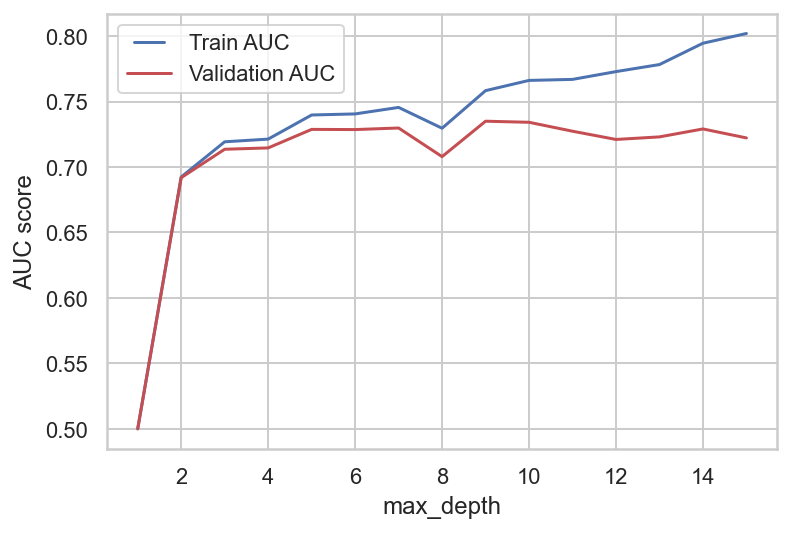

In [160]:
max_depths = np.linspace(1, 15, 15, endpoint=True)  
calculate_AUC(max_depths, X_train, X_val, y_train, y_val, 'max_depth')

In [161]:
dt_depth9 = DecisionTreeClassifier(max_depth = 9).fit(X_train, y_train)
dt_depth5 = DecisionTreeClassifier(max_depth = 5).fit(X_train, y_train)

df = pd.DataFrame(columns = ['Time','Train','Validation'], index = ['full','depth9','depth5'])
show_results_1(df,dt_gini, dt_depth9,dt_depth5)

# Quanto maior, mais overfitting! O maior score no val é a 9, mas a 5 tá mt identica e tem menos overfit

,Time,Train,Validation
full,0.083+/-0.03,0.918+/-0.0,0.823+/-0.01
depth9,0.042+/-0.02,0.859+/-0.0,0.848+/-0.01
depth5,0.037+/-0.01,0.844+/-0.0,0.841+/-0.01


The best train value is  5
The best validation value is  6


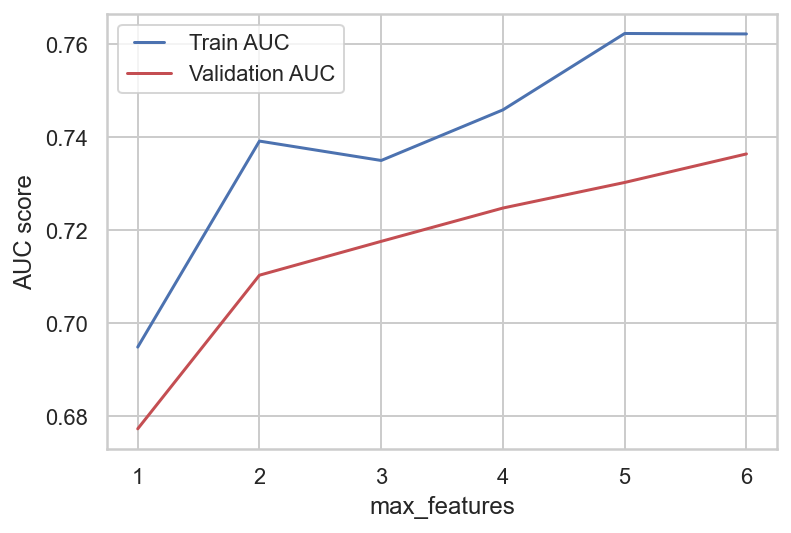

In [162]:
max_features = list(range(1,len(X_train.columns)))
calculate_AUC(max_features, X_train, X_val, y_train, y_val,'max_features', 9)
# Acho que não é necessário! Pelo gráfico vê-se que daria overfitting e já temos um número aceitável de variáveis
# Para além de que ele escolhe aleatoriamente as variáveis a usar

The best train value is  10
The best validation value is  84


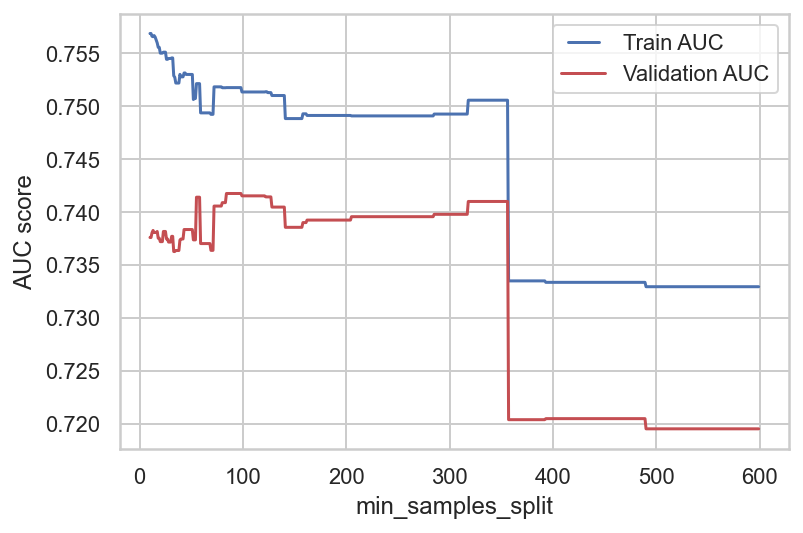

In [163]:
min_samples_split = list(range(10,600))
calculate_AUC(min_samples_split, X_train, X_val, y_train, y_val,'min_samples_split', 9)

In [185]:
dt_min84 = DecisionTreeClassifier(min_samples_split = 84).fit(X_train, y_train)
dt_min150 = DecisionTreeClassifier(min_samples_split = 150).fit(X_train, y_train)
dt_min400 = DecisionTreeClassifier(min_samples_split = 400).fit(X_train, y_train)

df = pd.DataFrame(columns = ['Time','Train','Validation'], index = ['dt_min17','dt_min150','dt_min400'])
show_results_1(df, dt_min84, dt_min150, dt_min400)

# Aqui quanto menor, mais overfitting! Com 400 já dá um resultado equilibrado (é o melhor e mais generalizado)

,Time,Train,Validation
dt_min17,0.044+/-0.0,0.863+/-0.0,0.841+/-0.01
dt_min150,0.039+/-0.01,0.857+/-0.0,0.844+/-0.01
dt_min400,0.028+/-0.0,0.851+/-0.0,0.845+/-0.01


The best train value is  11
The best validation value is  11


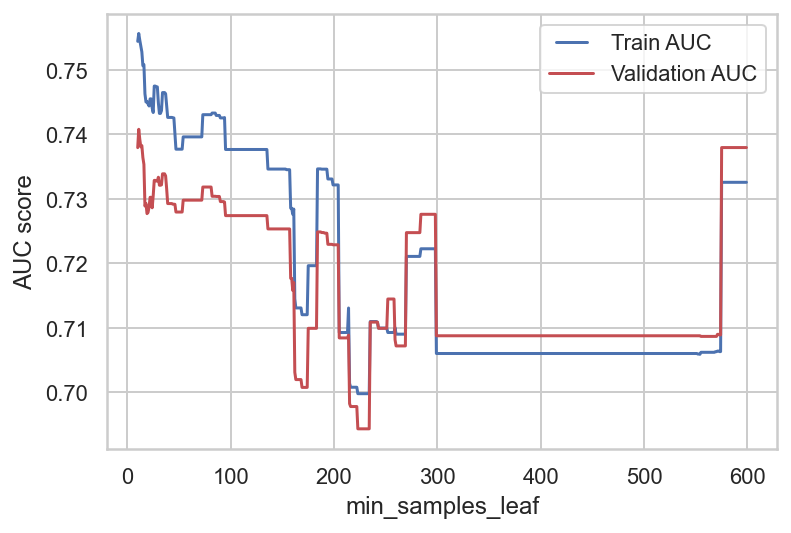

In [165]:
min_samples_leaf = list(range(10,600))
calculate_AUC(min_samples_leaf, X_train, X_val, y_train, y_val,'min_samples_leaf', 9)

In [166]:
dt_min_leaf11 = DecisionTreeClassifier(min_samples_split = 11).fit(X_train, y_train)
dt_min_leaf170 = DecisionTreeClassifier(min_samples_split = 170).fit(X_train, y_train)

df = pd.DataFrame(columns = ['Time','Train','Validation'], index = ['Min leaf 1','Min leaf 11','Min leaf 170'])
show_results_1(df, dt_gini, dt_min_leaf11, dt_min_leaf170)

# mais confuso de chegar a uma conclusão e tem o mesmo efeito que min_samples_split
# Quanto maior -> + underfitting, menor(default)-> full grown tree (overfitting)

# 170 parece ser melhor?

,Time,Train,Validation
Min leaf 1,0.046+/-0.01,0.918+/-0.0,0.823+/-0.01
Min leaf 11,0.035+/-0.0,0.892+/-0.0,0.832+/-0.01
Min leaf 170,0.031+/-0.0,0.856+/-0.0,0.844+/-0.01


The best train value is  0.0
The best validation value is  0.03734939759036144


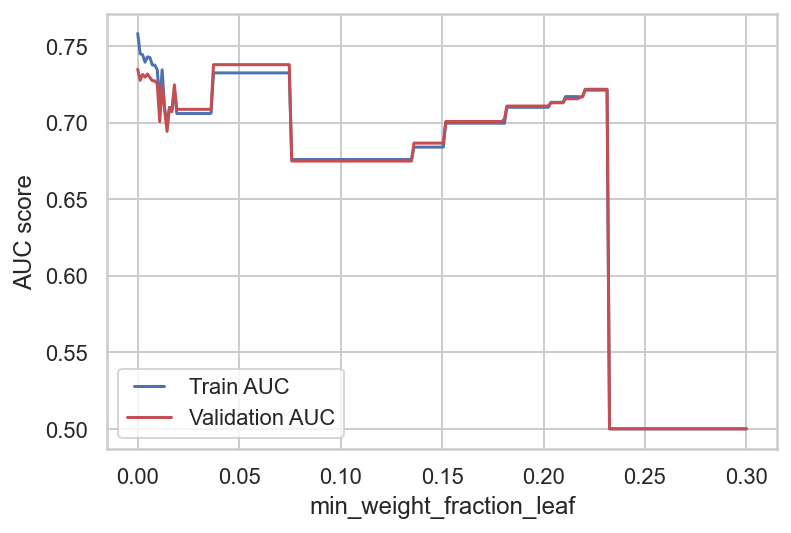

In [167]:
# more useful for imbalanced datasets!
min_weight_fraction_leaf = np.linspace(0, 0.3, 250, endpoint=True)
calculate_AUC(min_weight_fraction_leaf, X_train, X_val, y_train, y_val,'min_weight_fraction_leaf', 9)

In [173]:
dt_min_weight_1 = DecisionTreeClassifier(min_weight_fraction_leaf = 0.037).fit(X_train, y_train)
dt_min_weight_2 = DecisionTreeClassifier(min_weight_fraction_leaf = 0.01).fit(X_train, y_train)

df = pd.DataFrame(columns = ['Time','Train','Validation'], index = ['Min leaf 1','Min weight from graph','Min weight small'])
show_results_1(df, dt_gini, dt_min_weight_1, dt_min_weight_2)

# Usar diferente de 0.0 já fez diferença! Usar 0.01, parece ser bom!

,Time,Train,Validation
Min leaf 1,0.049+/-0.01,0.918+/-0.0,0.824+/-0.01
Min weight from graph,0.017+/-0.0,0.823+/-0.0,0.822+/-0.01
Min weight small,0.021+/-0.0,0.843+/-0.0,0.84+/-0.01


The best train value is  0.0
The best validation value is  0.0001002004008016032


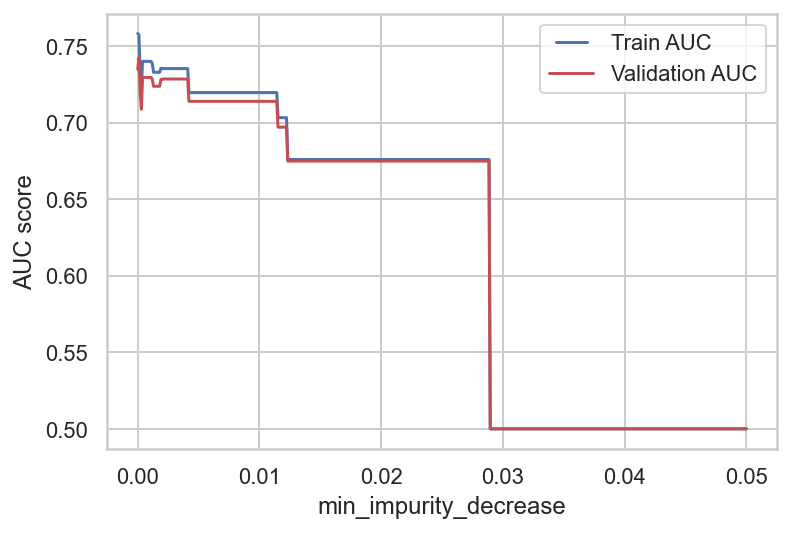

In [174]:
min_impurity_decrease = np.linspace(0, 0.05, 500, endpoint=True)
calculate_AUC(min_impurity_decrease, X_train, X_val, y_train, y_val,'min_impurity_decrease', 9)

In [177]:
dt_impurity01 = DecisionTreeClassifier(min_impurity_decrease=0.01).fit(X_train, y_train)
dt_impurity0001 = DecisionTreeClassifier(min_impurity_decrease=0.0001).fit(X_train, y_train)

df = pd.DataFrame(columns = ['Time','Train','Validation'], index = ['Baseline','dt_impurity01','dt_impurity0001'])
show_results_1(df,dt_gini, dt_impurity01,dt_impurity0001)

# Melhor é min_impurity_decrease=0.0001!

,Time,Train,Validation
Baseline,0.042+/-0.01,0.918+/-0.0,0.823+/-0.01
dt_impurity01,0.012+/-0.0,0.838+/-0.0,0.838+/-0.01
dt_impurity0001,0.025+/-0.0,0.858+/-0.0,0.848+/-0.01


In [178]:
#ccp_alpha
dt_alpha = DecisionTreeClassifier(random_state=42)
path = dt_alpha.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

Text(0.5, 1.0, 'Total Impurity vs effective alpha for training set')

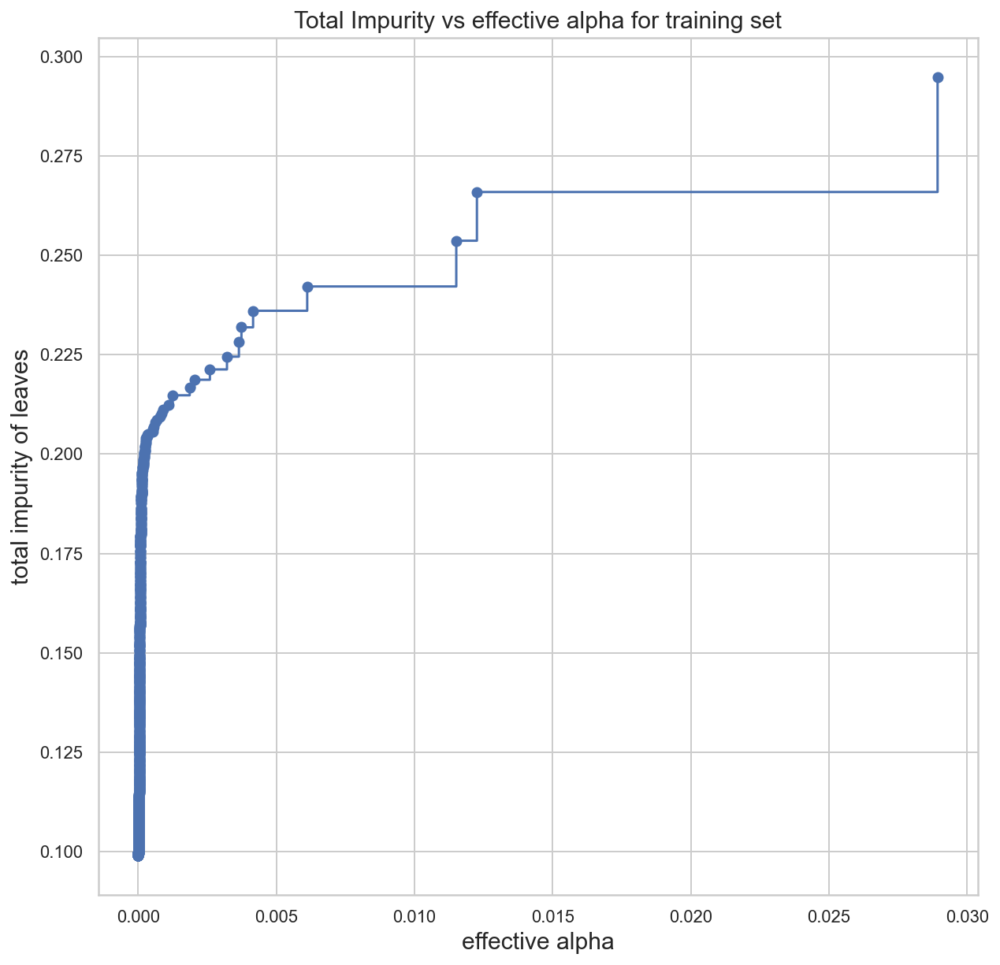

In [179]:
fig, ax = plt.subplots(figsize = (10,10))
ax.plot(ccp_alphas[:-1], impurities[:-1], marker='o', drawstyle="steps-post")
ax.set_xlabel("effective alpha", fontsize=15)
ax.set_ylabel("total impurity of leaves", fontsize=15)
ax.set_title("Total Impurity vs effective alpha for training set", fontsize=15)

In [180]:
#a função abaixo não aceitava ccp_alphas menores que 0
ccp_alphas=ccp_alphas[ccp_alphas>0]

In [181]:
trees = []
for ccp_alpha in ccp_alphas:
    dt_alpha = DecisionTreeClassifier(random_state=42, ccp_alpha=ccp_alpha).fit(X_train, y_train)
    trees.append(dt_alpha)
print("Number of nodes in the last tree is: {} with ccp_alpha: {}".format(trees[-1].tree_.node_count, ccp_alphas[-1]))

Number of nodes in the last tree is: 1 with ccp_alpha: 0.0627403178442068


In [182]:
trees = trees[:-1]
ccp_alphas = ccp_alphas[:-1]

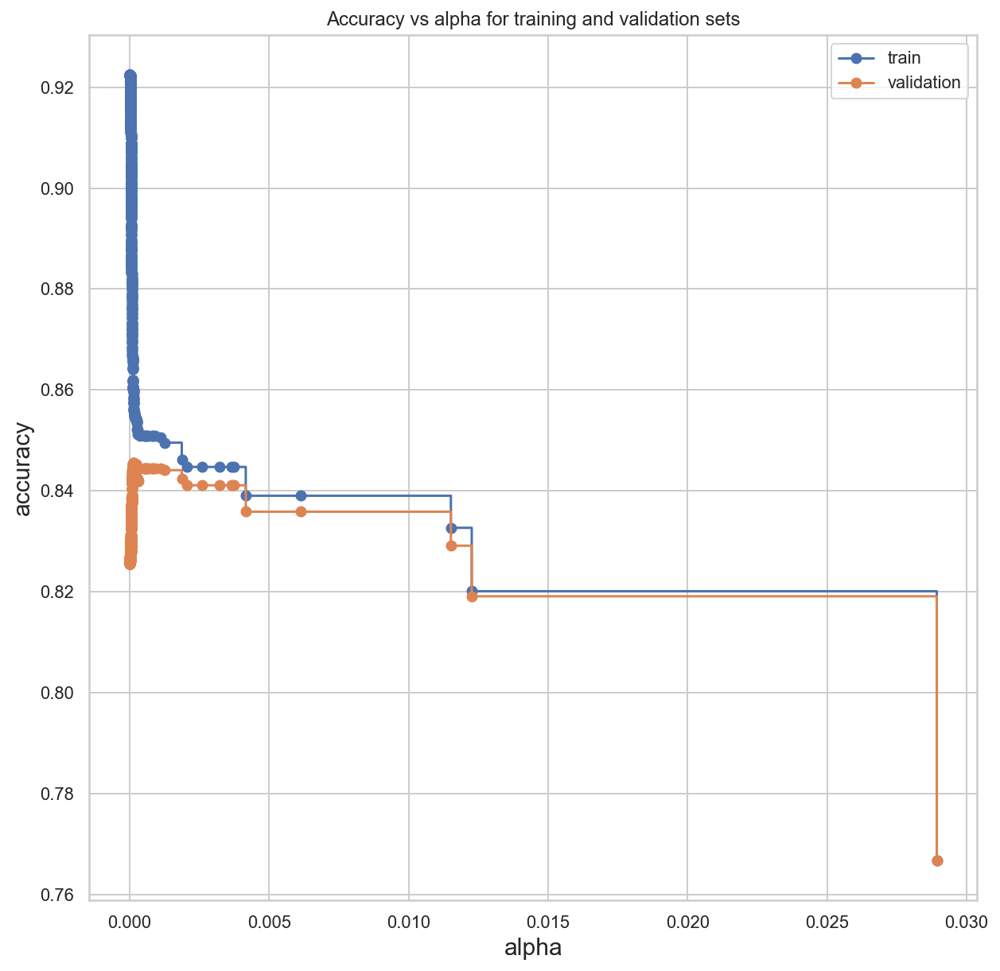

In [183]:
train_scores = [tree.score(X_train, y_train) for tree in trees]
val_scores = [tree.score(X_val, y_val) for tree in trees]

fig, ax = plt.subplots(figsize = (10,10))
ax.set_xlabel("alpha", fontsize=15)
ax.set_ylabel("accuracy", fontsize=15)
ax.set_title("Accuracy vs alpha for training and validation sets")
ax.plot(ccp_alphas, train_scores, marker='o', label="train", drawstyle="steps-post")
ax.plot(ccp_alphas, val_scores, marker='o', label="validation", drawstyle="steps-post")
ax.legend()
plt.show()

In [184]:
index_best_model = np.argmax(val_scores)
best_model = trees[index_best_model]
print('ccp_alpha of best model: ',trees[index_best_model])
print('_____________________________________________________________')
print('Training accuracy of best model: ',best_model.score(X_train, y_train))
print('Validation accuracy of best model: ',best_model.score(X_val, y_val))

ccp_alpha of best model:  DecisionTreeClassifier(ccp_alpha=0.0001453364110455673, random_state=42)
_____________________________________________________________
Training accuracy of best model:  0.8560528340600154
Validation accuracy of best model:  0.8456245325355273


In [186]:
dt_t1=DecisionTreeClassifier(min_impurity_decrease=0.0001,max_depth = 9,min_samples_split = 400,min_weight_fraction_leaf = 0.01,random_state=42).fit(X_train, y_train)
dt_t2=DecisionTreeClassifier(max_depth = 9,min_weight_fraction_leaf = 0.01,random_state=42).fit(X_train, y_train)
dt_t3=DecisionTreeClassifier(min_samples_split = 400,min_weight_fraction_leaf = 0.01,random_state=42).fit(X_train, y_train)
dt_t4=DecisionTreeClassifier(max_depth = 9,min_samples_split = 400,min_weight_fraction_leaf = 0.01,random_state=42).fit(X_train, y_train)

In [187]:
print('Train accuracy:',dt_t1.score(X_train, y_train))
print('Validation accuracy:',dt_t1.score(X_val, y_val))

Train accuracy: 0.8493844575532188
Validation accuracy: 0.8420344053851907


In [188]:
print('Train accuracy:',dt_t2.score(X_train, y_train))
print('Validation accuracy:',dt_t2.score(X_val, y_val))

Train accuracy: 0.8502180046165684
Validation accuracy: 0.8447270007479432


In [189]:
print('Train accuracy:',dt_t3.score(X_train, y_train))
print('Validation accuracy:',dt_t3.score(X_val, y_val))

Train accuracy: 0.8493844575532188
Validation accuracy: 0.8420344053851907


In [190]:
print('Train accuracy:',dt_t4.score(X_train, y_train))
print('Validation accuracy:',dt_t4.score(X_val, y_val))

Train accuracy: 0.8493844575532188
Validation accuracy: 0.8420344053851907


In [191]:
# Criando ainda a tree dada como melhor pelo ccp_alpha:
dt_t5=DecisionTreeClassifier(ccp_alpha=0.000145, random_state=42).fit(X_train, y_train)

print('Train accuracy:',dt_t5.score(X_train, y_train))
print('Validation accuracy:',dt_t5.score(X_val, y_val))

Train accuracy: 0.8563093100795076
Validation accuracy: 0.8454749439042633


In [196]:
#changing the threshold improves or not the accuracy......?
threshold = 0.5

predicted_proba = dt_t5.predict_proba(X_val)
predicted = (predicted_proba [:,1] >= threshold).astype('int')

accuracy = accuracy_score(y_val, predicted)
accuracy

0.8454749439042633

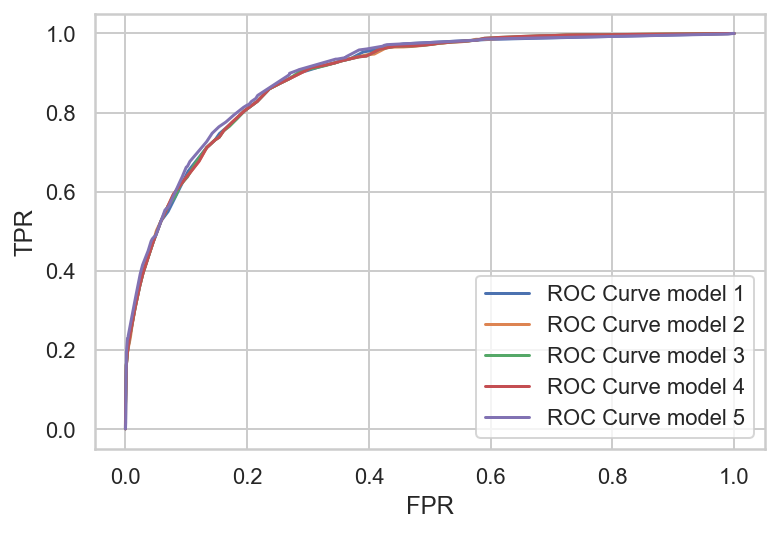

In [197]:
# To build the ROC curve
prob_model1 = dt_t1.predict_proba(X_val)
prob_model2 = dt_t2.predict_proba(X_val)
prob_model3 = dt_t3.predict_proba(X_val)
prob_model4 = dt_t4.predict_proba(X_val)
prob_model5 = dt_t5.predict_proba(X_val)

fpr_1, tpr_1, thresholds_1 = roc_curve(y_val, prob_model1[:, 1])
fpr_2, tpr_2, thresholds_2 = roc_curve(y_val, prob_model2[:, 1])
fpr_3, tpr_3, thresholds_3 = roc_curve(y_val, prob_model3[:, 1])
fpr_4, tpr_4, thresholds_4 = roc_curve(y_val, prob_model4[:, 1])
fpr_5, tpr_5, thresholds_5 = roc_curve(y_val, prob_model5[:, 1])


plt.plot(fpr_1, tpr_1, label="ROC Curve model 1")
plt.plot(fpr_2, tpr_2, label="ROC Curve model 2")
plt.plot(fpr_3, tpr_3, label="ROC Curve model 3")
plt.plot(fpr_4, tpr_4, label="ROC Curve model 4")
plt.plot(fpr_5, tpr_5, label="ROC Curve model 5")
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.legend()
plt.show()

# deu super semelhante, difícil ver qual o melhor: mas a melhor parece ser a roxa, que é a 5, que tem o ccp_alpha alterado
# e é essa, de facto, a melhor no validation

O melhor é a decision tree 5, com o único parâmetro alterado o ccp_alpha

In [198]:
labels_train = dt_t5.predict(X_train)
labels_val = dt_t5.predict(X_val) 

metrics(y_train, labels_train, y_val, labels_val)

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.88      0.94      0.91     11959
           1       0.75      0.57      0.65      3637

    accuracy                           0.86     15596
   macro avg       0.82      0.76      0.78     15596
weighted avg       0.85      0.86      0.85     15596

[[11274   685]
 [ 1556  2081]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.94      0.90      5126
           1       0.73   

In [207]:
# Isto é só para ver a complexidade da árvore
print('The "best" tree has a depth of ' + str(dt_t5.get_depth()) + ', ' + str(dt_t5.tree_.node_count) + 
       ' nodes and a total of ' + str(dt_t5.get_n_leaves()) + ' leaves.')

The "best" tree has a depth of 13, 145 nodes and a total of 73 leaves.


## Random Forests

In [208]:
ensemble_clfs = [
    ("RandomForestClassifier, max_features='auto'",
        RandomForestClassifier(oob_score=True,
                               max_features='auto',
                               random_state=42)),
    ("RandomForestClassifier, max_features='log2'",
        RandomForestClassifier(max_features='log2',
                               oob_score=True,
                               random_state=42)),
    ("RandomForestClassifier, max_features=6",
        RandomForestClassifier(max_features=6,
                               oob_score=True,
                               random_state=42)),
    ("RandomForestClassifier, max_features=None",
        RandomForestClassifier(max_features=None,
                               oob_score=True,
                               random_state=42))
]

In [209]:
from collections import OrderedDict

# Map a classifier name to a list of (<n_estimators>, <error rate>) pairs.
error_rate = OrderedDict((label, []) for label, _ in ensemble_clfs)

# Range of `n_estimators` values to explore.
min_estimators = 15
max_estimators = 175 #225

for label, clf in ensemble_clfs:
    for i in range(min_estimators, max_estimators + 1):
        clf.set_params(n_estimators=i)
        clf.fit(X_train, y_train)

        # Record the OOB error for each `n_estimators=i` setting.
        oob_error = 1 - clf.oob_score_
        error_rate[label].append((i, oob_error))

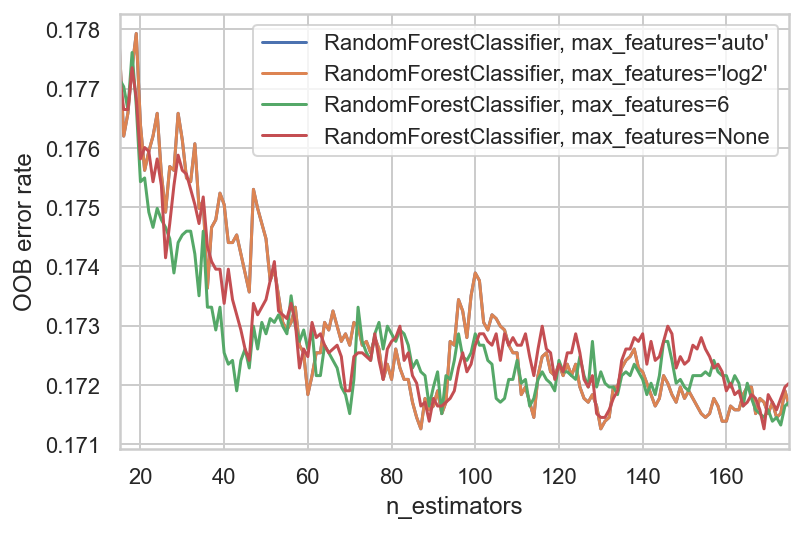

In [210]:
# Generate the "OOB error rate" vs. "n_estimators" plot.
for label, clf_err in error_rate.items():
    xs, ys = zip(*clf_err)
    plt.plot(xs, ys, label=label)

plt.xlim(min_estimators, max_estimators)
plt.xlabel("n_estimators")
plt.ylabel("OOB error rate")
plt.legend(loc="upper right")
plt.show()

In [212]:
# Creating and fitting the models
rf_1 = RandomForestClassifier(n_estimators=85, max_depth=9, random_state = 42).fit(X_train, y_train)

rf_2 = RandomForestClassifier(n_estimators=85, max_depth=9, max_features = 'log2', random_state = 42).fit(X_train, y_train)

rf_3 = RandomForestClassifier(n_estimators=85, max_depth=9, min_samples_split=400, random_state = 42).fit(X_train, y_train)

rf_4 = RandomForestClassifier(min_samples_split = 400, min_weight_fraction_leaf = 0.01,random_state=42).fit(X_train, y_train)

rf_5 = RandomForestClassifier(ccp_alpha=0.000145, random_state=42).fit(X_train, y_train)

rf_6 = RandomForestClassifier(max_depth = 9, min_weight_fraction_leaf = 0.01, random_state=42).fit(X_train, y_train)

rf_7 = RandomForestClassifier(n_estimators=85, max_depth=5, random_state = 42).fit(X_train, y_train)

rf_8 = RandomForestClassifier(n_estimators=85, max_depth=5, max_features = 6, random_state = 42).fit(X_train, y_train)

In [213]:
print('Train accuracy:',rf_1.score(X_train, y_train))
print('Validation accuracy:',rf_1.score(X_val, y_val))

Train accuracy: 0.8620800205180815
Validation accuracy: 0.850112191473448


In [214]:
print('Train accuracy:',rf_2.score(X_train, y_train))
print('Validation accuracy:',rf_2.score(X_val, y_val))

Train accuracy: 0.8620800205180815
Validation accuracy: 0.850112191473448


In [215]:
print('Train accuracy:',rf_3.score(X_train, y_train))
print('Validation accuracy:',rf_3.score(X_val, y_val))

Train accuracy: 0.8518850987432675
Validation accuracy: 0.8484667165295438


In [216]:
print('Train accuracy:',rf_4.score(X_train, y_train))
print('Validation accuracy:',rf_4.score(X_val, y_val))

Train accuracy: 0.8455373172608361
Validation accuracy: 0.8414360508601346


In [217]:
print('Train accuracy:',rf_5.score(X_train, y_train))
print('Validation accuracy:',rf_5.score(X_val, y_val))

Train accuracy: 0.8715055142344191
Validation accuracy: 0.8490650710545998


In [218]:
print('Train accuracy:',rf_6.score(X_train, y_train))
print('Validation accuracy:',rf_6.score(X_val, y_val))

Train accuracy: 0.8459220312900744
Validation accuracy: 0.8450261780104712


In [219]:
print('Train accuracy:',rf_7.score(X_train, y_train))
print('Validation accuracy:',rf_7.score(X_val, y_val))

Train accuracy: 0.8509233136701718
Validation accuracy: 0.8445774121166791


In [220]:
print('Train accuracy:',rf_8.score(X_train, y_train))
print('Validation accuracy:',rf_8.score(X_val, y_val))

Train accuracy: 0.8509233136701718
Validation accuracy: 0.8439790575916231


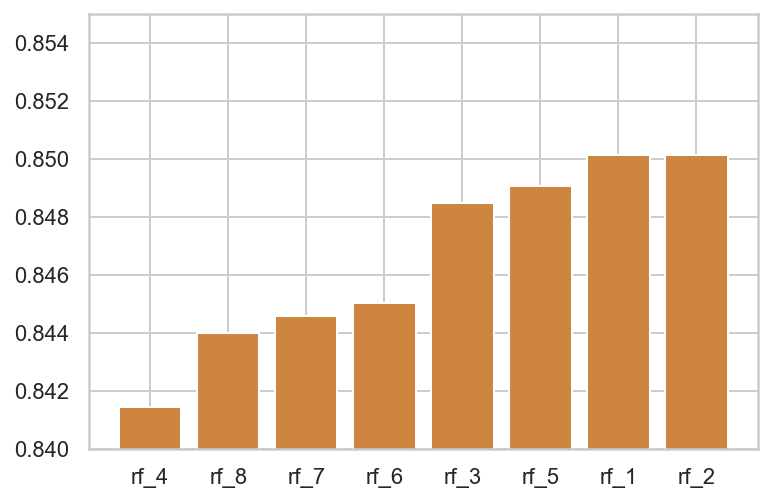

In [222]:
models = ['rf_1', 'rf_2', 'rf_3','rf_4','rf_5', 'rf_6', 'rf_7', 'rf_8']

accuracies = [rf_1.score(X_val, y_val), rf_2.score(X_val, y_val), rf_3.score(X_val, y_val), rf_4.score(X_val, y_val),
              rf_5.score(X_val, y_val), rf_6.score(X_val, y_val), rf_7.score(X_val, y_val), rf_8.score(X_val, y_val)]

data_tuples = list(zip(models,accuracies))

data = pd.DataFrame(data_tuples)
data = data.sort_values(1)

plt.bar(data[0], data[1], color='peru')
plt.ylim(0.84, 0.855)
plt.show()

In [223]:
labels_train = rf_2.predict(X_train)
labels_val = rf_2.predict(X_val) 

metrics(y_train, labels_train, y_val, labels_val)
#predict values for X_test, ex: p o citizen em X_test [0] estamos a prever y[0]->0

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.96      0.91     11959
           1       0.80      0.55      0.65      3637

    accuracy                           0.86     15596
   macro avg       0.84      0.75      0.78     15596
weighted avg       0.86      0.86      0.85     15596

[[11458   501]
 [ 1650  1987]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.95      0.91      5126
           1       0.76   

In [228]:
#changing the threshold does not seem to improve the accuracy of the best random forest!
threshold = 0.5

predicted_proba = rf_2.predict_proba(X_val)
predicted = (predicted_proba [:,1] >= threshold).astype('int')

accuracy = accuracy_score(y_val, predicted)
accuracy

0.850112191473448

## Logistic Regression

In [229]:
#importing and defining the model
log_model = LogisticRegression(random_state=42)

In [230]:
log_model.fit(X_train,y_train) #fit model to our train data

LogisticRegression(random_state=42)

In [231]:
labels_train = log_model.predict(X_train)
log_model.score(X_train, y_train)

0.845344960246217

In [232]:
# Predict class labels for samples in X
labels_val = log_model.predict(X_val) 
log_model.score(X_val, y_val)
# predict values for X_test, ex: p o citizen em X_test [0] estamos a prever y[0]->0

0.8427823485415108

In [233]:
pred_prob = log_model.predict_proba(X_val) 
pred_prob 
# o cutoff normalmente é de 0.5, mas as vezes é preferivel considerar menos

array([[0.93981877, 0.06018123],
       [0.99072749, 0.00927251],
       [0.2365043 , 0.7634957 ],
       ...,
       [0.85804973, 0.14195027],
       [0.27483047, 0.72516953],
       [0.99529394, 0.00470606]])

In [234]:
X_train.columns

Index(['x1_Management', 'x2_Married', 'x5_1', 'Years of Education',
       'Ticket Price', 'Age', 'Working hours * Years of Education'],
      dtype='object')

In [235]:
log_model.coef_
#since we dont have the residuals, we cannot use the OLS, not applied to logistic regression
#c estes valores so conseguimos dizer q se for + a curva é p cima, - para baixo

array([[0.73519617, 2.29151967, 4.15842988, 4.74603293, 2.09036547,
        2.01811498, 4.31171205]])

In [237]:
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ['Raw'])
show_results(df, log_model)

,Time,Train,Validation,Iterations
Raw,0.096+/-0.02,0.845+/-0.0,0.844+/-0.01,29.8+/-3.1


In [238]:
metrics(y_train, labels_train, y_val, labels_val)

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.94      0.90     11959
           1       0.73      0.53      0.61      3637

    accuracy                           0.85     15596
   macro avg       0.80      0.73      0.76     15596
weighted avg       0.84      0.85      0.84     15596

[[11265   694]
 [ 1718  1919]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.94      0.90      5126
           1       0.73   

## Gaussian Naive Bayes

In [245]:
#modelNB = GaussianNB() # train score: 0.823 validation score: 0.814
#modelNB = GaussianNB(var_smoothing=0.0001)  #train score: 0.823 validation score: 0.815
modelNB = GaussianNB(var_smoothing=0.001) # train score: 0.823 validation score: 0.815
modelNB.fit(X = X_train, y = y_train)
labels_train = modelNB.predict(X_train)
labels_val = modelNB.predict(X_val)
modelNB.predict_proba(X_val)

array([[9.97138780e-01, 2.86121997e-03],
       [9.99965762e-01, 3.42379805e-05],
       [7.44466925e-02, 9.25553307e-01],
       ...,
       [9.96743051e-01, 3.25694880e-03],
       [5.94091987e-06, 9.99994059e-01],
       [9.99978821e-01, 2.11794807e-05]])

In [246]:
print("train score:", modelNB.score(X_train, y_train))
print("validation score:",modelNB.score(X_val, y_val))

train score: 0.8233521415747628
validation score: 0.8145100972326104


In [247]:
# Para ver unbalancedness, média e variância para cada 
print(modelNB.class_prior_) #prob 0, prob 1
print(modelNB.class_count_)#n 0, n 1
# modelNB.theta_
# modelNB.sigma_

[0.76679918 0.23320082]
[11959.  3637.]


In [248]:
df = pd.DataFrame(columns = ['Time','Train','Validation'], index = ['Raw'])
show_results_1(df, modelNB)

,Time,Train,Validation
Raw,0.012+/-0.0,0.821+/-0.0,0.821+/-0.01


In [249]:
metrics(y_train, labels_train, y_val, labels_val)

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.85      0.94      0.89     11959
           1       0.69      0.43      0.53      3637

    accuracy                           0.82     15596
   macro avg       0.77      0.69      0.71     15596
weighted avg       0.81      0.82      0.81     15596

[[11266   693]
 [ 2062  1575]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.84      0.94      0.89      5126
           1       0.67   

## Neural Networks

In [212]:
model = MLPClassifier(random_state=42)
model.fit(X_train, y_train)
labels_train = model.predict(X_train)
labels_val = model.predict(X_val)

In [213]:
metrics(y_train, labels_train, y_val, labels_val)

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.94      0.91     11959
           1       0.75      0.54      0.63      3637

    accuracy                           0.85     15596
   macro avg       0.81      0.74      0.77     15596
weighted avg       0.84      0.85      0.84     15596

[[11291   668]
 [ 1663  1974]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.94      0.90      5126
           1       0.72   

In [215]:
model_1 = MLPClassifier(hidden_layer_sizes=(1),random_state=42)
model_2 = MLPClassifier(hidden_layer_sizes=(3),random_state=42)
model_3 = MLPClassifier(hidden_layer_sizes=(9),random_state=42)
model_4 = MLPClassifier(hidden_layer_sizes=(3, 3),random_state=42)
model_5 = MLPClassifier(hidden_layer_sizes=(5, 5),random_state=42)
model_6 = MLPClassifier(hidden_layer_sizes=(3, 3, 3),random_state=42) #3 layers each one with 3 units

In [216]:
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ['M_1','M_2','M_3', 'M_4','M_5','M_6'])
show_results(df, model_1, model_2, model_3, model_4, model_5, model_6)

,Time,Train,Validation,Iterations
M_1,5.863+/-0.27,0.844+/-0.0,0.844+/-0.01,132.2+/-6.4
M_2,6.598+/-1.17,0.844+/-0.0,0.844+/-0.01,136.3+/-23.9
M_3,8.429+/-2.6,0.846+/-0.0,0.845+/-0.01,158.1+/-48.3
M_4,4.865+/-0.39,0.767+/-0.0,0.767+/-0.01,74.8+/-5.8
M_5,8.019+/-1.5,0.845+/-0.0,0.844+/-0.01,118.9+/-22.4
M_6,13.498+/-1.76,0.845+/-0.0,0.845+/-0.01,169.1+/-20.3


In [217]:
model_7 = MLPClassifier(hidden_layer_sizes=(4, 4),random_state=42)
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ['M_7'])
show_results(df, model_7)

,Time,Train,Validation,Iterations
M_7,4.062+/-0.47,0.844+/-0.0,0.844+/-0.01,58.6+/-4.3


In [218]:
model_logistic = MLPClassifier(activation = 'logistic',random_state=42)
model_tanh = MLPClassifier(activation = 'tanh',random_state=42)
model_relu=MLPClassifier(activation = 'relu',random_state=42)

In [219]:
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ['logistic','tanh','relu'])
show_results(df, model_logistic, model_tanh,model_relu)

,Time,Train,Validation,Iterations
logistic,5.695+/-0.96,0.844+/-0.0,0.844+/-0.01,45.1+/-6.7
tanh,4.343+/-0.52,0.844+/-0.0,0.843+/-0.01,35.0+/-3.6
relu,15.373+/-1.66,0.848+/-0.0,0.847+/-0.01,94.8+/-10.3


In [220]:
model_lbfgs = MLPClassifier(solver = 'lbfgs',random_state=4) #low dim and sparse data
model_sgd = MLPClassifier(solver = 'sgd',random_state=4) #accuracy > processing time
model_adam = MLPClassifier(solver = 'adam',random_state=4) # big dataset but might fail to converge

In [221]:
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ['lbfgs','sgd','adam'])
show_results(df, model_lbfgs, model_sgd, model_adam)

,Time,Train,Validation,Iterations
lbfgs,21.317+/-0.42,0.849+/-0.0,0.847+/-0.01,200.0+/-0.0
sgd,23.44+/-1.43,0.845+/-0.0,0.844+/-0.01,153.0+/-7.6
adam,19.02+/-1.94,0.848+/-0.0,0.847+/-0.01,117.2+/-10.0


Adam is the best

In [222]:
model_constant = MLPClassifier(solver = 'sgd', learning_rate = 'constant',random_state=42)
model_invscaling = MLPClassifier(solver = 'sgd', learning_rate = 'invscaling',random_state=42)
model_adaptive = MLPClassifier(solver = 'sgd', learning_rate = 'adaptive',random_state=42)

In [223]:
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ['constant','invscaling','adaptive'])
show_results(df, model_constant, model_invscaling, model_adaptive)

,Time,Train,Validation,Iterations
constant,23.279+/-0.99,0.845+/-0.0,0.844+/-0.01,150.1+/-7.2
invscaling,2.517+/-0.12,0.767+/-0.0,0.767+/-0.01,16.0+/-0.0
adaptive,31.017+/-0.81,0.845+/-0.0,0.845+/-0.0,198.7+/-2.1


Constant is the better (less time and iterations than adaptive!!)

In [224]:
model_a = MLPClassifier(solver = 'adam', learning_rate_init = 0.5,random_state=42) #qt maior mais rapido aprende o modelo
model_b = MLPClassifier(solver = 'adam', learning_rate_init = 0.1,random_state=42)
model_c = MLPClassifier(solver = 'adam', learning_rate_init = 0.01,random_state=42) #se for mt pequeno pode ficar preso numa solucao subotima e pode nunca convergir
model_d = MLPClassifier(solver = 'adam', learning_rate_init = 0.001,random_state=42)

In [225]:
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ['M_a','M_b','M_c', "M_d"])
show_results(df, model_a, model_b, model_c, model_d)

,Time,Train,Validation,Iterations
M_a,2.997+/-0.53,0.832+/-0.01,0.835+/-0.01,21.4+/-4.1
M_b,4.53+/-1.06,0.846+/-0.0,0.845+/-0.01,31.9+/-6.8
M_c,9.631+/-2.63,0.848+/-0.0,0.847+/-0.01,59.4+/-15.9
M_d,15.169+/-1.71,0.848+/-0.0,0.847+/-0.01,94.8+/-10.3


The best is 0.01

In [226]:
model_e = MLPClassifier(solver = 'adam', learning_rate_init = 0.005,random_state=42)
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ["M_e"])
show_results(df, model_e)

,Time,Train,Validation,Iterations
M_e,12.049+/-2.79,0.848+/-0.0,0.847+/-0.01,66.2+/-17.1


In [227]:
model_batch20 = MLPClassifier(solver = 'sgd', batch_size = 20,random_state=42)
model_batch50 = MLPClassifier(solver = 'sgd', batch_size = 50,random_state=42)
model_batch100 = MLPClassifier(solver = 'sgd', batch_size = 100,random_state=42)
model_batch200 = MLPClassifier(solver = 'sgd', batch_size = 200,random_state=42)
model_batch500 = MLPClassifier(solver = 'sgd', batch_size = 500,random_state=42)

In [228]:
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ['batch 20','batch 50','batch 100', 'batch 200', 'batch 500'])
show_results(df, model_batch20, model_batch50, model_batch100,  model_batch200, model_batch500)

,Time,Train,Validation,Iterations
batch 20,63.99+/-5.27,0.847+/-0.0,0.847+/-0.01,137.5+/-11.8
batch 50,34.419+/-10.61,0.845+/-0.0,0.845+/-0.01,136.0+/-39.1
batch 100,22.357+/-2.16,0.845+/-0.0,0.845+/-0.01,106.9+/-8.0
batch 200,23.451+/-1.3,0.845+/-0.0,0.844+/-0.01,150.1+/-7.2
batch 500,25.615+/-1.01,0.836+/-0.0,0.836+/-0.01,200.0+/-0.0


The best one is batch 20

In [199]:
model_maxiter_50 = MLPClassifier(max_iter = 50,random_state=42)
model_maxiter_100 = MLPClassifier(max_iter = 100,random_state=42)
model_maxiter_200 = MLPClassifier(max_iter = 200,random_state=42)
model_maxiter_300 = MLPClassifier(max_iter = 300,random_state=42)

In [200]:
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ['max iter 50','max iter 100','max iter 200', 'max iter 300'])
show_results(df, model_maxiter_50, model_maxiter_100, model_maxiter_200, model_maxiter_300)

,Time,Train,Validation,Iterations
max iter 50,5.255+/-0.19,0.846+/-0.0,0.845+/-0.01,50.0+/-0.0
max iter 100,9.932+/-0.69,0.848+/-0.0,0.847+/-0.01,92.5+/-5.3
max iter 200,10.106+/-0.97,0.848+/-0.0,0.847+/-0.01,94.8+/-10.3
max iter 300,10.094+/-1.13,0.848+/-0.0,0.847+/-0.01,94.8+/-10.3


In [201]:
model_maxiter_150 = MLPClassifier(max_iter = 150,random_state=42)
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ['max iter 150'])
show_results(df, model_maxiter_150)

,Time,Train,Validation,Iterations
max iter 150,10.078+/-1.03,0.848+/-0.0,0.847+/-0.01,94.8+/-10.3


In [202]:
model_all=MLPClassifier(hidden_layer_sizes=(9),activation = 'logistic',solver = 'adam',learning_rate_init = 0.1,batch_size = 50,random_state=4)
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ['Raw'])
show_results(df, model_all)

,Time,Train,Validation,Iterations
Raw,4.416+/-1.43,0.84+/-0.01,0.838+/-0.01,37.5+/-11.1


In [231]:
# parameter_space = {
#     'hidden_layer_sizes': [(9), (3,3,3)],
#     'activation': ['relu'],
#     'solver': ['adam'],
#     'learning_rate': ['adaptive'],
#     'learning_rate_init': [(0.01)],
#     'batch_size': list(np.arange(10, 40, 10)),
#     'max_iter': list(np.arange(100, 400, 50)),
# }

# clf = GridSearchCV(model, parameter_space, verbose=1, n_jobs=-1)
# clf.fit(X_train , y_train)
# clf.best_params_

Fitting 5 folds for each of 36 candidates, totalling 180 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 180 out of 180 | elapsed: 17.8min finished


{'activation': 'relu',
 'batch_size': 30,
 'hidden_layer_sizes': 9,
 'learning_rate': 'adaptive',
 'learning_rate_init': 0.01,
 'max_iter': 100,
 'solver': 'adam'}

In [233]:
model_grid=MLPClassifier(activation= 'relu', batch_size= 30, hidden_layer_sizes=(9), learning_rate='adaptive',
                         learning_rate_init= 0.01, max_iter= 100, solver= 'adam',random_state=4)
model_grid.fit(X_train, y_train)

MLPClassifier(batch_size=30, hidden_layer_sizes=9, learning_rate='adaptive',
              learning_rate_init=0.01, max_iter=100, random_state=4)

In [234]:
labels_train = model_grid.predict(X_train)
accuracy_score(y_train, labels_train)

0.8488073865093614

In [235]:
labels_val = model_grid.predict(X_val)
accuracy_score(y_val, labels_val)

0.8426327599102468

In [236]:
metrics(y_train, labels_train, y_val, labels_val)

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.94      0.90     11959
           1       0.73      0.55      0.63      3637

    accuracy                           0.85     15596
   macro avg       0.80      0.75      0.77     15596
weighted avg       0.84      0.85      0.84     15596

[[11222   737]
 [ 1621  2016]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.93      0.90      5126
           1       0.72   

## KNN

The number K is typically chosen as the square root of the total number of points in the training data set. Thus, in this case, N is 15680, so K = 125.

Text(0, 0.5, 'Validation Accuracy')

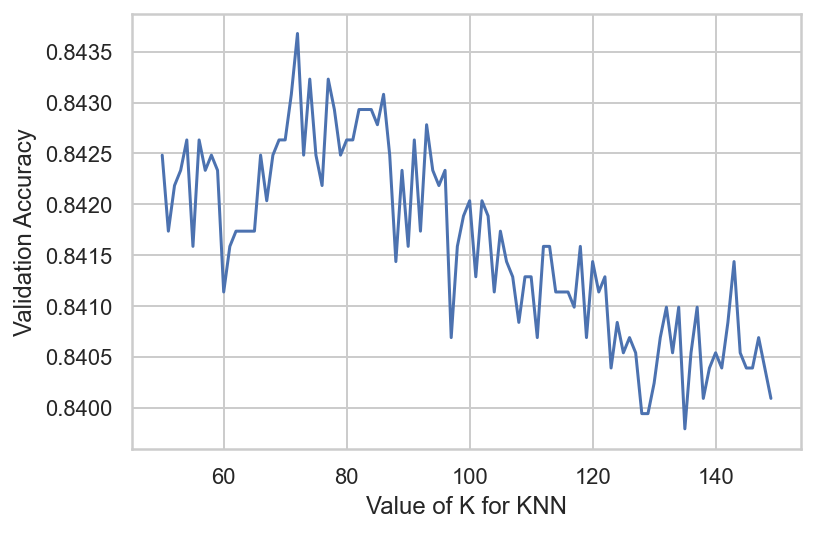

In [250]:
# try K=50 through K=150 and record testing accuracy
k_range = range(50, 150)

scores = []

# We use a loop through the range
# We append the scores in the list
for k in k_range:
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, y_train)
    y_pred = knn.predict(X_val)
    scores.append(accuracy_score(y_val, y_pred))

# plot the relationship between K and testing accuracy
plt.plot(k_range, scores)
plt.xlabel('Value of K for KNN')
plt.ylabel('Validation Accuracy')

In [251]:
modelKNN1 = KNeighborsClassifier().fit(X = X_train, y = y_train)

In [252]:
print("train score:", modelKNN1.score(X_train, y_train))
print("validation score:",modelKNN1.score(X_val, y_val))

train score: 0.8701590151320852
validation score: 0.8299177262528048


In [253]:
modelKNN2 = KNeighborsClassifier(n_neighbors=70).fit(X = X_train, y = y_train)

In [254]:
print("train score:", modelKNN2.score(X_train, y_train))
print("validation score:",modelKNN2.score(X_val, y_val))

train score: 0.8476532444216466
validation score: 0.8426327599102468


In [255]:
#from the available algorithms (excluding the default), this was the best one
modelKNN3 = KNeighborsClassifier(n_neighbors=70, algorithm='ball_tree').fit(X = X_train, y = y_train)

In [256]:
print("train score:", modelKNN3.score(X_train, y_train))
print("validation score:",modelKNN3.score(X_val, y_val))

train score: 0.8476532444216466
validation score: 0.8424831712789828


In [257]:
modelKNN4 = KNeighborsClassifier(n_neighbors=70, p=1).fit(X = X_train, y = y_train)

In [258]:
print("train score:", modelKNN4.score(X_train, y_train))
print("validation score:",modelKNN4.score(X_val, y_val))

train score: 0.8492562195434726
validation score: 0.8442782348541511


In [259]:
modelKNN5 = KNeighborsClassifier(n_neighbors=70, weights='distance').fit(X = X_train, y = y_train)

In [260]:
print("train score:", modelKNN5.score(X_train, y_train))
print("validation score:",modelKNN5.score(X_val, y_val))

train score: 0.9224801231084894
validation score: 0.8326103216155573


In [261]:
modelKNN6 = KNeighborsClassifier(n_neighbors=70, algorithm='ball_tree', p=1).fit(X = X_train, y = y_train)

In [262]:
print("train score:", modelKNN6.score(X_train, y_train))
print("validation score:",modelKNN6.score(X_val, y_val))

train score: 0.849769171582457
validation score: 0.8444278234854151


In [263]:
df = pd.DataFrame(columns = ['Time','Train','Validation'], index = ['modelKNN1', 'modelKNN2', 'modelKNN3', 'modelKNN4', 'modelKNN5', 'modelKNN6'])
show_results_1(df, modelKNN1, modelKNN2, modelKNN3, modelKNN4, modelKNN5, modelKNN6)

,Time,Train,Validation
modelKNN1,0.58+/-0.19,0.868+/-0.0,0.831+/-0.01
modelKNN2,0.501+/-0.05,0.848+/-0.0,0.844+/-0.01
modelKNN3,0.486+/-0.09,0.848+/-0.0,0.843+/-0.01
modelKNN4,0.59+/-0.12,0.849+/-0.0,0.846+/-0.01
modelKNN5,0.525+/-0.1,0.918+/-0.0,0.832+/-0.01
modelKNN6,0.497+/-0.07,0.849+/-0.0,0.846+/-0.01


In [264]:
# Model with best accuracy
labels_train = modelKNN6.predict(X_train)
labels_val = modelKNN6.predict(X_val)
metrics(y_train, labels_train, y_val, labels_val)

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.94      0.91     11959
           1       0.74      0.55      0.63      3637

    accuracy                           0.85     15596
   macro avg       0.81      0.74      0.77     15596
weighted avg       0.84      0.85      0.84     15596

[[11269   690]
 [ 1650  1987]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.94      0.90      5126
           1       0.73   

## Passive Aggressive Classifier (Extra)

In [278]:
# Creating and fitting model
pac_basic = PassiveAggressiveClassifier(random_state=42)
pac_basic.fit(X_train, y_train)

pac_1 = PassiveAggressiveClassifier(C=0.001, fit_intercept=True, tol=1e-3, loss='squared_hinge',random_state=42)
pac_1.fit(X_train, y_train)

pac_2 = PassiveAggressiveClassifier(C=0.001, tol=1e-3, loss='squared_hinge',random_state=42)
pac_2.fit(X_train, y_train)

pac_3 = PassiveAggressiveClassifier(C=0.001, tol=1e-3, random_state=42)
pac_3.fit(X_train, y_train)

PassiveAggressiveClassifier(C=0.001, random_state=42)

In [279]:
# Making prediction on the validation set 
val_pred_basic = pac_basic.predict(X_val)
val_pred_1 = pac_1.predict(X_val)
val_pred_2 = pac_2.predict(X_val)
val_pred_3 = pac_3.predict(X_val)

In [280]:
df = pd.DataFrame(columns = ['Time','Train','Validation','Iterations'], index = ['PAC_Basic','PAC_1','PAC_2','PAC_3'])
show_results(df, pac_basic, pac_1, pac_2, pac_3)

,Time,Train,Validation,Iterations
PAC_Basic,0.038+/-0.01,0.828+/-0.01,0.828+/-0.01,8.8+/-2.4
PAC_1,0.058+/-0.01,0.844+/-0.0,0.844+/-0.01,18.5+/-1.7
PAC_2,0.049+/-0.01,0.844+/-0.0,0.844+/-0.01,18.5+/-1.7
PAC_3,0.077+/-0.02,0.829+/-0.0,0.829+/-0.01,23.5+/-0.5


In [285]:
labels_train = pac_2.predict(X_train)
labels_val = pac_2.predict(X_val)

print('train accuracy:',accuracy_score(y_train, labels_train))
print('validation accuracy:',accuracy_score(y_val, labels_val))

metrics(y_train, labels_train, y_val, labels_val)

train accuracy: 0.8459220312900744
validation accuracy: 0.8420344053851907
_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.86      0.95      0.90     11959
           1       0.75      0.50      0.60      3637

    accuracy                           0.85     15596
   macro avg       0.81      0.73      0.75     15596
weighted avg       0.84      0.85      0.83     15596

[[11359   600]
 [ 1803  1834]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

     

## Linear Discriminant Analysis

In [286]:
modelLDA = LinearDiscriminantAnalysis()
modelLDA.fit(X = X_train, y = y_train)
labels_train = modelLDA.predict(X_train)
labels_val = modelLDA.predict(X_val)
modelLDA.predict_proba(X_val)

array([[0.95518629, 0.04481371],
       [0.99277569, 0.00722431],
       [0.22623073, 0.77376927],
       ...,
       [0.8816066 , 0.1183934 ],
       [0.2005508 , 0.7994492 ],
       [0.99671613, 0.00328387]])

In [287]:
print("train score:", modelLDA.score(X_train, y_train))
print("validation score:",modelLDA.score(X_val, y_val))

train score: 0.8433572710951526
validation score: 0.83754674644727


In [288]:
from sklearn.model_selection import GridSearchCV
# define grid
grid = dict()
grid['solver'] = ['svd', 'lsqr', 'eigen']
# define search
search = GridSearchCV(modelLDA, grid, scoring='accuracy', n_jobs=-1)
# perform the search
results = search.fit(X_train, y_train)
# summarize
print('Mean Accuracy: %.3f' % results.best_score_)
print('Config: %s' % results.best_params_)

Mean Accuracy: 0.843
Config: {'solver': 'svd'}


In [289]:
from numpy import arange
grid = dict()
grid['shrinkage'] = arange(0, 1, 0.01)
grid['solver']=['svd', 'lsqr', 'eigen'] #svd cannot be tested with shrinkage
# define search
search = GridSearchCV(modelLDA, grid, scoring='accuracy', n_jobs=-1)
# perform the search
results = search.fit(X_train, y_train)
# summarize
print('Mean Accuracy: %.3f' % results.best_score_)
print('Config: %s' % results.best_params_)

Mean Accuracy: 0.843
Config: {'shrinkage': 0.02, 'solver': 'lsqr'}


In [290]:
modelLDA_final = LinearDiscriminantAnalysis(solver='svd')
modelLDA_final.fit(X = X_train, y = y_train)
labels_train = modelLDA_final.predict(X_train)
labels_val = modelLDA_final.predict(X_val)
print("train score:", modelLDA_final.score(X_train, y_train))
print("validation score:",modelLDA_final.score(X_val, y_val))

train score: 0.8433572710951526
validation score: 0.83754674644727


In [291]:
metrics(y_train, labels_train, y_val, labels_val)

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.86      0.95      0.90     11959
           1       0.75      0.50      0.60      3637

    accuracy                           0.84     15596
   macro avg       0.80      0.72      0.75     15596
weighted avg       0.83      0.84      0.83     15596

[[11338   621]
 [ 1822  1815]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.86      0.95      0.90      5126
           1       0.73   

## Quadratic Discriminant Analysis

In [292]:
modelQDA = QuadraticDiscriminantAnalysis()
modelQDA.fit(X = X_train, y = y_train)
labels_train = modelQDA.predict(X_train)
labels_val = modelQDA.predict(X_val)
modelQDA.predict_proba(X_val)

array([[9.97077362e-01, 2.92263757e-03],
       [9.99980842e-01, 1.91582024e-05],
       [2.67693580e-01, 7.32306420e-01],
       ...,
       [9.92697381e-01, 7.30261884e-03],
       [8.01521742e-06, 9.99991985e-01],
       [9.99965227e-01, 3.47730218e-05]])

In [293]:
print("train score:", modelQDA.score(X_train, y_train))
print("validation score:",modelQDA.score(X_val, y_val))

train score: 0.822326237496794
validation score: 0.8142109199700823


In [294]:
# define grid
grid = dict()
grid['reg_param'] = arange(0, 1, 0.01)
# define search
search = GridSearchCV(modelQDA, grid, scoring='accuracy', n_jobs=-1)
# perform the search
results = search.fit(X_train, y_train)
# summarize
print('Mean Accuracy: %.3f' % results.best_score_)
print('Config: %s' % results.best_params_)

Mean Accuracy: 0.827
Config: {'reg_param': 0.04}


In [295]:
modelQDA_final = QuadraticDiscriminantAnalysis(reg_param=0.04)
modelQDA_final.fit(X = X_train, y = y_train)
labels_train = modelQDA_final.predict(X_train)
labels_val = modelQDA_final.predict(X_val)
print("train score:", modelQDA_final.score(X_train, y_train))
print("validation score:",modelQDA_final.score(X_val, y_val))

train score: 0.8271351628622724
validation score: 0.8231862378459237


In [296]:
metrics(y_train, labels_train, y_val, labels_val)

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.84      0.96      0.89     11959
           1       0.74      0.40      0.52      3637

    accuracy                           0.83     15596
   macro avg       0.79      0.68      0.71     15596
weighted avg       0.82      0.83      0.81     15596

[[11438   521]
 [ 2175  1462]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.84      0.96      0.89      5126
           1       0.73   

## Support Vector Machine

In [409]:
# # try C=250 through K=1250 and record testing accuracy
# C_range = range(250, 1250)

# scores = []

# # We use a loop through the range
# # We append the scores in the list
# for c in C_range:
#     svm = SVC(C=c)
#     svm.fit(X_train, y_train)
#     y_pred = svm.predict(X_val)
#     scores.append(accuracy_score(y_val, y_pred))

# # plot the relationship between C and testing accuracy
# plt.plot(C_range, scores)
# plt.xlabel('Value of C for the SVM')
# plt.ylabel('Validation Accuracy')

In [162]:
modelSVM_basic = SVC().fit(X_train, y_train)

In [163]:
modelSVM_1 = SVC(kernel='linear').fit(X_train, y_train)

In [164]:
modelSVM_2 = SVC(C=750).fit(X_train, y_train)

In [165]:
modelSVM_3 = SVC(kernel = 'poly').fit(X_train, y_train)

In [166]:
modelSVM_4 = SVC(C=750, kernel = 'poly').fit(X_train, y_train)

In [167]:
modelSVM_5 = SVC(C=750, kernel = 'linear').fit(X_train, y_train)

In [168]:
modelSVM_6 = SVC(C=750, shrinking=False).fit(X_train, y_train)

In [169]:
modelSVM_7 = SVC(C=750, tol=1e-3).fit(X_train, y_train)

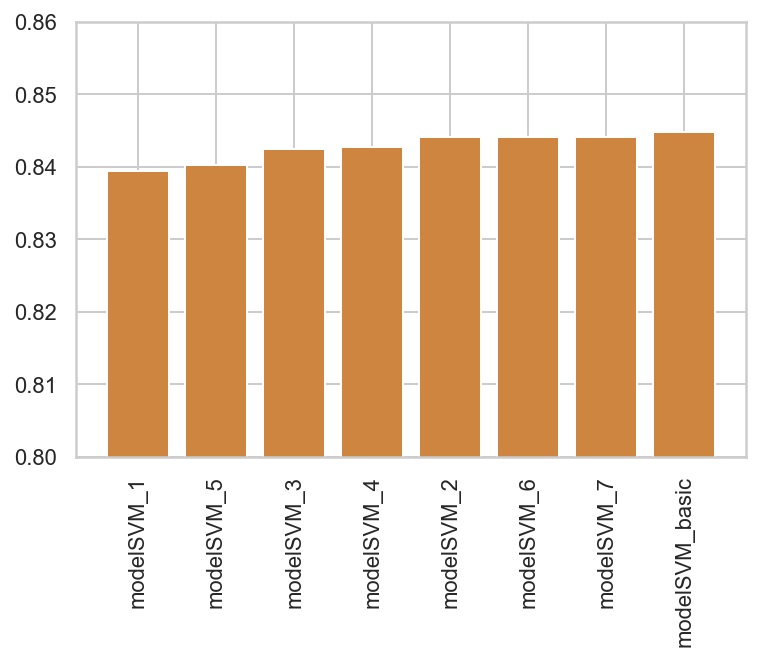

In [170]:
accuracies = [modelSVM_basic.score(X_val, y_val), modelSVM_1.score(X_val, y_val),
              modelSVM_2.score(X_val, y_val), modelSVM_3.score(X_val, y_val),
              modelSVM_4.score(X_val, y_val), modelSVM_5.score(X_val, y_val),
              modelSVM_6.score(X_val, y_val), modelSVM_7.score(X_val, y_val)]

models = ['modelSVM_basic', 'modelSVM_1', 'modelSVM_2', 'modelSVM_3', 
          'modelSVM_4', 'modelSVM_5', 'modelSVM_6', 'modelSVM_7']

data_tuples = list(zip(models,accuracies))

data = pd.DataFrame(data_tuples)

data = data.sort_values(1)

plt.bar(data[0], data[1], color='peru')
plt.xticks(rotation=90)
plt.ylim(0.80,0.86)

plt.show()

In [171]:
# highest accuracy from the SVMs
modelSVM_basic.score(X_val, y_val)

0.8447270007479432

In [173]:
modelSVM_basic.score(X_train, y_train)

0.8493203385483458

In [172]:
pred_train_svm = modelSVM_basic.predict(X_train)
pred_val_svm = modelSVM_basic.predict(X_val)
metrics(y_train, pred_train_svm, y_val, pred_val_svm)

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.95      0.91     11959
           1       0.75      0.53      0.62      3637

    accuracy                           0.85     15596
   macro avg       0.81      0.74      0.76     15596
weighted avg       0.84      0.85      0.84     15596

[[11327   632]
 [ 1718  1919]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.94      0.90      5126
           1       0.74   

### AdaBoost Classifier

In [156]:
def calculate_f1(interval, x_train, x_val, y_train, y_val, parameter):
    train_results = []
    val_results = []
    for value in interval:
        if parameter == 'Number of estimators':
            dt = AdaBoostClassifier(n_estimators = value, random_state = 5)
        elif parameter == 'Learning Rate':
            dt = AdaBoostClassifier(learning_rate = value, random_state = 5)
        dt.fit(x_train, y_train)
        train_results.append(f1_score(y_train,dt.predict(x_train)))
        val_results.append(f1_score(y_val,dt.predict(x_val)))
    value_train = train_results.index(max(train_results))
    value_val = val_results.index(max(val_results))
    print('The best train value is ',interval[value_train])
    print('The best val value is ',interval[value_val])

    fig = plt.figure(figsize = (16,10))
    line1, = plt.plot(interval, train_results, '#515C60', label="Train F1", linewidth=3,color='peru')
    line2, = plt.plot(interval, val_results, '#C7DC1F', label="Val F1", linewidth=3,color='b')
    plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
    plt.ylabel("F1 score")
    plt.xlabel(str(parameter))
    plt.show()


The best train value is  82
The best val value is  10


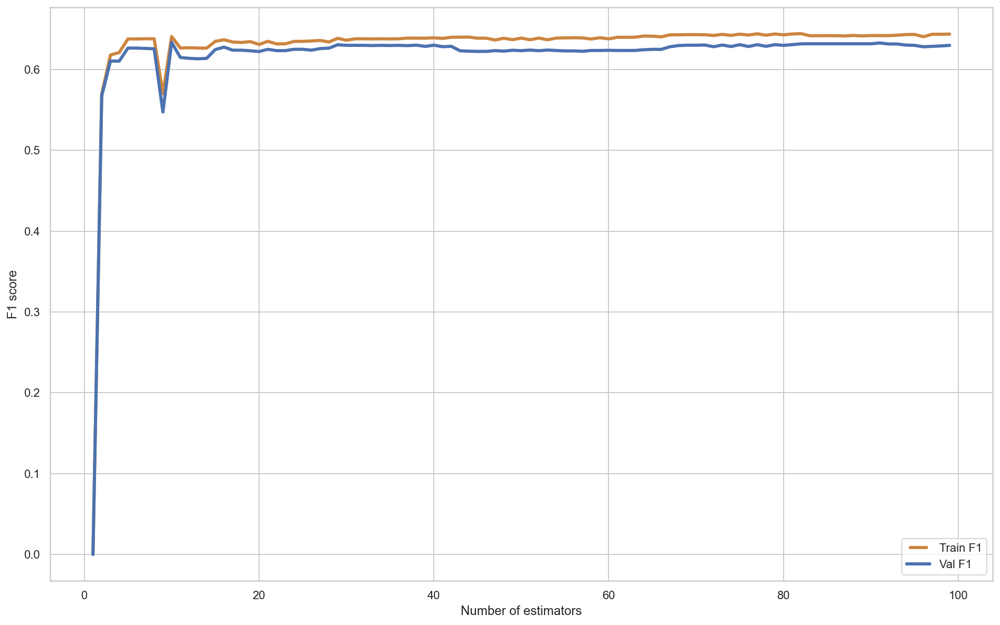

In [157]:
num_estimators = list(range(1,100))
calculate_f1(num_estimators, X_train, X_val, y_train, y_val,'Number of estimators')

The best train value is  10
The best val value is  10


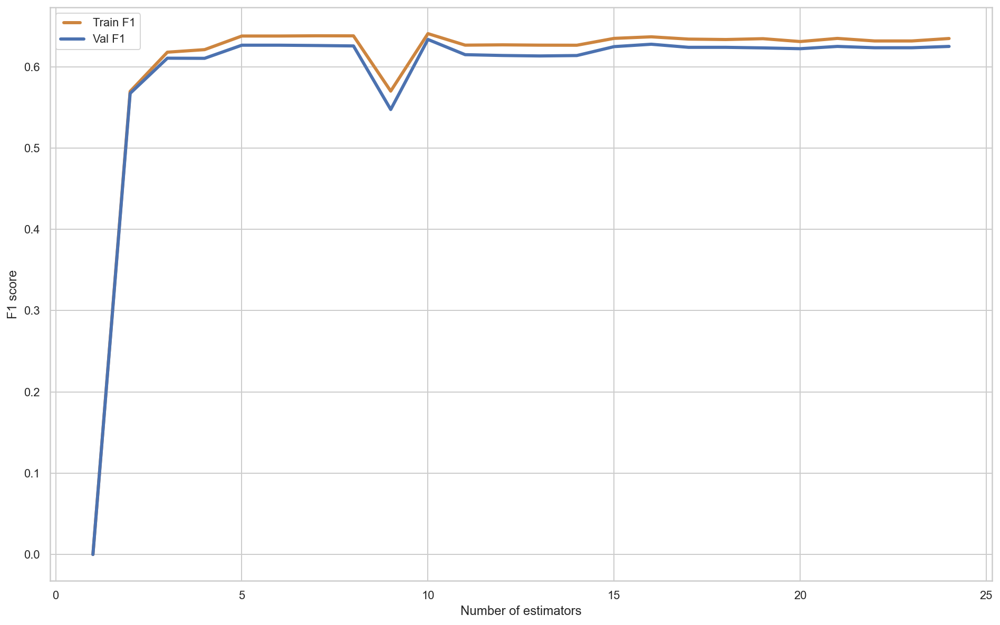

In [159]:
num_estimators = list(range(1,25))
calculate_f1(num_estimators, X_train, X_val, y_train, y_val,'Number of estimators')

The best train value is  82
The best val value is  213


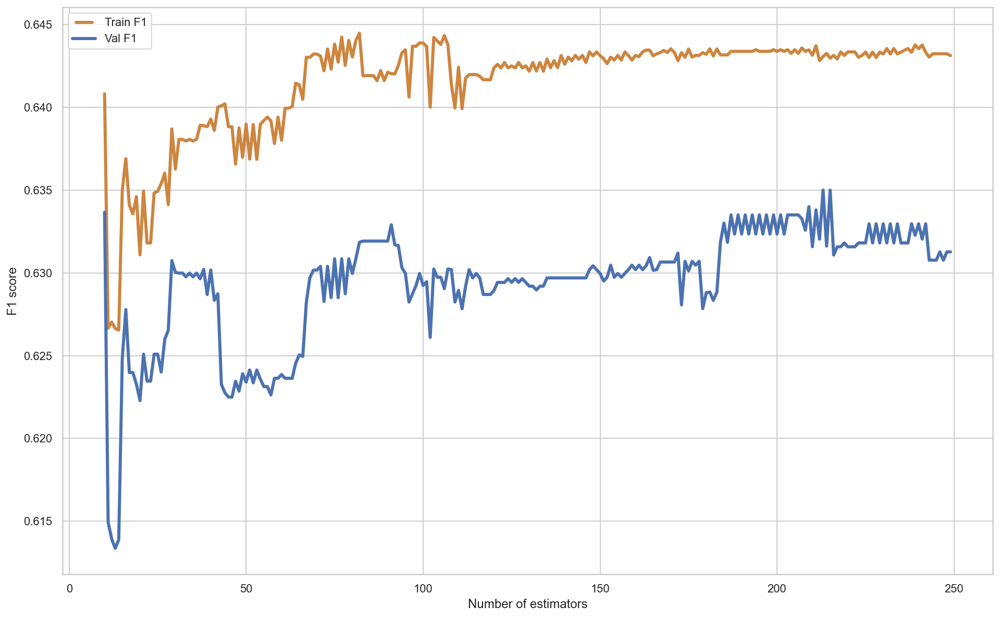

In [178]:
num_estimators = list(range(10,250))
calculate_f1(num_estimators, X_train, X_val, y_train, y_val,'Number of estimators')

The best train value is  1.4600000000000002
The best val value is  0.56


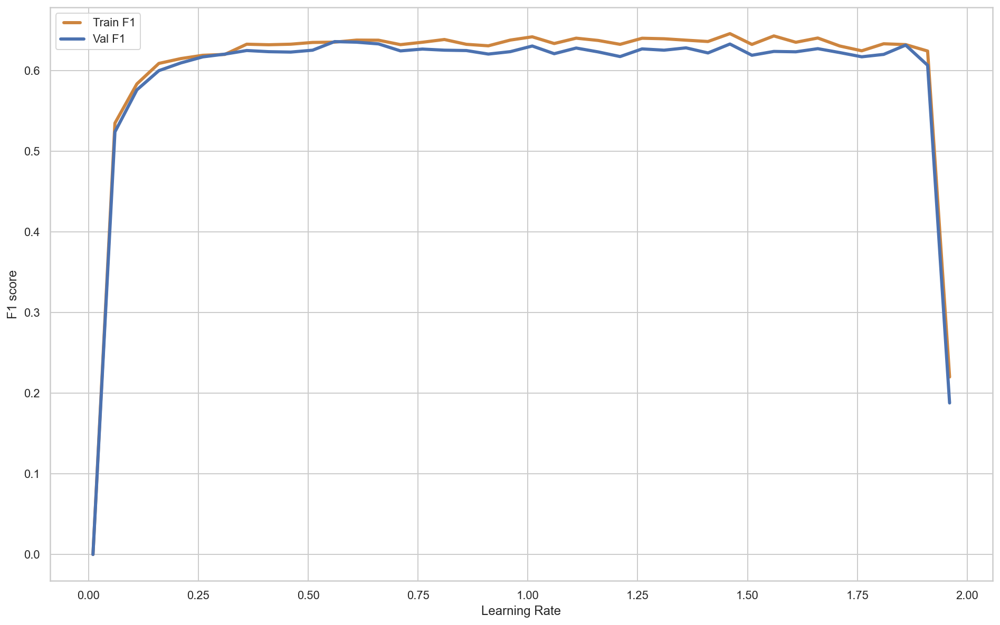

In [158]:
learning_rate = list(np.arange(0.01, 2, 0.05))
calculate_f1(learning_rate, X_train, X_val, y_train, y_val,'Learning Rate')


In [174]:
# AdaBoost = AdaBoostClassifier()

# AdaBoost_parameters = {'base_estimator' : [None, modelNB, modelQDA_final, modelLDA_final],
#                         'n_estimators' : list(range(5,20)),
#                         'learning_rate' : np.arange(0.3, 0.75, 0.05),
#                         'algorithm' : ['SAMME', 'SAMME.R']}

# AdaBoost_grid = GridSearchCV(estimator=AdaBoost, param_grid=AdaBoost_parameters, 
#                               scoring='accuracy', verbose=1, n_jobs=-1)

# AdaBoost_grid.fit(X_train , y_train)
# AdaBoost_grid.best_params_

Fitting 5 folds for each of 1080 candidates, totalling 5400 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    4.6s
[Parallel(n_jobs=-1)]: Done 288 tasks      | elapsed:   13.4s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:   31.4s
[Parallel(n_jobs=-1)]: Done 2000 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 3298 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3848 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 5400 out of 5400 | elapsed:  2.3min finished


{'algorithm': 'SAMME.R',
 'base_estimator': None,
 'learning_rate': 0.39999999999999997,
 'n_estimators': 18}

In [183]:
modelAdaBoost = AdaBoostClassifier(base_estimator=None, n_estimators=18, learning_rate=0.39999999999999997, algorithm='SAMME.R', random_state=5)
modelAdaBoost.fit(X_train,y_train)

AdaBoostClassifier(learning_rate=0.39999999999999997, n_estimators=18,
                   random_state=5)

In [184]:
labels_train = modelAdaBoost.predict(X_train)
accuracy_score(y_train, labels_train)

0.851051551679918

In [185]:
labels_val = modelAdaBoost.predict(X_val)
accuracy_score(y_val, labels_val)

0.8457741211667913

In [187]:
# AdaBoost = AdaBoostClassifier()

# AdaBoost_parameters = {'base_estimator' : [None, modelNB, modelQDA_final, modelLDA_final],
#                         'n_estimators' : list(range(205,220)),
#                         'learning_rate' : np.arange(0.3, 0.75, 0.05),
#                         'algorithm' : ['SAMME', 'SAMME.R']}

# AdaBoost_grid = GridSearchCV(estimator=AdaBoost, param_grid=AdaBoost_parameters, 
#                               scoring='accuracy', verbose=1, n_jobs=-1)

# AdaBoost_grid.fit(X_train , y_train)
# AdaBoost_grid.best_params_

Fitting 5 folds for each of 1080 candidates, totalling 5400 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   23.8s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  8.5min
[Parallel(n_jobs=-1)]: Done 3140 tasks      | elapsed: 13.3min
[Parallel(n_jobs=-1)]: Done 3790 tasks      | elapsed: 22.2min
[Parallel(n_jobs=-1)]: Done 5400 out of 5400 | elapsed: 26.5min finished


{'algorithm': 'SAMME.R',
 'base_estimator': None,
 'learning_rate': 0.6499999999999999,
 'n_estimators': 214}

In [188]:
modelAdaBoost = AdaBoostClassifier(base_estimator=None, n_estimators=214, learning_rate=0.6499999999999999, algorithm='SAMME.R', random_state=5)
modelAdaBoost.fit(X_train,y_train)

AdaBoostClassifier(learning_rate=0.6499999999999999, n_estimators=214,
                   random_state=5)

In [189]:
labels_train = modelAdaBoost.predict(X_train)
accuracy_score(y_train, labels_train)

0.852590407796871

In [190]:
labels_val = modelAdaBoost.predict(X_val)
accuracy_score(y_val, labels_val)

0.8481675392670157

In [191]:
metrics(y_train, labels_train, y_val, labels_val)

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.94      0.91     11959
           1       0.75      0.55      0.64      3637

    accuracy                           0.85     15596
   macro avg       0.81      0.75      0.77     15596
weighted avg       0.84      0.85      0.84     15596

[[11282   677]
 [ 1622  2015]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.94      0.90      5126
           1       0.73   

### Gradient Boosting Classifier

In [192]:
def calculate_f1_2(interval, x_train, x_val, y_train, y_val, parameter):
    train_results = []
    val_results = []
    for value in interval:
        if parameter == 'Number of estimators':
            dt = GradientBoostingClassifier(n_estimators = value, random_state = 5)
        elif parameter == 'Learning Rate':
            dt = GradientBoostingClassifier(learning_rate = value, random_state = 5)
        dt.fit(x_train, y_train)
        train_results.append(f1_score(y_train,dt.predict(x_train)))
        val_results.append(f1_score(y_val,dt.predict(x_val)))
    value_train = train_results.index(max(train_results))
    value_val = val_results.index(max(val_results))
    print('The best train value is ',interval[value_train])
    print('The best val value is ',interval[value_val])

    fig = plt.figure(figsize = (16,10))
    line1, = plt.plot(interval, train_results, '#515C60', label="Train F1", linewidth=3,color='peru')
    line2, = plt.plot(interval, val_results, '#C7DC1F', label="Val F1", linewidth=3,color='b')
    plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
    plt.ylabel("F1 score")
    plt.xlabel(str(parameter))
    plt.show()

The best train value is  1.2500000000000002
The best val value is  1.4500000000000002


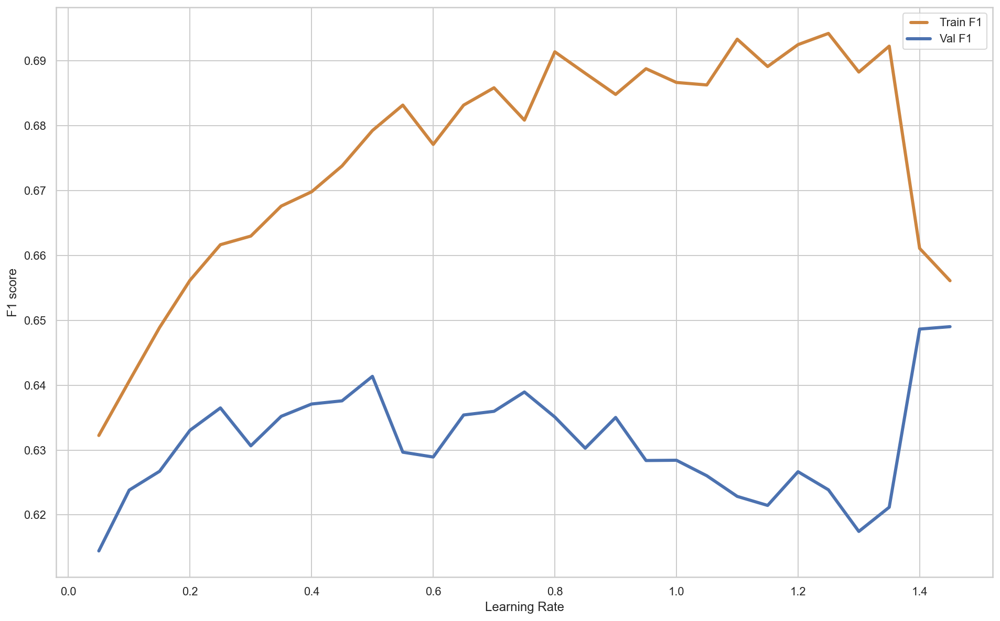

In [193]:
learning_rate = list(np.arange(0.05, 1.5, 0.05))
calculate_f1_2(learning_rate, X_train, X_val, y_train, y_val,'Learning Rate')

The best train value is  0.8
The best val value is  0.5


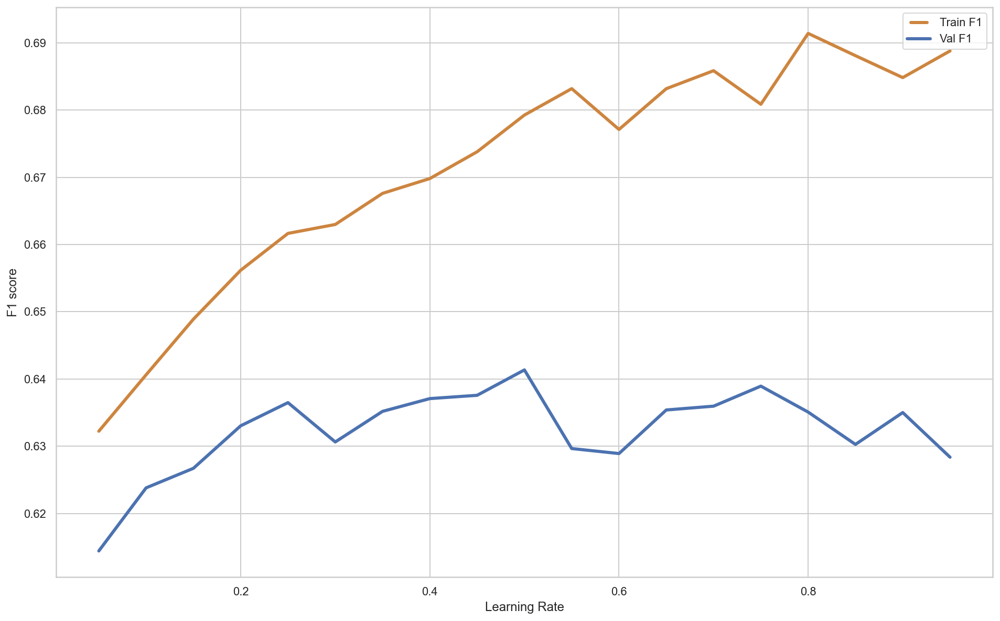

In [194]:
learning_rate = list(np.arange(0.05, 1, 0.05))
calculate_f1_2(learning_rate, X_train, X_val, y_train, y_val,'Learning Rate')

The best train value is  1.2500000000000002
The best val value is  1.6000000000000005


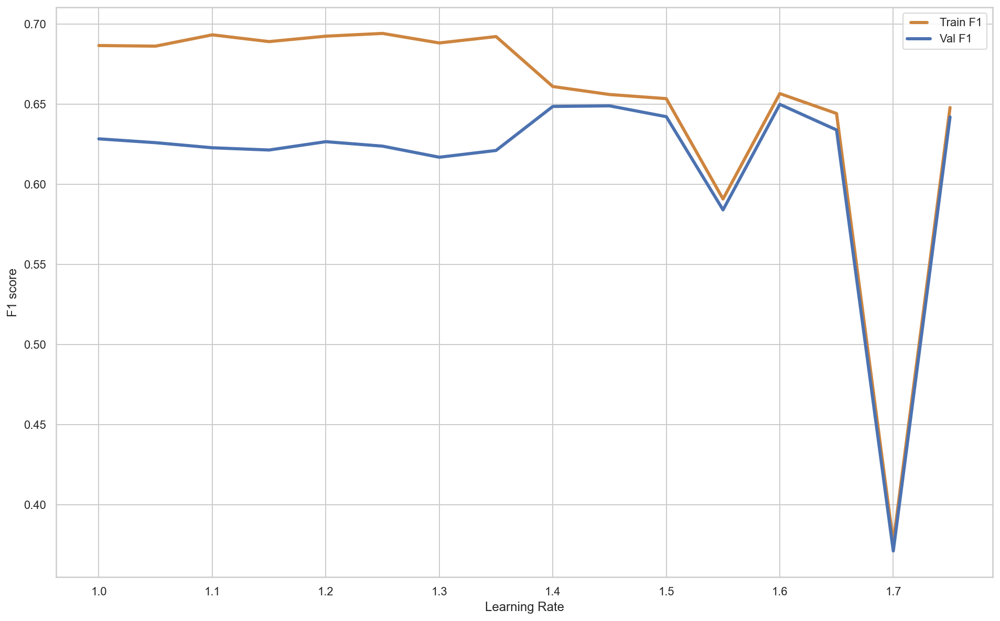

In [195]:
learning_rate = list(np.arange(1, 1.8, 0.05))
calculate_f1_2(learning_rate, X_train, X_val, y_train, y_val,'Learning Rate')

The best train value is  191
The best val value is  191


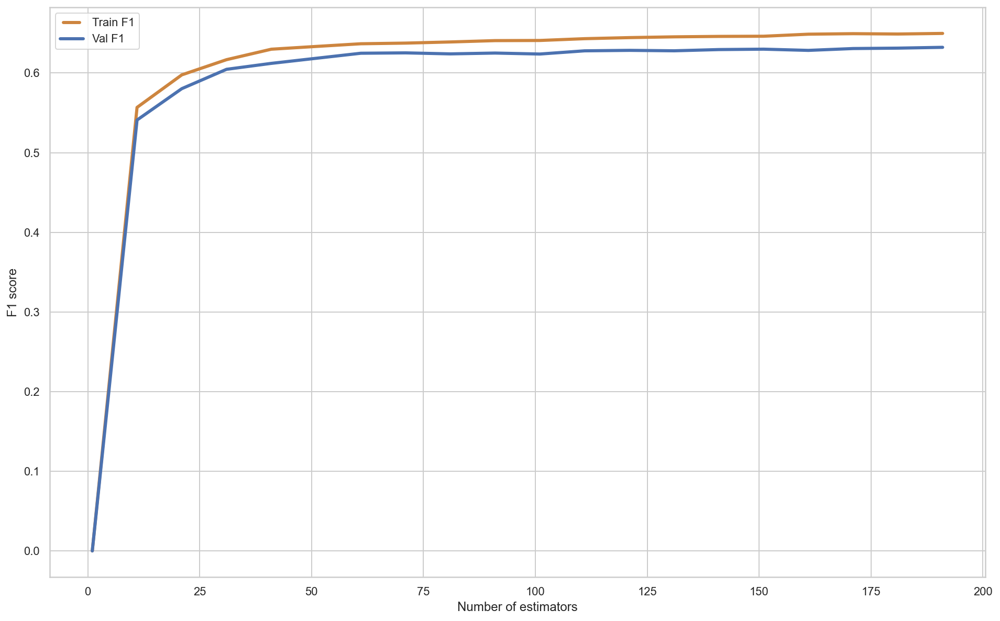

In [196]:
num_estimators = list(np.arange(1, 200, 10)) 
calculate_f1_2(num_estimators, X_train, X_val, y_train, y_val,'Number of estimators')

The best train value is  370
The best val value is  340


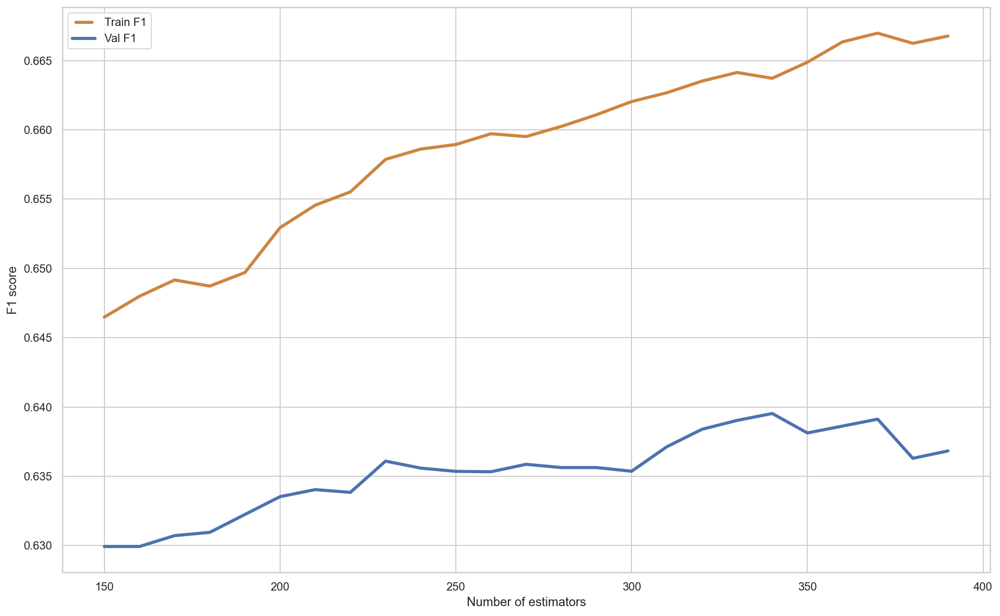

In [198]:
num_estimators = list(np.arange(150, 400, 10)) 
calculate_f1_2(num_estimators, X_train, X_val, y_train, y_val,'Number of estimators')

The best train value is  480
The best val value is  315


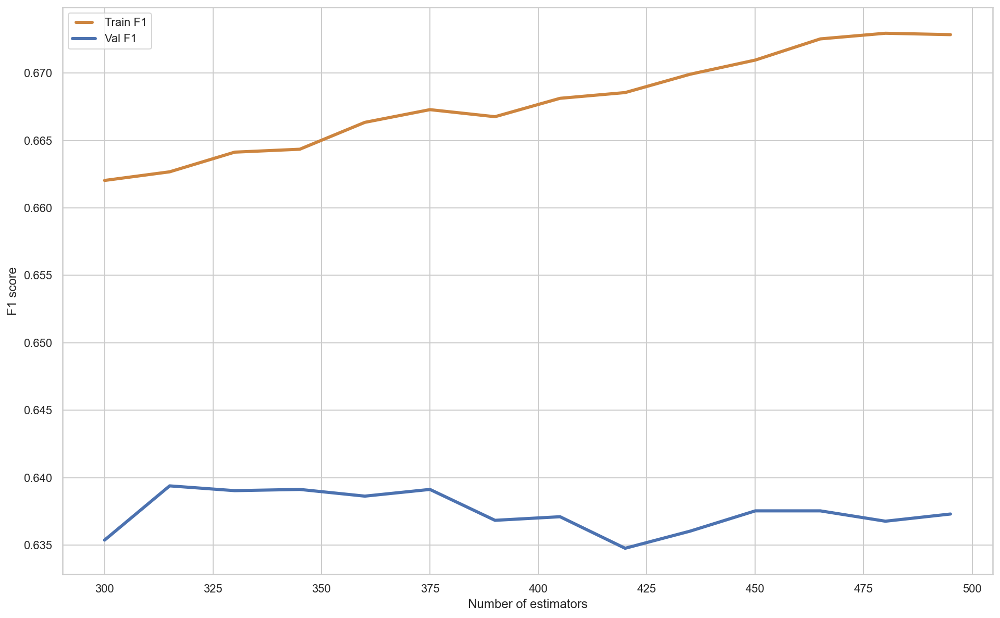

In [203]:
num_estimators = list(np.arange(300, 500, 15)) 
calculate_f1_2(num_estimators, X_train, X_val, y_train, y_val,'Number of estimators')

In [199]:
modelGBauto = GradientBoostingClassifier(max_features='auto', random_state=5)
modelGBlog = GradientBoostingClassifier(max_features='log2',random_state=5)
modelGBsqrt = GradientBoostingClassifier(max_features='sqrt',random_state=5)
modelGBnone = GradientBoostingClassifier(max_features=None,random_state=5)

In [200]:
df= pd.DataFrame(columns = ['Time','Train','Validation'], index = ['Auto','Log2','Sqrt','None/Raw'])
show_results_1(df, modelGBauto, modelGBlog, modelGBsqrt, modelGBnone)

,Time,Train,Validation
Auto,1.106+/-0.2,0.856+/-0.0,0.852+/-0.01
Log2,0.591+/-0.01,0.855+/-0.0,0.852+/-0.01
Sqrt,0.587+/-0.01,0.855+/-0.0,0.852+/-0.01
None/Raw,1.043+/-0.04,0.856+/-0.0,0.852+/-0.01


In [201]:
modelGBdev = GradientBoostingClassifier(loss='deviance', random_state=5)
modelGBexp = GradientBoostingClassifier(loss='exponential',random_state=5)

In [202]:
df= pd.DataFrame(columns = ['Time','Train','Validation'], index = ['deviance','exponential'])
show_results_1(df, modelGBdev, modelGBexp)

,Time,Train,Validation
deviance,1.133+/-0.14,0.856+/-0.0,0.852+/-0.01
exponential,1.023+/-0.01,0.855+/-0.0,0.852+/-0.01


In [205]:
modelGB2 = GradientBoostingClassifier(max_depth=2, random_state=5)
modelGB3 = GradientBoostingClassifier(max_depth=3,random_state=5)
modelGB10 = GradientBoostingClassifier(max_depth=10,random_state=5)
modelGB30 = GradientBoostingClassifier(max_depth=30,random_state=5)
modelGB50 = GradientBoostingClassifier(max_depth=50,random_state=5)

In [206]:
df= pd.DataFrame(columns = ['Time','Train','Validation'], index = ['model2','model3','model10','model30','model50'])
show_results_1(df, modelGB2, modelGB3,modelGB10,modelGB30,modelGB50)

,Time,Train,Validation
model2,0.85+/-0.14,0.853+/-0.0,0.851+/-0.01
model3,1.055+/-0.04,0.856+/-0.0,0.852+/-0.01
model10,4.701+/-0.08,0.907+/-0.0,0.84+/-0.01
model30,21.672+/-0.18,0.918+/-0.0,0.825+/-0.01
model50,21.761+/-0.21,0.918+/-0.0,0.825+/-0.01


In [207]:
# GB_clf = GradientBoostingClassifier()

# GB_parameters = {'loss' : [ 'deviance','exponential'],
#                    'learning_rate' : np.arange(1.5, 1.8, 0.05),
#                    'n_estimators' : np.arange(300, 350, 5),
#                    'max_depth' : np.arange(2, 5, 1),
#                    'max_features' : ['auto', None]
#                 }

# GB_grid = GridSearchCV(estimator=GB_clf, param_grid=GB_parameters, scoring='accuracy', verbose=1, n_jobs=-1)
# GB_grid.fit(X_train , y_train)
# GB_grid.best_params_

Fitting 5 folds for each of 840 candidates, totalling 4200 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   35.4s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed: 14.8min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed: 24.1min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed: 35.5min
[Parallel(n_jobs=-1)]: Done 2442 tasks      | elapsed: 46.8min
[Parallel(n_jobs=-1)]: Done 3192 tasks      | elapsed: 58.8min
[Parallel(n_jobs=-1)]: Done 4042 tasks      | elapsed: 72.7min
[Parallel(n_jobs=-1)]: Done 4200 out of 4200 | elapsed: 75.7min finished


{'learning_rate': 1.5,
 'loss': 'exponential',
 'max_depth': 2,
 'max_features': 'auto',
 'n_estimators': 320}

In [208]:
modelGB = GradientBoostingClassifier(learning_rate=1.5, loss='exponential', max_depth=2, max_features='auto',
                               n_estimators=320, random_state=5)
modelGB.fit(X_train, y_train)

GradientBoostingClassifier(learning_rate=1.5, loss='exponential', max_depth=2,
                           max_features='auto', n_estimators=320,
                           random_state=5)

In [209]:
labels_train = modelGB.predict(X_train)
accuracy_score(y_train, labels_train)

0.8634906386252885

In [210]:
labels_val = modelGB.predict(X_val)
accuracy_score(y_val, labels_val)

0.843530291697831

In [211]:
metrics(y_train, labels_train, y_val, labels_val)

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.88      0.95      0.91     11959
           1       0.77      0.59      0.67      3637

    accuracy                           0.86     15596
   macro avg       0.83      0.77      0.79     15596
weighted avg       0.86      0.86      0.86     15596

[[11329   630]
 [ 1499  2138]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.93      0.90      5126
           1       0.71   

# <font color='#E8800A'>Robust Scale with outliers</font> <a class="anchor" id="fifth-bullet"></a>
 
  [Back to Baseline](#second-bullet)
  
  [Back to Newland](#Newland)

### Normalization

In [204]:
df_train2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 22400 entries, 12486 to 34885
Data columns (total 29 columns):
 #   Column                              Non-Null Count  Dtype         
---  ------                              --------------  -----         
 0   Name                                22400 non-null  object        
 1   Birthday                            22400 non-null  datetime64[ns]
 2   Native Continent                    22400 non-null  object        
 3   Marital Status                      22400 non-null  object        
 4   Lives with                          22400 non-null  object        
 5   Base Area                           22400 non-null  object        
 6   Education Level                     22400 non-null  object        
 7   Years of Education                  22400 non-null  int64         
 8   Employment Sector                   22400 non-null  object        
 9   Role                                22400 non-null  object        
 10  Working Hours per 

In [205]:
metric= df_train2.loc[:,(np.array(df_train2.dtypes=="int64")) | (np.array(df_train2.dtypes=="float64"))]

# Normalizing using RobustScaler instead of MinMax
robust = RobustScaler().fit(metric)
robust_metric= robust.transform(metric)
stand_metric= pd.DataFrame(robust_metric, columns=metric.columns, index=metric.index)

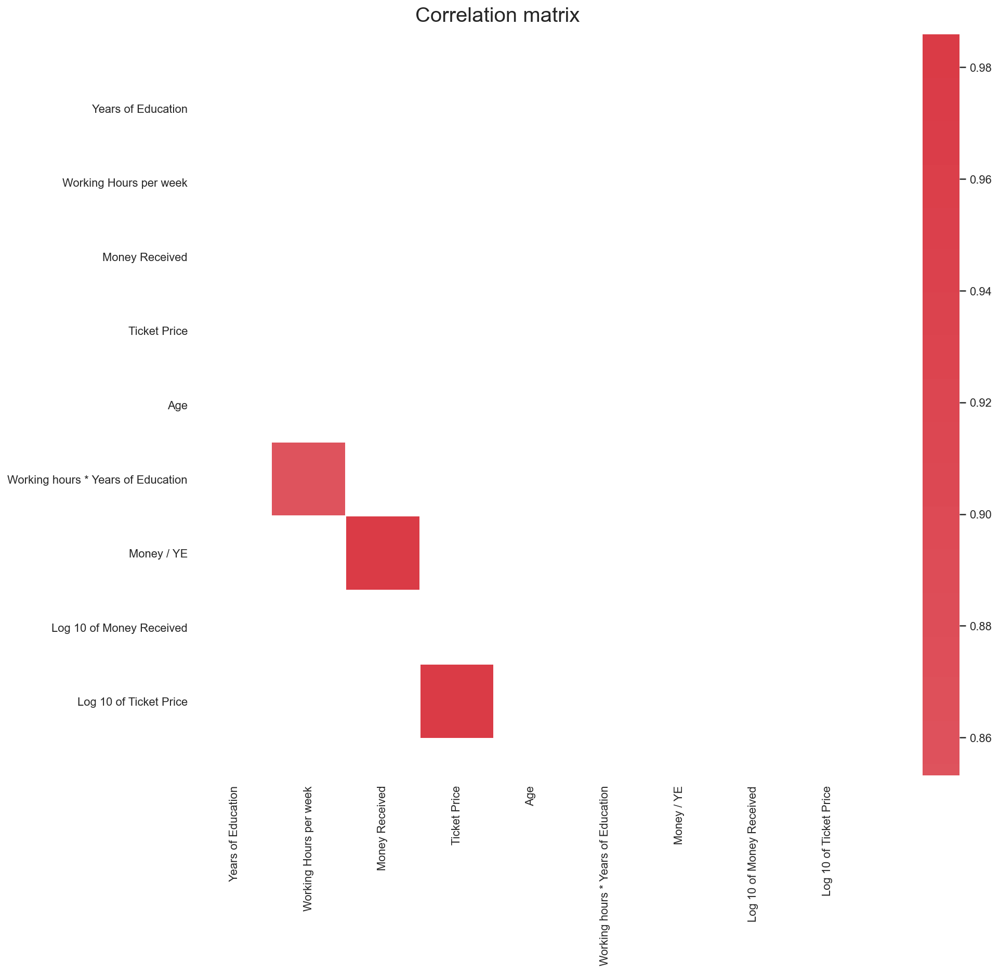

In [206]:
sns.set(style="white")

# Compute the correlation matrix
corr = stand_metric.corr() #Getting correlation of numerical variables

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool) #Return an array of zeros (Falses) with the same shape and type as a given array
mask[np.triu_indices_from(mask)] = True #The upper-triangle array is now composed by True values

# Set up the matplotlib figure
fig, ax = plt.subplots(figsize=(20, 12))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True) #Make a diverging palette between two HUSL colors. Return a matplotlib colormap object.

# Draw the heatmap with the mask and correct aspect ratio
#show only corr bigger than 0.6 in absolute value
sns.heatmap(corr[(corr>=.7) | (corr<=-.7)], mask=mask, cmap=cmap, center=0, square=True, linewidths=.5, ax=ax)

# Layout
plt.subplots_adjust(top=0.95)
plt.suptitle("Correlation matrix", fontsize=20)
plt.yticks(rotation=0)
plt.xticks(rotation=90)
# Fixing the bug of partially cut-off bottom and top cells
b, t = plt.ylim() # discover the values for bottom and top
b += 0.5 # Add 0.5 to the bottom
t -= 0.5 # Subtract 0.5 from the top
plt.ylim(b, t) # update the ylim(bottom, top) values

plt.show()

In [207]:
#correlation between Money Received and Log 10 of Money Received
round(corr['Money Received']['Log 10 of Money Received'], 3)

0.561

In [208]:
#no of features
nof_list=np.arange(1,len(stand_metric.columns)+1)  
high_score=0

#Variable to store the optimum features
nof=0           
score_list =[]
for n in range(len(nof_list)):
    # we are going to see in the next class this "train_test_split()"...
    X_train, X_test, y_train, y_test = train_test_split(stand_metric,target, test_size = 0.3, random_state = 0)
    
    model = LogisticRegression()
    rfe = RFE(model,nof_list[n])
    X_train_rfe = rfe.fit_transform(X_train,y_train)
    X_test_rfe = rfe.transform(X_test)
    model.fit(X_train_rfe,y_train)
    
    score = model.score(X_test_rfe,y_test)
    score_list.append(score)
    
    if(score>high_score):
        high_score = score
        nof = nof_list[n]
print("Optimum number of features: %d" %nof)
print("Score with %d features: %f" % (nof, high_score))
#baseline c minmax 7 features

Optimum number of features: 8
Score with 8 features: 0.817857


In [209]:
rfe = RFE(estimator = model, n_features_to_select = 7)
X_rfe = rfe.fit_transform(X = stand_metric, y = target)
model = LogisticRegression().fit(X = X_rfe,y = target)
selected_features = pd.Series(rfe.support_, index = stand_metric.columns)
selected_features
#minmax só retira logs

Years of Education                     True
Working Hours per week                 True
Money Received                        False
Ticket Price                          False
Age                                    True
Working hours * Years of Education     True
Money / YE                             True
Log 10 of Money Received               True
Log 10 of Ticket Price                 True
dtype: bool

Best alpha using built-in LassoCV: 0.869043
Best score using built-in LassoCV: 0.075719
Lasso picked 3 variables and eliminated the other 6 variables


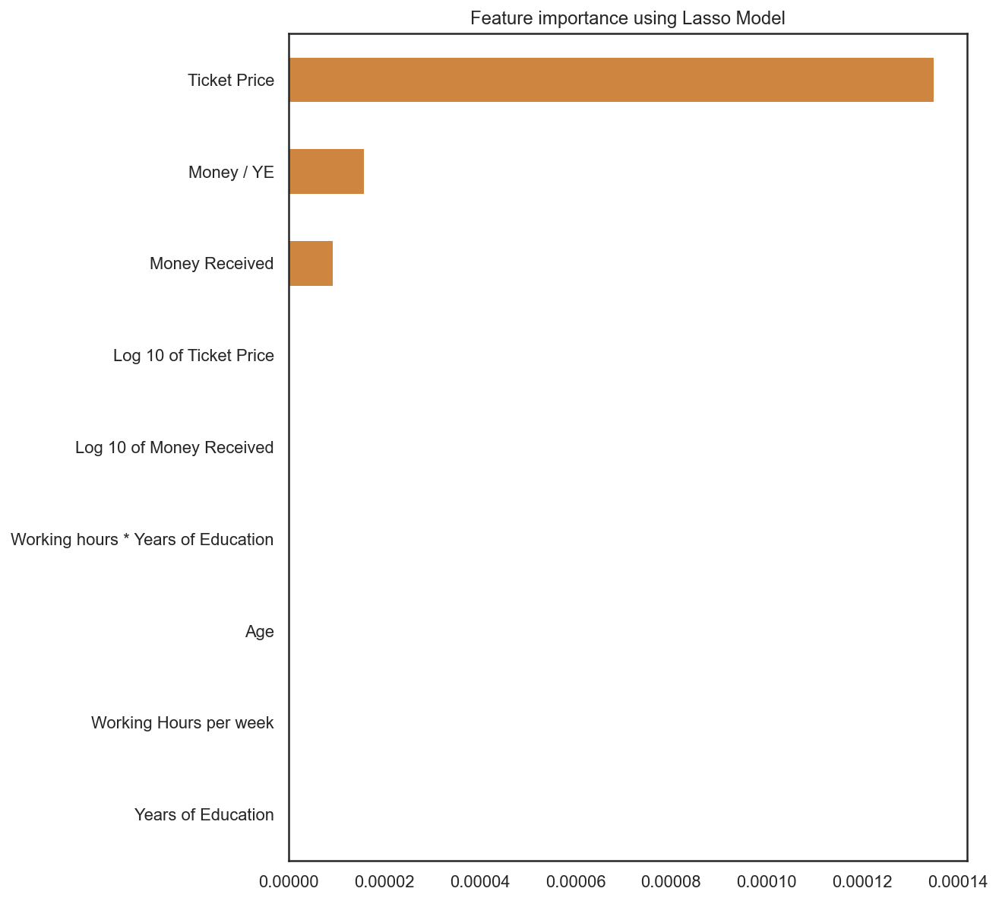

In [210]:
#Lasso
def plot_importance(coef,name):
    imp_coef = coef.sort_values()
    plt.figure(figsize=(8,10))
    imp_coef.plot(kind = "barh", color="peru")
    plt.title("Feature importance using " + name + " Model")
    plt.show()
    
reg = LassoCV()

reg.fit(X=stand_metric, y=target)
print("Best alpha using built-in LassoCV: %f" % reg.alpha_)
print("Best score using built-in LassoCV: %f" %reg.score(X = stand_metric,y = target))
coef = pd.Series(reg.coef_, index = stand_metric.columns)
print("Lasso picked " + str(sum(coef != 0)) + " variables and eliminated the other " +  str(sum(coef == 0)) + " variables")
plot_importance(coef,'Lasso') #minmax chose all

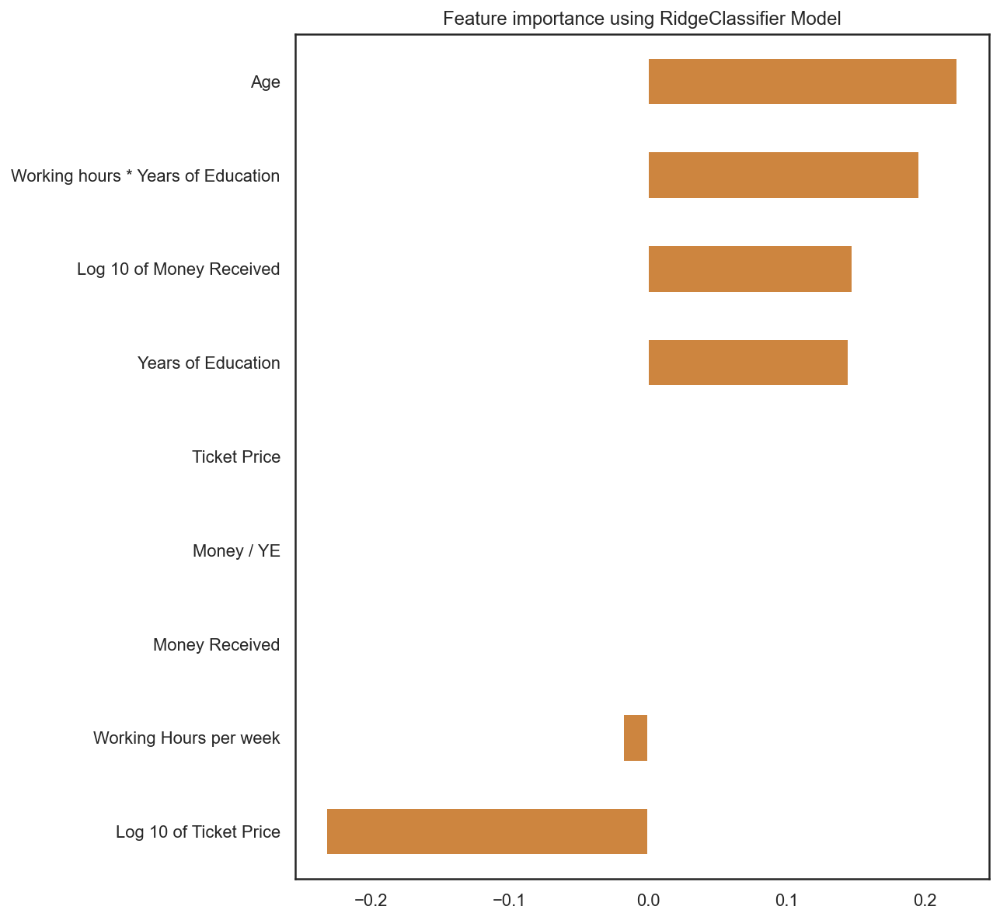

In [211]:
ridge = RidgeClassifierCV().fit(X = stand_metric,y = target)
coef_ridge = pd.Series(ridge.coef_[0], index = stand_metric.columns)

def plot_importance(coef,name):
    imp_coef = coef.sort_values()
    plt.figure(figsize=(8,10))
    imp_coef.plot(kind = "barh", color="peru")
    plt.title("Feature importance using " + name + " Model")
    plt.show()
    
plot_importance(coef_ridge,'RidgeClassifier') 
#minmax: money/yearseduc more important and ticket price

### Forward, backward

In [212]:
model = LogisticRegression()

In [213]:
forward = SFS(model, k_features=9, forward=True, scoring="accuracy", cv = None) #floating=False

forward.fit(stand_metric, target)

SequentialFeatureSelector(cv=None, estimator=LogisticRegression(), k_features=9,
                          scoring='accuracy')

In [214]:
forward_table = pd.DataFrame.from_dict(forward.get_metric_dict()).T.drop(columns=['cv_scores', 'ci_bound', 'std_dev', 'std_err'])
forward_table
#min max: more important is the 2th 0.8167

,feature_idx,avg_score,feature_names
1,"(2,)",0.802679,"(Money Received,)"
2,"(2, 3)",0.81567,"(Money Received, Ticket Price)"
3,"(2, 3, 7)",0.817857,"(Money Received, Ticket Price, Log 10 of Money..."
4,"(2, 3, 6, 7)",0.815134,"(Money Received, Ticket Price, Money / YE, Log..."
5,"(2, 3, 6, 7, 8)",0.816027,"(Money Received, Ticket Price, Money / YE, Log..."
6,"(0, 2, 3, 6, 7, 8)",0.816161,"(Years of Education, Money Received, Ticket Pr..."
7,"(0, 2, 3, 5, 6, 7, 8)",0.815893,"(Years of Education, Money Received, Ticket Pr..."
8,"(0, 2, 3, 4, 5, 6, 7, 8)",0.819554,"(Years of Education, Money Received, Ticket Pr..."
9,"(0, 1, 2, 3, 4, 5, 6, 7, 8)",0.819821,"(Years of Education, Working Hours per week, M..."


In [215]:
forward_table_max = forward_table['avg_score'].max()
forward_table_max

0.8198214285714286

In [216]:
forward_table[forward_table['avg_score']==forward_table_max]['feature_names'].values

array([('Years of Education', 'Working Hours per week', 'Money Received', 'Ticket Price', 'Age', 'Working hours * Years of Education', 'Money / YE', 'Log 10 of Money Received', 'Log 10 of Ticket Price')],
      dtype=object)

In [217]:
backward = SFS(model, k_features=1, forward=False, scoring="accuracy", cv = None) #floating=False

backward.fit(stand_metric, target)

SequentialFeatureSelector(cv=None, estimator=LogisticRegression(),
                          forward=False, scoring='accuracy')

In [218]:
backward_table = pd.DataFrame.from_dict(backward.get_metric_dict()).T.drop(columns=['cv_scores', 'ci_bound', 'std_dev', 'std_err'])
backward_table 

,feature_idx,avg_score,feature_names
9,"(0, 1, 2, 3, 4, 5, 6, 7, 8)",0.819821,"(Years of Education, Working Hours per week, M..."
8,"(0, 1, 2, 3, 4, 5, 6, 7)",0.820134,"(Years of Education, Working Hours per week, M..."
7,"(0, 1, 2, 3, 4, 6, 7)",0.819955,"(Years of Education, Working Hours per week, M..."
6,"(0, 1, 3, 4, 6, 7)",0.818571,"(Years of Education, Working Hours per week, T..."
5,"(0, 1, 3, 4, 6)",0.817187,"(Years of Education, Working Hours per week, T..."
4,"(0, 1, 3, 6)",0.814911,"(Years of Education, Working Hours per week, T..."
3,"(0, 3, 6)",0.812098,"(Years of Education, Ticket Price, Money / YE)"
2,"(3, 6)",0.81192,"(Ticket Price, Money / YE)"
1,"(6,)",0.79942,"(Money / YE,)"


In [219]:
backward_table_max = backward_table['avg_score'].max()
backward_table_max
#money receive loses importance here
#chosing same nº of variables (6), this has a higher score(0.82) than minmax (0.816)

0.8201339285714285

In [220]:
backward_table[backward_table['avg_score']==backward_table_max]['feature_names'].values

array([('Years of Education', 'Working Hours per week', 'Money Received', 'Ticket Price', 'Age', 'Working hours * Years of Education', 'Money / YE', 'Log 10 of Money Received')],
      dtype=object)

### Mixing numerical and categorical variables on a Forward and a Backward Feature Selection

In [221]:
stand_metric.drop(columns=['Working Hours per week', 'Money Received', 'Ticket Price'], inplace=True)

In [222]:
all_selected_variables = pd.concat([non_metric_selected, stand_metric], axis=1)

In [223]:
all_selected_variables

,Male,Higher Education,x1_Management,x1_Professor,x2_Married,x2_Single,x3_Bachelors,x3_Masters,x5_1,x5_3,x5_5,Years of Education,Age,Working hours * Years of Education,Money / YE,Log 10 of Money Received,Log 10 of Ticket Price
CITIZEN_ID,,,,,,,,,,,,,,,,,
12486,1,1,0,0,1,0,0,0,0,0,0,0.000000,0.40,0.000000,0.00,0.000000,3.356599
12487,1,0,0,0,1,0,0,0,0,1,0,-0.333333,0.25,-0.208333,0.00,0.000000,0.000000
12488,1,0,0,0,1,0,0,0,0,0,0,-0.333333,0.10,0.166667,0.00,0.000000,3.365675
12489,1,0,0,0,1,0,0,0,0,0,0,-0.666667,1.30,-0.588542,490.45,3.731991,0.000000
12490,1,1,0,1,0,1,0,0,0,1,0,2.666667,-0.20,2.213542,0.00,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34881,0,0,0,0,0,0,0,0,0,1,0,-0.333333,-0.60,-0.208333,0.00,0.000000,0.000000
34882,1,0,0,0,0,1,0,0,0,1,0,-0.333333,-0.70,-0.520833,0.00,0.000000,0.000000
34883,0,1,0,1,0,1,0,1,0,0,0,1.333333,-0.55,0.833333,157.29,3.427161,0.000000


In [224]:
model = LogisticRegression()

Forward:

In [225]:
forward = SFS(model, k_features=16, forward=True, scoring="accuracy", cv = None) #floating=False

forward.fit(all_selected_variables, target)

SequentialFeatureSelector(cv=None, estimator=LogisticRegression(),
                          k_features=16, scoring='accuracy')

In [226]:
forward_table = pd.DataFrame.from_dict(forward.get_metric_dict()).T.drop(columns=['cv_scores', 'ci_bound', 'std_dev', 'std_err'])
forward_table

,feature_idx,avg_score,feature_names
1,"(14,)",0.79942,"(Money / YE,)"
2,"(11, 14)",0.808348,"(Years of Education, Money / YE)"
3,"(4, 11, 14)",0.834643,"(x2_Married, Years of Education, Money / YE)"
4,"(4, 11, 14, 15)",0.839598,"(x2_Married, Years of Education, Money / YE, L..."
5,"(2, 4, 11, 14, 15)",0.842187,"(x1_Management, x2_Married, Years of Education..."
6,"(2, 4, 11, 14, 15, 16)",0.844286,"(x1_Management, x2_Married, Years of Education..."
7,"(2, 4, 11, 12, 14, 15, 16)",0.84625,"(x1_Management, x2_Married, Years of Education..."
8,"(2, 4, 10, 11, 12, 14, 15, 16)",0.847098,"(x1_Management, x2_Married, x5_5, Years of Edu..."
9,"(2, 4, 8, 10, 11, 12, 14, 15, 16)",0.847366,"(x1_Management, x2_Married, x5_1, x5_5, Years ..."
10,"(2, 4, 8, 9, 10, 11, 12, 14, 15, 16)",0.847812,"(x1_Management, x2_Married, x5_1, x5_3, x5_5, ..."


o 8 é o melhor tendo em conta both o numero de variaves e o score

In [227]:
forward_table.loc[8, 'avg_score']

0.8470982142857143

In [228]:
forward_table.loc[8, 'feature_names']

('x1_Management',
 'x2_Married',
 'x5_5',
 'Years of Education',
 'Age',
 'Money / YE',
 'Log 10 of Money Received',
 'Log 10 of Ticket Price')

Backward

In [229]:
backward = SFS(model, k_features=1, forward=False, scoring="accuracy", cv = None) #floating=False

backward.fit(all_selected_variables, target)

SequentialFeatureSelector(cv=None, estimator=LogisticRegression(),
                          forward=False, scoring='accuracy')

In [230]:
backward_table = pd.DataFrame.from_dict(backward.get_metric_dict()).T.drop(columns=['cv_scores', 'ci_bound', 'std_dev', 'std_err'])
backward_table

,feature_idx,avg_score,feature_names
17,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",0.845223,"(Male, Higher Education, x1_Management, x1_Pro..."
16,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",0.847098,"(Male, Higher Education, x1_Management, x1_Pro..."
15,"(0, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...",0.846116,"(Male, x1_Management, x1_Professor, x2_Married..."
14,"(2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15)",0.846875,"(x1_Management, x1_Professor, x2_Married, x2_S..."
13,"(2, 3, 4, 5, 6, 7, 8, 9, 11, 12, 13, 14, 15)",0.847054,"(x1_Management, x1_Professor, x2_Married, x2_S..."
12,"(2, 3, 4, 6, 7, 8, 9, 11, 12, 13, 14, 15)",0.847366,"(x1_Management, x1_Professor, x2_Married, x3_B..."
11,"(2, 3, 4, 7, 8, 9, 11, 12, 13, 14, 15)",0.847054,"(x1_Management, x1_Professor, x2_Married, x3_M..."
10,"(2, 3, 4, 8, 9, 11, 12, 13, 14, 15)",0.846786,"(x1_Management, x1_Professor, x2_Married, x5_1..."
9,"(2, 3, 4, 9, 11, 12, 13, 14, 15)",0.847009,"(x1_Management, x1_Professor, x2_Married, x5_3..."
8,"(2, 4, 9, 11, 12, 13, 14, 15)",0.84567,"(x1_Management, x2_Married, x5_3, Years of Edu..."


In [231]:
backward_table.loc[9, 'avg_score'] #o melhor é 9 tendo em conta ambas

0.8470089285714286

In [232]:
backward_table.loc[9, 'feature_names'] 

('x1_Management',
 'x1_Professor',
 'x2_Married',
 'x5_3',
 'Years of Education',
 'Age',
 'Working hours * Years of Education',
 'Money / YE',
 'Log 10 of Money Received')

Mantaining the variables that appear on both the forward and backward selections:

In [233]:
non_metric_bf = non_metric_selected.drop(columns=['Higher Education', 'Male','x2_Single', 'x3_Bachelors', 'x3_Masters', 'x5_1', 'x5_3'])

In [234]:
all_selected_variables.drop(columns=['Higher Education', 'Male','x2_Single', 'x3_Bachelors', 'x3_Masters', 'x5_1', 'x5_3'], inplace=True)

### Checking point biserial among the selected numerical and categorical variables

In [235]:
from scipy.stats import pointbiserialr

print('Point biserial between binary and metric variables:\n')
for i in non_metric_bf.columns:
    for j in stand_metric.columns:
        pb = pointbiserialr(non_metric_bf[i], stand_metric[j])
        
        if abs(pb[0]) > 0.5:
            print(i, 'and', j, ':', round(pb[0], 3))

Point biserial between binary and metric variables:

x5_5 and Log 10 of Ticket Price : 0.705


In [236]:
all_selected_variables.columns

Index(['x1_Management', 'x1_Professor', 'x2_Married', 'x5_5',
       'Years of Education', 'Age', 'Working hours * Years of Education',
       'Money / YE', 'Log 10 of Money Received', 'Log 10 of Ticket Price'],
      dtype='object')

In [237]:
all_variables_test = pd.concat([df_test, ohc_df_test], axis=1)

test=all_variables_test[['Age','Years of Education','Working hours * Years of Education','x1_Management','x2_Married','x5_5',
                         'Log 10 of Ticket Price','x1_Professor','Log 10 of Money Received','Money / YE']]

## Data Partition

In [238]:
X_train, X_val, y_train, y_val = train_test_split(all_selected_variables,
                                                  target,
                                                  test_size = 0.3,
                                                  random_state = 42,
                                                  shuffle=True,
                                                  stratify=target)

# Predictive Modelling

In [239]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix #confusion_matrix to evaluate the accuracy of a classification 
from sklearn.metrics import accuracy_score
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
import time
from sklearn.model_selection import KFold
from sklearn.tree import export_graphviz
import graphviz
import pydotplus
from sklearn.metrics import auc
from sklearn.metrics import roc_curve
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import PassiveAggressiveClassifier
from numpy import mean
from numpy import std
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, StackingClassifier
from sklearn.metrics import f1_score
import matplotlib.pyplot as plt
from matplotlib.legend_handler import HandlerLine2D
from sklearn.svm import SVC

In [240]:
# Functions to be used in all models to assess them

def metrics(y_train, pred_train , y_val, pred_val):
    print('_____________________________________')
    print('                                                     TRAIN                                                 ')
    print('-----------------------------------------------------------------------------------------------------------')
    print(classification_report(y_train, pred_train))
    print(confusion_matrix(y_train, pred_train)) #true neg and true pos, false positives and false neg
    print('__________________________+_________')
    print('                                                VALIDATION                                                 ')
    print('-----------------------------------------------------------------------------------------------------------')
    print(classification_report(y_val, pred_val))
    print(confusion_matrix(y_val, pred_val))
    
    
def avg_score(model):
    # apply kfold
    kf = KFold(n_splits=10)
    # create lists to store the results from the different models 
    score_train = []
    score_val = []
    timer = []
    n_iter = []
    for train_index, val_index in kf.split(all_selected_variables):
        # get the indexes of the observations assigned for each partition
        X_train, X_val = all_selected_variables.iloc[train_index], all_selected_variables.iloc[val_index]
        y_train, y_val = target.iloc[train_index], target.iloc[val_index]
        # start counting time
        begin = time.perf_counter()
        # fit the model to the data
        model.fit(X_train, y_train)
        # finish counting time
        end = time.perf_counter()
        # check the mean accuracy for the train
        value_train = model.score(X_train, y_train)
        # check the mean accuracy for the test
        value_val = model.score(X_val,y_val)
        # append the accuracies, the time and the number of iterations in the corresponding list
        score_train.append(value_train)
        score_val.append(value_val)
        timer.append(end-begin)
        n_iter.append(model.n_iter_)
    # calculate the average and the std for each measure (accuracy, time and number of iterations)
    avg_time = round(np.mean(timer),3)
    avg_train = round(np.mean(score_train),3)
    avg_val = round(np.mean(score_val),3)
    std_time = round(np.std(timer),2)
    std_train = round(np.std(score_train),2)
    std_val = round(np.std(score_val),2)
    avg_iter = round(np.mean(n_iter),1)
    std_iter = round(np.std(n_iter),1)
    
    return str(avg_time) + '+/-' + str(std_time), str(avg_train) + '+/-' + str(std_train),\
str(avg_val) + '+/-' + str(std_val), str(avg_iter) + '+/-' + str(std_iter)


def show_results(df, *args):
    """
    Receive an empty dataframe and the different models and call the function avg_score
    """
    count = 0
    # for each model passed as argument
    for arg in args:
        # obtain the results provided by avg_score
        time, avg_train, avg_val, avg_iter = avg_score(arg)
        # store the results in the right row
        df.iloc[count] = time, avg_train, avg_val, avg_iter
        count+=1
    return df

In [241]:
# For the models that don't have n_iter attribute

def avg_score_1(model):
    # apply kfold
    kf = KFold(n_splits=10)
    # create lists to store the results from the different models 
    score_train = []
    score_val = []
    timer = []
    n_iter = []
    for train_index, val_index in kf.split(all_selected_variables):
        # get the indexes of the observations assigned for each partition
        X_train, X_val = all_selected_variables.iloc[train_index], all_selected_variables.iloc[val_index]
        y_train, y_val = target.iloc[train_index], target.iloc[val_index]
        # start counting time
        begin = time.perf_counter()
        # fit the model to the data
        model.fit(X_train, y_train)
        # finish counting time
        end = time.perf_counter()
        # check the mean accuracy for the train
        value_train = model.score(X_train, y_train)
        # check the mean accuracy for the validation
        value_val = model.score(X_val,y_val)
        # append the accuracies, the time and the number of iterations in the corresponding list
        score_train.append(value_train)
        score_val.append(value_val)
        timer.append(end-begin)
        #n_iter.append(model.n_iter_)
    # calculate the average and the std for each measure (accuracy, time and number of iterations)
    avg_time = round(np.mean(timer),3)
    avg_train = round(np.mean(score_train),3)
    avg_val = round(np.mean(score_val),3)
    std_time = round(np.std(timer),2)
    std_train = round(np.std(score_train),2)
    std_val = round(np.std(score_val),2)
    #avg_iter = round(np.mean(n_iter),1)
    #std_iter = round(np.std(n_iter),1)
    
    return str(avg_time) + '+/-' + str(std_time), str(avg_train) + '+/-' + str(std_train),\
str(avg_val) + '+/-' + str(std_val)
#, str(avg_iter) + '+/-' + str(std_iter)


def show_results_1(df, *args):
    """
    Receive an empty dataframe and the different models and call the function avg_score
    """
    count = 0
    # for each model passed as argument
    for arg in args:
        # obtain the results provided by avg_score
        time, avg_train, avg_val = avg_score_1(arg)
        # store the results in the right row
        df.iloc[count] = time, avg_train, avg_val
        count+=1
    return df

## Decision Trees

In [156]:
def plot_tree(model_tree):
    dot_data = export_graphviz(model_tree,
                               feature_names=X_train.columns,  
                               class_names=["Income lower or equal to avg", "Income higher than avg"],
                               filled=True)
    pydot_graph = pydotplus.graph_from_dot_data(dot_data)
    pydot_graph.set_size('"20,20"')
    return graphviz.Source(pydot_graph.to_string())

In [157]:
#AUC
def calculate_AUC(interval, x_train, x_val, y_train, y_val, parameter, max_depth = None):
    train_results = []
    val_results = []
    for value in interval:
        if (parameter == 'max_depth'):          
            dt = DecisionTreeClassifier(max_depth = value, random_state=42)
            dt.fit(x_train, y_train)
        elif (parameter == 'max_features'):  
            dt = DecisionTreeClassifier(max_features = value, max_depth = max_depth, random_state=42)
            dt.fit(x_train, y_train)
        elif (parameter == 'min_samples_split'):  
            dt = DecisionTreeClassifier(min_samples_split = value, max_depth = max_depth, random_state=42)
            dt.fit(x_train, y_train)
        elif (parameter == 'min_samples_leaf'):  
            dt = DecisionTreeClassifier(min_samples_leaf = value, max_depth = max_depth, random_state=42)
            dt.fit(x_train, y_train)
        elif (parameter == 'min_weight_fraction_leaf'):  
            dt = DecisionTreeClassifier(min_weight_fraction_leaf = value, max_depth = max_depth, random_state=42)
            dt.fit(x_train, y_train)
        elif (parameter == 'min_impurity_decrease'):  
            dt = DecisionTreeClassifier(min_impurity_decrease = value, max_depth = max_depth, random_state=42)
            dt.fit(x_train, y_train)
        train_pred = dt.predict(x_train)
        false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, train_pred)
        roc_auc = auc(false_positive_rate, true_positive_rate)
        # Add auc score to previous train results
        train_results.append(roc_auc)
        y_pred = dt.predict(x_val)
        false_positive_rate, true_positive_rate, thresholds = roc_curve(y_val, y_pred)
        roc_auc = auc(false_positive_rate, true_positive_rate)
        # Add auc score to previous validation results
        val_results.append(roc_auc)
    value_train = train_results.index(max(train_results))
    value_val = val_results.index(max(val_results))
    print('The best train value is ',interval[value_train])
    print('The best validation value is ',interval[value_val])
    

    import matplotlib.pyplot as plt
    from matplotlib.legend_handler import HandlerLine2D
    line1, = plt.plot(interval, train_results, 'b', label="Train AUC")
    line2, = plt.plot(interval, val_results, 'r', label="Validation AUC")
    plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
    plt.ylabel("AUC score")
    plt.xlabel(str(parameter))
    plt.show()

Nota: parameters in decision trees don't really improve performance, they're meant to control overfitting

In [158]:
dt_entropy = DecisionTreeClassifier(criterion = 'entropy').fit(X_train, y_train)
dt_gini = DecisionTreeClassifier(criterion = 'gini').fit(X_train, y_train)

df = pd.DataFrame(columns = ['Time','Train','Validation'], index = ['Gini','Entropy'])
show_results_1(df,dt_gini, dt_entropy)

,Time,Train,Validation
Gini,0.079+/-0.03,0.931+/-0.0,0.829+/-0.01
Entropy,0.062+/-0.01,0.931+/-0.0,0.83+/-0.01


In [159]:
dt_random = DecisionTreeClassifier(splitter = 'random').fit(X_train, y_train)

df = pd.DataFrame(columns = ['Time','Train','Validation'], index = ['best','random'])
show_results_1(df,dt_gini, dt_random)

,Time,Train,Validation
best,0.059+/-0.01,0.931+/-0.0,0.829+/-0.01
random,0.052+/-0.01,0.931+/-0.0,0.828+/-0.01


The best train value is  15.0
The best validation value is  10.0


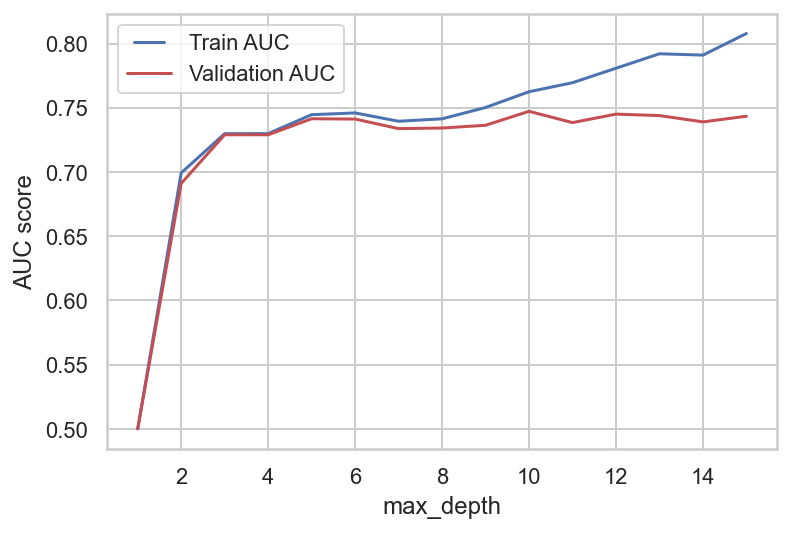

In [160]:
max_depths = np.linspace(1, 15, 15, endpoint=True)  
calculate_AUC(max_depths, X_train, X_val, y_train, y_val, 'max_depth')

In [169]:
dt_depth10 = DecisionTreeClassifier(max_depth = 10).fit(X_train, y_train)
dt_depth3 = DecisionTreeClassifier(max_depth = 3).fit(X_train, y_train)

df = pd.DataFrame(columns = ['Time','Train','Validation'], index = ['full','depth10','depth3'])
show_results_1(df,dt_gini, dt_depth10,dt_depth3)

# Quanto maior, mais overfitting! Com 6 é o melhor resultado dos 3 (menos overfitting e maior score no validation)

,Time,Train,Validation
full,0.065+/-0.01,0.931+/-0.0,0.829+/-0.01
depth10,0.041+/-0.0,0.868+/-0.0,0.852+/-0.01
depth3,0.017+/-0.0,0.843+/-0.0,0.843+/-0.01


The best train value is  8
The best validation value is  7


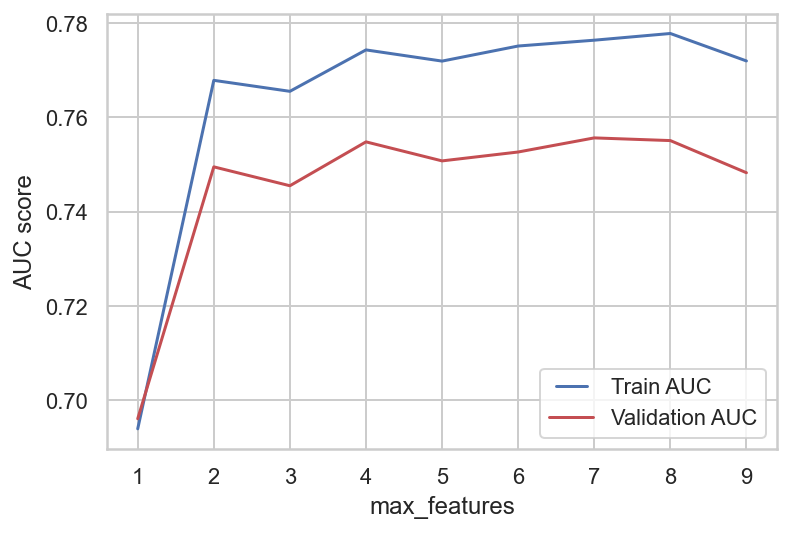

In [162]:
max_features = list(range(1,len(X_train.columns)))
calculate_AUC(max_features, X_train, X_val, y_train, y_val,'max_features', 10)
# Acho que não é necessário! Pelo gráfico vê-se que daria overfitting e já temos um número aceitável de variáveis
# Para além de que ele escolhe aleatoriamente as variáveis a usar

The best train value is  10
The best validation value is  323


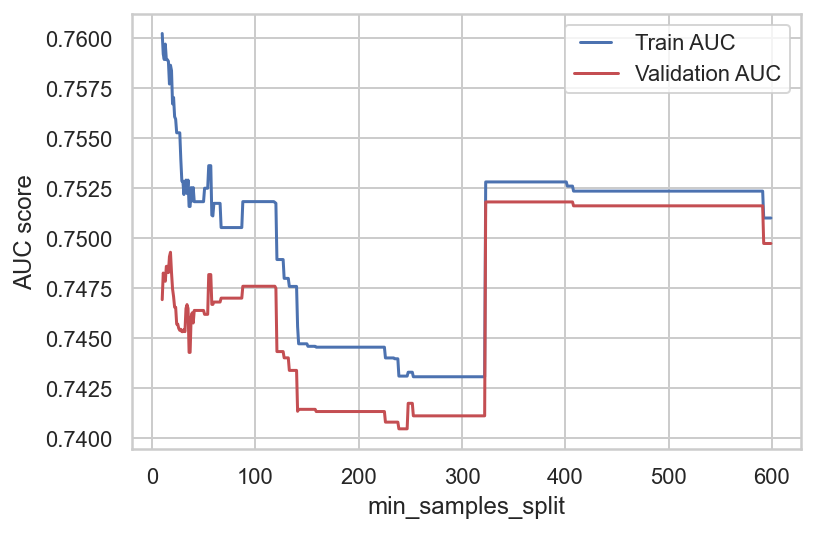

In [164]:
min_samples_split = list(range(10,600))
calculate_AUC(min_samples_split, X_train, X_val, y_train, y_val,'min_samples_split', 10)

In [170]:
dt_min50 = DecisionTreeClassifier(min_samples_split = 50).fit(X_train, y_train)
dt_min125 = DecisionTreeClassifier(min_samples_split = 125).fit(X_train, y_train)
dt_min323 = DecisionTreeClassifier(min_samples_split = 323).fit(X_train, y_train)

df = pd.DataFrame(columns = ['Time','Train','Validation'], index = ['dt_min50','dt_min125','dt_min323'])
show_results_1(df, dt_min50, dt_min125, dt_min323)

# Aqui quanto menor, mais overfitting! Com 350 já dá um resultado equilibrado (é o melhor e mais generalizado)

,Time,Train,Validation
dt_min50,0.056+/-0.0,0.878+/-0.0,0.845+/-0.01
dt_min125,0.045+/-0.0,0.867+/-0.0,0.852+/-0.01
dt_min350,0.042+/-0.01,0.859+/-0.0,0.853+/-0.01


The best train value is  55
The best validation value is  11


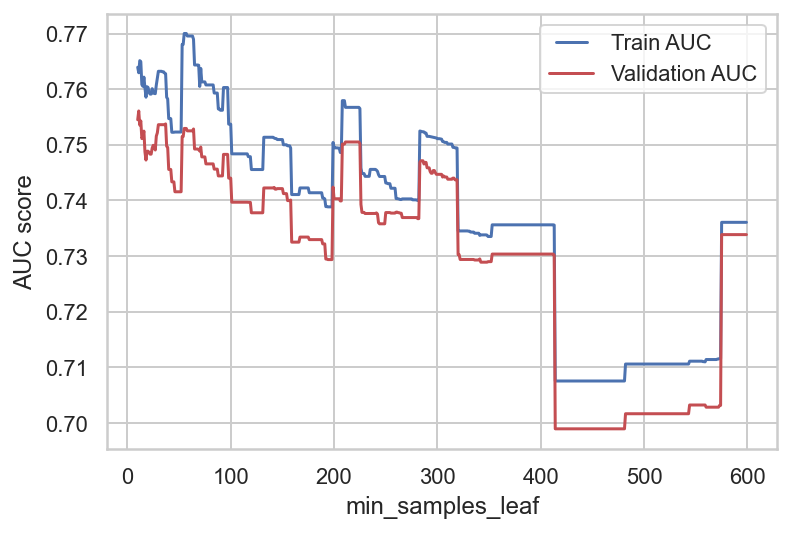

In [166]:
min_samples_leaf = list(range(10,600))
calculate_AUC(min_samples_leaf, X_train, X_val, y_train, y_val,'min_samples_leaf', 10)

In [171]:
dt_min_leaf11 = DecisionTreeClassifier(min_samples_split = 11).fit(X_train, y_train)
dt_min_leaf400 = DecisionTreeClassifier(min_samples_split = 400).fit(X_train, y_train)

df = pd.DataFrame(columns = ['Time','Train','Validation'], index = ['Min leaf 1','Min leaf 11','Min leaf 400'])
show_results_1(df, dt_gini, dt_min_leaf11, dt_min_leaf400)

# mais confuso de chegar a uma conclusão e tem o mesmo efeito que min_samples_split
# Quanto maior -> + underfitting, menor(default)-> full grown tree (overfitting)

,Time,Train,Validation
Min leaf 1,0.066+/-0.02,0.931+/-0.0,0.83+/-0.01
Min leaf 11,0.065+/-0.03,0.902+/-0.0,0.84+/-0.01
Min leaf 400,0.04+/-0.01,0.858+/-0.0,0.854+/-0.01


The best train value is  0.003614457831325301
The best validation value is  0.003614457831325301


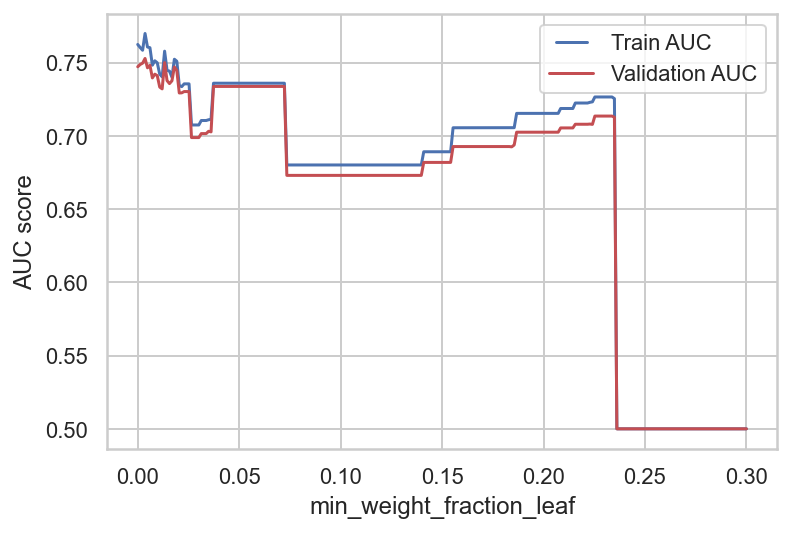

In [172]:
# more useful for imbalanced datasets!
min_weight_fraction_leaf = np.linspace(0, 0.3, 250, endpoint=True)
calculate_AUC(min_weight_fraction_leaf, X_train, X_val, y_train, y_val,'min_weight_fraction_leaf', 10)

In [173]:
dt_min_weight_1 = DecisionTreeClassifier(min_weight_fraction_leaf = 0.00361).fit(X_train, y_train)
dt_min_weight_2 = DecisionTreeClassifier(min_weight_fraction_leaf = 0.05).fit(X_train, y_train)

df = pd.DataFrame(columns = ['Time','Train','Validation'], index = ['Min leaf 1','Min weight small','Min weight med'])
show_results_1(df, dt_gini, dt_min_weight_1, dt_min_weight_2)

# Usar diferente de 0.0 já fez diferença!0.05 reduziu o score! Usar 0.02

,Time,Train,Validation
Min leaf 1,0.06+/-0.01,0.931+/-0.0,0.83+/-0.01
Min weight small,0.041+/-0.01,0.856+/-0.0,0.851+/-0.01
Min weight med,0.021+/-0.0,0.822+/-0.0,0.822+/-0.01


The best train value is  0.0
The best validation value is  0.0001002004008016032


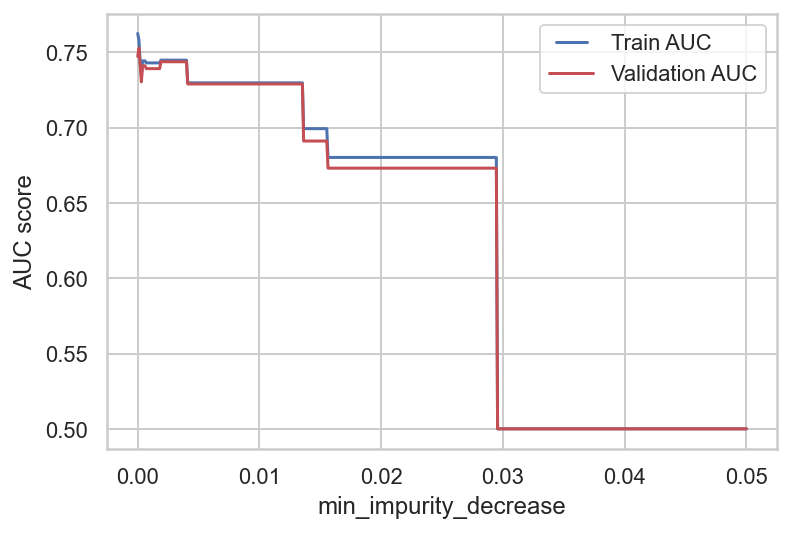

In [174]:
min_impurity_decrease = np.linspace(0, 0.05, 500, endpoint=True)
calculate_AUC(min_impurity_decrease, X_train, X_val, y_train, y_val,'min_impurity_decrease', 10)

In [175]:
dt_impurity01 = DecisionTreeClassifier(min_impurity_decrease=0.01).fit(X_train, y_train)
dt_impurity0001 = DecisionTreeClassifier(min_impurity_decrease=0.0001).fit(X_train, y_train)

df = pd.DataFrame(columns = ['Time','Train','Validation'], index = ['Baseline','dt_impurity01','dt_impurity0001'])
show_results_1(df,dt_gini, dt_impurity01,dt_impurity0001)

# Melhor é min_impurity_decrease=0.0001!

,Time,Train,Validation
Baseline,0.063+/-0.01,0.931+/-0.0,0.83+/-0.01
dt_impurity01,0.02+/-0.0,0.843+/-0.0,0.843+/-0.01
dt_impurity0001,0.039+/-0.0,0.866+/-0.0,0.855+/-0.01


In [176]:
#ccp_alpha
dt_alpha = DecisionTreeClassifier(random_state=42)
path = dt_alpha.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

Text(0.5, 1.0, 'Total Impurity vs effective alpha for training set')

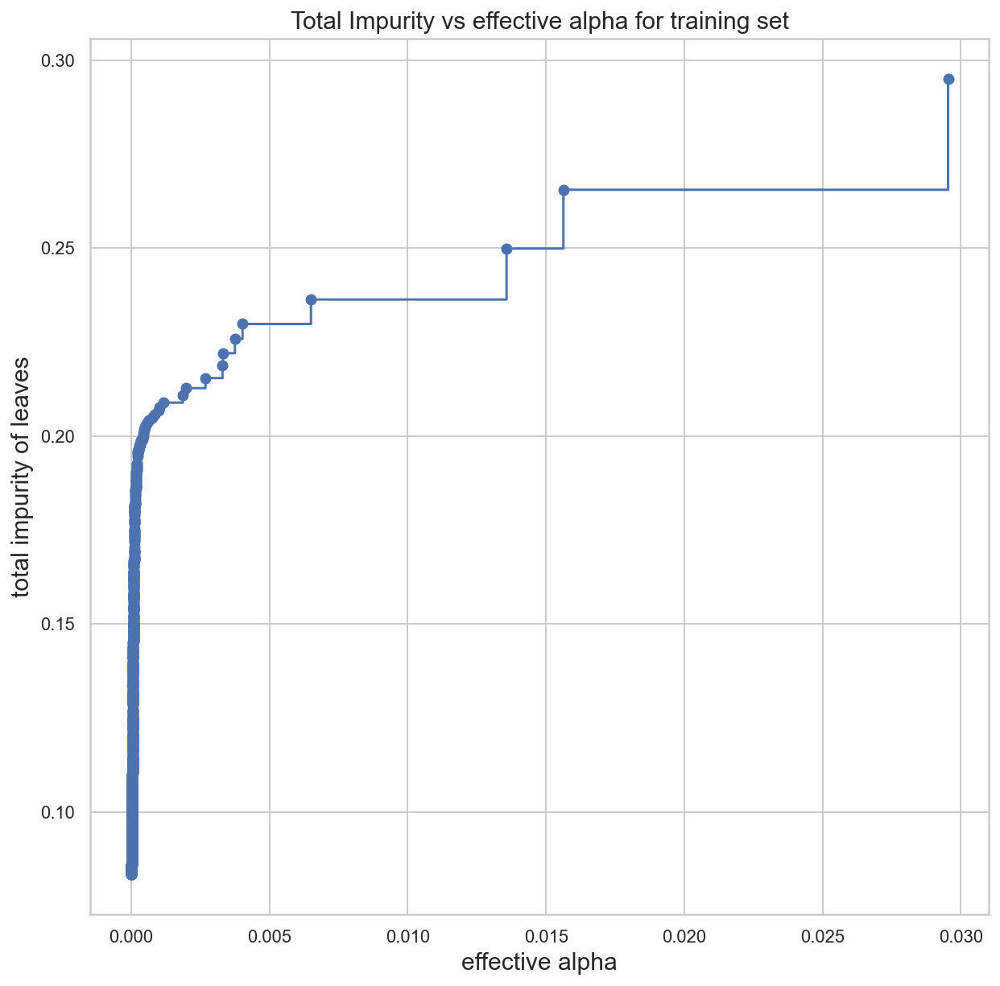

In [177]:
fig, ax = plt.subplots(figsize = (10,10))
ax.plot(ccp_alphas[:-1], impurities[:-1], marker='o', drawstyle="steps-post")
ax.set_xlabel("effective alpha", fontsize=15)
ax.set_ylabel("total impurity of leaves", fontsize=15)
ax.set_title("Total Impurity vs effective alpha for training set", fontsize=15)

In [178]:
#a função abaixo não aceitava ccp_alphas menores que 0
ccp_alphas=ccp_alphas[ccp_alphas>0]

In [179]:
trees = []
for ccp_alpha in ccp_alphas:
    dt_alpha = DecisionTreeClassifier(random_state=42, ccp_alpha=ccp_alpha).fit(X_train, y_train)
    trees.append(dt_alpha)
print("Number of nodes in the last tree is: {} with ccp_alpha: {}".format(trees[-1].tree_.node_count, ccp_alphas[-1]))

Number of nodes in the last tree is: 1 with ccp_alpha: 0.0667089762462656


In [180]:
trees = trees[:-1]
ccp_alphas = ccp_alphas[:-1]

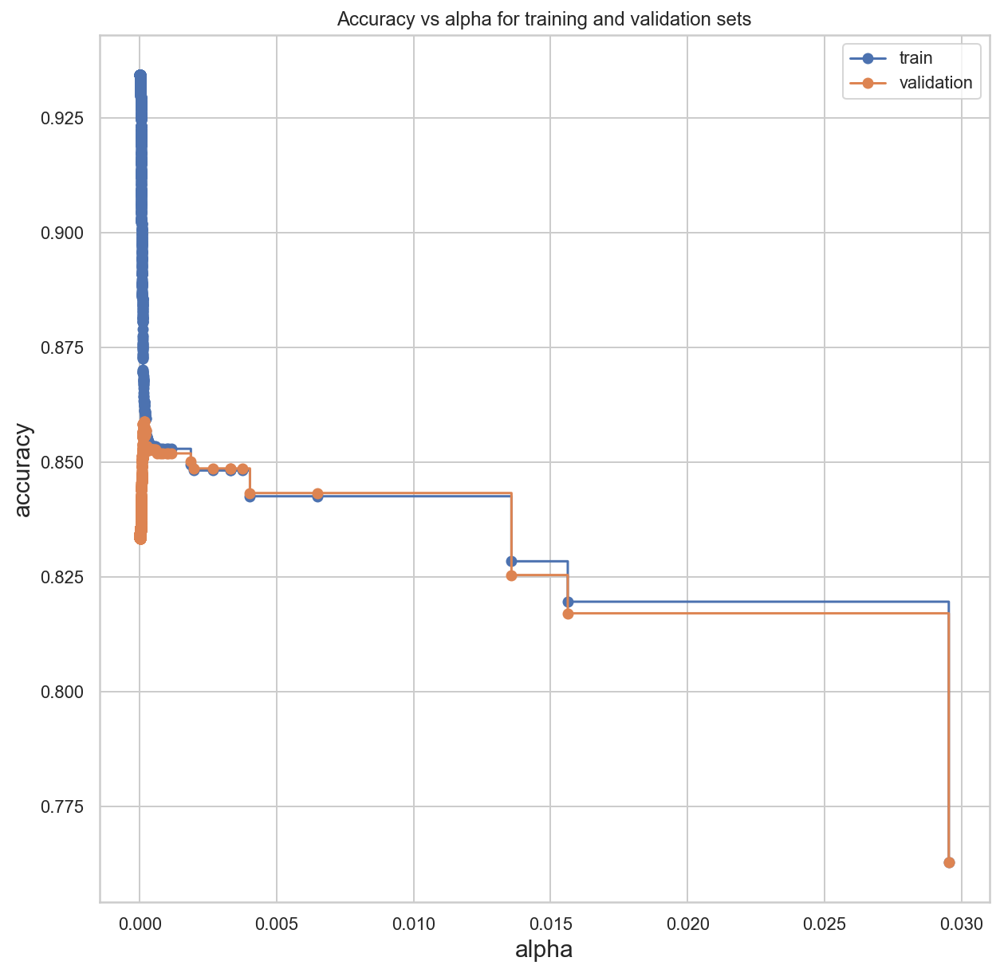

In [181]:
train_scores = [tree.score(X_train, y_train) for tree in trees]
val_scores = [tree.score(X_val, y_val) for tree in trees]

fig, ax = plt.subplots(figsize = (10,10))
ax.set_xlabel("alpha", fontsize=15)
ax.set_ylabel("accuracy", fontsize=15)
ax.set_title("Accuracy vs alpha for training and validation sets")
ax.plot(ccp_alphas, train_scores, marker='o', label="train", drawstyle="steps-post")
ax.plot(ccp_alphas, val_scores, marker='o', label="validation", drawstyle="steps-post")
ax.legend()
plt.show()

In [182]:
index_best_model = np.argmax(val_scores)
best_model = trees[index_best_model]
print('ccp_alpha of best model: ',trees[index_best_model])
print('_____________________________________________________________')
print('Training accuracy of best model: ',best_model.score(X_train, y_train))
print('Validation accuracy of best model: ',best_model.score(X_val, y_val))

ccp_alpha of best model:  DecisionTreeClassifier(ccp_alpha=0.0001546072974644402, random_state=42)
_____________________________________________________________
Training accuracy of best model:  0.863265306122449
Validation accuracy of best model:  0.8587797619047619


In [196]:
dt_t1=DecisionTreeClassifier(min_impurity_decrease=0.0001, max_depth = 10,min_samples_split = 323,min_weight_fraction_leaf = 0.00361,random_state=42).fit(X_train, y_train)
dt_t2=DecisionTreeClassifier(max_depth = 10,min_weight_fraction_leaf = 0.00361,random_state=42).fit(X_train, y_train)
dt_t3=DecisionTreeClassifier(min_samples_split = 323,min_weight_fraction_leaf = 0.00361,random_state=42).fit(X_train, y_train)
dt_t4=DecisionTreeClassifier(max_depth = 10, min_samples_split = 323,min_weight_fraction_leaf = 0.00361,random_state=42).fit(X_train, y_train)

In [197]:
print('Train accuracy:',dt_t1.score(X_train, y_train))
print('Validation accuracy:',dt_t1.score(X_val, y_val))

Train accuracy: 0.8531887755102041
Validation accuracy: 0.8482142857142857


In [198]:
print('Train accuracy:',dt_t2.score(X_train, y_train))
print('Validation accuracy:',dt_t2.score(X_val, y_val))

Train accuracy: 0.8575255102040816
Validation accuracy: 0.8488095238095238


In [199]:
print('Train accuracy:',dt_t3.score(X_train, y_train))
print('Validation accuracy:',dt_t3.score(X_val, y_val))

Train accuracy: 0.8531887755102041
Validation accuracy: 0.8482142857142857


In [200]:
print('Train accuracy:',dt_t4.score(X_train, y_train))
print('Validation accuracy:',dt_t4.score(X_val, y_val))

Train accuracy: 0.8531887755102041
Validation accuracy: 0.8482142857142857


In [201]:
# Criando ainda a tree dada como melhor pelo ccp_alpha:
dt_t5=DecisionTreeClassifier(ccp_alpha=0.000154, random_state=42).fit(X_train, y_train)

print('Train accuracy:',dt_t5.score(X_train, y_train))
print('Validation accuracy:',dt_t5.score(X_val, y_val))

Train accuracy: 0.8633928571428572
Validation accuracy: 0.8581845238095238


In [214]:
#changing the threshold improves or not the accuracy......?
threshold = 0.55

predicted_proba = dt_t5.predict_proba(X_val)
predicted = (predicted_proba [:,1] >= threshold).astype('int')

accuracy = accuracy_score(y_val, predicted)
accuracy

0.8599702380952381

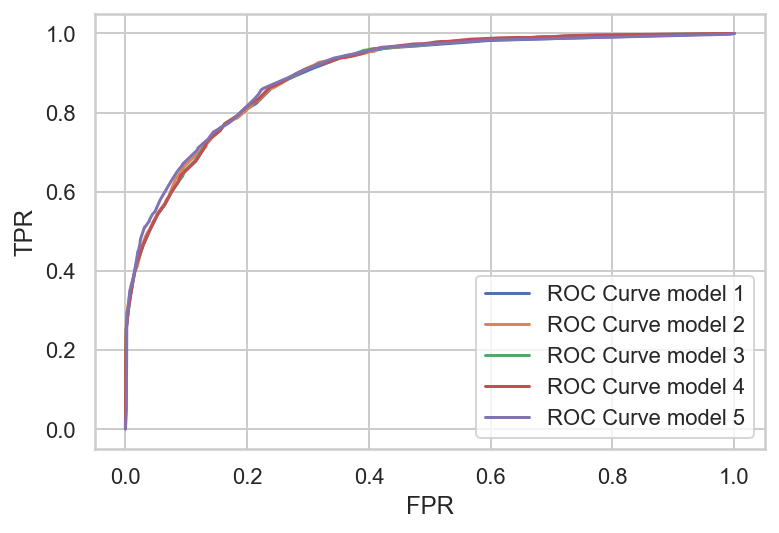

In [207]:
# To build the ROC curve
prob_model1 = dt_t1.predict_proba(X_val)
prob_model2 = dt_t2.predict_proba(X_val)
prob_model3 = dt_t3.predict_proba(X_val)
prob_model4 = dt_t4.predict_proba(X_val)
prob_model5 = dt_t5.predict_proba(X_val)

fpr_1, tpr_1, thresholds_1 = roc_curve(y_val, prob_model1[:, 1])
fpr_2, tpr_2, thresholds_2 = roc_curve(y_val, prob_model2[:, 1])
fpr_3, tpr_3, thresholds_3 = roc_curve(y_val, prob_model3[:, 1])
fpr_4, tpr_4, thresholds_4 = roc_curve(y_val, prob_model4[:, 1])
fpr_5, tpr_5, thresholds_5 = roc_curve(y_val, prob_model5[:, 1])


plt.plot(fpr_1, tpr_1, label="ROC Curve model 1")
plt.plot(fpr_2, tpr_2, label="ROC Curve model 2")
plt.plot(fpr_3, tpr_3, label="ROC Curve model 3")
plt.plot(fpr_4, tpr_4, label="ROC Curve model 4")
plt.plot(fpr_5, tpr_5, label="ROC Curve model 5")
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.legend()
plt.show()

# deu super semelhante, difícil ver qual o melhor

O melhor é a decision tree 5, com o único parâmetro alterado o ccp_alpha

In [208]:
labels_train = dt_t5.predict(X_train)
labels_val = dt_t5.predict(X_val) 

metrics(y_train, labels_train, y_val, labels_val)

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.96      0.91     11962
           1       0.82      0.54      0.65      3718

    accuracy                           0.86     15680
   macro avg       0.85      0.75      0.78     15680
weighted avg       0.86      0.86      0.85     15680

[[11516   446]
 [ 1696  2022]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.96      0.91      5127
           1       0.81   

In [212]:
# Isto é só para ver a complexidade da árvore
print('The "best" tree has a depth of ' + str(dt_t5.get_depth()) + ', ' + str(dt_t5.tree_.node_count) + 
       ' nodes and a total of ' + str(dt_t5.get_n_leaves()) + ' leaves.')

The "best" tree has a depth of 17, 185 nodes and a total of 93 leaves.


## Random Forests

In [217]:
ensemble_clfs = [
    ("RandomForestClassifier, max_features='auto'",
        RandomForestClassifier(oob_score=True,
                               max_features='auto',
                               random_state=42)),
    ("RandomForestClassifier, max_features='log2'",
        RandomForestClassifier(max_features='log2',
                               oob_score=True,
                               random_state=42)),
    ("RandomForestClassifier, max_features=7",
        RandomForestClassifier(max_features=7,
                               oob_score=True,
                               random_state=42)),
    ("RandomForestClassifier, max_features=None",
        RandomForestClassifier(max_features=None,
                               oob_score=True,
                               random_state=42))
]

In [218]:
from collections import OrderedDict

# Map a classifier name to a list of (<n_estimators>, <error rate>) pairs.
error_rate = OrderedDict((label, []) for label, _ in ensemble_clfs)

# Range of `n_estimators` values to explore.
min_estimators = 15
max_estimators = 175 #225

for label, clf in ensemble_clfs:
    for i in range(min_estimators, max_estimators + 1):
        clf.set_params(n_estimators=i)
        clf.fit(X_train, y_train)

        # Record the OOB error for each `n_estimators=i` setting.
        oob_error = 1 - clf.oob_score_
        error_rate[label].append((i, oob_error))

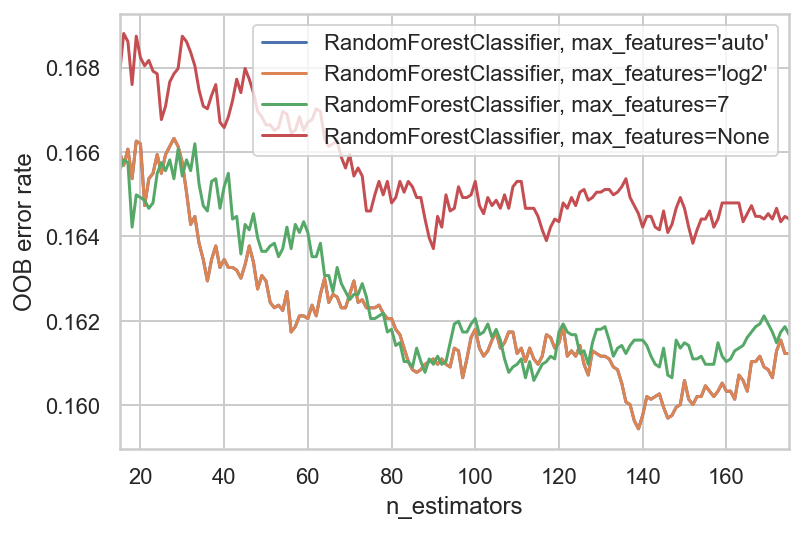

In [219]:
# Generate the "OOB error rate" vs. "n_estimators" plot.
for label, clf_err in error_rate.items():
    xs, ys = zip(*clf_err)
    plt.plot(xs, ys, label=label)

plt.xlim(min_estimators, max_estimators)
plt.xlabel("n_estimators")
plt.ylabel("OOB error rate")
plt.legend(loc="upper right")
plt.show()

In [243]:
# Creating and fitting the models
rf_1 = RandomForestClassifier(n_estimators=140, max_depth=10, random_state = 42).fit(X_train, y_train)

rf_2 = RandomForestClassifier(n_estimators=140, max_depth=10, max_features = 'log2', random_state = 42).fit(X_train, y_train)

rf_3 = RandomForestClassifier(n_estimators=140, max_depth=10, min_samples_split=323, random_state = 42).fit(X_train, y_train)

rf_4= RandomForestClassifier(min_samples_split = 323, min_weight_fraction_leaf = 0.00361,random_state=42).fit(X_train, y_train)

rf_5= RandomForestClassifier(ccp_alpha=0.000154, random_state=42).fit(X_train, y_train)

rf_6= RandomForestClassifier(max_depth = 3, min_weight_fraction_leaf = 0.00361, random_state=42).fit(X_train, y_train)

rf_7= RandomForestClassifier(n_estimators=140, max_depth=3, random_state = 42).fit(X_train, y_train)

rf_8 = RandomForestClassifier(n_estimators=140, max_depth=3, max_features = 'log2', random_state = 42).fit(X_train, y_train)

In [244]:
print('Train accuracy:',rf_1.score(X_train, y_train))
print('Validation accuracy:',rf_1.score(X_val, y_val))

Train accuracy: 0.8676658163265306
Validation accuracy: 0.8580357142857142


In [245]:
print('Train accuracy:',rf_2.score(X_train, y_train))
print('Validation accuracy:',rf_2.score(X_val, y_val))

Train accuracy: 0.8676658163265306
Validation accuracy: 0.8580357142857142


In [246]:
print('Train accuracy:',rf_3.score(X_train, y_train))
print('Validation accuracy:',rf_3.score(X_val, y_val))

Train accuracy: 0.8552295918367347
Validation accuracy: 0.8550595238095238


In [247]:
print('Train accuracy:',rf_4.score(X_train, y_train))
print('Validation accuracy:',rf_4.score(X_val, y_val))

Train accuracy: 0.8533801020408164
Validation accuracy: 0.8529761904761904


In [248]:
print('Train accuracy:',rf_5.score(X_train, y_train))
print('Validation accuracy:',rf_5.score(X_val, y_val))

Train accuracy: 0.8800382653061225
Validation accuracy: 0.8578869047619048


In [249]:
print('Train accuracy:',rf_6.score(X_train, y_train))
print('Validation accuracy:',rf_6.score(X_val, y_val))

Train accuracy: 0.8459821428571429
Validation accuracy: 0.8452380952380952


In [250]:
print('Train accuracy:',rf_7.score(X_train, y_train))
print('Validation accuracy:',rf_7.score(X_val, y_val))

Train accuracy: 0.846875
Validation accuracy: 0.8455357142857143


In [251]:
print('Train accuracy:',rf_8.score(X_train, y_train))
print('Validation accuracy:',rf_8.score(X_val, y_val))

Train accuracy: 0.846875
Validation accuracy: 0.8455357142857143


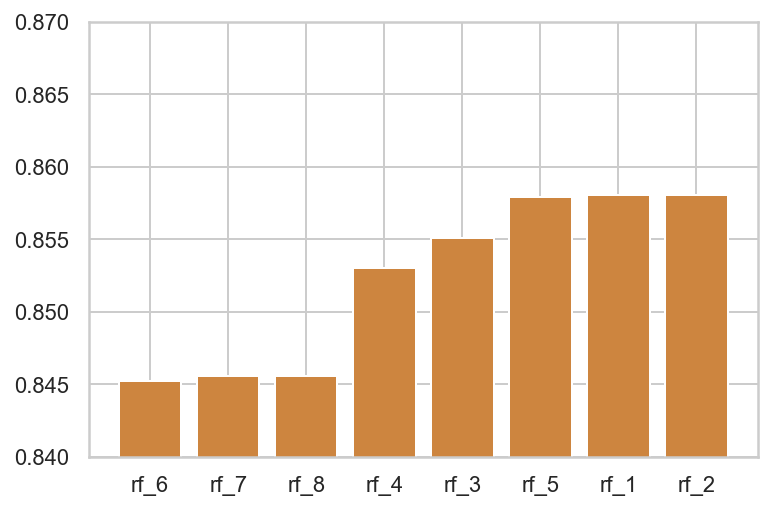

In [252]:
models = ['rf_1', 'rf_2', 'rf_3','rf_4','rf_5', 'rf_6', 'rf_7', 'rf_8']

accuracies = [rf_1.score(X_val, y_val), rf_2.score(X_val, y_val), rf_3.score(X_val, y_val), rf_4.score(X_val, y_val), 
              rf_5.score(X_val, y_val), rf_6.score(X_val, y_val), rf_7.score(X_val, y_val), rf_8.score(X_val, y_val)]

data_tuples = list(zip(models,accuracies))

data = pd.DataFrame(data_tuples)
data = data.sort_values(1)

plt.bar(data[0], data[1], color='peru')
plt.ylim(0.84, 0.87)
plt.show()

In [253]:
labels_train = rf_2.predict(X_train)
labels_val = rf_2.predict(X_val) 

metrics(y_train, labels_train, y_val, labels_val)
#predict values for X_test, ex: p o citizen em X_test [0] estamos a prever y[0]->0

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.88      0.96      0.92     11962
           1       0.82      0.57      0.67      3718

    accuracy                           0.87     15680
   macro avg       0.85      0.77      0.79     15680
weighted avg       0.86      0.87      0.86     15680

[[11485   477]
 [ 1598  2120]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.95      0.91      5127
           1       0.79   

In [261]:
#changing the threshold does not seem to improve the accuracy of the best random forest!
threshold = 0.5

predicted_proba = rf_2.predict_proba(X_val)
predicted = (predicted_proba [:,1] >= threshold).astype('int')

accuracy = accuracy_score(y_val, predicted)
accuracy

0.8580357142857142

## Logistic Regression

In [262]:
#importing and defining the model
log_model = LogisticRegression(random_state=42)

In [263]:
log_model.fit(X_train,y_train) #fit model to our train data

LogisticRegression(random_state=42)

In [264]:
labels_train = log_model.predict(X_train)
log_model.score(X_train, y_train)

0.8472576530612245

In [265]:
#Predict class labels for samples in X
labels_val = log_model.predict(X_val) 
log_model.score(X_val, y_val)
#predict values for X_test, ex: p o citizen em X_test [0] estamos a prever y[0]->0

0.8459821428571429

In [266]:
pred_prob = log_model.predict_proba(X_val) 
pred_prob 
#o cutoff normalmente é de 0.5, mas as vezes é preferivel considerar menos

array([[0.7519127 , 0.2480873 ],
       [0.99037389, 0.00962611],
       [0.5041577 , 0.4958423 ],
       ...,
       [0.72659412, 0.27340588],
       [0.20068366, 0.79931634],
       [0.92960908, 0.07039092]])

In [267]:
X_train.columns

Index(['x1_Management', 'x1_Professor', 'x2_Married', 'x5_5',
       'Years of Education', 'Age', 'Working hours * Years of Education',
       'Money / YE', 'Log 10 of Money Received', 'Log 10 of Ticket Price'],
      dtype='object')

In [268]:
log_model.coef_
#since we dont have the residuals, we cannot use the OLS, not applied to logistic regression
#c estes valores so conseguimos dizer q se for + a curva é p cima, - para baixo

array([[ 0.76312325,  0.47341238,  2.40496077,  0.38369992,  0.6927459 ,
         0.48466476,  0.38456718,  0.00669819, -0.54575086,  0.32369971]])

In [269]:
#apagar
#from sklearn.metrics import accuracy_score
#from sklearn.metrics import precision_score #The best value is 1, and the worst value is 0
#from sklearn.metrics import f1_score #F1 score reaches its best value at 1 and worst score at 0

In [270]:
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ['Raw'])
show_results(df, log_model)

,Time,Train,Validation,Iterations
Raw,0.428+/-0.03,0.847+/-0.0,0.847+/-0.01,98.4+/-4.8


In [271]:
metrics(y_train, labels_train, y_val, labels_val)

#ability of the classifier to not label a sample as positive if it is negative
#recall: ability of the classifier to find all the positive samples
#bad model: from all the dataset, what are the ones we are getting right
#f1: weighted harmonic mean of the precision and recall

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.94      0.90     11962
           1       0.74      0.55      0.63      3718

    accuracy                           0.85     15680
   macro avg       0.81      0.74      0.77     15680
weighted avg       0.84      0.85      0.84     15680

[[11250   712]
 [ 1683  2035]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.94      0.90      5127
           1       0.73   

## Gaussian Naive Bayes

In [266]:
#modelNB = GaussianNB(var=0.001) # train score: 0.8112 validation score: 0.8153
#modelNB = GaussianNB(var_smoothing=0.0001)  #train score: 0.8126 validation score: 0.8175
modelNB = GaussianNB() # train score: 0.81996 validation score: 0.82425
modelNB.fit(X = X_train, y = y_train)
labels_train = modelNB.predict(X_train)
labels_val = modelNB.predict(X_val)
modelNB.predict_proba(X_val)

array([[9.98624473e-01, 1.37552738e-03],
       [9.99996942e-01, 3.05758221e-06],
       [8.91878236e-01, 1.08121764e-01],
       ...,
       [9.76234001e-01, 2.37659986e-02],
       [3.96767339e-01, 6.03232661e-01],
       [9.99821397e-01, 1.78603468e-04]])

In [267]:
print("train score:", modelNB.score(X_train, y_train))
print("validation score:",modelNB.score(X_val, y_val))

train score: 0.798469387755102
validation score: 0.803125


In [268]:
# Para ver unbalancedness, média e variância para cada 
print(modelNB.class_prior_) #prob 0, prob 1
print(modelNB.class_count_)#n 0, n 1
# modelNB.theta_
# modelNB.sigma_

[0.76288265 0.23711735]
[11962.  3718.]


In [269]:
df = pd.DataFrame(columns = ['Time','Train','Validation'], index = ['Raw'])
show_results_1(df, modelNB)

,Time,Train,Validation
Raw,0.011+/-0.0,0.798+/-0.0,0.798+/-0.01


In [270]:
metrics(y_train, labels_train, y_val, labels_val)

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.83      0.93      0.88     11962
           1       0.63      0.37      0.47      3718

    accuracy                           0.80     15680
   macro avg       0.73      0.65      0.67     15680
weighted avg       0.78      0.80      0.78     15680

[[11134   828]
 [ 2332  1386]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.83      0.93      0.88      5127
           1       0.64   

## Neural Networks

In [188]:
model = MLPClassifier(random_state=42)
model.fit(X_train, y_train)
labels_train = model.predict(X_train)
labels_val = model.predict(X_val)

In [189]:
metrics(y_train, labels_train, y_val, labels_val)

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.94      0.91     11962
           1       0.75      0.55      0.64      3718

    accuracy                           0.85     15680
   macro avg       0.81      0.75      0.77     15680
weighted avg       0.84      0.85      0.84     15680

[[11261   701]
 [ 1661  2057]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.94      0.90      5127
           1       0.74   

<AxesSubplot:>

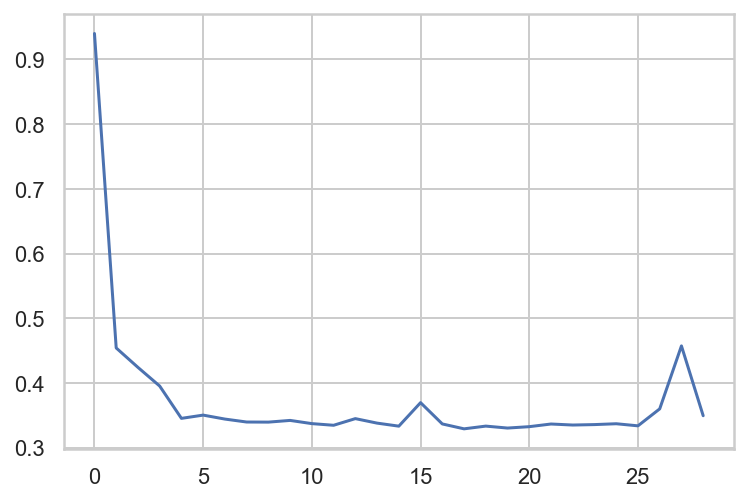

In [190]:
losses = model.loss_curve_
iterations = range(model.n_iter_)
sns.lineplot(iterations, losses)

In [191]:
model.loss_

0.34953430561319065

In [192]:
#Get the weight matrix by calling the attribute coefs_:
model.coefs_

[array([[-7.77504457e-02,  2.71528232e-01, -1.88211252e-02,
          2.05625885e-01, -2.05230544e-01, -6.09363055e-02,
         -2.62548827e-01,  2.60903502e-01,  1.95208524e-01,
          1.41429585e-01, -2.57736348e-01,  1.70804624e-01,
          5.82963752e-02, -1.78662916e-01, -3.27206454e-01,
         -9.93699372e-02, -1.89876575e-01,  1.67310767e-01,
         -1.78965082e-01, -2.58220383e-01,  1.73680459e-01,
          2.05513108e-01, -7.41533854e-02,  4.62615614e-02,
          1.12888076e-02,  1.19755541e-01, -1.31046482e-01,
         -1.05102047e-01,  3.05271979e-02, -5.82866051e-02,
          3.09320215e-01, -4.19180540e-01, -3.51235016e-01,
          3.99300684e-01,  4.00436163e-01,  1.31518204e-01,
          7.61016174e-02, -6.13232783e-02,  1.76701130e-01,
         -2.47270954e-02, -1.63624708e-01, -2.97868824e-02,
         -2.48351019e-01,  7.34520257e-02, -7.89358748e-03,
          1.28988270e-01,  9.98596710e-02,  2.41002235e-01,
          1.12804219e-01, -9.23963956e-0

In [193]:
#Get the bias vector by calling the attribute intercepts_:
model.intercepts_

[array([ 0.07883466, -0.06647973,  0.01509263, -0.0196587 ,  0.02093899,
         0.36232315,  0.50764571,  0.016874  , -0.20593008,  0.26481254,
        -0.25198198,  0.46655789,  0.46800588,  0.24458164,  0.35031993,
         0.02200904,  0.11914633, -0.05577401,  0.5198572 ,  0.0998194 ,
        -0.03541902, -0.03101822,  0.08503077,  0.04052756,  0.06502628,
        -0.10764867,  0.43614939,  0.42239075,  0.26042368,  0.4081106 ,
        -0.09011083,  0.35815298,  0.14932466,  0.13167871, -0.20264583,
         0.33302396, -0.1253626 ,  0.3889039 ,  0.48461089,  0.07447037,
        -0.04125083,  0.39611251, -0.20835423,  0.43896659,  0.52129058,
        -0.11388132, -0.13070716, -0.15555123,  0.00891591, -0.37192586,
         0.10916099, -0.10821818,  0.03062003,  0.03256793,  0.46600095,
        -0.20981959,  0.29758027, -0.11117422, -0.16684818,  0.31462598,
         0.07671945,  0.48779579,  0.52549406, -0.23587381,  0.31558445,
        -0.03289782, -0.23102477,  0.1826581 ,  0.2

In [194]:
# Estamos a usar all_selected_variables min max 0 1. Podemos:
#testar min max -1 1
#testar all_selected_variables robust scaller

In [195]:
model = MLPClassifier(random_state=42)
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ['Raw'])
show_results(df, model)

,Time,Train,Validation,Iterations
Raw,5.475+/-1.21,0.845+/-0.01,0.843+/-0.01,35.1+/-7.4


In [196]:
model_1 = MLPClassifier(hidden_layer_sizes=(1),random_state=42)
model_2 = MLPClassifier(hidden_layer_sizes=(3),random_state=42)
model_3 = MLPClassifier(hidden_layer_sizes=(9),random_state=42)
model_4 = MLPClassifier(hidden_layer_sizes=(3, 3),random_state=42)
model_5 = MLPClassifier(hidden_layer_sizes=(5, 5),random_state=42)
model_6 = MLPClassifier(hidden_layer_sizes=(3, 3, 3),random_state=42) #3 layers each one with 3 units

In [197]:
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ['M_1','M_2','M_3', 'M_4','M_5','M_6'])
show_results(df, model_1, model_2, model_3, model_4, model_5, model_6)

,Time,Train,Validation,Iterations
M_1,5.594+/-1.21,0.838+/-0.03,0.838+/-0.02,131.1+/-28.2
M_2,2.708+/-1.51,0.814+/-0.02,0.814+/-0.02,58.7+/-34.2
M_3,2.62+/-0.58,0.845+/-0.0,0.844+/-0.01,50.5+/-10.3
M_4,5.756+/-0.7,0.845+/-0.0,0.844+/-0.01,88.0+/-5.6
M_5,5.548+/-2.07,0.849+/-0.0,0.847+/-0.01,85.1+/-32.8
M_6,11.293+/-2.12,0.848+/-0.0,0.847+/-0.01,132.8+/-25.9


In [199]:
model_7 = MLPClassifier(hidden_layer_sizes=(4, 4),random_state=42)
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ['M_7'])
show_results(df, model_7)

,Time,Train,Validation,Iterations
M_7,5.844+/-1.34,0.848+/-0.0,0.848+/-0.01,90.3+/-19.6


1, 5, 6, 7 -> overfitting
O melhor é o 3
Agora M5 também é muito bom mas um pitz de overfitting-> testar M_3, M_5 e depois M_6

In [200]:
model_logistic = MLPClassifier(activation = 'logistic',random_state=42)
model_tanh = MLPClassifier(activation = 'tanh',random_state=42)
model_relu=MLPClassifier(activation = 'relu',random_state=42)

In [201]:
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ['logistic','tanh','relu'])
show_results(df, model_logistic, model_tanh,model_relu)

,Time,Train,Validation,Iterations
logistic,12.282+/-1.3,0.849+/-0.0,0.848+/-0.01,111.8+/-9.5
tanh,8.737+/-1.55,0.851+/-0.0,0.85+/-0.01,76.8+/-13.1
relu,5.314+/-1.15,0.845+/-0.01,0.843+/-0.01,35.1+/-7.4


Logistic is better: same score in less iterations
Logistic has less overfitting than tanh, eventhough not significant

Logistic provides a nomalized output between 0 and 1
Logistic provides a nomalized output between -1 and 1

In [202]:
model_lbfgs = MLPClassifier(solver = 'lbfgs',random_state=42) #low dim and sparse data
model_sgd = MLPClassifier(solver = 'sgd',random_state=42) #accuracy > processing time
model_adam = MLPClassifier(solver = 'adam',random_state=42) # big dataset but might fail to converge

In [203]:
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ['lbfgs','sgd','adam'])
show_results(df, model_lbfgs, model_sgd, model_adam)

,Time,Train,Validation,Iterations
lbfgs,28.379+/-2.02,0.849+/-0.0,0.848+/-0.01,200.0+/-0.0
sgd,17.726+/-1.82,0.843+/-0.0,0.841+/-0.01,124.9+/-12.1
adam,5.303+/-1.24,0.845+/-0.01,0.843+/-0.01,35.1+/-7.4


Adam is the best however it has a little overfitting, therefore we will test adam and sgd (less overfitt)

In [206]:
model_constant = MLPClassifier(solver = 'lbfgs', learning_rate = 'constant',random_state=42)
model_invscaling = MLPClassifier(solver = 'lbfgs', learning_rate = 'invscaling',random_state=42)
model_adaptive = MLPClassifier(solver = 'lbfgs', learning_rate = 'adaptive',random_state=42)

In [207]:
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ['constant','invscaling','adaptive'])
show_results(df, model_constant, model_invscaling, model_adaptive)

,Time,Train,Validation,Iterations
constant,28.571+/-1.77,0.849+/-0.0,0.848+/-0.01,200.0+/-0.0
invscaling,28.679+/-1.76,0.849+/-0.0,0.848+/-0.01,200.0+/-0.0
adaptive,28.509+/-1.75,0.849+/-0.0,0.848+/-0.01,200.0+/-0.0


In [263]:
model_adaptive.score(X_val, y_val)

0.8501488095238096

Constant is the better

In [208]:
model_a = MLPClassifier(solver = 'adam', learning_rate_init = 0.5,random_state=42) #qt maior mais rapido aprende o modelo
model_b = MLPClassifier(solver = 'adam', learning_rate_init = 0.1,random_state=42)
model_c = MLPClassifier(solver = 'adam', learning_rate_init = 0.01,random_state=42) #se for mt pequeno pode ficar preso numa solucao subotima e pode nunca convergir
model_d = MLPClassifier(solver = 'adam', learning_rate_init = 0.001,random_state=42)

In [209]:
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ['M_a','M_b','M_c', "M_d"])
show_results(df, model_a, model_b, model_c, model_d)

,Time,Train,Validation,Iterations
M_a,2.654+/-0.67,0.809+/-0.01,0.807+/-0.01,20.8+/-5.6
M_b,3.258+/-1.21,0.835+/-0.01,0.833+/-0.01,22.4+/-7.4
M_c,6.714+/-0.77,0.849+/-0.0,0.845+/-0.01,45.6+/-4.9
M_d,5.155+/-1.08,0.845+/-0.01,0.843+/-0.01,35.1+/-7.4


The best is 0.01(!!!!)

In [211]:
model_e = MLPClassifier(solver = 'adam', learning_rate_init = 0.005,random_state=42)
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ["M_e"])
show_results(df, model_e)

,Time,Train,Validation,Iterations
M_e,7.8+/-5.09,0.849+/-0.01,0.844+/-0.01,46.9+/-32.6


In [212]:
model_batch20 = MLPClassifier(solver = 'sgd', batch_size = 20,random_state=42)
model_batch50 = MLPClassifier(solver = 'sgd', batch_size = 50,random_state=42)
model_batch100 = MLPClassifier(solver = 'sgd', batch_size = 100,random_state=42)
model_batch200 = MLPClassifier(solver = 'sgd', batch_size = 200,random_state=42)
model_batch500 = MLPClassifier(solver = 'sgd', batch_size = 500,random_state=42)

In [213]:
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ['batch 20','batch 50','batch 100', 'batch 200', 'batch 500'])
show_results(df, model_batch20, model_batch50, model_batch100,  model_batch200, model_batch500)

,Time,Train,Validation,Iterations
batch 20,32.957+/-8.42,0.828+/-0.0,0.826+/-0.01,76.3+/-19.7
batch 50,15.98+/-5.02,0.823+/-0.02,0.823+/-0.02,56.6+/-18.3
batch 100,21.86+/-2.98,0.838+/-0.01,0.837+/-0.01,114.4+/-16.2
batch 200,17.802+/-1.9,0.843+/-0.0,0.841+/-0.01,124.9+/-12.1
batch 500,16.512+/-3.47,0.84+/-0.01,0.84+/-0.01,147.9+/-30.9


The best one is batch 50

In [214]:
model_maxiter_50 = MLPClassifier(max_iter = 50,random_state=42)
model_maxiter_100 = MLPClassifier(max_iter = 100,random_state=42)
model_maxiter_200 = MLPClassifier(max_iter = 200,random_state=42)
model_maxiter_300 = MLPClassifier(max_iter = 300,random_state=42)

In [215]:
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ['max iter 50','max iter 100','max iter 200', 'max iter 300'])
show_results(df, model_maxiter_50, model_maxiter_100, model_maxiter_200, model_maxiter_300)

,Time,Train,Validation,Iterations
max iter 50,5.288+/-1.17,0.844+/-0.01,0.843+/-0.01,35.0+/-7.2
max iter 100,5.208+/-1.05,0.845+/-0.01,0.843+/-0.01,35.1+/-7.4
max iter 200,5.243+/-1.11,0.845+/-0.01,0.843+/-0.01,35.1+/-7.4
max iter 300,5.392+/-1.03,0.845+/-0.01,0.843+/-0.01,35.1+/-7.4


In [216]:
model_maxiter_150 = MLPClassifier(max_iter = 150,random_state=42)
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ['max iter 150'])
show_results(df, model_maxiter_150)

,Time,Train,Validation,Iterations
max iter 150,5.266+/-1.18,0.845+/-0.01,0.843+/-0.01,35.1+/-7.4


In [217]:
model_all=MLPClassifier(hidden_layer_sizes=(4,4),activation = 'tanh',solver = 'lbfgs',batch_size = 50,random_state=42)
df = pd.DataFrame(columns = ['Time','Train','Validation', 'Iterations'], index = ['Raw'])
show_results(df, model_all)

,Time,Train,Validation,Iterations
Raw,2.528+/-0.17,0.847+/-0.0,0.848+/-0.01,200.0+/-0.0


In [218]:
parameter_space = {
    'hidden_layer_sizes': [(5,5), (4,4)],
    'activation': ['tanh'],
    'solver': ['lbfgs'],
    'batch_size': [(200),(500)], 
    'max_iter': [(50),(100)],
}

In [219]:
clf = GridSearchCV(model, parameter_space,n_jobs=-1)

In [220]:
clf.fit(X_train, y_train)

GridSearchCV(estimator=MLPClassifier(random_state=42), n_jobs=-1,
             param_grid={'activation': ['tanh'], 'batch_size': [200, 500],
                         'hidden_layer_sizes': [(5, 5), (4, 4)],
                         'max_iter': [50, 100], 'solver': ['lbfgs']})

In [221]:
clf.best_params_

{'activation': 'tanh',
 'batch_size': 200,
 'hidden_layer_sizes': (4, 4),
 'max_iter': 100,
 'solver': 'lbfgs'}

In [226]:
model_grid=model_all=MLPClassifier(activation= 'tanh', batch_size= 200, hidden_layer_sizes=(4, 4), max_iter= 100, solver= 'lbfgs',random_state=42)
df = pd.DataFrame(columns = ['Time','Train','Validation','Iterations'], index = ['Raw'])
show_results(df, model_grid)

,Time,Train,Validation,Iterations
Raw,1.393+/-0.09,0.845+/-0.0,0.845+/-0.01,100.0+/-0.0


In [227]:
# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

------------------------------------------------------------------------------------------------------------------------
Best parameters found:
 {'activation': 'tanh', 'batch_size': 200, 'hidden_layer_sizes': (4, 4), 'max_iter': 100, 'solver': 'lbfgs'}
------------------------------------------------------------------------------------------------------------------------
0.836 (+/-0.012) for {'activation': 'tanh', 'batch_size': 200, 'hidden_layer_sizes': (5, 5), 'max_iter': 50, 'solver': 'lbfgs'}
0.840 (+/-0.013) for {'activation': 'tanh', 'batch_size': 200, 'hidden_layer_sizes': (5, 5), 'max_iter': 100, 'solver': 'lbfgs'}
0.842 (+/-0.010) for {'activation': 'tanh', 'batch_size': 200, 'hidden_layer_sizes': (4, 4), 'max_iter': 50, 'solver': 'lbfgs'}
0.843 (+/-0.007) for {'activation': 'tanh', 'batch_size': 200, 'hidden_layer_sizes': (4, 4), 'max_iter': 100, 'solver': 'lbfgs'}
0.836 (+/-0.012) for {'activation': 'tanh', 'batch_size': 500, 'hidden_layer_sizes': (5, 5), 'max_iter': 50, 'so

Com base na segunda escolha de parâmetros depois de definido o random_state

In [229]:
parameter_space1 = {
    'hidden_layer_sizes': [(5,5),(4,4)],
    'activation': ['tanh'],
    'solver': ['lbfgs'],
    'batch_size': [(200),(500)], 
    'max_iter': [(50),(100)],
}
clf1 = GridSearchCV(model, parameter_space1,n_jobs=-1)
clf1.fit(X_train, y_train)

GridSearchCV(estimator=MLPClassifier(random_state=42), n_jobs=-1,
             param_grid={'activation': ['tanh'], 'batch_size': [200, 500],
                         'hidden_layer_sizes': [(5, 5), (4, 4)],
                         'max_iter': [50, 100], 'solver': ['lbfgs']})

In [230]:
clf1.best_params_

{'activation': 'tanh',
 'batch_size': 200,
 'hidden_layer_sizes': (4, 4),
 'max_iter': 100,
 'solver': 'lbfgs'}

In [237]:
modelNN_best=model_all=MLPClassifier(activation= 'tanh',batch_size= 200, hidden_layer_sizes= (4, 4),max_iter= 100,solver= 'lbfgs')
df= pd.DataFrame(columns = ['Time','Train','Val', 'Iterations'], index = ['Raw'])
show_results(df, modelNN_best)

,Time,Train,Val,Iterations
Raw,1.133+/-0.13,0.837+/-0.01,0.835+/-0.01,100.0+/-0.0


In [238]:
# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf1.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf1.cv_results_['mean_test_score']
stds = clf1.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf1.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

------------------------------------------------------------------------------------------------------------------------
Best parameters found:
 {'activation': 'tanh', 'batch_size': 200, 'hidden_layer_sizes': (4, 4), 'max_iter': 100, 'solver': 'lbfgs'}
------------------------------------------------------------------------------------------------------------------------
0.836 (+/-0.012) for {'activation': 'tanh', 'batch_size': 200, 'hidden_layer_sizes': (5, 5), 'max_iter': 50, 'solver': 'lbfgs'}
0.840 (+/-0.013) for {'activation': 'tanh', 'batch_size': 200, 'hidden_layer_sizes': (5, 5), 'max_iter': 100, 'solver': 'lbfgs'}
0.842 (+/-0.010) for {'activation': 'tanh', 'batch_size': 200, 'hidden_layer_sizes': (4, 4), 'max_iter': 50, 'solver': 'lbfgs'}
0.843 (+/-0.007) for {'activation': 'tanh', 'batch_size': 200, 'hidden_layer_sizes': (4, 4), 'max_iter': 100, 'solver': 'lbfgs'}
0.836 (+/-0.012) for {'activation': 'tanh', 'batch_size': 500, 'hidden_layer_sizes': (5, 5), 'max_iter': 50, 'so

In [239]:
# Model with best accuracy
labels_train = modelNN_best.predict(X_train)
labels_val = modelNN_best.predict(X_val)
metrics(y_train, labels_train, y_val, labels_val)

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.90      0.89     11962
           1       0.65      0.58      0.61      3718

    accuracy                           0.83     15680
   macro avg       0.76      0.74      0.75     15680
weighted avg       0.82      0.83      0.82     15680

[[10793  1169]
 [ 1556  2162]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.88      0.90      0.89      5127
           1       0.66   

## KNN

The number K is typically chosen as the square root of the total number of points in the training data set. Thus, in this case, N is 15680, so K = 125.

Text(0, 0.5, 'Validation Accuracy')

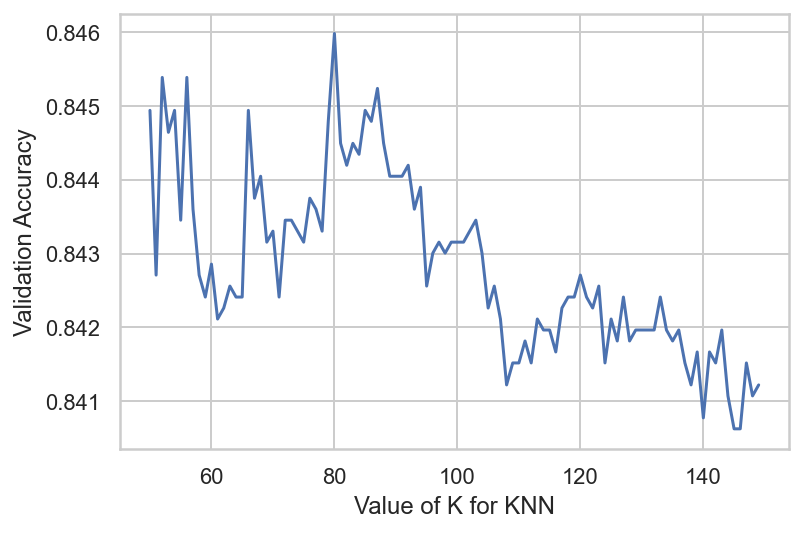

In [281]:
# try K=50 through K=150 and record testing accuracy
k_range = range(50, 150)

scores = []

# We use a loop through the range
# We append the scores in the list
for k in k_range:
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, y_train)
    y_pred = knn.predict(X_val)
    scores.append(accuracy_score(y_val, y_pred))

# plot the relationship between K and testing accuracy
plt.plot(k_range, scores)
plt.xlabel('Value of K for KNN')
plt.ylabel('Validation Accuracy')

In [155]:
modelKNN1 = KNeighborsClassifier().fit(X = X_train, y = y_train)

In [156]:
print("train score:", modelKNN1.score(X_train, y_train))
print("validation score:",modelKNN1.score(X_val, y_val))

train score: 0.8764668367346938
validation score: 0.8383928571428572


In [157]:
modelKNN2 = KNeighborsClassifier(n_neighbors=80).fit(X = X_train, y = y_train)

In [158]:
print("train score:", modelKNN2.score(X_train, y_train))
print("validation score:",modelKNN2.score(X_val, y_val))

train score: 0.8480229591836734
validation score: 0.8459821428571429


In [159]:
#from the available algorithms (excluding the default), this was the best one
modelKNN3 = KNeighborsClassifier(n_neighbors=80, algorithm='ball_tree').fit(X = X_train, y = y_train)

In [160]:
print("train score:", modelKNN3.score(X_train, y_train))
print("validation score:",modelKNN3.score(X_val, y_val))

train score: 0.8477678571428572
validation score: 0.8450892857142858


In [161]:
modelKNN4 = KNeighborsClassifier(n_neighbors=80, p=1).fit(X = X_train, y = y_train)

In [162]:
print("train score:", modelKNN4.score(X_train, y_train))
print("validation score:",modelKNN4.score(X_val, y_val))

train score: 0.8498724489795918
validation score: 0.8453869047619048


In [163]:
modelKNN5 = KNeighborsClassifier(n_neighbors=80, weights='distance').fit(X = X_train, y = y_train)

In [164]:
print("train score:", modelKNN5.score(X_train, y_train))
print("validation score:",modelKNN5.score(X_val, y_val))

train score: 0.934375
validation score: 0.8422619047619048


In [165]:
modelKNN6 = KNeighborsClassifier(n_neighbors=80, algorithm='ball_tree', p=1).fit(X = X_train, y = y_train)

In [166]:
print("train score:", modelKNN6.score(X_train, y_train))
print("validation score:",modelKNN6.score(X_val, y_val))

train score: 0.8495535714285715
validation score: 0.8458333333333333


In [167]:
df = pd.DataFrame(columns = ['Time','Train','Validation'], index = ['modelKNN1', 'modelKNN2', 'modelKNN3', 'modelKNN4', 'modelKNN5', 'modelKNN6'])
show_results_1(df, modelKNN1, modelKNN2, modelKNN3, modelKNN4, modelKNN5, modelKNN6)

,Time,Train,Validation
modelKNN1,0.704+/-0.05,0.877+/-0.0,0.836+/-0.01
modelKNN2,0.709+/-0.08,0.848+/-0.0,0.845+/-0.01
modelKNN3,0.618+/-0.01,0.848+/-0.0,0.845+/-0.01
modelKNN4,0.666+/-0.03,0.849+/-0.0,0.845+/-0.01
modelKNN5,0.683+/-0.04,0.931+/-0.0,0.837+/-0.01
modelKNN6,0.645+/-0.05,0.849+/-0.0,0.845+/-0.01


In [169]:
# Model with best accuracy
labels_train = modelKNN2.predict(X_train)
labels_val = modelKNN2.predict(X_val)
metrics(y_train, labels_train, y_val, labels_val)

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.94      0.90     11962
           1       0.74      0.55      0.63      3718

    accuracy                           0.85     15680
   macro avg       0.81      0.75      0.77     15680
weighted avg       0.84      0.85      0.84     15680

[[11241   721]
 [ 1661  2057]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.94      0.90      5127
           1       0.74   

## Passive Aggressive Classifier (Extra)

In [289]:
# Creating and fitting model
pac_basic = PassiveAggressiveClassifier(random_state=42)
pac_basic.fit(X_train, y_train)

pac_1 = PassiveAggressiveClassifier(C=0.001, fit_intercept=True, tol=1e-2, loss='squared_hinge',random_state=42)
pac_1.fit(X_train, y_train)

pac_2 = PassiveAggressiveClassifier(C=0.001, tol=1e-2, loss='squared_hinge',random_state=42)
pac_2.fit(X_train, y_train)

pac_3 = PassiveAggressiveClassifier(C=0.001, tol=1e-2, random_state=42)
pac_3.fit(X_train, y_train)

PassiveAggressiveClassifier(C=0.001, random_state=42, tol=0.01)

In [290]:
# Making prediction on the validation set 
val_pred_basic = pac_basic.predict(X_val)
val_pred_1 = pac_1.predict(X_val)
val_pred_2 = pac_2.predict(X_val)
val_pred_3 = pac_3.predict(X_val)

In [291]:
df = pd.DataFrame(columns = ['Time','Train','Validation','Iterations'], index = ['PAC_Basic','PAC_1','PAC_2','PAC_3'])
show_results(df, pac_basic, pac_1, pac_2, pac_3)

,Time,Train,Validation,Iterations
PAC_Basic,0.035+/-0.01,0.783+/-0.05,0.783+/-0.05,12.6+/-7.6
PAC_1,0.026+/-0.01,0.837+/-0.01,0.835+/-0.01,7.9+/-1.1
PAC_2,0.026+/-0.01,0.837+/-0.01,0.835+/-0.01,7.9+/-1.1
PAC_3,0.03+/-0.01,0.841+/-0.01,0.841+/-0.01,8.2+/-1.5


In [292]:
labels_train = pac_3.predict(X_train)
accuracy_score(y_train, labels_train)

labels_val = pac_3.predict(X_val)
accuracy_score(y_val, labels_val)

metrics(y_train, labels_train, y_val, labels_val)

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.86      0.95      0.90     11962
           1       0.75      0.50      0.60      3718

    accuracy                           0.84     15680
   macro avg       0.81      0.73      0.75     15680
weighted avg       0.83      0.84      0.83     15680

[[11348   614]
 [ 1849  1869]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.86      0.95      0.90      5127
           1       0.74   

## Linear Discriminant Analysis

In [275]:
modelLDA = LinearDiscriminantAnalysis()
modelLDA.fit(X = X_train, y = y_train)
labels_train = modelLDA.predict(X_train)
labels_val = modelLDA.predict(X_val)
modelLDA.predict_proba(X_val)

array([[0.79832473, 0.20167527],
       [0.99314103, 0.00685897],
       [0.46630284, 0.53369716],
       ...,
       [0.72766805, 0.27233195],
       [0.22220087, 0.77779913],
       [0.9468057 , 0.0531943 ]])

In [276]:
print("train score:", modelLDA.score(X_train, y_train))
print("validation score:",modelLDA.score(X_val, y_val))

train score: 0.8341198979591836
validation score: 0.8360119047619048


In [277]:
from sklearn.model_selection import GridSearchCV
# define grid
grid = dict()
grid['solver'] = ['svd', 'lsqr', 'eigen']
# define search
search = GridSearchCV(modelLDA, grid, scoring='accuracy', n_jobs=-1)
# perform the search
results = search.fit(X_train, y_train)
# summarize
print('Mean Accuracy: %.3f' % results.best_score_)
print('Config: %s' % results.best_params_)

Mean Accuracy: 0.835
Config: {'solver': 'svd'}


In [278]:
from numpy import arange
grid = dict()
grid['shrinkage'] = arange(0, 1, 0.01)
grid['solver']=['svd', 'lsqr', 'eigen'] #svd cannot be tested with shrinkage
# define search
search = GridSearchCV(modelLDA, grid, scoring='accuracy', n_jobs=-1)
# perform the search
results = search.fit(X_train, y_train)
# summarize
print('Mean Accuracy: %.3f' % results.best_score_)
print('Config: %s' % results.best_params_)

Mean Accuracy: 0.835
Config: {'shrinkage': 0.0, 'solver': 'lsqr'}


In [279]:
modelLDA_final = LinearDiscriminantAnalysis(solver='lsqr')
modelLDA_final.fit(X = X_train, y = y_train)
labels_train = modelLDA_final.predict(X_train)
labels_val = modelLDA_final.predict(X_val)
print("train score:", modelLDA_final.score(X_train, y_train))
print("validation score:",modelLDA_final.score(X_val, y_val))

train score: 0.8341198979591836
validation score: 0.8361607142857143


In [280]:
metrics(y_train, labels_train, y_val, labels_val)

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.86      0.93      0.90     11962
           1       0.70      0.52      0.60      3718

    accuracy                           0.83     15680
   macro avg       0.78      0.73      0.75     15680
weighted avg       0.82      0.83      0.83     15680

[[11130   832]
 [ 1769  1949]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.93      0.90      5127
           1       0.70   

## Quadratic Discriminant Analysis

In [281]:
modelQDA = QuadraticDiscriminantAnalysis()
modelQDA.fit(X = X_train, y = y_train)
labels_train = modelQDA.predict(X_train)
labels_val = modelQDA.predict(X_val)
modelQDA.predict_proba(X_val)

array([[9.97229235e-01, 2.77076475e-03],
       [9.99982050e-01, 1.79501097e-05],
       [9.11356349e-01, 8.86436507e-02],
       ...,
       [9.86442319e-01, 1.35576814e-02],
       [8.43005302e-01, 1.56994698e-01],
       [9.99789508e-01, 2.10492142e-04]])

In [282]:
print("train score:", modelQDA.score(X_train, y_train))
print("validation score:",modelQDA.score(X_val, y_val))

train score: 0.7871173469387756
validation score: 0.7950892857142857


In [283]:
# define grid
grid = dict()
grid['reg_param'] = arange(0, 1, 0.01)
# define search
search = GridSearchCV(modelQDA, grid, scoring='accuracy', n_jobs=-1)
# perform the search
results = search.fit(X_train, y_train)
# summarize
print('Mean Accuracy: %.3f' % results.best_score_)
print('Config: %s' % results.best_params_)

Mean Accuracy: 0.799
Config: {'reg_param': 0.4}


In [284]:
modelQDA_final = QuadraticDiscriminantAnalysis(reg_param=0.4)
modelQDA_final.fit(X = X_train, y = y_train)
labels_train = modelQDA_final.predict(X_train)
labels_val = modelQDA_final.predict(X_val)
print("train score:", modelQDA_final.score(X_train, y_train))
print("validation score:",modelQDA_final.score(X_val, y_val))

train score: 0.7992984693877551
validation score: 0.8052083333333333


In [285]:
metrics(y_train, labels_train, y_val, labels_val)

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.81      0.96      0.88     11962
           1       0.68      0.29      0.41      3718

    accuracy                           0.80     15680
   macro avg       0.75      0.62      0.64     15680
weighted avg       0.78      0.80      0.77     15680

[[11450   512]
 [ 2635  1083]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.82      0.96      0.88      5127
           1       0.70   

## Support Vector Machine

In [ ]:
# # try C=250 through K=1250 and record testing accuracy
# C_range = range(250, 1250)

# scores = []

# #We use a loop through the range
# # We append the scores in the list
# for c in C_range:
#     svm = SVC(C=c)
#     svm.fit(X_train, y_train)
#     y_pred = svm.predict(X_val)
#     scores.append(accuracy_score(y_val, y_pred))

# # plot the relationship between C and testing accuracy
# plt.plot(C_range, scores)
# plt.xlabel('Value of C for the SVM')
# plt.ylabel('Validation Accuracy')

In [179]:
modelSVM_basic = SVC().fit(X_train, y_train)
modelSVM_1 = SVC(kernel='linear').fit(X_train, y_train)
modelSVM_2 = SVC(C=1000).fit(X_train, y_train)
modelSVM_3 = SVC(kernel = 'poly').fit(X_train, y_train)
modelSVM_4 = SVC(C=1000, kernel = 'poly').fit(X_train, y_train)
modelSVM_5 = SVC(C=1000, kernel = 'linear').fit(X_train, y_train)
modelSVM_6 = SVC(C=1000, shrinking=False).fit(X_train, y_train)
modelSVM_7 = SVC(C=1000, tol=1e-2).fit(X_train, y_train)

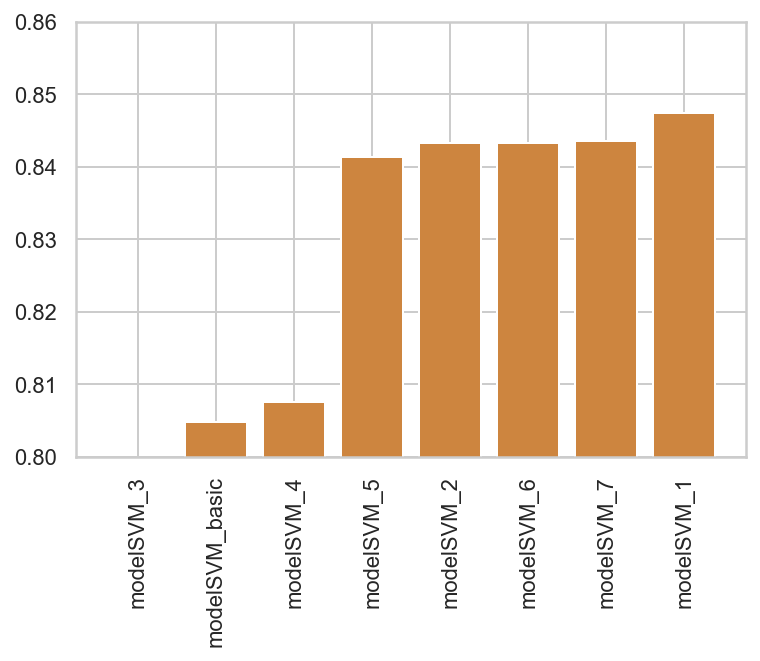

In [180]:
accuracies = [modelSVM_basic.score(X_val, y_val), modelSVM_1.score(X_val, y_val),
              modelSVM_2.score(X_val, y_val), modelSVM_3.score(X_val, y_val),
              modelSVM_4.score(X_val, y_val), modelSVM_5.score(X_val, y_val),
              modelSVM_6.score(X_val, y_val), modelSVM_7.score(X_val, y_val)]

models = ['modelSVM_basic', 'modelSVM_1', 'modelSVM_2', 'modelSVM_3', 
          'modelSVM_4', 'modelSVM_5', 'modelSVM_6', 'modelSVM_7']

data_tuples = list(zip(models,accuracies))

data = pd.DataFrame(data_tuples)

data = data.sort_values(1)

plt.bar(data[0], data[1], color='peru')
plt.xticks(rotation=90)
plt.ylim(0.80,0.86)

plt.show()

In [185]:
# highest accuracy from the SVMs
modelSVM_1.score(X_val, y_val)

0.8474702380952381

In [183]:
pred_train_svm = modelSVM_1.predict(X_train)
pred_val_svm = modelSVM_1.predict(X_val)
metrics(y_train, pred_train_svm, y_val, pred_val_svm)

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.86      0.95      0.90     11962
           1       0.75      0.52      0.61      3718

    accuracy                           0.84     15680
   macro avg       0.80      0.73      0.76     15680
weighted avg       0.83      0.84      0.83     15680

[[11307   655]
 [ 1799  1919]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.95      0.90      5127
           1       0.75   

### AdaBoost Classifier

The best train value is  91
The best val value is  88


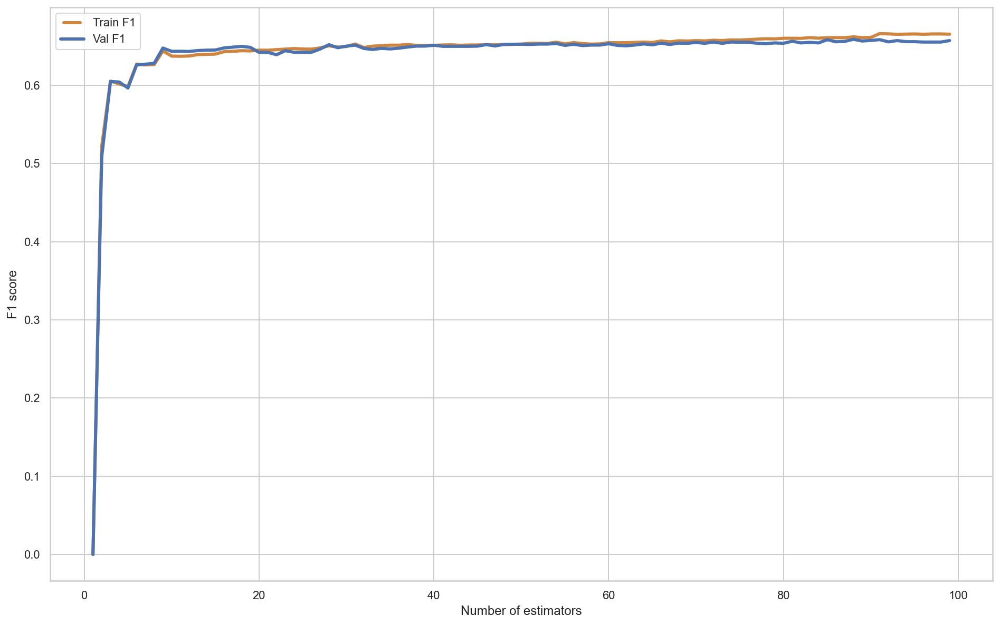

In [286]:
def calculate_f1(interval, x_train, x_val, y_train, y_val, parameter):
    train_results = []
    val_results = []
    for value in interval:
        if parameter == 'Number of estimators':
            dt = AdaBoostClassifier(n_estimators = value, random_state = 5)
        elif parameter == 'Learning Rate':
            dt = AdaBoostClassifier(learning_rate = value, random_state = 5)
        dt.fit(x_train, y_train)
        train_results.append(f1_score(y_train,dt.predict(x_train)))
        val_results.append(f1_score(y_val,dt.predict(x_val)))
    value_train = train_results.index(max(train_results))
    value_val = val_results.index(max(val_results))
    print('The best train value is ',interval[value_train])
    print('The best val value is ',interval[value_val])

    fig = plt.figure(figsize = (16,10))
    line1, = plt.plot(interval, train_results, '#515C60', label="Train F1", linewidth=3,color='peru')
    line2, = plt.plot(interval, val_results, '#C7DC1F', label="Val F1", linewidth=3,color='b')
    plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
    plt.ylabel("F1 score")
    plt.xlabel(str(parameter))
    plt.show()
    
num_estimators = list(range(1,100))
calculate_f1(num_estimators, X_train, X_val, y_train, y_val,'Number of estimators')

The best train value is  1.7100000000000002
The best val value is  1.7100000000000002


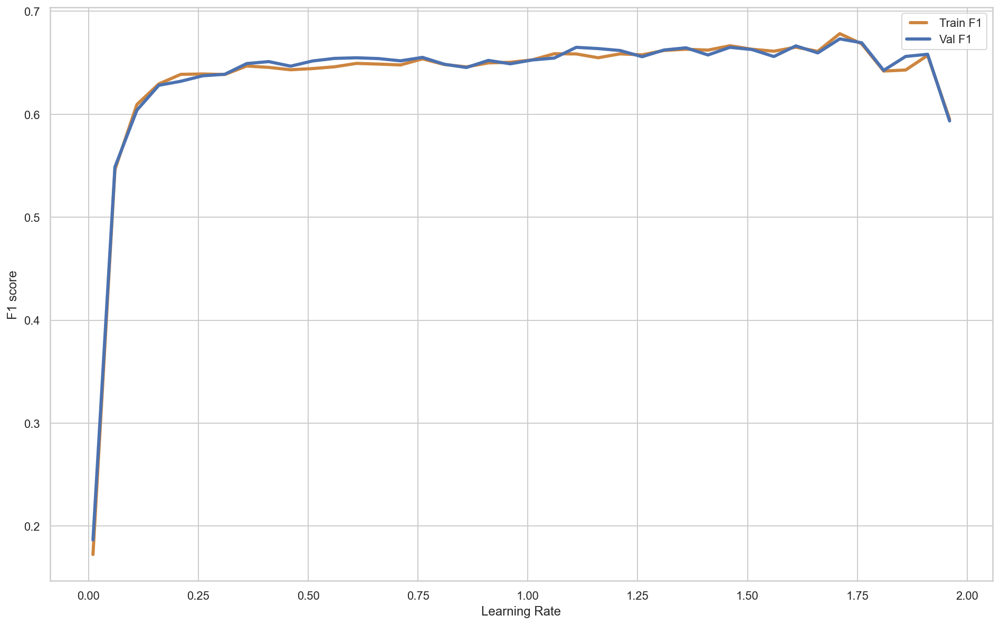

In [287]:
learning_rate = list(np.arange(0.01, 2, 0.05))
calculate_f1(learning_rate, X_train, X_val, y_train, y_val,'Learning Rate')


In [293]:
# AdaBoost = AdaBoostClassifier()

# AdaBoost_parameters = {'base_estimator' : [None, modelNB, modelQDA_final, pac_1, modelLDA_final],
#                         'n_estimators' : list(range(1,100)),
#                         'learning_rate' : np.arange(0.5, 1.5, 0.05),
#                         'algorithm' : ['SAMME', 'SAMME.R']}

# AdaBoost_grid = GridSearchCV(estimator=AdaBoost, param_grid=AdaBoost_parameters, 
#                               scoring='accuracy', verbose=1, n_jobs=-1)

# AdaBoost_grid.fit(X_train , y_train)
# AdaBoost_grid.best_params_

Fitting 5 folds for each of 19800 candidates, totalling 99000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done 308 tasks      | elapsed:   26.9s
[Parallel(n_jobs=-1)]: Done 558 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 908 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 1446 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 1996 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 2738 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 3488 tasks      | elapsed:  8.4min
[Parallel(n_jobs=-1)]: Done 4338 tasks      | elapsed: 10.4min
[Parallel(n_jobs=-1)]: Done 5288 tasks      | elapsed: 12.6min
[Parallel(n_jobs=-1)]: Done 6338 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Done 7604 tasks      | elapsed: 17.9min
[Parallel(n_jobs=-1)]: Done 8854 tasks      | elapsed: 20.8min
[Parallel(n_jobs=-1)]: Done 10316 tasks      | elapsed: 25.1min
[Parallel(n_jobs=-1)]: Done 11766 tasks      

{'algorithm': 'SAMME.R',
 'base_estimator': None,
 'learning_rate': 1.2500000000000007,
 'n_estimators': 94}

In [245]:
modelAdaBoost = AdaBoostClassifier(base_estimator=None, n_estimators=94, learning_rate=1.2500000000000007, algorithm='SAMME.R', random_state=42)
modelAdaBoost.fit(X_train,y_train)

AdaBoostClassifier(learning_rate=1.2500000000000007, n_estimators=94,
                   random_state=42)

In [246]:
labels_train = modelAdaBoost.predict(X_train)
accuracy_score(y_train, labels_train)

0.8602678571428571

In [247]:
labels_val = modelAdaBoost.predict(X_val)
accuracy_score(y_val, labels_val)

0.8599702380952381

In [297]:
df= pd.DataFrame(columns = ['Time','Train','Validation'], index = ['Raw'])
show_results_1(df, modelAdaBoost)

,Time,Train,Validation
Raw,1.043+/-0.07,0.86+/-0.0,0.86+/-0.01


In [298]:
metrics(y_train, labels_train, y_val, labels_val)

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.88      0.95      0.91     11962
           1       0.77      0.58      0.66      3718

    accuracy                           0.86     15680
   macro avg       0.83      0.77      0.79     15680
weighted avg       0.85      0.86      0.85     15680

[[11317   645]
 [ 1546  2172]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.88      0.95      0.91      5127
           1       0.77   

In [243]:
# Código para fazer as previsões no test!

# robust = RobustScaler()
# robust_scaled= robust.fit_transform(test.values)
# test= pd.DataFrame(robust_scaled, columns=test.columns, index=test.index)

In [252]:
# Citizen=df_test['CITIZEN_ID']
# labels_test= modelAdaBoost.predict(test)
# prediction=pd.concat([Citizen, pd.DataFrame(labels_test)],axis=1)
# prediction['Income']=prediction[0]
# prediction.drop(columns=0,inplace=True)

In [253]:
# prediction.to_csv(r'C:\Users\matip\Documents\Mestrado\Machine Learning\Project\Proj\Predictions\Pred8.csv',index=False, header=True,sep=',')

### Gradient Boosting Classifier

In [155]:
def calculate_f1_2(interval, x_train, x_val, y_train, y_val, parameter):
    train_results = []
    val_results = []
    for value in interval:
        if parameter == 'Number of estimators':
            dt = GradientBoostingClassifier(n_estimators = value, random_state = 5)
        elif parameter == 'Learning Rate':
            dt = GradientBoostingClassifier(learning_rate = value, random_state = 5)
        dt.fit(x_train, y_train)
        train_results.append(f1_score(y_train,dt.predict(x_train)))
        val_results.append(f1_score(y_val,dt.predict(x_val)))
    value_train = train_results.index(max(train_results))
    value_val = val_results.index(max(val_results))
    print('The best train value is ',interval[value_train])
    print('The best val value is ',interval[value_val])

    fig = plt.figure(figsize = (16,10))
    line1, = plt.plot(interval, train_results, '#515C60', label="Train F1", linewidth=3,color='peru')
    line2, = plt.plot(interval, val_results, '#C7DC1F', label="Val F1", linewidth=3,color='b')
    plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
    plt.ylabel("F1 score")
    plt.xlabel(str(parameter))
    plt.show()

The best train value is  1.35
The best val value is  0.45


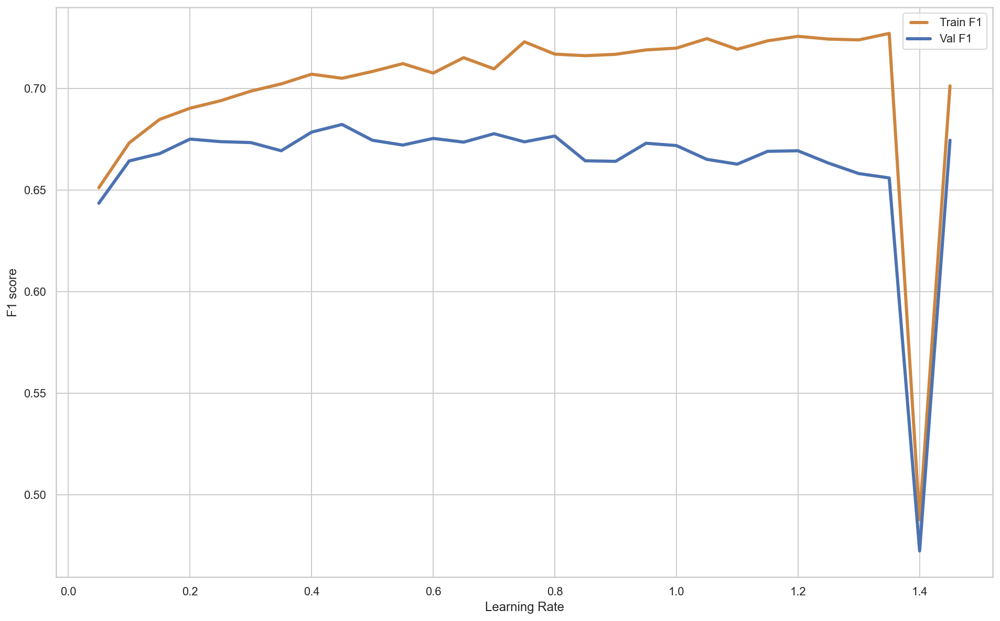

In [156]:
learning_rate = list(np.arange(0.05, 1.5, 0.05))
calculate_f1_2(learning_rate, X_train, X_val, y_train, y_val,'Learning Rate')

The best train value is  0.55
The best val value is  0.45


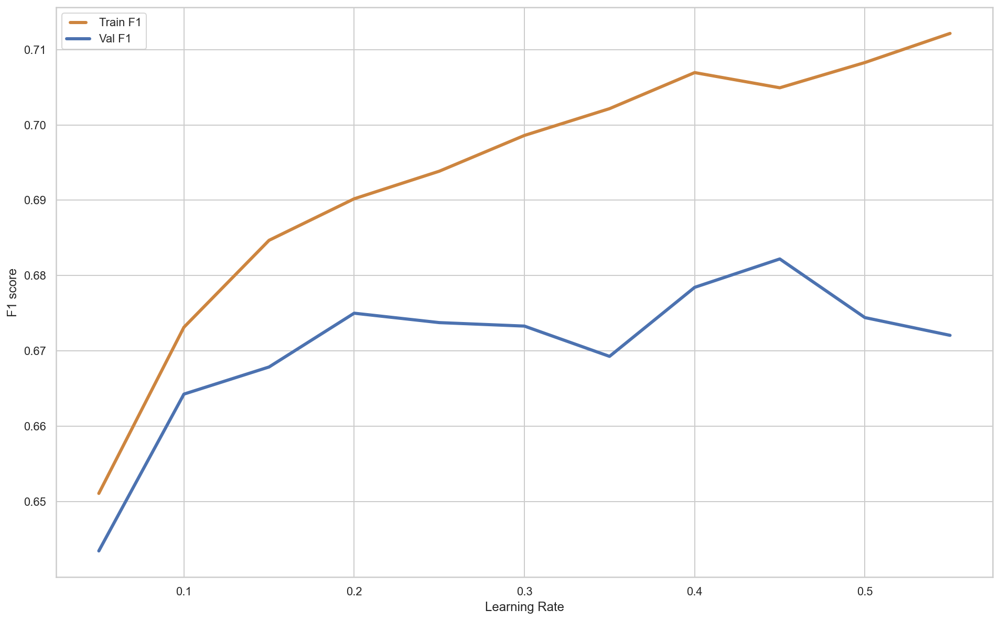

In [157]:
learning_rate = list(np.arange(0.05, 0.6, 0.05))
calculate_f1_2(learning_rate, X_train, X_val, y_train, y_val,'Learning Rate')

The best train value is  191
The best val value is  191


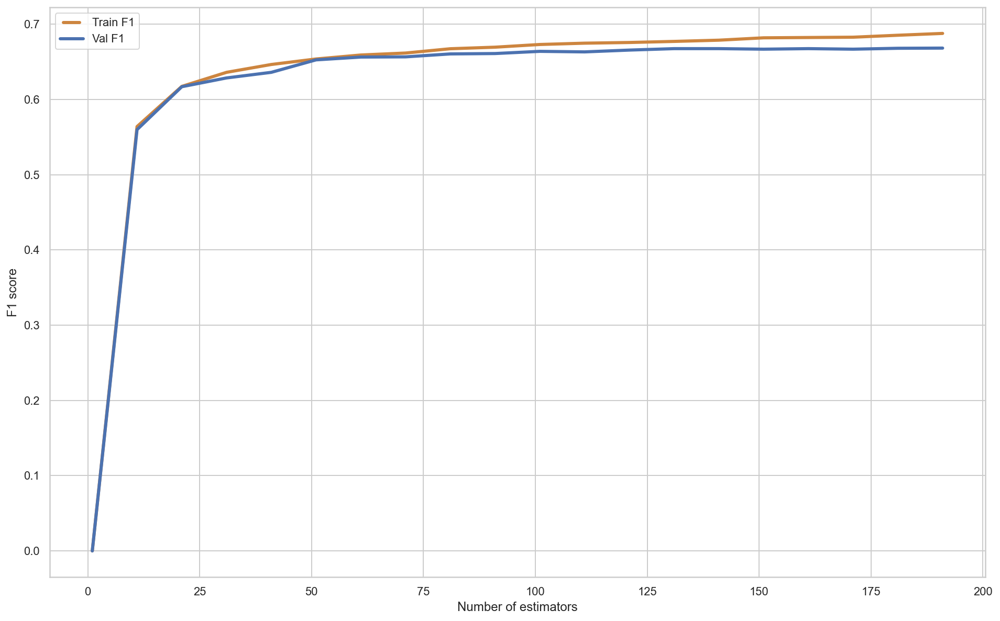

In [159]:
num_estimators = list(np.arange(1, 200, 10)) 
calculate_f1_2(num_estimators, X_train, X_val, y_train, y_val,'Number of estimators')

The best train value is  290
The best val value is  260


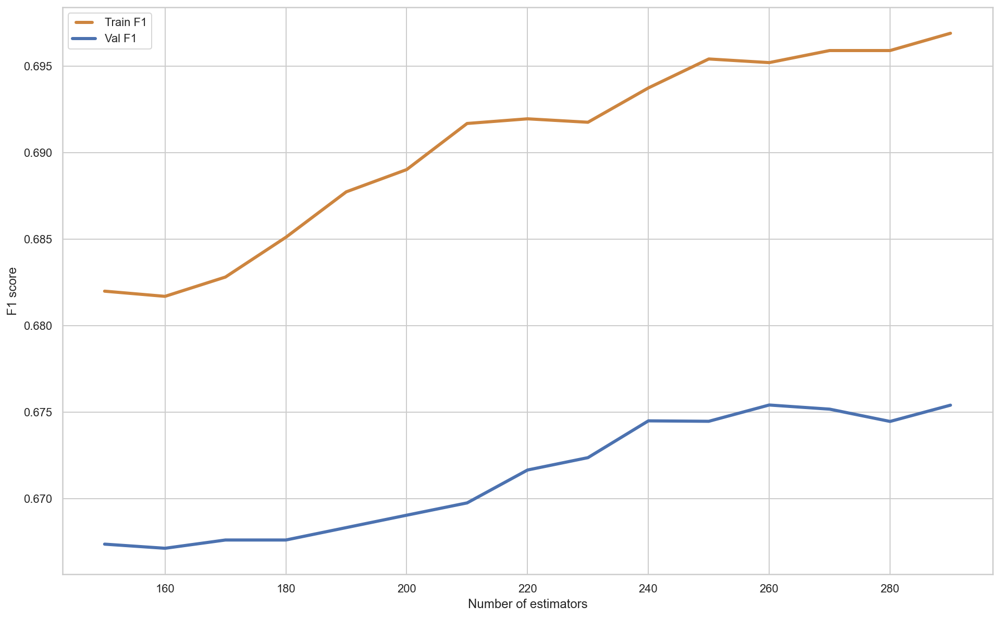

In [160]:
num_estimators = list(np.arange(150, 300, 10)) 
calculate_f1_2(num_estimators, X_train, X_val, y_train, y_val,'Number of estimators')

The best train value is  450
The best val value is  350


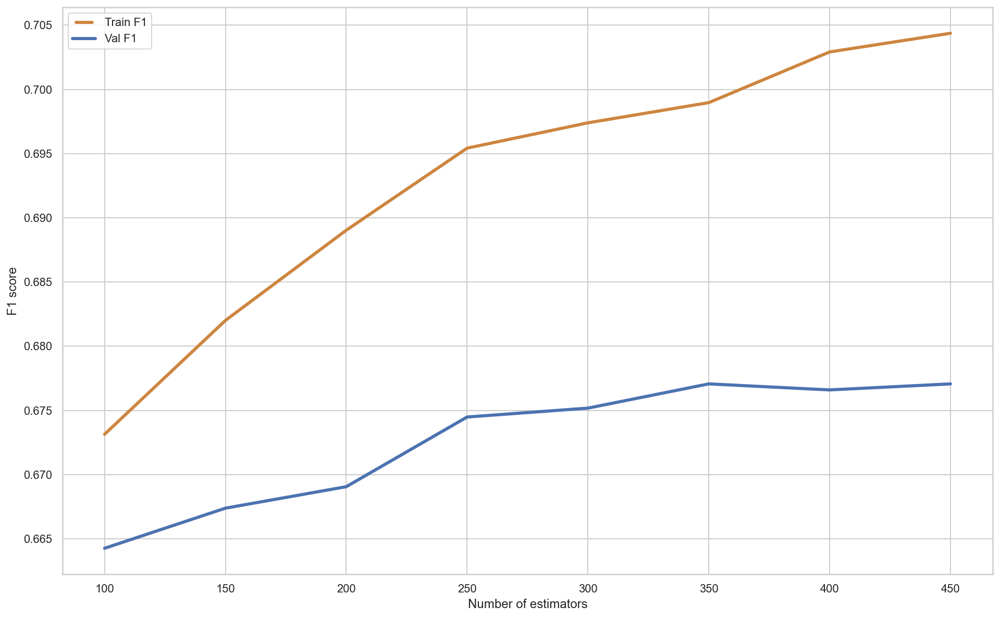

In [163]:
num_estimators = list(np.arange(100, 500, 50)) 
calculate_f1_2(num_estimators, X_train, X_val, y_train, y_val,'Number of estimators')

The best train value is  540
The best val value is  480


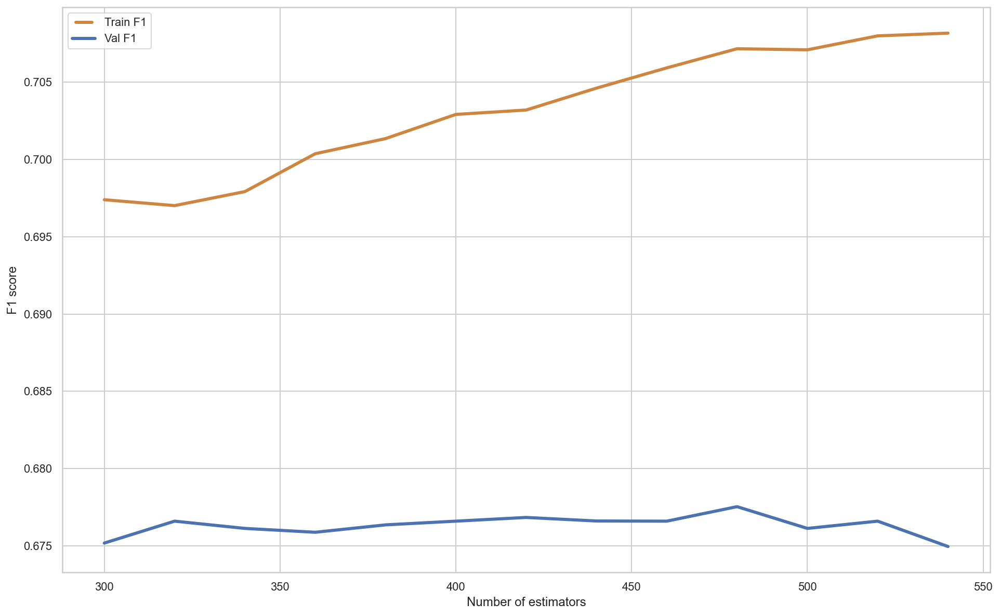

In [165]:
num_estimators = list(np.arange(300, 550, 20)) 
calculate_f1_2(num_estimators, X_train, X_val, y_train, y_val,'Number of estimators')

In [161]:
modelGBauto = GradientBoostingClassifier(max_features='auto', random_state=42)
modelGBlog = GradientBoostingClassifier(max_features='log2',random_state=42)
modelGBsqrt = GradientBoostingClassifier(max_features='sqrt',random_state=42)
modelGBnone = GradientBoostingClassifier(max_features=None,random_state=42)

In [162]:
df= pd.DataFrame(columns = ['Time','Train','Validation'], index = ['Auto','Log2','Sqrt','None/Raw'])
show_results_1(df, modelGBauto, modelGBlog, modelGBsqrt, modelGBnone)

,Time,Train,Validation
Auto,1.241+/-0.05,0.864+/-0.0,0.861+/-0.01
Log2,0.681+/-0.01,0.862+/-0.0,0.859+/-0.01
Sqrt,0.658+/-0.01,0.862+/-0.0,0.859+/-0.01
None/Raw,1.208+/-0.02,0.864+/-0.0,0.861+/-0.01


In [166]:
modelGBdev = GradientBoostingClassifier(loss='deviance', random_state=42)
modelGBexp = GradientBoostingClassifier(loss='exponential',random_state=42)

In [167]:
df= pd.DataFrame(columns = ['Time','Train','Validation'], index = ['deviance','exponential'])
show_results_1(df, modelGBdev, modelGBexp)

,Time,Train,Validation
deviance,1.324+/-0.1,0.864+/-0.0,0.861+/-0.01
exponential,1.289+/-0.07,0.863+/-0.0,0.861+/-0.01


In [168]:
modelGB2 = GradientBoostingClassifier(max_depth=2, random_state=5)
modelGB3 = GradientBoostingClassifier(max_depth=3,random_state=5)
modelGB10 = GradientBoostingClassifier(max_depth=10,random_state=5)
modelGB30 = GradientBoostingClassifier(max_depth=30,random_state=5)
modelGB50 = GradientBoostingClassifier(max_depth=50,random_state=5)

In [169]:
df= pd.DataFrame(columns = ['Time','Train','Validation'], index = ['model2','model3','model10','model30','model50'])
show_results_1(df, modelGB2, modelGB3,modelGB10,modelGB30,modelGB50)

,Time,Train,Validation
model2,1.195+/-0.05,0.859+/-0.0,0.857+/-0.01
model3,1.698+/-0.19,0.864+/-0.0,0.861+/-0.01
model10,6.714+/-0.18,0.916+/-0.0,0.854+/-0.01
model30,32.16+/-0.56,0.931+/-0.0,0.832+/-0.01
model50,34.734+/-2.14,0.931+/-0.0,0.832+/-0.01


In [171]:
# GB_clf = GradientBoostingClassifier()

# GB_parameters = {'loss' : [ 'deviance','exponential'],
#                    'learning_rate' : np.arange(0.3, 0.6, 0.05),
#                    'n_estimators' : np.arange(400, 500, 10),
#                    'max_depth' : np.arange(2, 10, 1),
#                    'max_features' : ['auto', None]
#                 }

# GB_grid = GridSearchCV(estimator=GB_clf, param_grid=GB_parameters, scoring='accuracy', verbose=1, n_jobs=-1)
# GB_grid.fit(X_train , y_train)
# GB_grid.best_params_

Fitting 5 folds for each of 1920 candidates, totalling 9600 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed: 10.7min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed: 32.7min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed: 80.2min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed: 101.1min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed: 134.9min
[Parallel(n_jobs=-1)]: Done 2442 tasks      | elapsed: 172.6min
[Parallel(n_jobs=-1)]: Done 3192 tasks      | elapsed: 221.2min
[Parallel(n_jobs=-1)]: Done 4042 tasks      | elapsed: 472.5min
[Parallel(n_jobs=-1)]: Done 4992 tasks      | elapsed: 519.1min
[Parallel(n_jobs=-1)]: Done 6042 tasks      | elapsed: 569.1min
[Parallel(n_jobs=-1)]: Done 7192 tasks      | elapsed: 1156.5min
[Parallel(n_jobs=-1)]: Done 8442 tasks      | elapsed: 1214.2min
[Parallel(n_jobs=-1)]: Done 9600 out of 9600 | elapsed: 1283.5min finished


{'learning_rate': 0.35,
 'loss': 'deviance',
 'max_depth': 2,
 'max_features': 'auto',
 'n_estimators': 460}

In [255]:
modelGB = GradientBoostingClassifier(learning_rate=0.35, loss='deviance', max_depth=2, max_features='auto',
                               n_estimators=460, random_state=5)
modelGB.fit(X_train, y_train)

GradientBoostingClassifier(learning_rate=0.35, max_depth=2, max_features='auto',
                           n_estimators=460, random_state=5)

In [256]:
labels_train = modelGB.predict(X_train)
accuracy_score(y_train, labels_train)

0.8737882653061224

In [257]:
labels_val = modelGB.predict(X_val)
accuracy_score(y_val, labels_val)

0.8644345238095238

In [175]:
metrics(y_train, labels_train, y_val, labels_val)

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.89      0.95      0.92     11962
           1       0.80      0.63      0.70      3718

    accuracy                           0.87     15680
   macro avg       0.84      0.79      0.81     15680
weighted avg       0.87      0.87      0.87     15680

[[11366   596]
 [ 1383  2335]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.88      0.95      0.91      5127
           1       0.78   

In [243]:
# Código para fazer as previsões no test!

# robust = RobustScaler()
# robust_scaled= robust.fit_transform(test.values)
# test= pd.DataFrame(robust_scaled, columns=test.columns, index=test.index)

In [258]:
# Citizen=df_test['CITIZEN_ID']
# labels_test= modelGB.predict(test)
# prediction=pd.concat([Citizen, pd.DataFrame(labels_test)],axis=1)
# prediction['Income']=prediction[0]
# prediction.drop(columns=0,inplace=True)

In [259]:
# prediction.to_csv(r'C:\Users\matip\Documents\Mestrado\Machine Learning\Project\Proj\Predictions\Pred9.csv',index=False, header=True,sep=',')